BANCO DE DADOS: https://figshare.com/articles/dataset/_i_Wolfset_A_High-Quality_Underwater_Acoustic_Dataset_for_Algorithm_Development_and_Analysis_i_/25791978

PAPER: file:///Users/luispauloguedes/Documents/s41597-025-05564-x.pdf


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# caminhos (atenção aos acentos e espaços)
ZIP_PATH = "/content/drive/MyDrive/Acústica - DATASET_NOVO/25791978.zip"
EXTRACT_DIR = "/content/drive/MyDrive/Acústica - DATASET_NOVO/"

# método rápido via 'unzip' (mantém acentos corretamente)
!unzip -o "$ZIP_PATH" -d "$EXTRACT_DIR"


Archive:  /content/drive/MyDrive/Acústica - DATASET_NOVO/25791978.zip
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/Wolfset_Index.xlsx  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/Wolfset_Index.csv  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20000T00N08x04.wav  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20000T00N08x05.wav  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20000T01N00.wav  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20000T02N00.wav  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20000T04N00.wav  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20000T08N00.wav  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20000T16N00.wav  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20000T16N00x01.wav  
 extracting: /content/drive/MyDrive/Acústica - DATASET_NOVO/A20002T00N00.wav  
 extracting: /content/drive/MyDrive/Acústica - DA

In [ ]:
import zipfile, pathlib, os

def safe_extract(zf, to_dir):
    to_dir = pathlib.Path(to_dir).resolve()
    for m in zf.infolist():
        target = (to_dir / m.filename).resolve()
        if not str(target).startswith(str(to_dir)):
            raise RuntimeError(f"Caminho suspeito no ZIP: {m.filename}")
        zf.extract(m, to_dir)

with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
    safe_extract(zf, EXTRACT_DIR)
print("Extração concluída em:", EXTRACT_DIR)


Extração concluída em: /content/drive/MyDrive/Acústica - DATASET_NOVO/


In [ ]:
from pathlib import Path
import os, re, math, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import soundfile as sf
import librosa
from scipy.signal import stft, get_window
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# === seus caminhos ===
ROOT_DIR   = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")
AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

print("AUDIO_DIR:", AUDIO_DIR)
print("CSV existe:", CSV_PATH.exists(), "| XLSX existe:", XLSX_PATH.exists())

# Seeds e device
SEED = 123
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV existe: True | XLSX existe: True
Device: cpu


In [ ]:
import pandas as pd
import numpy as np

# ---------- 1) Garantir decodificação do intensity_code ----------
map_comb = {0:"absent",1:"idle_disengaged",2:"idle_eng_fwd",3:"slow_fwd",4:"medium_fwd",5:"varying"}
map_elec = {0:"absent",1:"slow_fwd",2:"fast_fwd",3:"slow_rev",4:"fast_rev"}

def decode_intensity_row(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb if i<=4 else map_elec).get(d, f"unknown_{d}")
    return out

# cria colunas se não existirem
if not all([(f"motor{i}_raw" in df.columns) and (f"motor{i}_state" in df.columns) for i in range(1,6)]):
    dec = df["intensity_code"].apply(decode_intensity_row)
    for i in range(1,6):
        df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
        df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

# auxiliares gerais
df["target_active"] = (df["intensity_code"].fillna(0).astype(int) > 0).astype(int)
df["noise_any"]     = (df["noise_code"].fillna(0).astype(int) > 0).astype(int)
df["active_count"]  = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))

def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

# ---------- 2) Rótulos por motor (raw e textual) ----------
all_tables = {}

for i in range(1,6):
    raw_counts = df[f"motor{i}_raw"].value_counts(dropna=False).sort_index()
    state_counts = df[f"motor{i}_state"].value_counts(dropna=False).sort_index()
    table = pd.DataFrame({"raw_count": raw_counts}).join(
        pd.DataFrame({"state_count": state_counts}), how="outer"
    ).fillna(0).astype(int)
    all_tables[f"motor{i}_labels"] = table
    print(f"\n=== RÓTULOS MOTOR {i} ===")
    display(table)

# ---------- 3) Qual motor está ativo quando há exatamente 1 ativo ----------
df_one = df[df["active_count"]==1].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)

dist_which = df_one["which_motor"].value_counts().sort_index()
all_tables["which_motor_when_single_active"] = dist_which.to_frame("count")

print("\n=== QUAL MOTOR ATIVO (exatamente 1 ativo) ===")
display(all_tables["which_motor_when_single_active"])

# ---------- 4) Transientes: código ↔ rótulo ----------
# mapeia cada código ao rótulo mais frequente (ou único) em transient_note
if "transient_code" in df.columns:
    trans_map = (
        df.dropna(subset=["transient_code"])
          .groupby(["transient_code","transient_note"], dropna=False)
          .size()
          .reset_index(name="n")
          .sort_values(["transient_code","n"], ascending=[True,False])
          .groupby("transient_code")
          .first()[["transient_note","n"]]
          .reset_index()
          .rename(columns={"transient_note":"label","n":"freq_of_label"})
    )
    all_tables["transient_labels"] = trans_map
    print("\n=== TRANSIENTES (código → rótulo mais comum) ===")
    display(trans_map)
else:
    print("\n[AVISO] Coluna 'transient_code' não encontrada no índice.")

# ---------- 5) Ruídos: código ↔ rótulo ----------
if "noise_code" in df.columns:
    noise_map = (
        df.dropna(subset=["noise_code"])
          .groupby(["noise_code","noise_note"], dropna=False)
          .size()
          .reset_index(name="n")
          .sort_values(["noise_code","n"], ascending=[True,False])
          .groupby("noise_code")
          .first()[["noise_note","n"]]
          .reset_index()
          .rename(columns={"noise_note":"label","n":"freq_of_label"})
    )
    all_tables["noise_labels"] = noise_map
    print("\n=== RUÍDOS (código → rótulo mais comum) ===")
    display(noise_map)
else:
    print("\n[AVISO] Coluna 'noise_code' não encontrada no índice.")

# ---------- 6) Descrições textuais dos targets (se existir a coluna) ----------
if "targets_desc" in df.columns:
    targets_desc = (df["targets_desc"]
                    .dropna()
                    .astype(str)
                    .str.strip()
                    .replace("", np.nan)
                    .dropna()
                    .value_counts()
                    .sort_values(ascending=False))
    all_tables["targets_desc"] = targets_desc.to_frame("count")
    print("\n=== TARGETS (descrições textuais únicas) ===")
    display(all_tables["targets_desc"].head(50))
else:
    print("\n[AVISO] Coluna 'targets_desc' não encontrada no índice.")

# ---------- 7) Combinações (m1_raw..m5_raw) mais frequentes ----------
combo_cols = [f"motor{i}_raw" for i in range(1,6)]
combos = (df[combo_cols]
          .fillna(-1)  # NaN vira -1 apenas para agrupar
          .astype(int)
          .value_counts()
          .reset_index(name="count")
          .rename(columns={f"motor{i}_raw":f"m{i}" for i in range(1,6)}))

all_tables["top20_combinations"] = combos.head(20)
print("\n=== TOP-20 COMBINAÇÕES DE ESTADOS (m1..m5) ===")
display(all_tables["top20_combinations"])

# ---------- 8) Resumo binário ----------
summary = pd.DataFrame({
    "label": ["target_active=0","target_active=1","noise_any=0","noise_any=1","active_count=0","active_count>=1"],
    "count": [
        int((df["target_active"]==0).sum()),
        int((df["target_active"]==1).sum()),
        int((df["noise_any"]==0).sum()),
        int((df["noise_any"]==1).sum()),
        int((df["active_count"]==0).sum()),
        int((df["active_count"]>=1).sum()),
    ]
})
all_tables["binary_summary"] = summary
print("\n=== RESUMO BINÁRIO ===")
display(summary)

# ---------- 9) SALVAR TODOS EM CSVs ----------
out_dir = "/content/wolfset_labels_overview"
import os
os.makedirs(out_dir, exist_ok=True)

for name, tab in all_tables.items():
    path = f"{out_dir}/{name}.csv"
    # Series -> DataFrame antes de salvar
    if isinstance(tab, pd.Series):
        tab = tab.to_frame("value")
    tab.to_csv(path, index=False)
    print("salvo:", path)



=== RÓTULOS MOTOR 1 ===


,raw_count,state_count
0,111,0
1,5,0
2,37,0
3,6,0
4,7,0
5,2,0
absent,0,111
idle_disengaged,0,5
idle_eng_fwd,0,37
medium_fwd,0,7



=== RÓTULOS MOTOR 2 ===


,raw_count,state_count
0,148,0
1,1,0
2,13,0
3,1,0
4,3,0
5,2,0
absent,0,148
idle_disengaged,0,1
idle_eng_fwd,0,13
medium_fwd,0,3



=== RÓTULOS MOTOR 3 ===


,raw_count,state_count
0,147,0
1,1,0
2,14,0
3,1,0
4,3,0
5,2,0
absent,0,147
idle_disengaged,0,1
idle_eng_fwd,0,14
medium_fwd,0,3



=== RÓTULOS MOTOR 4 ===


,raw_count,state_count
0,146,0
1,2,0
2,14,0
3,1,0
4,5,0
absent,0,146
idle_disengaged,0,2
idle_eng_fwd,0,14
medium_fwd,0,5
slow_fwd,0,1



=== RÓTULOS MOTOR 5 ===


,raw_count,state_count
0,152,0
1,3,0
2,11,0
3,1,0
4,1,0
absent,0,152
fast_fwd,0,11
fast_rev,0,1
slow_fwd,0,3
slow_rev,0,1



=== QUAL MOTOR ATIVO (exatamente 1 ativo) ===


,count
which_motor,
M1,52
M2,15
M3,16
M4,14
M5,12



=== TRANSIENTES (código → rótulo mais comum) ===


,transient_code,label,freq_of_label
0,0,-,106
1,1,Air,6
2,2,Water bucket,6
3,4,Mallet strike,6
4,8,Hammer strike,6
5,16,Shot,38



=== RUÍDOS (código → rótulo mais comum) ===


,noise_code,label,freq_of_label
0,0,-,123
1,1,Air (much),16
2,2,Air (little),7
3,4,Water (little),7
4,8,Water (much),14
5,9,Water + Air,1



=== TARGETS (descrições textuais únicas) ===


,count
targets_desc,
Absent (or disconnected),46
Motor 1 (Idle engaged forward),32
Motor 3 (Idle engaged forward),9
Motor 2 (Idle engaged forward),8
Motor 5 (Fast forward),8
Motor 4 (Idle engaged forward),8
Motor 1 (Medium forward),7
Motor 1 (Slow forward),6
Motor 1 (Idle disengaged),5



=== TOP-20 COMBINAÇÕES DE ESTADOS (m1..m5) ===


,m1,m2,m3,m4,m5,count
0,0,0,0,0,0,46
1,2,0,0,0,0,32
2,0,0,2,0,0,9
3,0,0,0,0,2,8
4,0,2,0,0,0,8
5,0,0,0,2,0,8
6,4,0,0,0,0,7
7,3,0,0,0,0,6
8,1,0,0,0,0,5
9,0,0,0,4,0,4



=== RESUMO BINÁRIO ===


,label,count
0,target_active=0,46
1,target_active=1,122
2,noise_any=0,123
3,noise_any=1,45
4,active_count=0,46
5,active_count>=1,122


salvo: /content/wolfset_labels_overview/motor1_labels.csv
salvo: /content/wolfset_labels_overview/motor2_labels.csv
salvo: /content/wolfset_labels_overview/motor3_labels.csv
salvo: /content/wolfset_labels_overview/motor4_labels.csv
salvo: /content/wolfset_labels_overview/motor5_labels.csv
salvo: /content/wolfset_labels_overview/which_motor_when_single_active.csv
salvo: /content/wolfset_labels_overview/transient_labels.csv
salvo: /content/wolfset_labels_overview/noise_labels.csv
salvo: /content/wolfset_labels_overview/targets_desc.csv
salvo: /content/wolfset_labels_overview/top20_combinations.csv
salvo: /content/wolfset_labels_overview/binary_summary.csv


In [ ]:
def clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Não encontrei Wolfset_Index.csv nem .xlsx em ARQ/")

df.columns = [clean_col(c) for c in df.columns]

rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)

for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

df.head(8)


,row_id,file_name,length_bytes,duration_s,gain1_dB,gain2_dB,intensity_code,targets_desc,transient_code,transient_note,noise_code,noise_note,observations
0,1,A00000T00N01x01.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,1,Air (much),NaN
1,2,A00000T00N01x02.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,1,Air (much),NaN
2,3,A00000T00N02x01.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,2,Air (little),NaN
3,4,A00000T00N02x02.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,2,Air (little),NaN
4,5,A00000T00N08x01.wav,5292058,60,40,30,0,Absent (or disconnected),0,-,8,Water (much),NaN
5,6,A00000T00N08x02.wav,5292058,60,40,30,0,Absent (or disconnected),0,-,8,Water (much),NaN
6,7,A00000T00N04x01.wav,5292058,60,40,30,0,Absent (or disconnected),0,-,4,Water (little),NaN
7,8,A00000T00N04x2.wav,5292058,60,40,30,0,Absent (or disconnected),0,-,4,Water (little),NaN


In [ ]:
# Indexa todos .wav recursivamente (case-insensitive)
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
print("WAVs encontrados:", len(all_wavs))

def resolve_wav_path(fname: str):
    return all_wavs.get(str(fname).lower())

df["wav_path"] = df["file_name"].apply(resolve_wav_path)
missing = df["wav_path"].isna().sum()
print("Sem caminho resolvido:", missing)
if missing:
    display(df[df["wav_path"].isna()][["file_name"]].head(10))


WAVs encontrados: 168
Sem caminho resolvido: 1


,file_name
7,A00000T00N04x2.wav


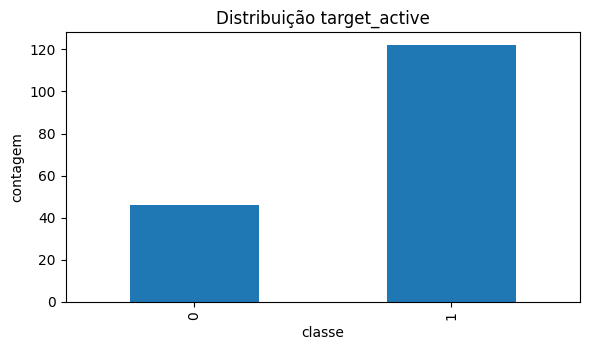

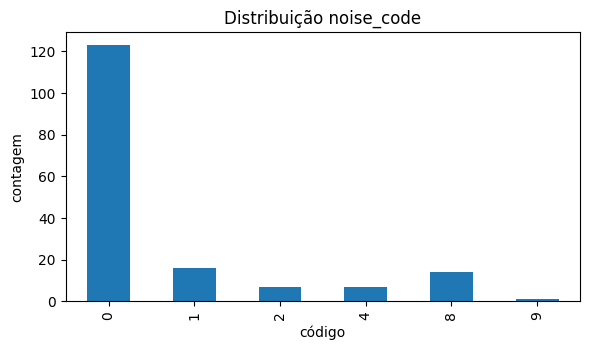

Total gravações: 168
Duração total (h): 4.974444444444444


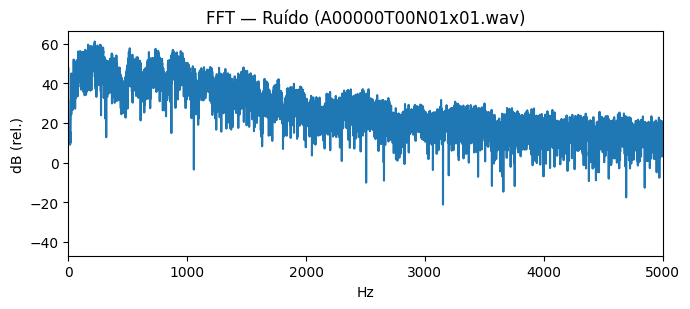

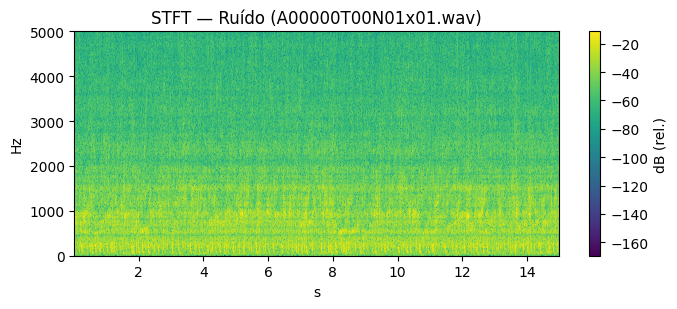

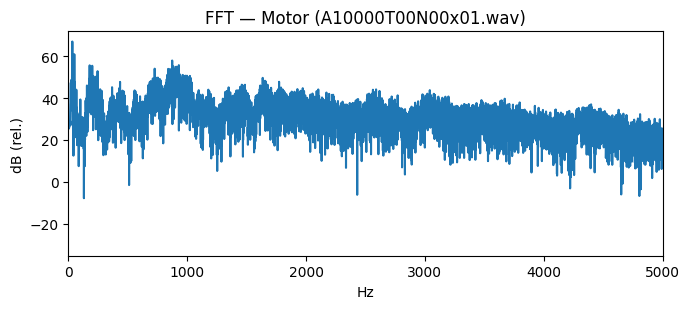

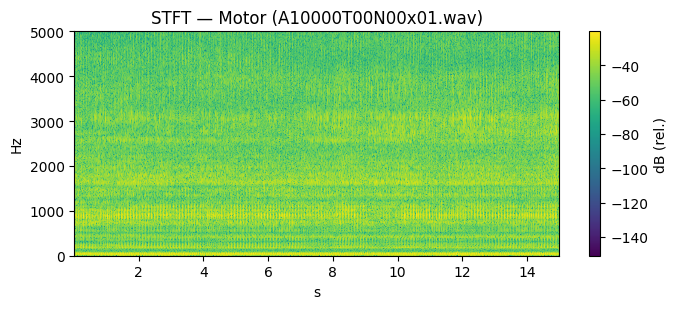

In [ ]:
def barplot(series, title, xlabel):
    counts = series.value_counts(dropna=False).sort_index()
    plt.figure(figsize=(6,3.6))
    counts.plot(kind="bar")
    plt.title(title); plt.xlabel(xlabel); plt.ylabel("contagem")
    plt.tight_layout(); plt.show()

df["target_active"] = (df["intensity_code"].fillna(0).astype(int) > 0).astype(int)
df["noise_any"]     = (df["noise_code"].fillna(0).astype(int) > 0).astype(int)

barplot(df["target_active"], "Distribuição target_active", "classe")
barplot(df["noise_code"], "Distribuição noise_code", "código")

print("Total gravações:", len(df))
print("Duração total (h):", float(df["duration_s"].sum())/3600 if "duration_s" in df else "N/A")

# Visualização: FFT e STFT de 2 exemplos (ruído e motor)
def load_wav_mono(path: Path, target_sr=44100):
    y, sr = sf.read(str(path), always_2d=False)
    if y.ndim>1: y = y.mean(axis=1)
    y = y.astype(np.float32)
    if sr != target_sr:
        y = librosa.resample(y, orig_sr=sr, target_sr=target_sr)
        sr = target_sr
    return y, sr

def plot_fft(y, sr, title, nfft=65536):
    Y = np.fft.rfft(y[:nfft]); f = np.fft.rfftfreq(nfft, 1/sr)
    mag = 20*np.log10(np.maximum(np.abs(Y), 1e-12))
    plt.figure(figsize=(7,3.2)); plt.plot(f, mag)
    plt.xlim(0, min(5000, sr/2)); plt.xlabel("Hz"); plt.ylabel("dB (rel.)")
    plt.title(f"FFT — {title}"); plt.tight_layout(); plt.show()

def plot_spectrogram(y, sr, title, nperseg=2048, noverlap=1536):
    f, t, Z = stft(y, fs=sr, window=get_window("hann", nperseg),
                   nperseg=nperseg, noverlap=noverlap, boundary=None)
    S = 20*np.log10(np.maximum(np.abs(Z), 1e-12))
    plt.figure(figsize=(7,3.2))
    plt.pcolormesh(t, f, S, shading="auto"); plt.ylim(0, min(5000, sr/2))
    plt.xlabel("s"); plt.ylabel("Hz"); plt.title(f"STFT — {title}")
    plt.colorbar(label="dB (rel.)"); plt.tight_layout(); plt.show()

has_path = df.dropna(subset=["wav_path"]).copy()
ex_noise = has_path.query("target_active==0 and noise_any==1").head(1)
ex_motor = has_path.query("target_active==1 and noise_any==0").head(1)

for label, sub in [("Ruído", ex_noise), ("Motor", ex_motor)]:
    if len(sub):
        p = Path(sub.iloc[0]["wav_path"])
        y, sr = load_wav_mono(p); y = y[:sr*15]
        plot_fft(y, sr, f"{label} ({p.name})")
        plot_spectrogram(y, sr, f"{label} ({p.name})")


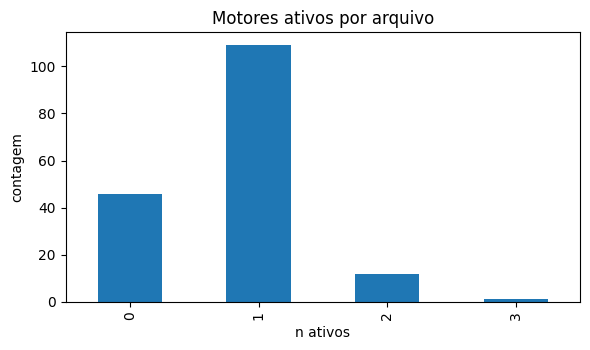

In [ ]:
map_comb = {0:"absent",1:"idle_disengaged",2:"idle_eng_fwd",3:"slow_fwd",4:"medium_fwd",5:"varying"}
map_elec = {0:"absent",1:"slow_fwd",2:"fast_fwd",3:"slow_rev",4:"fast_rev"}

def decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb if i<=4 else map_elec).get(d, f"unknown_{d}")
    return out

dec = df["intensity_code"].apply(decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw", np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))
barplot(df["active_count"], "Motores ativos por arquivo", "n ativos")


In [ ]:
def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)
print("Distribuição (M1..M5):")
print(df_one["which_motor"].value_counts())


Distribuição (M1..M5):
which_motor
M1    52
M3    16
M2    15
M4    14
M5    12
Name: count, dtype: int64


In [ ]:
class MelSeqDataset(Dataset):
    def __init__(self, df, target_col, sr=44100, duration=5.0,
                 n_mels=64, n_fft=2048, hop_length=512,
                 fmin=20, fmax=8000, augment=False):
        self.df = df.reset_index(drop=True).copy()
        self.target_col = target_col
        self.sr = sr
        self.samples = int(sr*duration)
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.fmin = fmin; self.fmax = fmax
        self.augment = augment

    def __len__(self): return len(self.df)

    def _load_center(self, path):
        y, sr = sf.read(str(path), always_2d=False)
        if y.ndim>1: y = y.mean(axis=1)
        y = y.astype(np.float32)
        if sr != self.sr:
            y = librosa.resample(y, orig_sr=sr, target_sr=self.sr)
            sr = self.sr
        if len(y) < self.samples:
            reps = math.ceil(self.samples/len(y))
            y = np.tile(y, reps)[:self.samples]
        elif len(y) > self.samples:
            start = (len(y)-self.samples)//2
            y = y[start:start+self.samples]
        return y, sr

    def _augment(self, y):
        if np.random.rand()<0.5:
            y *= 10**(np.random.uniform(-3,3)/20)
        if np.random.rand()<0.5:
            y = y + np.random.normal(0, np.std(y)*np.random.uniform(0.0,0.01),
                                     size=y.shape).astype(np.float32)
        return y

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        y, sr = self._load_center(row["wav_path"])
        if self.augment: y = self._augment(y)

        S = librosa.feature.melspectrogram(
            y=y, sr=sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd

        x_seq = torch.from_numpy(S_db.T.copy())   # [T, n_mels]
        y_lbl = int(row[self.target_col])
        return x_seq, torch.tensor(y_lbl, dtype=torch.long), row["file_name"]


In [ ]:
class BiLSTMClassifier(nn.Module):
    def __init__(self, n_mels=64, hidden=128, num_layers=2, n_classes=5, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(n_mels, hidden, num_layers=num_layers,
                            batch_first=True, bidirectional=True, dropout=dropout)
        self.head = nn.Sequential(
            nn.Linear(2*hidden, 2*hidden), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(2*hidden, n_classes)
        )
    def forward(self, x):
        z,_ = self.lstm(x)    # [B,T,2H]
        z = z.mean(dim=1)     # média temporal
        return self.head(z)

class MeanAttention(nn.Module):
    def __init__(self, d): super().__init__(); self.w = nn.Linear(d,1)
    def forward(self, z):   # z:[B,T,D]
        a = torch.softmax(self.w(z).squeeze(-1), dim=1)
        return (z * a.unsqueeze(-1)).sum(dim=1)

class BiLSTMWithAttention(nn.Module):
    def __init__(self, n_mels=64, hidden=128, num_layers=2, n_classes=5, dropout=0.2):
        super().__init__()
        self.lstm = nn.LSTM(n_mels, hidden, num_layers=num_layers,
                            batch_first=True, bidirectional=True, dropout=dropout)
        self.attn = MeanAttention(2*hidden)
        self.head = nn.Sequential(
            nn.Linear(2*hidden, 2*hidden), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(2*hidden, n_classes)
        )
    def forward(self, x):
        z,_ = self.lstm(x)
        z = self.attn(z)
        return self.head(z)


In [ ]:
# rótulos
motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
dfA = df_one.reset_index(drop=True).copy()
dfA["which_idx"] = dfA["which_motor"].map(motor2idx).astype(int)

# split estratificado com índice resetado (evita KeyError)
pos_idx = np.arange(len(dfA))
tr_pos, te_pos = train_test_split(pos_idx, test_size=0.2, random_state=SEED, stratify=dfA["which_idx"])
dfA["split"] = "train"; dfA.loc[te_pos, "split"] = "test"

# loaders
ds_kwargs = dict(sr=44100, duration=5.0, n_mels=64, n_fft=2048, hop_length=512, fmin=20, fmax=8000)
ds_tr = MelSeqDataset(dfA[dfA["split"]=="train"], target_col="which_idx", augment=True,  **ds_kwargs)
ds_te = MelSeqDataset(dfA[dfA["split"]=="test"],  target_col="which_idx", augment=False, **ds_kwargs)
dl_tr = DataLoader(ds_tr, batch_size=32, shuffle=True,  num_workers=2)
dl_te = DataLoader(ds_te, batch_size=32, shuffle=False, num_workers=2)

# modelo + treino
n_classes = 5
modelA = BiLSTMWithAttention(n_mels=64, hidden=128, num_layers=2, n_classes=n_classes, dropout=0.2).to(device)
crit = nn.CrossEntropyLoss()
opt  = torch.optim.Adam(modelA.parameters(), lr=2e-3)
sch  = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

def run_epoch(model, dl, train=True):
    model.train(train)
    losses, y_true, y_pred = [], [], []
    for xb, yb, _ in dl:
        xb, yb = xb.to(device), yb.to(device)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = crit(logits, yb)
            if train:
                opt.zero_grad(); loss.backward(); opt.step()
        losses.append(loss.item())
        y_true.extend(yb.cpu().numpy().tolist())
        y_pred.extend(torch.argmax(logits, dim=1).cpu().numpy().tolist())
    return np.mean(losses), accuracy_score(y_true,y_pred), f1_score(y_true,y_pred,average="macro")

best = {"f1":-1, "state":None}
EPOCHS = 10
for ep in range(1, EPOCHS+1):
    tr_loss, tr_acc, tr_f1 = run_epoch(modelA, dl_tr, True)
    te_loss, te_acc, te_f1 = run_epoch(modelA, dl_te, False)
    sch.step(te_loss)
    print(f"[A {ep:02d}] tr_loss={tr_loss:.4f} acc={tr_acc:.3f} f1m={tr_f1:.3f} | "
          f"te_loss={te_loss:.4f} acc={te_acc:.3f} f1m={te_f1:.3f}")
    if te_f1 > best["f1"]:
        best = {"f1":te_f1, "state":modelA.state_dict()}

if best["state"] is not None:
    modelA.load_state_dict(best["state"])
    torch.save(best, ROOT_DIR/"lstm_which_motor_best.pt")
    print("Melhor macro-F1 (A):", best["f1"])


[A 01] tr_loss=1.4772 acc=0.460 f1m=0.191 | te_loss=1.2385 acc=0.545 f1m=0.271
[A 02] tr_loss=1.2269 acc=0.552 f1m=0.322 | te_loss=1.0985 acc=0.545 f1m=0.371
[A 03] tr_loss=0.9894 acc=0.644 f1m=0.458 | te_loss=0.8819 acc=0.682 f1m=0.441
[A 04] tr_loss=0.7888 acc=0.678 f1m=0.470 | te_loss=0.7451 acc=0.727 f1m=0.557
[A 05] tr_loss=0.6414 acc=0.793 f1m=0.722 | te_loss=0.5836 acc=0.864 f1m=0.783
[A 06] tr_loss=0.4719 acc=0.839 f1m=0.805 | te_loss=0.4164 acc=0.773 f1m=0.656
[A 07] tr_loss=0.3551 acc=0.885 f1m=0.850 | te_loss=0.3481 acc=0.955 f1m=0.931
[A 08] tr_loss=0.2292 acc=0.943 f1m=0.941 | te_loss=0.2225 acc=0.955 f1m=0.931
[A 09] tr_loss=0.2876 acc=0.908 f1m=0.909 | te_loss=0.8284 acc=0.773 f1m=0.765
[A 10] tr_loss=0.2745 acc=0.920 f1m=0.919 | te_loss=0.4576 acc=0.818 f1m=0.733
Melhor macro-F1 (A): 0.9314285714285713


              precision    recall  f1-score   support

          M1       0.85      1.00      0.92        11
          M2       1.00      0.33      0.50         3
          M3       0.60      1.00      0.75         3
          M4       1.00      0.33      0.50         3
          M5       1.00      1.00      1.00         2

    accuracy                           0.82        22
   macro avg       0.89      0.73      0.73        22
weighted avg       0.87      0.82      0.79        22

Matriz de confusão:
 [[11  0  0  0  0]
 [ 1  1  1  0  0]
 [ 0  0  3  0  0]
 [ 1  0  1  1  0]
 [ 0  0  0  0  2]]


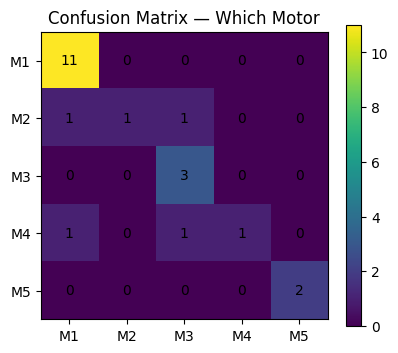

In [ ]:
modelA.eval()
y_true, y_pred = [], []
with torch.no_grad():
    for xb, yb, _ in dl_te:
        xb = xb.to(device)
        logits = modelA(xb)
        y_true.extend(yb.numpy().tolist())
        y_pred.extend(torch.argmax(logits, dim=1).cpu().numpy().tolist())

class_names = ["M1","M2","M3","M4","M5"]
print(classification_report(y_true, y_pred, target_names=class_names))
cm = confusion_matrix(y_true, y_pred)
print("Matriz de confusão:\n", cm)

plt.figure(figsize=(4.2,3.6))
plt.imshow(cm, interpolation="nearest")
plt.title("Confusion Matrix — Which Motor")
plt.xticks(range(len(class_names)), class_names)
plt.yticks(range(len(class_names)), class_names)
plt.colorbar()
for i in range(len(class_names)):
    for j in range(len(class_names)):
        plt.text(j,i,cm[i,j],ha="center",va="center")
plt.tight_layout(); plt.show()


In [ ]:
k = 1  # 1..4 (combustão) → estados 1..5; 5 (elétrico) → 1..4
condB = (df["active_count"]==1) & (df[f"motor{k}_raw"]>0) & df["wav_path"].notna()
dfB = df[condB].reset_index(drop=True).copy()
dfB["state_cls"] = dfB[f"motor{k}_raw"].astype(int)
print("Distribuição estados M{k}:", dfB["state_cls"].value_counts().sort_index())

# Reindexa para 0..C-1
unique_states = sorted(dfB["state_cls"].unique())
state2idx = {st:i for i,st in enumerate(unique_states)}
dfB["state_idx"] = dfB["state_cls"].map(state2idx).astype(int)
class_names_B = [f"state_{st}" for st in unique_states]

# split por estado (índice resetado -> evita KeyError)
pos_idx = np.arange(len(dfB))
tr_pos, te_pos = train_test_split(pos_idx, test_size=0.2, random_state=SEED, stratify=dfB["state_idx"])
dfB["split"] = "train"; dfB.loc[te_pos,"split"]="test"

# loaders
ds_kwargs = dict(sr=44100, duration=5.0, n_mels=64, n_fft=2048, hop_length=512, fmin=20, fmax=8000)
ds_trB = MelSeqDataset(dfB[dfB["split"]=="train"], target_col="state_idx", augment=True,  **ds_kwargs)
ds_teB = MelSeqDataset(dfB[dfB["split"]=="test"],  target_col="state_idx", augment=False, **ds_kwargs)
dl_trB = DataLoader(ds_trB, batch_size=32, shuffle=True,  num_workers=2)
dl_teB = DataLoader(ds_teB, batch_size=32, shuffle=False, num_workers=2)

# modelo + treino
n_classes_B = len(unique_states)
modelB = BiLSTMWithAttention(n_mels=64, hidden=128, num_layers=2, n_classes=n_classes_B, dropout=0.2).to(device)
critB = nn.CrossEntropyLoss()
optB  = torch.optim.Adam(modelB.parameters(), lr=2e-3)
schB  = torch.optim.lr_scheduler.ReduceLROnPlateau(optB, factor=0.5, patience=2)

def run_epoch_B(model, dl, train=True):
    model.train(train)
    losses, y_true, y_pred = [], [], []
    for xb, yb, _ in dl:
        xb, yb = xb.to(device), yb.to(device)
        with torch.set_grad_enabled(train):
            logits = model(xb)
            loss = critB(logits, yb)
            if train:
                optB.zero_grad(); loss.backward(); optB.step()
        losses.append(loss.item())
        y_true.extend(yb.cpu().numpy().tolist())
        y_pred.extend(torch.argmax(logits, dim=1).cpu().numpy().tolist())
    return np.mean(losses), accuracy_score(y_true,y_pred), f1_score(y_true,y_pred,average="macro")

bestB = {"f1":-1, "state":None}
EPOCHS = 10
for ep in range(1, EPOCHS+1):
    tr_loss, tr_acc, tr_f1 = run_epoch_B(modelB, dl_trB, True)
    te_loss, te_acc, te_f1 = run_epoch_B(modelB, dl_teB, False)
    schB.step(te_loss)
    print(f"[B {ep:02d}] tr_loss={tr_loss:.4f} acc={tr_acc:.3f} f1m={tr_f1:.3f} | "
          f"te_loss={te_loss:.4f} acc={te_acc:.3f} f1m={te_f1:.3f}")
    if te_f1 > bestB["f1"]:
        bestB = {"f1":te_f1, "state":modelB.state_dict()}

if bestB["state"] is not None:
    modelB.load_state_dict(bestB["state"])
    torch.save(bestB, ROOT_DIR/f"lstm_M{k}_state_best.pt")
    print("Melhor macro-F1 (B):", bestB["f1"])


Distribuição estados M{k}: state_cls
1     5
2    32
3     6
4     7
5     2
Name: count, dtype: int64
[B 01] tr_loss=1.5646 acc=0.244 f1m=0.119 | te_loss=1.3486 acc=0.636 f1m=0.194
[B 02] tr_loss=1.2349 acc=0.610 f1m=0.152 | te_loss=1.1137 acc=0.636 f1m=0.194
[B 03] tr_loss=0.9818 acc=0.610 f1m=0.152 | te_loss=1.0171 acc=0.636 f1m=0.194
[B 04] tr_loss=1.0182 acc=0.634 f1m=0.213 | te_loss=0.8563 acc=0.818 f1m=0.469
[B 05] tr_loss=0.8814 acc=0.732 f1m=0.365 | te_loss=0.7606 acc=0.818 f1m=0.469
[B 06] tr_loss=0.6645 acc=0.756 f1m=0.399 | te_loss=0.7613 acc=0.818 f1m=0.469
[B 07] tr_loss=0.5727 acc=0.756 f1m=0.410 | te_loss=0.8311 acc=0.818 f1m=0.483
[B 08] tr_loss=0.3694 acc=0.780 f1m=0.441 | te_loss=0.9577 acc=0.818 f1m=0.483
[B 09] tr_loss=0.4566 acc=0.780 f1m=0.451 | te_loss=0.9043 acc=0.909 f1m=0.733
[B 10] tr_loss=0.3092 acc=0.878 f1m=0.648 | te_loss=0.9163 acc=0.909 f1m=0.733
Melhor macro-F1 (B): 0.7333333333333334


In [ ]:
modelB.eval()
y_true, y_pred = [], []
with torch.no_grad():
    for xb, yb, _ in dl_teB:
        xb = xb.to(device)
        logits = modelB(xb)
        y_true.extend(yb.numpy().tolist())
        y_pred.extend(torch.argmax(logits, dim=1).cpu().numpy().tolist())

print(classification_report(y_true, y_pred, target_names=class_names_B))
cmB = confusion_matrix(y_true, y_pred)
print("Matriz de confusão (B):\n", cmB)

plt.figure(figsize=(4.2,3.6))
plt.imshow(cmB, interpolation="nearest")
plt.title(f"Confusion Matrix — M{k} states")
plt.xticks(range(len(class_names_B)), class_names_B, rotation=45)
plt.yticks(range(len(class_names_B)), class_names_B)
plt.colorbar()
for i in range(len(class_names_B)):
    for j in range(len(class_names_B)):
        plt.text(j,i,cmB[i,j],ha="center",va="center")
plt.tight_layout(); plt.show()


ValueError: Number of classes, 4, does not match size of target_names, 5. Try specifying the labels parameter

# COMEÇANDO AQUI

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# =========================================
# 1) Imports, paths, seeds
# =========================================
from pathlib import Path
import os, re, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import soundfile as sf
import librosa
from sklearn.metrics import (classification_report, confusion_matrix,
                             accuracy_score, f1_score)
from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm

# Evitar problemas de multiprocessamento no Colab
import torch.multiprocessing as mp
try:
    mp.set_start_method("spawn", force=True)
except RuntimeError:
    pass

USE_TQDM = True

# === Caminhos ===
ROOT_DIR   = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")
AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

print("AUDIO_DIR:", AUDIO_DIR)
print("CSV:", CSV_PATH.exists(), "| XLSX:", XLSX_PATH.exists())

# Seeds e device
SEED = 123
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV: True | XLSX: True
Device: cuda


In [ ]:
# =========================================
# 2) Carregar índice, limpar colunas, resolver .wav
# =========================================
def clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Não encontrei Wolfset_Index.csv nem .xlsx em ARQ/")

df.columns = [clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)

for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Mapear WAVs por nome (case-insensitive)
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
def resolve_wav_path(fname: str): return all_wavs.get(str(fname).lower())
df["wav_path"] = df["file_name"].apply(resolve_wav_path)

print("Total linhas:", len(df), "| WAVs resolvidos:", df["wav_path"].notna().sum())
df.head()


Total linhas: 168 | WAVs resolvidos: 167


,row_id,file_name,length_bytes,duration_s,gain1_dB,gain2_dB,intensity_code,targets_desc,transient_code,transient_note,noise_code,noise_note,observations,wav_path
0,1,A00000T00N01x01.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,1,Air (much),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...
1,2,A00000T00N01x02.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,1,Air (much),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...
2,3,A00000T00N02x01.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,2,Air (little),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...
3,4,A00000T00N02x02.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,2,Air (little),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...
4,5,A00000T00N08x01.wav,5292058,60,40,30,0,Absent (or disconnected),0,-,8,Water (much),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...


In [ ]:
# =========================================
# 3) Decodificar intensity_code → estados dos motores
# =========================================
map_comb_txt = {0:"Ausente/desligado",1:"Marcha lenta (desengatada)",
                2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                4:"Velocidade média (frente média)",5:"Variações de aceleração"}
map_elec_txt = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

def decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"  # M1..M5
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Desconhecido_{d}")
    return out

dec = df["intensity_code"].apply(decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))
df["target_active"] = (df["active_count"]>0).astype(int)

def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

print(df[["file_name","intensity_code","motor1_raw","motor2_raw","motor3_raw","motor4_raw","motor5_raw","active_count"]].head())


             file_name  intensity_code  motor1_raw  motor2_raw  motor3_raw  \
0  A00000T00N01x01.wav               0           0           0           0   
1  A00000T00N01x02.wav               0           0           0           0   
2  A00000T00N02x01.wav               0           0           0           0   
3  A00000T00N02x02.wav               0           0           0           0   
4  A00000T00N08x01.wav               0           0           0           0   

   motor4_raw  motor5_raw  active_count  
0           0           0             0  
1           0           0             0  
2           0           0             0  
3           0           0             0  
4           0           0             0  


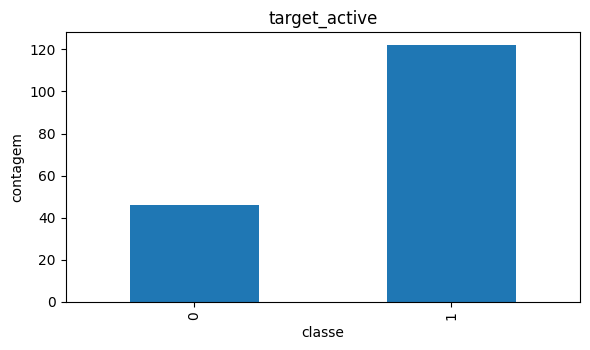

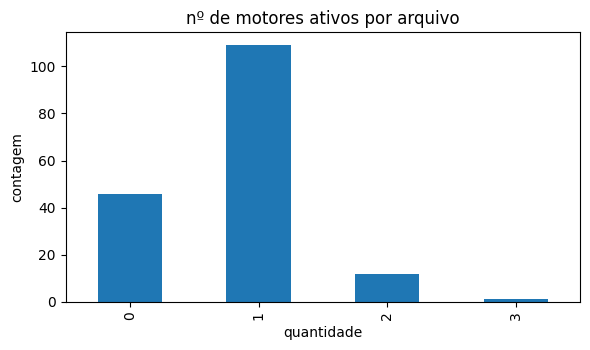

In [ ]:
# =========================================
# 4) EDA rápida (barplots)
# =========================================
def barplot(series, title, xlabel):
    counts = series.value_counts(dropna=False).sort_index()
    plt.figure(figsize=(6,3.6))
    counts.plot(kind="bar")
    plt.title(title); plt.xlabel(xlabel); plt.ylabel("contagem")
    plt.tight_layout(); plt.show()

barplot(df["target_active"], "target_active", "classe")
barplot(df["active_count"], "nº de motores ativos por arquivo", "quantidade")


In [ ]:
# =========================================
# 5) Preparar conjunto com 1 motor ativo + rótulos multitarefa
# =========================================
df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
idx2motor = {i:m for m,i in motor2idx.items()}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(state_code_of_active, axis=1).astype(int)

# Mapas de estado por motor (usando TODO o df_one)
state_meta = {}
for k in range(1,6):
    codes = sorted(df_one.loc[df_one["motor_idx"]==(k-1), "state_code"].unique().tolist())
    if len(codes)==0: codes=[1]  # fallback
    state2idx = {c:i for i,c in enumerate(codes)}
    idx2state = {i:c for c,i in state2idx.items()}
    state_meta[k] = {"codes": codes, "state2idx": state2idx, "idx2state": idx2state}

df_one["state_idx"] = df_one.apply(lambda r: state_meta[int(r["which_motor"][1])]["state2idx"][int(r["state_code"])], axis=1)

print("Arquivos por motor (1 ativo):")
print(df_one["which_motor"].value_counts().sort_index())
print("\nEstados por motor (códigos presentes):")
for k in range(1,6):
    print(f"M{k}:", state_meta[k]["codes"])


Arquivos por motor (1 ativo):
which_motor
M1    52
M2    15
M3    16
M4    14
M5    12
Name: count, dtype: int64

Estados por motor (códigos presentes):
M1: [1, 2, 3, 4, 5]
M2: [1, 2, 3, 4, 5]
M3: [1, 2, 3, 4, 5]
M4: [1, 2, 3, 4]
M5: [1, 2, 3, 4]


In [ ]:
# =========================================
# 6) Dataset de janelas curtas multitarefa (log-mel) — retorna file_name
# =========================================
class WindowedMelDatasetMT(Dataset):
    def __init__(self, df, sr=44100, seg_dur=2.0, seg_hop=1.0,
                 n_mels=64, n_fft=1024, hop_length=256,
                 fmin=20, fmax=8000, augment=False,
                 max_segments_per_file=None):
        self.df = df.reset_index(drop=True).copy()
        self.sr = sr
        self.seg_samples = int(sr*seg_dur)
        self.hop_samples = int(sr*seg_hop)
        assert self.hop_samples > 0
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.fmin = fmin; self.fmax = fmax
        self.augment = augment
        self.max_segments_per_file = max_segments_per_file

        self.index = []
        it = range(len(self.df))
        if USE_TQDM: it = tqdm(it, desc="Indexando janelas (MT)", leave=False)
        for i in it:
            path = self.df.loc[i, "wav_path"]
            dur_s = float(self.df.loc[i, "duration_s"]) if "duration_s" in self.df.columns and not pd.isna(self.df.loc[i, "duration_s"]) else None
            if dur_s is None:
                try:
                    f = sf.SoundFile(str(path)); dur_s = len(f)/f.samplerate
                except:
                    dur_s = 60.0
            total_samples = int(self.sr * dur_s)
            if total_samples < self.seg_samples:
                starts = [0]
            else:
                nseg = 1 + (total_samples - self.seg_samples) // self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file is not None and len(starts) > self.max_segments_per_file:
                rng = np.random.RandomState(SEED + i)
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts:
                self.index.append((i, s))

        if len(self.index)==0:
            raise RuntimeError("Nenhum segmento criado — verifique caminhos/param.")

    def __len__(self): return len(self.index)

    def _load_seg(self, path, start):
        y, srr = sf.read(str(path), always_2d=False)
        if y.ndim>1: y = y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else:
                take = min(self.seg_samples, len(y))
                seg[:take] = y[-take:]
        return seg

    def _augment(self, y):
        if np.random.rand()<0.5:
            y *= 10**(np.random.uniform(-3,3)/20)
        if np.random.rand()<0.5:
            y = y + np.random.normal(0, np.std(y)*np.random.uniform(0.0,0.01), size=y.shape).astype(np.float32)
        return y

    def __getitem__(self, idx):
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        seg = self._load_seg(row["wav_path"], start)
        if self.augment: seg = self._augment(seg)

        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd
        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]

        motor_idx = int(row["motor_idx"])       # 0..4 (M1..M5)
        state_idx = int(row["state_idx"])       # indexado para cabeça do motor
        motor_k   = int(row["which_motor"][1])  # 1..5
        file_name = str(row["file_name"]) if "file_name" in row else str(Path(row["wav_path"]).name)

        return x_seq, torch.tensor(motor_idx), torch.tensor(state_idx), torch.tensor(motor_k), file_name


In [ ]:
# =========================================
# 7) Split seguro por arquivo (tolerante a classes raras)
# =========================================
def safe_split_by_class(y, test_size=0.2, random_state=123):
    rng = np.random.RandomState(random_state)
    y = np.asarray(y, dtype=int)
    classes = np.unique(y)
    test_idx, train_idx = [], []
    for c in classes:
        idx_c = np.where(y == c)[0]
        n = len(idx_c)
        if n <= 1:
            train_idx.extend(idx_c.tolist())
        else:
            n_te = max(1, int(round(test_size*n)))
            n_te = min(n_te, n-1)
            sel = rng.choice(idx_c, size=n_te, replace=False)
            test_idx.extend(sel.tolist())
            train_idx.extend(list(set(idx_c.tolist()) - set(sel.tolist())))
    rng.shuffle(train_idx); rng.shuffle(test_idx)
    return np.array(train_idx), np.array(test_idx)


In [ ]:
# =========================================
# 8) Modelo multitarefa (BiLSTM + atenção) com PADDING na cabeça de estado
# =========================================
class MeanAttention(nn.Module):
    def __init__(self, d): super().__init__(); self.w = nn.Linear(d,1)
    def forward(self, z):
        a = torch.softmax(self.w(z).squeeze(-1), dim=1)
        return (z * a.unsqueeze(-1)).sum(dim=1)

class MultiTaskMotorState(nn.Module):
    def __init__(self, n_mels=64, hidden=128, num_layers=2, dropout=0.2, state_meta=None):
        super().__init__()
        self.state_meta = state_meta
        self.lstm = nn.LSTM(n_mels, hidden, num_layers=num_layers, batch_first=True,
                            bidirectional=True, dropout=dropout)
        self.attn = MeanAttention(2*hidden)
        self.dropout = nn.Dropout(dropout)
        self.motor_head = nn.Linear(2*hidden, 5)
        self.state_heads = nn.ModuleDict()
        for k in range(1,6):
            n_out = len(state_meta[k]["codes"])
            self.state_heads[str(k)] = nn.Linear(2*hidden, n_out)

    def forward(self, x, motor_k=None):
        """
        x: [B,T,n_mels]
        motor_k:
          - None -> retorna apenas logits_motor
          - tensor [B] com valores 1..5 -> retorna (logits_motor, logits_state_padded)
            onde logits_state_padded tem largura = Cmax no batch (padding com -1e9).
        """
        z,_ = self.lstm(x)
        z = self.attn(z)
        z = self.dropout(z)
        logits_motor = self.motor_head(z)

        if motor_k is None:
            return logits_motor

        B = x.size(0)
        ck_list = [len(self.state_meta[int(mk.item())]["codes"]) for mk in motor_k]
        Cmax = max(ck_list)
        logits_state = x.new_full((B, Cmax), fill_value=-1e9)  # padding

        for i in range(B):
            k = str(int(motor_k[i].item()))
            out_i = self.state_heads[k](z[i:i+1])  # [1,Ck]
            Ck = out_i.size(1)
            logits_state[i, :Ck] = out_i.squeeze(0)

        return logits_motor, logits_state


In [ ]:
# =========================================
# 9) Pesos de classe (robustos a classes ausentes no treino)
# =========================================
def make_class_weights_motor(dl):
    ys = []
    for _, y_m, _, _, _ in dl: ys.append(y_m)
    if not ys: return None
    y = torch.cat(ys).cpu().numpy()
    classes = np.unique(y)  # só presentes
    w = compute_class_weight(class_weight="balanced", classes=classes, y=y)
    full = np.ones(5, dtype=np.float32)
    for c,wc in zip(classes, w):
        full[int(c)] = wc
    return torch.tensor(full, dtype=torch.float32)

def make_class_weights_states_per_motor(dl, state_meta):
    buckets = {k: [] for k in range(1,6)}
    for _, y_m, y_s, k, _ in dl:
        k_np = k.numpy(); y_s_np = y_s.numpy()
        for ki in range(1,6):
            mask = (k_np == ki)
            if mask.any():
                buckets[ki].extend(y_s_np[mask].tolist())
    weights = {}
    for k in range(1,6):
        arr = np.asarray(buckets[k], dtype=int)
        if arr.size == 0:
            weights[k] = None
            continue
        classes = np.unique(arr)
        w = compute_class_weight(class_weight="balanced", classes=classes, y=arr)
        Ck = len(state_meta[k]["codes"])
        full = np.ones(Ck, dtype=np.float32)
        for c,wc in zip(classes, w):
            full[int(c)] = wc
        weights[k] = torch.tensor(full, dtype=torch.float32)
    return weights


In [ ]:
# =========================================
# 10) Treino multitarefa (com tqdm, num_workers=0, padding de estado)
# =========================================
def train_multitask(df_labels, state_meta,
                    # features
                    sr=44100, seg_dur=2.0, seg_hop=1.0,
                    n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000,
                    # treino
                    batch_size=128, epochs=14, lr=2e-3, hidden=128, layers=2,
                    alpha_motor=1.0, alpha_state=1.0,
                    max_segments_per_file=40,
                    save_path=None, seed=123):

    # split por ARQUIVO usando motor_idx
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"] = "train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    # datasets/loaders
    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    # Colab-safe: num_workers=0 e persistent_workers=False
    NUM_WORKERS = 0
    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    model = MultiTaskMotorState(n_mels=n_mels, hidden=hidden, num_layers=layers,
                                dropout=0.2, state_meta=state_meta).to(device)

    # pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))

    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)

        for xb, y_m, y_s, k, _fn in iterator:  # _fn = file_name (não usado aqui)
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                logits_motor, logits_state_pad = model(xb, motor_k=k)

                # perda motor
                loss_motor = crit_motor(logits_motor, y_m)

                # perda estado: cortar para Ck por motor
                loss_state = 0.0
                for ki in range(1,6):
                    mask = (k == ki)
                    if mask.any():
                        Ck = len(state_meta[ki]["codes"])
                        logits_k = logits_state_pad[mask, :Ck]
                        y_s_k   = y_s[mask]
                        w_k = w_states.get(ki, None)
                        crit_k = nn.CrossEntropyLoss(weight=(w_k.to(device) if w_k is not None else None))
                        loss_state = loss_state + crit_k(logits_k, y_s_k)

                loss = alpha_motor*loss_motor + alpha_state*loss_state
                if train:
                    opt.zero_grad(); loss.backward(); opt.step()

            losses.append(loss.item())
            # métricas
            yM_true.extend(y_m.cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).cpu().numpy().tolist())
            yS_true_all.extend(y_s.cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro",
                        labels=list(np.unique(yM_true)) if yM_true else None, zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    best = {"score": -1, "state": None}
    ep_iter = range(1, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc="Épocas (MT)")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        sch.step(te_loss)
        msg = (f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
               f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
               f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
               f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})")
        if USE_TQDM: tqdm.write(msg)
        else: print(msg)
        score = (te_f1M + te_f1S)/2.0
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}

    if best["state"] is not None:
        model.load_state_dict(best["state"])
        if save_path:
            torch.save(best, save_path)
            print(f"[MT] Melhor score (avg F1 M+S): {best['score']:.3f} | salvo em: {save_path}")

    # Relatórios finais (segmentos)
    yM_true, yM_pred = [], []
    with torch.no_grad():
        iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval motor (seg)", leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, k = xb.to(device), k.to(device)
            lm, _ = model(xb, motor_k=k)
            yM_true.extend(y_m.cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())

    print("\n=== Relatório (MOTOR, segmentos) ===")
    motor_labels_present = sorted(np.unique(yM_true))
    motor_names_present  = [ ["M1","M2","M3","M4","M5"][i] for i in motor_labels_present ]
    print(classification_report(yM_true, yM_pred, labels=motor_labels_present,
                                target_names=motor_names_present, zero_division=0))
    print("Matriz de confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=motor_labels_present))

    yS_true, yS_pred = [], []
    with torch.no_grad():
        iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval estado (seg)", leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, k = xb.to(device), k.to(device)
            _, ls_pad = model(xb, motor_k=k)
            yS_true.extend(y_s.cpu().numpy().tolist())
            yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())

    print("\n=== Relatório (ESTADO, segmentos; cabeça por motor verdadeiro) ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))

    return model, (dl_tr, dl_te), df_labels


In [ ]:
# =========================================
# 11) Hiperparâmetros das janelas e TREINAR
# =========================================
SEG_DUR = 2.0   # janela (s) — pode usar 1.5
SEG_HOP = 1.0   # passo (s)  — pode usar 0.75
N_MELS  = 64
N_FFT   = 1024
HOP     = 256

model_mt, loaders_mt, dfMT = train_multitask(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=128, epochs=14, lr=2e-3, hidden=128, layers=2,
    alpha_motor=1.0, alpha_state=1.0,   # aumente alpha_state para focar no estado
    max_segments_per_file=40,
    save_path=ROOT_DIR/"model_multitask_motor_state.pt",
    seed=123
)


Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas (MT):   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas (MT):   0%|          | 0/21 [00:00<?, ?it/s]

Épocas (MT):   0%|          | 0/14 [00:00<?, ?it/s]

train ep01:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/7 [00:00<?, ?it/s]

[01] loss_tr=5.4242 M(tr acc=0.572 f1=0.592) S(tr acc=0.690 f1=0.590) | loss_te=3.0272 M(te acc=0.812 f1=0.768) S(te acc=0.513 f1=0.387)


train ep02:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/7 [00:00<?, ?it/s]

[02] loss_tr=2.1260 M(tr acc=0.833 f1=0.823) S(tr acc=0.885 f1=0.851) | loss_te=2.9800 M(te acc=0.899 f1=0.883) S(te acc=0.611 f1=0.429)


train ep03:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/7 [00:00<?, ?it/s]

[03] loss_tr=1.3099 M(tr acc=0.888 f1=0.886) S(tr acc=0.930 f1=0.910) | loss_te=2.6390 M(te acc=0.906 f1=0.893) S(te acc=0.686 f1=0.548)


train ep04:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/7 [00:00<?, ?it/s]

[04] loss_tr=1.1449 M(tr acc=0.899 f1=0.897) S(tr acc=0.941 f1=0.925) | loss_te=2.8562 M(te acc=0.919 f1=0.907) S(te acc=0.627 f1=0.426)


train ep05:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/7 [00:00<?, ?it/s]

[05] loss_tr=0.9931 M(tr acc=0.916 f1=0.911) S(tr acc=0.951 f1=0.938) | loss_te=4.0257 M(te acc=0.901 f1=0.886) S(te acc=0.610 f1=0.444)


train ep06:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/7 [00:00<?, ?it/s]

[06] loss_tr=0.7496 M(tr acc=0.933 f1=0.930) S(tr acc=0.955 f1=0.939) | loss_te=3.1209 M(te acc=0.913 f1=0.899) S(te acc=0.669 f1=0.537)


train ep07:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/7 [00:00<?, ?it/s]

[07] loss_tr=0.3966 M(tr acc=0.960 f1=0.957) S(tr acc=0.977 f1=0.970) | loss_te=3.9671 M(te acc=0.920 f1=0.912) S(te acc=0.640 f1=0.431)


train ep08:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/7 [00:00<?, ?it/s]

[08] loss_tr=0.3809 M(tr acc=0.963 f1=0.960) S(tr acc=0.984 f1=0.982) | loss_te=3.1223 M(te acc=0.920 f1=0.907) S(te acc=0.682 f1=0.543)


train ep09:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/7 [00:00<?, ?it/s]

[09] loss_tr=0.2886 M(tr acc=0.966 f1=0.965) S(tr acc=0.989 f1=0.988) | loss_te=4.0043 M(te acc=0.919 f1=0.908) S(te acc=0.680 f1=0.497)


train ep10:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/7 [00:00<?, ?it/s]

[10] loss_tr=0.1916 M(tr acc=0.982 f1=0.982) S(tr acc=0.990 f1=0.989) | loss_te=4.2912 M(te acc=0.911 f1=0.899) S(te acc=0.669 f1=0.476)


train ep11:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/7 [00:00<?, ?it/s]

[11] loss_tr=0.1645 M(tr acc=0.974 f1=0.974) S(tr acc=0.994 f1=0.993) | loss_te=3.6702 M(te acc=0.911 f1=0.890) S(te acc=0.681 f1=0.529)


train ep12:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/7 [00:00<?, ?it/s]

[12] loss_tr=0.1807 M(tr acc=0.978 f1=0.978) S(tr acc=0.991 f1=0.991) | loss_te=4.4580 M(te acc=0.893 f1=0.876) S(te acc=0.656 f1=0.461)


train ep13:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/7 [00:00<?, ?it/s]

[13] loss_tr=0.1217 M(tr acc=0.986 f1=0.986) S(tr acc=0.995 f1=0.995) | loss_te=4.3574 M(te acc=0.905 f1=0.892) S(te acc=0.655 f1=0.457)


train ep14:   0%|          | 0/28 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/7 [00:00<?, ?it/s]

[14] loss_tr=0.0988 M(tr acc=0.987 f1=0.987) S(tr acc=0.996 f1=0.996) | loss_te=4.2289 M(te acc=0.914 f1=0.905) S(te acc=0.667 f1=0.491)
[MT] Melhor score (avg F1 M+S): 0.725 | salvo em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_multitask_motor_state.pt


aval motor (seg):   0%|          | 0/7 [00:00<?, ?it/s]


=== Relatório (MOTOR, segmentos) ===
              precision    recall  f1-score   support

          M1       0.88      0.98      0.93       400
          M2       0.87      0.79      0.83       120
          M3       1.00      0.68      0.81       120
          M4       0.98      0.99      0.99       120
          M5       0.95      0.99      0.97        80

    accuracy                           0.91       840
   macro avg       0.94      0.89      0.90       840
weighted avg       0.92      0.91      0.91       840

Matriz de confusão (motor):
 [[394   2   0   1   3]
 [ 23  95   0   1   1]
 [ 27  12  81   0   0]
 [  1   0   0 119   0]
 [  1   0   0   0  79]]


aval estado (seg):   0%|          | 0/7 [00:00<?, ?it/s]


=== Relatório (ESTADO, segmentos; cabeça por motor verdadeiro) ===
              precision    recall  f1-score   support

           0       0.75      0.30      0.43       120
           1       0.70      0.99      0.82       400
           2       0.91      0.34      0.50       120
           3       0.52      0.50      0.51       160
           4       0.22      0.17      0.19        40

    accuracy                           0.67       840
   macro avg       0.62      0.46      0.49       840
weighted avg       0.68      0.67      0.63       840



In [ ]:
# =========================================
# 12) Avaliação por ARQUIVO (agregação por segmentos)
# =========================================
from collections import defaultdict

def eval_file_level(model, dl_te, state_meta):
    model.eval()
    motor_logits_by_file = defaultdict(list)
    state_logits_by_file = defaultdict(list)
    true_motor_by_file   = {}
    true_state_by_file   = {}

    with torch.no_grad():
        for xb, y_m, y_s, k, fns in tqdm(dl_te, desc="agregando por arquivo", leave=False):
            xb = xb.to(device); k = k.to(device)
            # Motor
            lm = model(xb)  # motor_k=None => só motor
            # Estado (cabeça do motor verdadeiro) + corte para Ck por amostra
            _, ls_pad = model(xb, motor_k=k)
            ls_list = []
            for i in range(xb.size(0)):
                Ck = len(state_meta[int(k[i].item())]["codes"])
                ls_list.append(ls_pad[i:i+1, :Ck].cpu())
            ls = torch.cat(ls_list, dim=0)

            for i, fid in enumerate(fns):
                motor_logits_by_file[fid].append(lm[i].cpu())
                state_logits_by_file[fid].append(ls[i].cpu())
                if fid not in true_motor_by_file:
                    true_motor_by_file[fid] = int(y_m[i].cpu().item())
                if fid not in true_state_by_file:
                    true_state_by_file[fid] = int(y_s[i].cpu().item())

    yM_true, yM_pred = [], []
    yS_true, yS_pred = [], []

    for fid in motor_logits_by_file.keys():
        lm = torch.stack(motor_logits_by_file[fid], dim=0).mean(dim=0)  # [5]
        m_pred = int(torch.argmax(lm).item())
        yM_true.append(true_motor_by_file[fid])
        yM_pred.append(m_pred)

        k_true = yM_true[-1] + 1  # 0..4 -> 1..5
        Ck = len(state_meta[k_true]["codes"])
        ls = torch.stack(state_logits_by_file[fid], dim=0)  # [Nseg, Ck]
        s_pred = int(torch.argmax(ls.mean(dim=0)).item())
        yS_true.append(true_state_by_file[fid])
        yS_pred.append(s_pred)

    print("\n=== File-level: MOTOR ===")
    labsM = sorted(np.unique(yM_true))
    namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
    print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
    print("Confusão (motor, file-level):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))

    print("\n=== File-level: ESTADO (cabeça do motor verdadeiro) ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))

# Rodar avaliação por arquivo
eval_file_level(model_mt, loaders_mt[1], state_meta)


agregando por arquivo:   0%|          | 0/7 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.83      1.00      0.91        10
          M2       1.00      0.67      0.80         3
          M3       1.00      0.67      0.80         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           0.90        21
   macro avg       0.97      0.87      0.90        21
weighted avg       0.92      0.90      0.90        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 1  2  0  0  0]
 [ 1  0  2  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO (cabeça do motor verdadeiro) ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.67      1.00      0.80        10
           2       1.00      0.33      0.50         3
           3       0.67      0.50      0.57         4
           4       0.00      0.00 

In [ ]:
# =========================================
# 13) Inferência por arquivo (prevê motor + estado)
# =========================================
STATE_TEXT_COMB = {0:"Ausente/desligado",
                   1:"Marcha lenta (embreagem desengatada)",
                   2:"Marcha lenta engatada (frente)",
                   3:"Baixa velocidade (frente lenta)",
                   4:"Velocidade média (frente média)",
                   5:"Variações de aceleração"}
STATE_TEXT_ELEC = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

MOTOR_SPECS = {
    "M1": "4,5 HP (combustão)",
    "M2": "18 HP (combustão)",
    "M3": "8 HP (combustão)",
    "M4": "3,6 HP (combustão)",
    "M5": "Elétrico (modelo RC)"
}

def file_to_segments_logmel(wav_path, sr=44100, seg_dur=2.0, seg_hop=1.0,
                            n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000):
    y, srr = sf.read(str(wav_path), always_2d=False)
    if y.ndim>1: y = y.mean(axis=1)
    y = y.astype(np.float32)
    if srr != sr:
        y = librosa.resample(y, orig_sr=srr, target_sr=sr)
    seg_samples = int(sr*seg_dur)
    hop_samples = int(sr*seg_hop)
    if len(y) < seg_samples:
        y = np.pad(y, (0, seg_samples-len(y)))
    starts = list(range(0, max(1, len(y)-seg_samples+1), hop_samples))
    X = []
    it = starts if not USE_TQDM else tqdm(starts, desc="extraindo segmentos (inferência)", leave=False)
    for s in it:
        seg = y[s:s+seg_samples]
        if len(seg) < seg_samples:
            seg = np.pad(seg, (0, seg_samples-len(seg)))
        S = librosa.feature.melspectrogram(
            y=seg, sr=sr, n_fft=n_fft, hop_length=hop,
            n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd
        X.append(torch.from_numpy(S_db.T.copy()))
    if not X: return torch.empty(0,1,n_mels)
    return torch.stack(X, dim=0)

def predict_file_multitask(wav_path):
    X = file_to_segments_logmel(
        wav_path, sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
        n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000
    ).to(device)
    if X.ndim==2: X = X.unsqueeze(0)
    if X.shape[0]==0:
        return {"motor": None, "estado_cod": None, "estado_txt": None, "obs":"sem segmentos"}

    model_mt.eval()
    with torch.no_grad():
        # Motor
        logitsM = []
        it = range(0, X.shape[0], 64)
        if USE_TQDM: it = tqdm(it, desc="inferência motor (MT)", leave=False)
        for i in it:
            lm = model_mt(X[i:i+64])  # motor_k=None => só motor
            logitsM.append(lm)
        logitsM = torch.cat(logitsM, dim=0)
        motor_idx = int(torch.argmax(logitsM.mean(dim=0), dim=0).cpu().item())
        motor_label = ["M1","M2","M3","M4","M5"][motor_idx]
        k = int(motor_label[1])

        # Estado (cabeça do motor previsto) — cortar para Ck
        logitsS = []
        it = range(0, X.shape[0], 64)
        if USE_TQDM: it = tqdm(it, desc=f"inferência estado {motor_label} (MT)", leave=False)
        for i in it:
            _, ls_pad = model_mt(X[i:i+64], motor_k=torch.full((X[i:i+64].size(0),), k, dtype=torch.long, device=device))
            Ck = len(state_meta[k]["codes"])
            logitsS.append(ls_pad[:, :Ck])
        logitsS = torch.cat(logitsS, dim=0)
        state_idx = int(torch.argmax(logitsS.mean(dim=0), dim=0).cpu().item())
        estado_cod = state_meta[k]["idx2state"][state_idx]

    estado_txt = STATE_TEXT_COMB.get(estado_cod, str(estado_cod)) if k<=4 else STATE_TEXT_ELEC.get(estado_cod, str(estado_cod))
    return {"motor": motor_label, "motor_spec": MOTOR_SPECS[motor_label],
            "estado_cod": estado_cod, "estado_txt": estado_txt}


In [ ]:
# =========================================
# 14) Teste rápido de inferência (3 arquivos aleatórios com 1 motor ativo)
# =========================================
import random
cands = df_one["wav_path"].dropna().tolist()
if cands:
    for p in random.sample(cands, k=min(3, len(cands))):
        out = predict_file_multitask(p)
        print(Path(p).name, "->", out)
else:
    print("Sem arquivos com 1 motor ativo.")


extraindo segmentos (inferência):   0%|          | 0/59 [00:00<?, ?it/s]

inferência motor (MT):   0%|          | 0/1 [00:00<?, ?it/s]

inferência estado M1 (MT):   0%|          | 0/1 [00:00<?, ?it/s]

A20000T00N00x02.wav -> {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 2, 'estado_txt': 'Marcha lenta engatada (frente)'}


extraindo segmentos (inferência):   0%|          | 0/59 [00:00<?, ?it/s]

inferência motor (MT):   0%|          | 0/1 [00:00<?, ?it/s]

inferência estado M1 (MT):   0%|          | 0/1 [00:00<?, ?it/s]

A20000T00N04x04.wav -> {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 2, 'estado_txt': 'Marcha lenta engatada (frente)'}


extraindo segmentos (inferência):   0%|          | 0/59 [00:00<?, ?it/s]

inferência motor (MT):   0%|          | 0/1 [00:00<?, ?it/s]

inferência estado M1 (MT):   0%|          | 0/1 [00:00<?, ?it/s]

A30000T00N00x01.wav -> {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 5, 'estado_txt': 'Variações de aceleração'}


# aplicando dataug

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# =========================================
# 1) Imports, paths, seeds
# =========================================
from pathlib import Path
import os, re, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import soundfile as sf
import librosa
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm

# Evitar problemas de multiprocessamento no Colab (Py3.12)
import torch.multiprocessing as mp
try:
    mp.set_start_method("spawn", force=True)
except RuntimeError:
    pass

USE_TQDM = True

# === Caminhos (ajuste se preciso) ===
ROOT_DIR   = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")
AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

print("AUDIO_DIR:", AUDIO_DIR)
print("CSV:", CSV_PATH.exists(), "| XLSX:", XLSX_PATH.exists())

# Seeds e device
SEED = 123
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV: False | XLSX: False
Device: cuda


In [5]:
# =========================================
# 2) Carregar índice, limpar colunas, resolver .wav
# =========================================
def clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Não encontrei Wolfset_Index.csv nem .xlsx em ARQ/")

df.columns = [clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)

for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Mapear WAVs por nome (case-insensitive)
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
def resolve_wav_path(fname: str): return all_wavs.get(str(fname).lower())
df["wav_path"] = df["file_name"].apply(resolve_wav_path)

print("Total linhas:", len(df), "| WAVs resolvidos:", df["wav_path"].notna().sum())
df.head()


Total linhas: 168 | WAVs resolvidos: 167


,row_id,file_name,length_bytes,duration_s,gain1_dB,gain2_dB,intensity_code,targets_desc,transient_code,transient_note,noise_code,noise_note,observations,wav_path
0,1,A00000T00N01x01.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,1,Air (much),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...
1,2,A00000T00N01x02.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,1,Air (much),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...
2,3,A00000T00N02x01.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,2,Air (little),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...
3,4,A00000T00N02x02.wav,5292058,60,20,30,0,Absent (or disconnected),0,-,2,Air (little),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...
4,5,A00000T00N08x01.wav,5292058,60,40,30,0,Absent (or disconnected),0,-,8,Water (much),NaN,/content/drive/MyDrive/Acústica - DATASET_NOV...


In [6]:
# =========================================
# 3) Decodificar intensity_code → estados dos motores
# =========================================
map_comb_txt = {0:"Ausente/desligado",1:"Marcha lenta (desengatada)",
                2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                4:"Velocidade média (frente média)",5:"Variações de aceleração"}
map_elec_txt = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

def decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"  # M1..M5
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Desconhecido_{d}")
    return out

dec = df["intensity_code"].apply(decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))
df["target_active"] = (df["active_count"]>0).astype(int)

def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

print(df[["file_name","intensity_code","motor1_raw","motor2_raw","motor3_raw","motor4_raw","motor5_raw","active_count"]].head())


             file_name  intensity_code  motor1_raw  motor2_raw  motor3_raw  \
0  A00000T00N01x01.wav               0           0           0           0   
1  A00000T00N01x02.wav               0           0           0           0   
2  A00000T00N02x01.wav               0           0           0           0   
3  A00000T00N02x02.wav               0           0           0           0   
4  A00000T00N08x01.wav               0           0           0           0   

   motor4_raw  motor5_raw  active_count  
0           0           0             0  
1           0           0             0  
2           0           0             0  
3           0           0             0  
4           0           0             0  


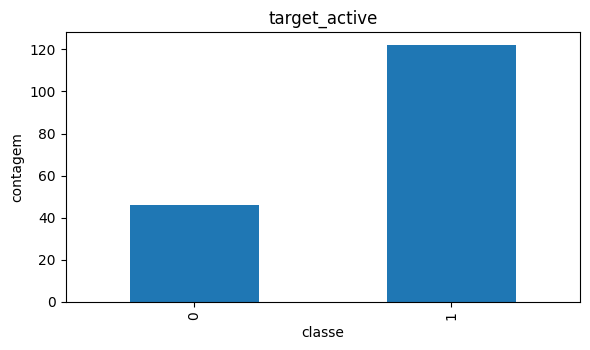

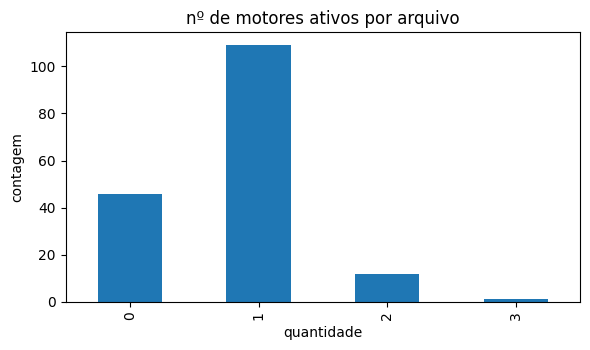

In [7]:
# =========================================
# 4) EDA rápida (barplots) — opcional
# =========================================
def barplot(series, title, xlabel):
    counts = series.value_counts(dropna=False).sort_index()
    plt.figure(figsize=(6,3.6))
    counts.plot(kind="bar")
    plt.title(title); plt.xlabel(xlabel); plt.ylabel("contagem")
    plt.tight_layout(); plt.show()

barplot(df["target_active"], "target_active", "classe")
barplot(df["active_count"], "nº de motores ativos por arquivo", "quantidade")


In [8]:
# =========================================
# 5) Preparar conjunto com 1 motor ativo + rótulos multitarefa
# =========================================
df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
idx2motor = {i:m for m,i in motor2idx.items()}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(state_code_of_active, axis=1).astype(int)

# Mapas de estado por motor (usando TODO o df_one)
state_meta = {}
for k in range(1,6):
    codes = sorted(df_one.loc[df_one["motor_idx"]==(k-1), "state_code"].unique().tolist())
    if len(codes)==0: codes=[1]
    state2idx = {c:i for i,c in enumerate(codes)}
    idx2state = {i:c for c,i in state2idx.items()}
    state_meta[k] = {"codes": codes, "state2idx": state2idx, "idx2state": idx2state}

df_one["state_idx"] = df_one.apply(lambda r: state_meta[int(r["which_motor"][1])]["state2idx"][int(r["state_code"])], axis=1)

print("Arquivos por motor (1 ativo):")
print(df_one["which_motor"].value_counts().sort_index())
print("\nEstados por motor (códigos presentes):")
for k in range(1,6):
    print(f"M{k}:", state_meta[k]["codes"])


Arquivos por motor (1 ativo):
which_motor
M1    52
M2    15
M3    16
M4    14
M5    12
Name: count, dtype: int64

Estados por motor (códigos presentes):
M1: [1, 2, 3, 4, 5]
M2: [1, 2, 3, 4, 5]
M3: [1, 2, 3, 4, 5]
M4: [1, 2, 3, 4]
M5: [1, 2, 3, 4]


In [9]:
# =========================================
# 6) Dataset de janelas curtas multitarefa (log-mel) + SpecAugment + file_name
# =========================================
class WindowedMelDatasetMT(Dataset):
    def __init__(self, df, sr=44100, seg_dur=1.5, seg_hop=0.75,
                 n_mels=64, n_fft=1024, hop_length=256,
                 fmin=20, fmax=8000, augment=False,
                 max_segments_per_file=60):
        self.df = df.reset_index(drop=True).copy()
        self.sr = sr
        self.seg_samples = int(sr*seg_dur)
        self.hop_samples = int(sr*seg_hop)
        assert self.hop_samples > 0
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.fmin = fmin; self.fmax = fmax
        self.augment = augment
        self.max_segments_per_file = max_segments_per_file

        self.index = []
        it = range(len(self.df))
        if USE_TQDM: it = tqdm(it, desc="Indexando janelas (MT)", leave=False)
        for i in it:
            path = self.df.loc[i, "wav_path"]
            dur_s = float(self.df.loc[i, "duration_s"]) if "duration_s" in self.df.columns and not pd.isna(self.df.loc[i, "duration_s"]) else None
            if dur_s is None:
                try:
                    f = sf.SoundFile(str(path)); dur_s = len(f)/f.samplerate
                except:
                    dur_s = 60.0
            total_samples = int(self.sr * dur_s)
            if total_samples < self.seg_samples:
                starts = [0]
            else:
                nseg = 1 + (total_samples - self.seg_samples) // self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file is not None and len(starts) > self.max_segments_per_file:
                rng = np.random.RandomState(SEED + i)
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts:
                self.index.append((i, s))

        if len(self.index)==0:
            raise RuntimeError("Nenhum segmento criado — verifique caminhos/param.")

    def __len__(self): return len(self.index)

    def _load_seg(self, path, start):
        y, srr = sf.read(str(path), always_2d=False)
        if y.ndim>1: y = y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else:
                take = min(self.seg_samples, len(y))
                seg[:take] = y[-take:]
        return seg

    def _augment_wave(self, y):
        if np.random.rand()<0.5:
            y *= 10**(np.random.uniform(-3,3)/20)      # ganho
        if np.random.rand()<0.5:
            y = y + np.random.normal(0, np.std(y)*np.random.uniform(0.0,0.01), size=y.shape).astype(np.float32)
        return y

    def __getitem__(self, idx):
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        seg = self._load_seg(row["wav_path"], start)
        if self.augment: seg = self._augment_wave(seg)

        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)

        # normalização por segmento
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd

        # --- SpecAugment leve quando augment=True ---
        if self.augment:
            F = S_db.shape[0]   # n_mels
            T = S_db.shape[1]   # frames
            # máscara de frequência (~10%)
            if np.random.rand() < 0.5:
                f = max(1, int(0.10 * F))
                f0 = np.random.randint(0, F - f + 1)
                S_db[f0:f0+f, :] = 0.0
            # máscara de tempo (~10%)
            if np.random.rand() < 0.5:
                t = max(1, int(0.10 * T))
                t0 = np.random.randint(0, T - t + 1)
                S_db[:, t0:t0+t] = 0.0

        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]

        motor_idx = int(row["motor_idx"])       # 0..4
        state_idx = int(row["state_idx"])       # index por cabeça
        motor_k   = int(row["which_motor"][1])  # 1..5
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))

        return x_seq, torch.tensor(motor_idx), torch.tensor(state_idx), torch.tensor(motor_k), file_name


In [10]:
# =========================================
# 7) Split seguro por arquivo (tolerante a classes raras)
# =========================================
def safe_split_by_class(y, test_size=0.2, random_state=123):
    rng = np.random.RandomState(random_state)
    y = np.asarray(y, dtype=int)
    classes = np.unique(y)
    test_idx, train_idx = [], []
    for c in classes:
        idx_c = np.where(y == c)[0]
        n = len(idx_c)
        if n <= 1:
            train_idx.extend(idx_c.tolist())
        else:
            n_te = max(1, int(round(test_size*n)))
            n_te = min(n_te, n-1)
            sel = rng.choice(idx_c, size=n_te, replace=False)
            test_idx.extend(sel.tolist())
            train_idx.extend(list(set(idx_c.tolist()) - set(sel.tolist())))
    rng.shuffle(train_idx); rng.shuffle(test_idx)
    return np.array(train_idx), np.array(test_idx)


In [11]:
# =========================================
# 8) Modelo multitarefa (BiLSTM + atenção) com PADDING por batch
# =========================================
class MeanAttention(nn.Module):
    def __init__(self, d): super().__init__(); self.w = nn.Linear(d,1)
    def forward(self, z):
        a = torch.softmax(self.w(z).squeeze(-1), dim=1)
        return (z * a.unsqueeze(-1)).sum(dim=1)

class MultiTaskMotorState(nn.Module):
    def __init__(self, n_mels=64, hidden=128, num_layers=2, dropout=0.2, state_meta=None):
        super().__init__()
        self.state_meta = state_meta
        self.lstm = nn.LSTM(n_mels, hidden, num_layers=num_layers, batch_first=True,
                            bidirectional=True, dropout=dropout)
        self.attn = MeanAttention(2*hidden)
        self.dropout = nn.Dropout(dropout)
        self.motor_head = nn.Linear(2*hidden, 5)
        self.state_heads = nn.ModuleDict()
        for k in range(1,6):
            n_out = len(state_meta[k]["codes"])
            self.state_heads[str(k)] = nn.Linear(2*hidden, n_out)

    def forward(self, x, motor_k=None):
        z,_ = self.lstm(x)
        z = self.attn(z)
        z = self.dropout(z)
        logits_motor = self.motor_head(z)

        if motor_k is None:
            return logits_motor

        B = x.size(0)
        ck_list = [len(self.state_meta[int(mk.item())]["codes"]) for mk in motor_k]
        Cmax = max(ck_list)
        logits_state = x.new_full((B, Cmax), fill_value=-1e9)  # padding

        for i in range(B):
            k = str(int(motor_k[i].item()))
            out_i = self.state_heads[k](z[i:i+1])  # [1,Ck]
            Ck = out_i.size(1)
            logits_state[i, :Ck] = out_i.squeeze(0)

        return logits_motor, logits_state


In [12]:
# =========================================
# 9) Focal Loss e pesos de classe
# =========================================
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction="mean"):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
    def forward(self, logits, target):
        ce = nn.functional.cross_entropy(logits, target, weight=self.alpha, reduction="none")
        pt = torch.softmax(logits, dim=1).gather(1, target.unsqueeze(1)).squeeze(1).clamp_min(1e-6)
        loss = ((1 - pt) ** self.gamma) * ce
        if self.reduction == "mean": return loss.mean()
        if self.reduction == "sum":  return loss.sum()
        return loss

def make_class_weights_motor(dl):
    ys = []
    for _, y_m, _, _, _ in dl: ys.append(y_m)
    if not ys: return None
    y = torch.cat(ys).cpu().numpy()
    classes = np.unique(y)  # apenas presentes
    w = compute_class_weight(class_weight="balanced", classes=classes, y=y)
    full = np.ones(5, dtype=np.float32)
    for c,wc in zip(classes, w): full[int(c)] = wc
    return torch.tensor(full, dtype=torch.float32)

def make_class_weights_states_per_motor(dl, state_meta):
    buckets = {k: [] for k in range(1,6)}
    for _, y_m, y_s, k, _ in dl:
        k_np = k.numpy(); y_s_np = y_s.numpy()
        for ki in range(1,6):
            mask = (k_np == ki)
            if mask.any():
                buckets[ki].extend(y_s_np[mask].tolist())
    weights = {}
    for k in range(1,6):
        arr = np.asarray(buckets[k], dtype=int)
        if arr.size == 0:
            weights[k] = None
            continue
        classes = np.unique(arr)
        w = compute_class_weight(class_weight="balanced", classes=classes, y=arr)
        Ck = len(state_meta[k]["codes"])
        full = np.ones(Ck, dtype=np.float32)
        for c,wc in zip(classes, w): full[int(c)] = wc
        weights[k] = torch.tensor(full, dtype=torch.float32)
    return weights


In [13]:
# =========================================
# 10) Treino multitarefa (num_workers=0, Focal na cabeça de estado)
# =========================================
def train_multitask(df_labels, state_meta,
                    # features
                    sr=44100, seg_dur=1.5, seg_hop=0.75,
                    n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000,
                    # treino
                    batch_size=128, epochs=20, lr=2e-3, hidden=128, layers=2,
                    alpha_motor=1.0, alpha_state=2.0,
                    max_segments_per_file=60,
                    save_path=None, seed=123):

    # split por ARQUIVO usando motor_idx
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"] = "train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    # datasets/loaders
    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS = 0
    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    model = MultiTaskMotorState(n_mels=n_mels, hidden=hidden, num_layers=layers,
                                dropout=0.2, state_meta=state_meta).to(device)

    # pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))

    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)

        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                logits_motor, logits_state_pad = model(xb, motor_k=k)

                # perda motor
                loss_motor = crit_motor(logits_motor, y_m)

                # perda estado: FocalLoss + pesos por motor; corta para Ck
                loss_state = 0.0
                for ki in range(1,6):
                    mask = (k == ki)
                    if mask.any():
                        Ck = len(state_meta[ki]["codes"])
                        logits_k = logits_state_pad[mask, :Ck]
                        y_s_k   = y_s[mask]
                        w_k = w_states.get(ki, None)
                        crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None),
                                           gamma=2.0, reduction="mean")
                        loss_state = loss_state + crit_k(logits_k, y_s_k)

                loss = alpha_motor*loss_motor + alpha_state*loss_state
                if train:
                    opt.zero_grad(); loss.backward(); opt.step()

            losses.append(loss.item())
            # métricas (segment-level, rápidas)
            yM_true.extend(y_m.cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).cpu().numpy().tolist())
            yS_true_all.extend(y_s.cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro",
                        labels=list(np.unique(yM_true)) if yM_true else None, zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    best = {"score": -1, "state": None}
    ep_iter = range(1, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc="Épocas (MT)")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        sch.step(te_loss)
        msg = (f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
               f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
               f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
               f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})")
        if USE_TQDM: tqdm.write(msg)
        else: print(msg)
        score = (te_f1M + te_f1S)/2.0
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}

    if best["state"] is not None:
        model.load_state_dict(best["state"])
        if save_path:
            torch.save(best, save_path)
            print(f"[MT] Melhor score (avg F1 M+S): {best['score']:.3f} | salvo em: {save_path}")

    # Relatórios finais (segment-level)
    yM_true, yM_pred = [], []
    with torch.no_grad():
        iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval motor (seg)", leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, k = xb.to(device), k.to(device)
            lm, _ = model(xb, motor_k=k)
            yM_true.extend(y_m.cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())

    print("\n=== Relatório (MOTOR, segmentos) ===")
    motor_labels_present = sorted(np.unique(yM_true))
    motor_names_present  = [ ["M1","M2","M3","M4","M5"][i] for i in motor_labels_present ]
    print(classification_report(yM_true, yM_pred, labels=motor_labels_present,
                                target_names=motor_names_present, zero_division=0))
    print("Matriz de confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=motor_labels_present))

    yS_true, yS_pred = [], []
    with torch.no_grad():
        iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval estado (seg)", leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, k = xb.to(device), k.to(device)
            _, ls_pad = model(xb, motor_k=k)
            yS_true.extend(y_s.cpu().numpy().tolist())
            yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())

    print("\n=== Relatório (ESTADO, segmentos; cabeça por motor verdadeiro) ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))

    return model, (dl_tr, dl_te), df_labels


In [14]:
# =========================================
# 11) Hiperparâmetros e TREINO (foco no estado)
# =========================================
SEG_DUR = 1.5   # janela mais curta
SEG_HOP = 0.75  # mais sobreposição
N_MELS  = 64
N_FFT   = 1024
HOP     = 256

model_mt, loaders_mt, dfMT = train_multitask(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=128, epochs=20, lr=2e-3, hidden=128, layers=2,
    alpha_motor=1.0, alpha_state=2.0,   # >>> peso maior no estado
    max_segments_per_file=60,
    save_path=ROOT_DIR/"model_multitask_motor_state.pt",
    seed=123
)


Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas (MT):   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas (MT):   0%|          | 0/21 [00:00<?, ?it/s]

Épocas (MT):   0%|          | 0/20 [00:00<?, ?it/s]

train ep01:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/10 [00:00<?, ?it/s]

[01] loss_tr=4.7194 M(tr acc=0.565 f1=0.580) S(tr acc=0.697 f1=0.622) | loss_te=5.9338 M(te acc=0.756 f1=0.758) S(te acc=0.644 f1=0.480)


train ep02:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/10 [00:00<?, ?it/s]

[02] loss_tr=1.5417 M(tr acc=0.811 f1=0.812) S(tr acc=0.884 f1=0.849) | loss_te=6.6749 M(te acc=0.841 f1=0.816) S(te acc=0.576 f1=0.501)


train ep03:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/10 [00:00<?, ?it/s]

[03] loss_tr=1.1031 M(tr acc=0.869 f1=0.865) S(tr acc=0.916 f1=0.892) | loss_te=6.2729 M(te acc=0.910 f1=0.900) S(te acc=0.660 f1=0.545)


train ep04:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/10 [00:00<?, ?it/s]

[04] loss_tr=0.9937 M(tr acc=0.904 f1=0.897) S(tr acc=0.930 f1=0.910) | loss_te=5.5100 M(te acc=0.930 f1=0.911) S(te acc=0.674 f1=0.542)


train ep05:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/10 [00:00<?, ?it/s]

[05] loss_tr=0.7554 M(tr acc=0.933 f1=0.928) S(tr acc=0.942 f1=0.924) | loss_te=5.4969 M(te acc=0.944 f1=0.926) S(te acc=0.683 f1=0.592)


train ep06:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/10 [00:00<?, ?it/s]

[06] loss_tr=0.5140 M(tr acc=0.947 f1=0.942) S(tr acc=0.955 f1=0.945) | loss_te=5.8779 M(te acc=0.907 f1=0.865) S(te acc=0.699 f1=0.611)


train ep07:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/10 [00:00<?, ?it/s]

[07] loss_tr=0.5748 M(tr acc=0.950 f1=0.946) S(tr acc=0.950 f1=0.938) | loss_te=6.1410 M(te acc=0.943 f1=0.925) S(te acc=0.676 f1=0.572)


train ep08:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/10 [00:00<?, ?it/s]

[08] loss_tr=0.3888 M(tr acc=0.962 f1=0.960) S(tr acc=0.970 f1=0.965) | loss_te=7.5869 M(te acc=0.938 f1=0.918) S(te acc=0.643 f1=0.519)


train ep09:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/10 [00:00<?, ?it/s]

[09] loss_tr=0.3251 M(tr acc=0.969 f1=0.967) S(tr acc=0.971 f1=0.963) | loss_te=6.5115 M(te acc=0.921 f1=0.897) S(te acc=0.656 f1=0.544)


train ep10:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/10 [00:00<?, ?it/s]

[10] loss_tr=0.2699 M(tr acc=0.976 f1=0.976) S(tr acc=0.974 f1=0.967) | loss_te=6.9599 M(te acc=0.920 f1=0.885) S(te acc=0.683 f1=0.561)


train ep11:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/10 [00:00<?, ?it/s]

[11] loss_tr=0.2089 M(tr acc=0.977 f1=0.975) S(tr acc=0.976 f1=0.970) | loss_te=6.9646 M(te acc=0.913 f1=0.882) S(te acc=0.662 f1=0.508)


train ep12:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/10 [00:00<?, ?it/s]

[12] loss_tr=0.1911 M(tr acc=0.981 f1=0.980) S(tr acc=0.982 f1=0.979) | loss_te=7.2014 M(te acc=0.934 f1=0.903) S(te acc=0.694 f1=0.579)


train ep13:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/10 [00:00<?, ?it/s]

[13] loss_tr=0.1690 M(tr acc=0.977 f1=0.975) S(tr acc=0.985 f1=0.983) | loss_te=6.3806 M(te acc=0.932 f1=0.902) S(te acc=0.716 f1=0.635)


train ep14:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/10 [00:00<?, ?it/s]

[14] loss_tr=0.1425 M(tr acc=0.982 f1=0.981) S(tr acc=0.988 f1=0.986) | loss_te=7.1352 M(te acc=0.927 f1=0.888) S(te acc=0.705 f1=0.605)


train ep15:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/10 [00:00<?, ?it/s]

[15] loss_tr=0.1309 M(tr acc=0.982 f1=0.982) S(tr acc=0.989 f1=0.987) | loss_te=8.0912 M(te acc=0.922 f1=0.883) S(te acc=0.696 f1=0.567)


train ep16:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/10 [00:00<?, ?it/s]

[16] loss_tr=0.1069 M(tr acc=0.983 f1=0.982) S(tr acc=0.993 f1=0.991) | loss_te=7.6886 M(te acc=0.915 f1=0.873) S(te acc=0.705 f1=0.589)


train ep17:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/10 [00:00<?, ?it/s]

[17] loss_tr=0.0976 M(tr acc=0.986 f1=0.985) S(tr acc=0.989 f1=0.987) | loss_te=7.2682 M(te acc=0.919 f1=0.878) S(te acc=0.709 f1=0.609)


train ep18:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/10 [00:00<?, ?it/s]

[18] loss_tr=0.0895 M(tr acc=0.987 f1=0.987) S(tr acc=0.992 f1=0.991) | loss_te=7.1824 M(te acc=0.913 f1=0.869) S(te acc=0.714 f1=0.625)


train ep19:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/10 [00:00<?, ?it/s]

[19] loss_tr=0.0819 M(tr acc=0.986 f1=0.986) S(tr acc=0.994 f1=0.993) | loss_te=7.2949 M(te acc=0.918 f1=0.877) S(te acc=0.710 f1=0.616)


train ep20:   0%|          | 0/42 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/10 [00:00<?, ?it/s]

[20] loss_tr=0.0771 M(tr acc=0.988 f1=0.987) S(tr acc=0.994 f1=0.994) | loss_te=7.3846 M(te acc=0.919 f1=0.878) S(te acc=0.712 f1=0.619)
[MT] Melhor score (avg F1 M+S): 0.769 | salvo em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_multitask_motor_state.pt


aval motor (seg):   0%|          | 0/10 [00:00<?, ?it/s]


=== Relatório (MOTOR, segmentos) ===
              precision    recall  f1-score   support

          M1       0.99      1.00      0.99       600
          M2       0.79      0.98      0.87       180
          M3       1.00      0.73      0.85       180
          M4       0.96      0.74      0.84       180
          M5       0.72      0.98      0.83       120

    accuracy                           0.92      1260
   macro avg       0.89      0.89      0.88      1260
weighted avg       0.93      0.92      0.92      1260

Matriz de confusão (motor):
 [[598   0   0   2   0]
 [  3 176   0   1   0]
 [  1  47 132   0   0]
 [  1   0   0 134  45]
 [  0   0   0   2 118]]


aval estado (seg):   0%|          | 0/10 [00:00<?, ?it/s]


=== Relatório (ESTADO, segmentos; cabeça por motor verdadeiro) ===
              precision    recall  f1-score   support

           0       0.92      0.33      0.48       180
           1       0.73      0.98      0.83       600
           2       0.91      0.51      0.65       180
           3       0.54      0.52      0.53       240
           4       0.60      0.58      0.59        60

    accuracy                           0.71      1260
   macro avg       0.74      0.58      0.62      1260
weighted avg       0.74      0.71      0.69      1260



In [16]:
# =========================================
# 12) Avaliação por ARQUIVO (agregação por segmentos)
# =========================================
from collections import defaultdict

from collections import defaultdict
import torch
from sklearn.metrics import classification_report, confusion_matrix

def eval_file_level(model, dl_te, state_meta):
    model.eval()
    motor_logits_by_file = defaultdict(list)
    state_logits_by_file = defaultdict(list)
    true_motor_by_file   = {}
    true_state_by_file   = {}

    with torch.no_grad():
        it = dl_te
        for xb, y_m, y_s, k, fns in tqdm(it, desc="agregando por arquivo", leave=False):
            xb = xb.to(device); k = k.to(device)
            # 1) logits do MOTOR (por segmento)
            lm = model(xb)  # motor_k=None => retorna só logits_motor  [B,5]

            # 2) logits do ESTADO (cabeça do motor verdadeiro), CORTANDO por amostra
            _, ls_pad = model(xb, motor_k=k)  # [B, Cmax] (com padding -1e9)

            for i, fid in enumerate(fns):
                # Guardar verdadeiros (uma vez)
                if fid not in true_motor_by_file:
                    true_motor_by_file[fid] = int(y_m[i].cpu().item())
                if fid not in true_state_by_file:
                    true_state_by_file[fid] = int(y_s[i].cpu().item())

                # motor: salva vetor [5]
                motor_logits_by_file[fid].append(lm[i].cpu())

                # estado: cortar PARA O Ck DA AMOSTRA e salvar SEM concatenar o batch
                ki = int(k[i].item())                 # 1..5
                Ck = len(state_meta[ki]["codes"])
                state_vec_i = ls_pad[i, :Ck].cpu()    # shape [Ck]
                state_logits_by_file[fid].append(state_vec_i)

    # -------- Agregação por ARQUIVO --------
    yM_true, yM_pred = [], []
    yS_true, yS_pred = [], []

    for fid in motor_logits_by_file.keys():
        # Motor: média de logits -> argmax
        lm = torch.stack(motor_logits_by_file[fid], dim=0).mean(dim=0)  # [5]
        m_pred = int(torch.argmax(lm).item())
        yM_true.append(true_motor_by_file[fid])
        yM_pred.append(m_pred)

        # Estado: todos vetores do mesmo arquivo devem ter o MESMO Ck (motor verdadeiro fixo)
        # então podemos empilhar agora
        ls_list = state_logits_by_file[fid]           # lista de tensores [Ck]
        Ck_set = {t.numel() for t in ls_list}
        if len(Ck_set) != 1:
            # Em caso de inconsistência (não deveria acontecer com 1 motor ativo),
            # faz média via padding simples como fallback:
            Ck = max(Ck_set)
            pad = torch.full((len(ls_list), Ck), -1e9)
            for i,tv in enumerate(ls_list):
                pad[i, :tv.numel()] = tv
            ls_mean = pad.mean(dim=0)
        else:
            ls_mean = torch.stack(ls_list, dim=0).mean(dim=0)  # [Ck]
        s_pred = int(torch.argmax(ls_mean).item())

        yS_true.append(true_state_by_file[fid])
        yS_pred.append(s_pred)

    print("\n=== File-level: MOTOR ===")
    labsM = sorted(np.unique(yM_true))
    namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
    print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
    print("Confusão (motor, file-level):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))

    print("\n=== File-level: ESTADO (cabeça do motor verdadeiro) ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))


# Rodar avaliação por arquivo
eval_file_level(model_mt, loaders_mt[1], state_meta)


agregando por arquivo:   0%|          | 0/10 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       0.75      1.00      0.86         3
          M3       1.00      0.67      0.80         3
          M4       1.00      0.67      0.80         3
          M5       0.67      1.00      0.80         2

    accuracy                           0.90        21
   macro avg       0.88      0.87      0.85        21
weighted avg       0.93      0.90      0.90        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  1  2  0  0]
 [ 0  0  0  2  1]
 [ 0  0  0  0  2]]

=== File-level: ESTADO (cabeça do motor verdadeiro) ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.71      1.00      0.83        10
           2       1.00      0.67      0.80         3
           3       0.67      0.50      0.57         4
           4       1.00      1.00 

In [17]:
# =========================================
# 13) Inferência por arquivo (prevê motor + estado) — com suavização temporal opcional
# =========================================
STATE_TEXT_COMB = {0:"Ausente/desligado",1:"Marcha lenta (embreagem desengatada)",
                   2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                   4:"Velocidade média (frente média)",5:"Variações de aceleração"}
STATE_TEXT_ELEC = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}
MOTOR_SPECS = {"M1":"4,5 HP (combustão)","M2":"18 HP (combustão)","M3":"8 HP (combustão)",
               "M4":"3,6 HP (combustão)","M5":"Elétrico (modelo RC)"}

def file_to_segments_logmel(wav_path, sr=44100, seg_dur=1.5, seg_hop=0.75,
                            n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000):
    y, srr = sf.read(str(wav_path), always_2d=False)
    if y.ndim>1: y = y.mean(axis=1)
    y = y.astype(np.float32)
    if srr != sr: y = librosa.resample(y, orig_sr=srr, target_sr=sr)
    seg_samples = int(sr*seg_dur); hop_samples = int(sr*seg_hop)
    if len(y) < seg_samples: y = np.pad(y, (0, seg_samples-len(y)))
    starts = list(range(0, max(1, len(y)-seg_samples+1), hop_samples))
    X = []
    it = starts if not USE_TQDM else tqdm(starts, desc="extraindo segmentos (inferência)", leave=False)
    for s in it:
        seg = y[s:s+seg_samples]
        if len(seg) < seg_samples: seg = np.pad(seg, (0, seg_samples-len(seg)))
        S = librosa.feature.melspectrogram(y=seg, sr=sr, n_fft=n_fft, hop_length=hop,
                                           n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0)
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd
        X.append(torch.from_numpy(S_db.T.copy()))
    if not X: return torch.empty(0,1,n_mels)
    return torch.stack(X, dim=0)

def medfilt1d_int(arr, k):
    k = max(1, int(k)); k = k if k % 2 == 1 else k+1
    pad = k//2
    arr_pad = np.pad(arr, (pad,pad), mode="edge")
    out = np.zeros_like(arr)
    for i in range(len(arr)):
        out[i] = int(np.median(arr_pad[i:i+k]))
    return out

def predict_file_multitask(wav_path, smooth_win=None):
    X = file_to_segments_logmel(
        wav_path, sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
        n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000
    ).to(device)
    if X.ndim==2: X = X.unsqueeze(0)
    if X.shape[0]==0:
        return {"motor": None, "estado_cod": None, "estado_txt": None, "obs":"sem segmentos"}

    model_mt.eval()
    with torch.no_grad():
        # Motor (por segmento)
        lm_all = []
        for i in range(0, X.shape[0], 64):
            lm = model_mt(X[i:i+64])  # só motor
            lm_all.append(lm)
        lm_all = torch.cat(lm_all, dim=0)                # [S,5]
        motor_seg = torch.argmax(lm_all, dim=1).cpu().numpy()
        if smooth_win: motor_seg = medfilt1d_int(motor_seg, smooth_win)
        motor_idx = int(np.bincount(motor_seg).argmax())
        motor_label = ["M1","M2","M3","M4","M5"][motor_idx]
        k = int(motor_label[1])

        # Estado (cabeça do motor previsto)
        ls_all = []
        for i in range(0, X.shape[0], 64):
            _, ls_pad = model_mt(X[i:i+64], motor_k=torch.full((X[i:i+64].size(0),), k, dtype=torch.long, device=device))
            Ck = len(state_meta[k]["codes"])
            ls_all.append(ls_pad[:, :Ck])
        ls_all = torch.cat(ls_all, dim=0)                # [S,Ck]
        state_seg = torch.argmax(ls_all, dim=1).cpu().numpy()
        if smooth_win: state_seg = medfilt1d_int(state_seg, smooth_win)
        state_idx = int(np.bincount(state_seg).argmax())
        estado_cod = state_meta[k]["idx2state"][state_idx]

    estado_txt = (STATE_TEXT_COMB if k<=4 else STATE_TEXT_ELEC).get(estado_cod, str(estado_cod))
    return {"motor": motor_label, "motor_spec": MOTOR_SPECS[motor_label],
            "estado_cod": estado_cod, "estado_txt": estado_txt}


In [18]:
# =========================================
# 14) Teste rápido de inferência (3 arquivos aleatórios com 1 motor ativo)
# =========================================
import random
cands = df_one["wav_path"].dropna().tolist()
if cands:
    for p in random.sample(cands, k=min(3, len(cands))):
        out1 = predict_file_multitask(p, smooth_win=None)
        out2 = predict_file_multitask(p, smooth_win=5)   # suavização temporal
        print(Path(p).name, "-> sem_smooth:", out1, "| smooth:", out2)
else:
    print("Sem arquivos com 1 motor ativo.")


extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

A20000T00N00x02.wav -> sem_smooth: {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 2, 'estado_txt': 'Marcha lenta engatada (frente)'} | smooth: {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 2, 'estado_txt': 'Marcha lenta engatada (frente)'}


extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

A20000T00N04x04.wav -> sem_smooth: {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 2, 'estado_txt': 'Marcha lenta engatada (frente)'} | smooth: {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 2, 'estado_txt': 'Marcha lenta engatada (frente)'}


extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

A30000T00N00x01.wav -> sem_smooth: {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 3, 'estado_txt': 'Baixa velocidade (frente lenta)'} | smooth: {'motor': 'M1', 'motor_spec': '4,5 HP (combustão)', 'estado_cod': 3, 'estado_txt': 'Baixa velocidade (frente lenta)'}


In [19]:
# =========================================
# 14) Teste de inferência + MÉTRICAS nos arquivos amostrados (teste)
# =========================================
from pathlib import Path
import random
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Seleciona apenas os arquivos de TESTE que têm 1 motor ativo
df_te = dfMT[dfMT["split"]=="test"].copy()
if len(df_te) == 0:
    print("Não há arquivos no conjunto de teste.")
else:
    # Amostra K arquivos de teste (ajuste k se quiser avaliar mais)
    k = min(3, len(df_te))
    rows = df_te.sample(n=k, random_state=SEED)

    yM_true, yM_pred = [], []
    yS_true, yS_pred = [], []

    print(f"Avaliando {k} arquivo(s) do conjunto de TESTE:\n")
    for _, row in rows.iterrows():
        p = row["wav_path"]
        gt_motor = row["which_motor"]      # ex.: "M1"
        gt_state = int(row["state_code"])  # ex.: 0..5 conforme o motor verdadeiro

        out_nos = predict_file_multitask(p, smooth_win=None)
        out_smo = predict_file_multitask(p, smooth_win=5)   # com suavização temporal

        # escolha qual usar na métrica (aqui vou usar o com suavização)
        pred_motor = out_smo["motor"]               # "M1".."M5"
        pred_state = int(out_smo["estado_cod"])     # código 0..5 (semântica depende do motor)

        # acumula para métricas
        yM_true.append(gt_motor)
        yM_pred.append(pred_motor)
        yS_true.append(gt_state)
        yS_pred.append(pred_state)

        print(
            f"{Path(p).name}\n"
            f"  GT  -> motor={gt_motor}, estado={gt_state}\n"
            f"  Pred-> (sem_smooth) motor={out_nos['motor']}, estado={out_nos['estado_cod']} ({out_nos['estado_txt']})\n"
            f"         (smooth=5)  motor={out_smo['motor']}, estado={out_smo['estado_cod']} ({out_smo['estado_txt']})\n"
        )

    # ======= MÉTRICAS =======
    # Motores: rótulos são strings "M1".."M5"
    print("=== Métricas (MOTOR) nos arquivos amostrados ===")
    labsM = sorted(np.unique(yM_true + yM_pred))
    print(classification_report(yM_true, yM_pred, labels=labsM, target_names=labsM, zero_division=0))
    print("Acurácia (motor):", accuracy_score(yM_true, yM_pred))
    print("Matriz de confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))

    # Estados: usamos o código numérico (0..5). Note que a semântica muda p/ motor elétrico vs combustão.
    print("\n=== Métricas (ESTADO) nos arquivos amostrados ===")
    labsS = sorted(np.unique(yS_true + yS_pred))
    print(classification_report(yS_true, yS_pred, labels=labsS, zero_division=0))
    print("Acurácia (estado):", accuracy_score(yS_true, yS_pred))
    print("Matriz de confusão (estado):\n", confusion_matrix(yS_true, yS_pred, labels=labsS))


Avaliando 3 arquivo(s) do conjunto de TESTE:



extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

A20000T00N01x01.wav
  GT  -> motor=M1, estado=2
  Pred-> (sem_smooth) motor=M1, estado=2 (Marcha lenta engatada (frente))
         (smooth=5)  motor=M1, estado=2 (Marcha lenta engatada (frente))



extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

A20000T00N04x05.wav
  GT  -> motor=M1, estado=2
  Pred-> (sem_smooth) motor=M1, estado=2 (Marcha lenta engatada (frente))
         (smooth=5)  motor=M1, estado=2 (Marcha lenta engatada (frente))



extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

extraindo segmentos (inferência):   0%|          | 0/79 [00:00<?, ?it/s]

A20000T00N01x04.wav
  GT  -> motor=M1, estado=2
  Pred-> (sem_smooth) motor=M1, estado=2 (Marcha lenta engatada (frente))
         (smooth=5)  motor=M1, estado=2 (Marcha lenta engatada (frente))

=== Métricas (MOTOR) nos arquivos amostrados ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00         3

    accuracy                           1.00         3
   macro avg       1.00      1.00      1.00         3
weighted avg       1.00      1.00      1.00         3

Acurácia (motor): 1.0
Matriz de confusão (motor):
 [[3]]

=== Métricas (ESTADO) nos arquivos amostrados ===
              precision    recall  f1-score   support

           2       1.00      1.00      1.00         3

    accuracy                           1.00         3
   macro avg       1.00      1.00      1.00         3
weighted avg       1.00      1.00      1.00         3

Acurácia (estado): 1.0
Matriz de confusão (estado):
 [[3]]


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(


# CODIGO COMPLETO COM BASELINES

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# =========================================
# 1) Imports, paths, seeds
# =========================================
from pathlib import Path
import os, re, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import soundfile as sf
import librosa

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models

from tqdm.auto import tqdm

# Evitar problemas de multiprocessamento no Colab (Py3.12)
import torch.multiprocessing as mp
try:
    mp.set_start_method("spawn", force=True)
except RuntimeError:
    pass

USE_TQDM = True

# === Caminhos (ajuste se preciso) ===
ROOT_DIR   = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")
AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

print("AUDIO_DIR:", AUDIO_DIR)
print("CSV:", CSV_PATH.exists(), "| XLSX:", XLSX_PATH.exists())

# Seeds e device
SEED = 123
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV: True | XLSX: True
Device: cuda


In [3]:
# =========================================
# 2) Carregar índice, limpar colunas, resolver .wav
# =========================================
def clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Não encontrei Wolfset_Index.csv nem .xlsx em ARQ/")

df.columns = [clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)

for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Resolver .wav (case-insensitive)
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# Decodificar intensity_code -> estados dos motores
map_comb_txt = {0:"Ausente/desligado",1:"Marcha lenta (desengatada)",
                2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                4:"Velocidade média (frente média)",5:"Variações de aceleração"}
map_elec_txt = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

def decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Desconhecido_{d}")
    return out

dec = df["intensity_code"].apply(decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))
df["target_active"] = (df["active_count"]>0).astype(int)

def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
idx2motor = {i:m for m,i in motor2idx.items()}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(state_code_of_active, axis=1).astype(int)

# espaços de estado por motor (apenas códigos presentes)
state_meta = {}
for k in range(1,6):
    codes = sorted(df_one.loc[df_one["motor_idx"]==(k-1), "state_code"].unique().tolist())
    if len(codes)==0: codes=[1]
    state2idx = {c:i for i,c in enumerate(codes)}
    idx2state = {i:c for c,i in state2idx.items()}
    state_meta[k] = {"codes": codes, "state2idx": state2idx, "idx2state": idx2state}

df_one["state_idx"] = df_one.apply(lambda r: state_meta[int(r["which_motor"][1])]["state2idx"][int(r["state_code"])], axis=1)

print("Arquivos por motor (1 ativo):")
print(df_one["which_motor"].value_counts().sort_index())


Arquivos por motor (1 ativo):
which_motor
M1    52
M2    15
M3    16
M4    14
M5    12
Name: count, dtype: int64


In [4]:
# =========================================
# 3) Dataset de janelas (log-mel) + SpecAugment leve
# =========================================
class WindowedMelDatasetMT(Dataset):
    def __init__(self, df, sr=44100, seg_dur=1.5, seg_hop=0.75,
                 n_mels=64, n_fft=1024, hop_length=256,
                 fmin=20, fmax=8000, augment=False,
                 max_segments_per_file=60):
        self.df = df.reset_index(drop=True).copy()
        self.sr = sr
        self.seg_samples = int(sr*seg_dur)
        self.hop_samples = int(sr*seg_hop)
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.fmin = fmin; self.fmax = fmax
        self.augment = augment
        self.max_segments_per_file = max_segments_per_file

        self.index = []
        it = range(len(self.df))
        if USE_TQDM: it = tqdm(it, desc="Indexando janelas", leave=False)
        for i in it:
            path = self.df.loc[i, "wav_path"]
            d = float(self.df.loc[i, "duration_s"]) if "duration_s" in self.df.columns and not pd.isna(self.df.loc[i, "duration_s"]) else None
            if d is None:
                try: f = sf.SoundFile(str(path)); d = len(f)/f.samplerate
                except: d = 60.0
            total = int(self.sr * d)
            if total < self.seg_samples:
                starts = [0]
            else:
                nseg = 1 + (total - self.seg_samples) // self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts) > self.max_segments_per_file:
                rng = np.random.RandomState(SEED + i)
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts:
                self.index.append((i, s))
        if not self.index:
            raise RuntimeError("Nenhum segmento criado.")

    def __len__(self): return len(self.index)

    def _load_seg(self, path, start):
        y, srr = sf.read(str(path), always_2d=False)
        if y.ndim>1: y = y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else:
                take = min(self.seg_samples, len(y))
                seg[:take] = y[-take:]
        return seg

    def _augment_wave(self, y):
        if np.random.rand()<0.5:
            y *= 10**(np.random.uniform(-3,3)/20)
        if np.random.rand()<0.5:
            y = y + np.random.normal(0, np.std(y)*np.random.uniform(0.0,0.01), size=y.shape).astype(np.float32)
        return y

    def __getitem__(self, idx):
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        seg = self._load_seg(row["wav_path"], start)
        if self.augment: seg = self._augment_wave(seg)
        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd

        # SpecAugment leve
        if self.augment:
            Fm, Tm = S_db.shape
            if np.random.rand() < 0.5:
                f = max(1, int(0.10 * Fm)); f0 = np.random.randint(0, Fm - f + 1)
                S_db[f0:f0+f, :] = 0.0
            if np.random.rand() < 0.5:
                t = max(1, int(0.10 * Tm)); t0 = np.random.randint(0, Tm - t + 1)
                S_db[:, t0:t0+t] = 0.0

        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_idx"])
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, torch.tensor(motor_idx), torch.tensor(state_idx), torch.tensor(motor_k), file_name


In [5]:
# =========================================
# 4) Split seguro por arquivo (tolerante a classes raras)
# =========================================
def safe_split_by_class(y, test_size=0.2, random_state=123):
    rng = np.random.RandomState(random_state)
    y = np.asarray(y, dtype=int)
    classes = np.unique(y)
    test_idx, train_idx = [], []
    for c in classes:
        idx_c = np.where(y == c)[0]
        n = len(idx_c)
        if n <= 1:
            train_idx.extend(idx_c.tolist())
        else:
            n_te = max(1, int(round(test_size*n))); n_te = min(n_te, n-1)
            sel = rng.choice(idx_c, size=n_te, replace=False)
            test_idx.extend(sel.tolist())
            train_idx.extend(list(set(idx_c.tolist()) - set(sel.tolist())))
    rng.shuffle(train_idx); rng.shuffle(test_idx)
    return np.array(train_idx), np.array(test_idx)


In [6]:
# =========================================
# 5) Cabeças multitarefa comuns e perdas
# =========================================
class MeanAttention(nn.Module):
    def __init__(self, d): super().__init__(); self.w = nn.Linear(d,1)
    def forward(self, z):
        a = torch.softmax(self.w(z).squeeze(-1), dim=1)
        return (z * a.unsqueeze(-1)).sum(dim=1)

class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction="mean"):
        super().__init__()
        self.alpha = alpha; self.gamma = gamma; self.reduction = reduction
    def forward(self, logits, target):
        ce = F.cross_entropy(logits, target, weight=self.alpha, reduction="none")
        pt = torch.softmax(logits, dim=1).gather(1, target.unsqueeze(1)).squeeze(1).clamp_min(1e-6)
        loss = ((1 - pt) ** self.gamma) * ce
        return loss.mean() if self.reduction=="mean" else (loss.sum() if self.reduction=="sum" else loss)

def make_class_weights_motor(dl):
    ys = []
    for _, y_m, _, _, _ in dl: ys.append(y_m)
    if not ys: return None
    y = torch.cat(ys).cpu().numpy()
    classes = np.unique(y)
    w = compute_class_weight(class_weight="balanced", classes=classes, y=y)
    full = np.ones(5, dtype=np.float32)
    for c,wc in zip(classes, w): full[int(c)] = wc
    return torch.tensor(full, dtype=torch.float32)

def make_class_weights_states_per_motor(dl, state_meta):
    buckets = {k: [] for k in range(1,6)}
    for _, y_m, y_s, k, _ in dl:
        k_np = k.numpy(); y_s_np = y_s.numpy()
        for ki in range(1,6):
            mask = (k_np == ki)
            if mask.any(): buckets[ki].extend(y_s_np[mask].tolist())
    weights = {}
    for k in range(1,6):
        arr = np.asarray(buckets[k], dtype=int)
        if arr.size == 0: weights[k] = None; continue
        classes = np.unique(arr)
        w = compute_class_weight(class_weight="balanced", classes=classes, y=arr)
        Ck = len(state_meta[k]["codes"])
        full = np.ones(Ck, dtype=np.float32)
        for c,wc in zip(classes, w): full[int(c)] = wc
        weights[k] = torch.tensor(full, dtype=torch.float32)
    return weights


In [7]:
# =========================================
# 6) MODELOS
#    - "lstm": BiLSTM + atenção (proposto)
#    - "rnn":  GRU + atenção
#    - "transf": TransformerEncoder (temporal)
#    - "resnet": ResNet-50 em imagens 224x224 (3 canais)
# =========================================
class HeadMultiTask(nn.Module):
    def __init__(self, feat_dim, state_meta):
        super().__init__()
        self.state_meta = state_meta
        self.motor_head = nn.Linear(feat_dim, 5)
        self.state_heads = nn.ModuleDict()
        for k in range(1,6):
            self.state_heads[str(k)] = nn.Linear(feat_dim, len(state_meta[k]["codes"]))
    def forward(self, z, motor_k=None):
        logits_motor = self.motor_head(z)
        if motor_k is None: return logits_motor
        B = z.size(0)
        Cmax = max(len(self.state_meta[int(m.item())]["codes"]) for m in motor_k)
        logits_state = z.new_full((B, Cmax), -1e9)
        for i in range(B):
            k = str(int(motor_k[i].item()))
            out = self.state_heads[k](z[i:i+1]).squeeze(0)  # [Ck]
            logits_state[i, :out.numel()] = out
        return logits_motor, logits_state

class ModelLSTM(nn.Module):  # Proposto
    def __init__(self, n_mels, hidden, layers, state_meta, dropout=0.2):
        super().__init__()
        self.rnn = nn.LSTM(n_mels, hidden, num_layers=layers, batch_first=True,
                           bidirectional=True, dropout=dropout)
        self.attn = MeanAttention(2*hidden)
        self.drop = nn.Dropout(dropout)
        self.head = HeadMultiTask(2*hidden, state_meta)
    def forward(self, x, motor_k=None):
        z,_ = self.rnn(x)
        z = self.attn(z)
        z = self.drop(z)
        return self.head(z, motor_k)

class ModelGRU(nn.Module):   # RNN
    def __init__(self, n_mels, hidden, layers, state_meta, dropout=0.2):
        super().__init__()
        self.rnn = nn.GRU(n_mels, hidden, num_layers=layers, batch_first=True,
                          bidirectional=True, dropout=dropout)
        self.attn = MeanAttention(2*hidden)
        self.drop = nn.Dropout(dropout)
        self.head = HeadMultiTask(2*hidden, state_meta)
    def forward(self, x, motor_k=None):
        z,_ = self.rnn(x)
        z = self.attn(z)
        z = self.drop(z)
        return self.head(z, motor_k)

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, max_len=4000):
        super().__init__()
        pe = torch.zeros(max_len, d_model)
        pos = torch.arange(0, max_len).unsqueeze(1)
        div = torch.exp(torch.arange(0, d_model, 2) * (-np.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(pos * div)
        pe[:, 1::2] = torch.cos(pos * div)
        self.register_buffer('pe', pe)   # [max_len, d_model]
    def forward(self, x): # x: [B,T,D]
        T = x.size(1)
        return x + self.pe[:T].unsqueeze(0)

class ModelTransformer(nn.Module):  # Transformer
    def __init__(self, n_mels, d_model, nhead, num_layers, dim_ff, state_meta, dropout=0.1):
        super().__init__()
        self.proj = nn.Linear(n_mels, d_model)
        self.pos = PositionalEncoding(d_model)
        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead,
                                                   dim_feedforward=dim_ff, dropout=dropout, batch_first=True)
        self.enc = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.attn = MeanAttention(d_model)
        self.drop = nn.Dropout(dropout)
        self.head = HeadMultiTask(d_model, state_meta)
    def forward(self, x, motor_k=None):
        z = self.proj(x)
        z = self.pos(z)
        z = self.enc(z)
        z = self.attn(z)
        z = self.drop(z)
        return self.head(z, motor_k)

class ModelResNet(nn.Module):  # CNN ResNet-50
    def __init__(self, n_mels, state_meta, dropout=0.2):
        super().__init__()
        base = models.resnet50(weights=None)
        base.fc = nn.Identity()
        self.cnn = base
        feat_dim = 2048
        self.head = HeadMultiTask(feat_dim, state_meta)
        self.drop = nn.Dropout(dropout)
    def forward(self, x, motor_k=None):
        # x: [B,T,n_mels] -> virar imagem 3x224x224
        # 1) normaliza T para 224 frames por interpolação
        xN = F.interpolate(x.transpose(1,2).unsqueeze(1), size=(224,224), mode="bilinear", align_corners=False) # [B,1,n_mels,T] -> [B,1,224,224]
        img = xN.repeat(1,3,1,1)  # [B,3,224,224]
        z = self.cnn(img)
        z = self.drop(z)
        return self.head(z, motor_k)


In [8]:
# =========================================
# 7) Treino/Validação (PyTorch) — comum aos 4 modelos neurais
# =========================================
def build_model(model_type, n_mels, state_meta):
    if model_type == "lstm":
        return ModelLSTM(n_mels=n_mels, hidden=128, layers=2, state_meta=state_meta, dropout=0.2)
    if model_type == "rnn":
        return ModelGRU(n_mels=n_mels, hidden=128, layers=2, state_meta=state_meta, dropout=0.2)
    if model_type == "transf":
        return ModelTransformer(n_mels=n_mels, d_model=128, nhead=4, num_layers=3, dim_ff=256, state_meta=state_meta, dropout=0.1)
    if model_type == "resnet":
        return ModelResNet(n_mels=n_mels, state_meta=state_meta, dropout=0.2)
    raise ValueError("model_type inválido.")

def train_multitask_torch(df_labels, state_meta, model_type="lstm",
                          # features
                          sr=44100, seg_dur=1.5, seg_hop=0.75,
                          n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000,
                          # treino
                          batch_size=32, epochs=50, lr=2e-3,
                          alpha_motor=1.0, alpha_state=2.0,
                          max_segments_per_file=60,
                          save_path=None, seed=123):

    # split por arquivo
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"] = "train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS = 0
    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    model = build_model(model_type, n_mels, state_meta).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))

    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                logits_motor, logits_state_pad = model(xb, motor_k=k)

                # motor
                loss_motor = crit_motor(logits_motor, y_m)

                # estado (FocalLoss por cabeça; corta para Ck)
                loss_state = 0.0
                for ki in range(1,6):
                    mask = (k == ki)
                    if mask.any():
                        Ck = len(state_meta[ki]["codes"])
                        logits_k = logits_state_pad[mask, :Ck]
                        y_s_k   = y_s[mask]
                        w_k = w_states.get(ki, None)
                        crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                        loss_state = loss_state + crit_k(logits_k, y_s_k)

                loss = alpha_motor*loss_motor + alpha_state*loss_state
                if train:
                    opt.zero_grad(); loss.backward(); opt.step()

            losses.append(loss.item())
            # métricas rápidas (segmentos)
            yM_true.extend(y_m.cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).cpu().numpy().tolist())
            yS_true_all.extend(y_s.cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    best = {"score": -1, "state": None}
    ep_iter = range(1, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino ({model_type})")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        sch.step(te_loss)
        msg = (f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
               f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
               f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
               f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})")
        tqdm.write(msg)
        score = (te_f1M + te_f1S)/2.0
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}

    if best["state"] is not None:
        model.load_state_dict(best["state"])
        if save_path:
            torch.save(best, save_path)
            print(f"[{model_type}] Melhor score (avg F1 M+S): {best['score']:.3f} | salvo em: {save_path}")

    # Relatórios finais (segmentos)
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true))
        namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
    eval_segments()

    return model, (dl_tr, dl_te), df_labels


In [9]:
# =========================================
# 8) Avaliação por arquivo (agregação segura) — comum
# =========================================
from collections import defaultdict

def eval_file_level(model, dl_te, state_meta):
    model.eval()
    motor_logits_by_file = defaultdict(list)
    state_logits_by_file = defaultdict(list)
    true_motor_by_file   = {}
    true_state_by_file   = {}

    with torch.no_grad():
        for xb, y_m, y_s, k, fns in tqdm(dl_te, desc="agregando por arquivo", leave=False):
            xb = xb.to(device); k = k.to(device)
            lm, ls_pad = model(xb, motor_k=k)
            for i, fid in enumerate(fns):
                if fid not in true_motor_by_file:
                    true_motor_by_file[fid] = int(y_m[i].cpu().item())
                if fid not in true_state_by_file:
                    true_state_by_file[fid] = int(y_s[i].cpu().item())
                motor_logits_by_file[fid].append(lm[i].cpu())
                ki = int(k[i].item()); Ck = len(state_meta[ki]["codes"])
                state_logits_by_file[fid].append(ls_pad[i, :Ck].cpu())

    yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
    for fid in motor_logits_by_file.keys():
        m = torch.stack(motor_logits_by_file[fid], dim=0).mean(dim=0)
        m_pred = int(torch.argmax(m).item())
        yM_true.append(true_motor_by_file[fid]); yM_pred.append(m_pred)

        Ck_set = {t.numel() for t in state_logits_by_file[fid]}
        if len(Ck_set)==1:
            s = torch.stack(state_logits_by_file[fid], dim=0).mean(dim=0)
        else:
            Ck = max(Ck_set)
            pad = torch.full((len(state_logits_by_file[fid]), Ck), -1e9)
            for i,tv in enumerate(state_logits_by_file[fid]): pad[i,:tv.numel()] = tv
            s = pad.mean(dim=0)
        s_pred = int(torch.argmax(s).item())
        yS_true.append(true_state_by_file[fid]); yS_pred.append(s_pred)

    print("\n=== File-level: MOTOR ===")
    labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
    print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
    print("Confusão (motor, file-level):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))

    print("\n=== File-level: ESTADO ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))


### LSTM

Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] nenhum checkpoint encontrado; iniciando do zero.


Treino (lstm):   0%|          | 0/50 [00:00<?, ?it/s]

train ep01:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/40 [00:00<?, ?it/s]

[01] loss_tr=4.0182 M(tr acc=0.694 f1=0.681) S(tr acc=0.737 f1=0.658) | loss_te=3.5522 M(te acc=0.836 f1=0.823) S(te acc=0.438 f1=0.397)
[melhor] ep=1 score=0.610 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_lstm.pt


train ep02:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/40 [00:00<?, ?it/s]

[02] loss_tr=1.7802 M(tr acc=0.847 f1=0.843) S(tr acc=0.851 f1=0.801) | loss_te=3.7003 M(te acc=0.839 f1=0.822) S(te acc=0.631 f1=0.497)
[melhor] ep=2 score=0.659 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_lstm.pt


train ep03:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/40 [00:00<?, ?it/s]

[03] loss_tr=1.4072 M(tr acc=0.904 f1=0.897) S(tr acc=0.876 f1=0.834) | loss_te=3.9059 M(te acc=0.918 f1=0.891) S(te acc=0.575 f1=0.404)


train ep04:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/40 [00:00<?, ?it/s]

[04] loss_tr=1.1395 M(tr acc=0.923 f1=0.918) S(tr acc=0.905 f1=0.869) | loss_te=4.1194 M(te acc=0.926 f1=0.905) S(te acc=0.610 f1=0.437)
[melhor] ep=4 score=0.671 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_lstm.pt


train ep05:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/40 [00:00<?, ?it/s]

[05] loss_tr=0.6671 M(tr acc=0.943 f1=0.938) S(tr acc=0.936 f1=0.915) | loss_te=3.7571 M(te acc=0.960 f1=0.955) S(te acc=0.670 f1=0.550)
[melhor] ep=5 score=0.752 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_lstm.pt


train ep06:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/40 [00:00<?, ?it/s]

[06] loss_tr=0.5240 M(tr acc=0.954 f1=0.950) S(tr acc=0.945 f1=0.927) | loss_te=4.7582 M(te acc=0.959 f1=0.942) S(te acc=0.637 f1=0.455)


train ep07:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/40 [00:00<?, ?it/s]

[07] loss_tr=0.4956 M(tr acc=0.965 f1=0.961) S(tr acc=0.960 f1=0.946) | loss_te=3.5397 M(te acc=0.968 f1=0.957) S(te acc=0.696 f1=0.587)
[melhor] ep=7 score=0.772 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_lstm.pt


train ep08:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/40 [00:00<?, ?it/s]

[08] loss_tr=0.3838 M(tr acc=0.969 f1=0.966) S(tr acc=0.966 f1=0.955) | loss_te=4.0811 M(te acc=0.946 f1=0.936) S(te acc=0.652 f1=0.529)


train ep09:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/40 [00:00<?, ?it/s]

[09] loss_tr=0.3696 M(tr acc=0.972 f1=0.970) S(tr acc=0.967 f1=0.960) | loss_te=4.4580 M(te acc=0.961 f1=0.951) S(te acc=0.607 f1=0.473)


train ep10:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/40 [00:00<?, ?it/s]

[10] loss_tr=0.4506 M(tr acc=0.969 f1=0.967) S(tr acc=0.961 f1=0.948) | loss_te=4.1844 M(te acc=0.955 f1=0.945) S(te acc=0.649 f1=0.490)


train ep11:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/40 [00:00<?, ?it/s]

[11] loss_tr=0.3223 M(tr acc=0.974 f1=0.972) S(tr acc=0.973 f1=0.964) | loss_te=3.9654 M(te acc=0.952 f1=0.941) S(te acc=0.660 f1=0.536)


train ep12:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/40 [00:00<?, ?it/s]

[12] loss_tr=0.3107 M(tr acc=0.979 f1=0.977) S(tr acc=0.970 f1=0.964) | loss_te=4.4512 M(te acc=0.947 f1=0.932) S(te acc=0.674 f1=0.532)


train ep13:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/40 [00:00<?, ?it/s]

[13] loss_tr=0.2126 M(tr acc=0.983 f1=0.980) S(tr acc=0.979 f1=0.973) | loss_te=4.6201 M(te acc=0.947 f1=0.933) S(te acc=0.675 f1=0.548)


train ep14:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/40 [00:00<?, ?it/s]

[14] loss_tr=0.1908 M(tr acc=0.982 f1=0.981) S(tr acc=0.984 f1=0.979) | loss_te=4.5820 M(te acc=0.951 f1=0.932) S(te acc=0.660 f1=0.553)


train ep15:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/40 [00:00<?, ?it/s]

[15] loss_tr=0.1541 M(tr acc=0.983 f1=0.982) S(tr acc=0.988 f1=0.986) | loss_te=4.4314 M(te acc=0.950 f1=0.934) S(te acc=0.693 f1=0.590)


train ep16:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/40 [00:00<?, ?it/s]

[16] loss_tr=0.1504 M(tr acc=0.988 f1=0.986) S(tr acc=0.988 f1=0.986) | loss_te=4.7724 M(te acc=0.946 f1=0.927) S(te acc=0.691 f1=0.585)


train ep17:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/40 [00:00<?, ?it/s]

[17] loss_tr=0.0967 M(tr acc=0.987 f1=0.986) S(tr acc=0.991 f1=0.989) | loss_te=4.7435 M(te acc=0.947 f1=0.928) S(te acc=0.699 f1=0.592)


train ep18:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/40 [00:00<?, ?it/s]

[18] loss_tr=0.1341 M(tr acc=0.986 f1=0.985) S(tr acc=0.989 f1=0.985) | loss_te=4.9104 M(te acc=0.948 f1=0.929) S(te acc=0.660 f1=0.544)


train ep19:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/40 [00:00<?, ?it/s]

[19] loss_tr=0.1620 M(tr acc=0.987 f1=0.986) S(tr acc=0.985 f1=0.981) | loss_te=4.7073 M(te acc=0.953 f1=0.935) S(te acc=0.659 f1=0.548)


train ep20:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/40 [00:00<?, ?it/s]

[20] loss_tr=0.1156 M(tr acc=0.988 f1=0.988) S(tr acc=0.985 f1=0.980) | loss_te=4.7726 M(te acc=0.952 f1=0.935) S(te acc=0.675 f1=0.564)


train ep21:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep21:   0%|          | 0/40 [00:00<?, ?it/s]

[21] loss_tr=0.0970 M(tr acc=0.988 f1=0.987) S(tr acc=0.992 f1=0.988) | loss_te=4.7542 M(te acc=0.952 f1=0.936) S(te acc=0.677 f1=0.565)


train ep22:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep22:   0%|          | 0/40 [00:00<?, ?it/s]

[22] loss_tr=0.0955 M(tr acc=0.988 f1=0.987) S(tr acc=0.990 f1=0.986) | loss_te=4.9477 M(te acc=0.950 f1=0.931) S(te acc=0.668 f1=0.541)


train ep23:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep23:   0%|          | 0/40 [00:00<?, ?it/s]

[23] loss_tr=0.1212 M(tr acc=0.990 f1=0.989) S(tr acc=0.991 f1=0.988) | loss_te=4.8308 M(te acc=0.951 f1=0.932) S(te acc=0.666 f1=0.549)


train ep24:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep24:   0%|          | 0/40 [00:00<?, ?it/s]

[24] loss_tr=0.0964 M(tr acc=0.992 f1=0.992) S(tr acc=0.991 f1=0.987) | loss_te=4.8205 M(te acc=0.948 f1=0.929) S(te acc=0.670 f1=0.552)


train ep25:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep25:   0%|          | 0/40 [00:00<?, ?it/s]

[25] loss_tr=0.0991 M(tr acc=0.992 f1=0.991) S(tr acc=0.991 f1=0.988) | loss_te=4.7032 M(te acc=0.949 f1=0.930) S(te acc=0.675 f1=0.565)


train ep26:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep26:   0%|          | 0/40 [00:00<?, ?it/s]

[26] loss_tr=0.0992 M(tr acc=0.990 f1=0.989) S(tr acc=0.991 f1=0.987) | loss_te=4.7083 M(te acc=0.949 f1=0.931) S(te acc=0.676 f1=0.563)


train ep27:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep27:   0%|          | 0/40 [00:00<?, ?it/s]

[27] loss_tr=0.0959 M(tr acc=0.989 f1=0.989) S(tr acc=0.992 f1=0.990) | loss_te=4.6954 M(te acc=0.947 f1=0.930) S(te acc=0.678 f1=0.564)


train ep28:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep28:   0%|          | 0/40 [00:00<?, ?it/s]

[28] loss_tr=0.0936 M(tr acc=0.989 f1=0.989) S(tr acc=0.992 f1=0.989) | loss_te=4.6849 M(te acc=0.948 f1=0.930) S(te acc=0.675 f1=0.565)


train ep29:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep29:   0%|          | 0/40 [00:00<?, ?it/s]

[29] loss_tr=0.0994 M(tr acc=0.990 f1=0.989) S(tr acc=0.992 f1=0.989) | loss_te=4.6846 M(te acc=0.949 f1=0.931) S(te acc=0.676 f1=0.565)


train ep30:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep30:   0%|          | 0/40 [00:00<?, ?it/s]

[30] loss_tr=0.0792 M(tr acc=0.990 f1=0.990) S(tr acc=0.991 f1=0.990) | loss_te=4.6985 M(te acc=0.948 f1=0.930) S(te acc=0.677 f1=0.566)


train ep31:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep31:   0%|          | 0/40 [00:00<?, ?it/s]

[31] loss_tr=0.1192 M(tr acc=0.991 f1=0.990) S(tr acc=0.991 f1=0.989) | loss_te=4.7115 M(te acc=0.949 f1=0.932) S(te acc=0.678 f1=0.567)


train ep32:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep32:   0%|          | 0/40 [00:00<?, ?it/s]

[32] loss_tr=0.1124 M(tr acc=0.989 f1=0.989) S(tr acc=0.992 f1=0.989) | loss_te=4.7353 M(te acc=0.949 f1=0.932) S(te acc=0.676 f1=0.562)


train ep33:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep33:   0%|          | 0/40 [00:00<?, ?it/s]

[33] loss_tr=0.0901 M(tr acc=0.990 f1=0.990) S(tr acc=0.993 f1=0.990) | loss_te=4.7329 M(te acc=0.949 f1=0.932) S(te acc=0.676 f1=0.564)


train ep34:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep34:   0%|          | 0/40 [00:00<?, ?it/s]

[34] loss_tr=0.0775 M(tr acc=0.992 f1=0.992) S(tr acc=0.992 f1=0.990) | loss_te=4.7354 M(te acc=0.949 f1=0.932) S(te acc=0.677 f1=0.565)


train ep35:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep35:   0%|          | 0/40 [00:00<?, ?it/s]

[35] loss_tr=0.0814 M(tr acc=0.990 f1=0.990) S(tr acc=0.992 f1=0.990) | loss_te=4.7330 M(te acc=0.949 f1=0.931) S(te acc=0.679 f1=0.566)


train ep36:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep36:   0%|          | 0/40 [00:00<?, ?it/s]

[36] loss_tr=0.0913 M(tr acc=0.992 f1=0.991) S(tr acc=0.992 f1=0.991) | loss_te=4.7368 M(te acc=0.949 f1=0.931) S(te acc=0.677 f1=0.565)


train ep37:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep37:   0%|          | 0/40 [00:00<?, ?it/s]

[37] loss_tr=0.0854 M(tr acc=0.992 f1=0.991) S(tr acc=0.992 f1=0.990) | loss_te=4.7383 M(te acc=0.949 f1=0.931) S(te acc=0.678 f1=0.565)


train ep38:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep38:   0%|          | 0/40 [00:00<?, ?it/s]

[38] loss_tr=0.0777 M(tr acc=0.989 f1=0.989) S(tr acc=0.992 f1=0.990) | loss_te=4.7375 M(te acc=0.948 f1=0.930) S(te acc=0.677 f1=0.565)


train ep39:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep39:   0%|          | 0/40 [00:00<?, ?it/s]

[39] loss_tr=0.0950 M(tr acc=0.989 f1=0.988) S(tr acc=0.992 f1=0.990) | loss_te=4.7390 M(te acc=0.948 f1=0.930) S(te acc=0.677 f1=0.565)


train ep40:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep40:   0%|          | 0/40 [00:00<?, ?it/s]

[40] loss_tr=0.0905 M(tr acc=0.991 f1=0.990) S(tr acc=0.993 f1=0.991) | loss_te=4.7411 M(te acc=0.948 f1=0.930) S(te acc=0.678 f1=0.566)


train ep41:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep41:   0%|          | 0/40 [00:00<?, ?it/s]

[41] loss_tr=0.1051 M(tr acc=0.990 f1=0.989) S(tr acc=0.991 f1=0.989) | loss_te=4.7392 M(te acc=0.948 f1=0.930) S(te acc=0.679 f1=0.566)


train ep42:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep42:   0%|          | 0/40 [00:00<?, ?it/s]

[42] loss_tr=0.0782 M(tr acc=0.991 f1=0.990) S(tr acc=0.993 f1=0.991) | loss_te=4.7405 M(te acc=0.948 f1=0.930) S(te acc=0.678 f1=0.566)


train ep43:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep43:   0%|          | 0/40 [00:00<?, ?it/s]

[43] loss_tr=0.0782 M(tr acc=0.991 f1=0.991) S(tr acc=0.992 f1=0.990) | loss_te=4.7409 M(te acc=0.948 f1=0.930) S(te acc=0.679 f1=0.568)


train ep44:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep44:   0%|          | 0/40 [00:00<?, ?it/s]

[44] loss_tr=0.0748 M(tr acc=0.991 f1=0.990) S(tr acc=0.993 f1=0.991) | loss_te=4.7411 M(te acc=0.948 f1=0.930) S(te acc=0.679 f1=0.568)


train ep45:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep45:   0%|          | 0/40 [00:00<?, ?it/s]

[45] loss_tr=0.0911 M(tr acc=0.991 f1=0.991) S(tr acc=0.993 f1=0.991) | loss_te=4.7405 M(te acc=0.948 f1=0.930) S(te acc=0.679 f1=0.567)


train ep46:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep46:   0%|          | 0/40 [00:00<?, ?it/s]

[46] loss_tr=0.0908 M(tr acc=0.990 f1=0.989) S(tr acc=0.991 f1=0.990) | loss_te=4.7409 M(te acc=0.948 f1=0.930) S(te acc=0.679 f1=0.567)


train ep47:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep47:   0%|          | 0/40 [00:00<?, ?it/s]

[47] loss_tr=0.0861 M(tr acc=0.989 f1=0.989) S(tr acc=0.990 f1=0.986) | loss_te=4.7408 M(te acc=0.948 f1=0.930) S(te acc=0.679 f1=0.567)


train ep48:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep48:   0%|          | 0/40 [00:00<?, ?it/s]

[48] loss_tr=0.0909 M(tr acc=0.991 f1=0.991) S(tr acc=0.991 f1=0.989) | loss_te=4.7398 M(te acc=0.949 f1=0.931) S(te acc=0.679 f1=0.567)


train ep49:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep49:   0%|          | 0/40 [00:00<?, ?it/s]

[49] loss_tr=0.0792 M(tr acc=0.991 f1=0.991) S(tr acc=0.992 f1=0.989) | loss_te=4.7397 M(te acc=0.948 f1=0.930) S(te acc=0.679 f1=0.568)


train ep50:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep50:   0%|          | 0/40 [00:00<?, ?it/s]

[50] loss_tr=0.0960 M(tr acc=0.991 f1=0.990) S(tr acc=0.992 f1=0.989) | loss_te=4.7402 M(te acc=0.949 f1=0.931) S(te acc=0.679 f1=0.568)
[lstm] Melhor score (avg F1 M+S): 0.772 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/model_lstm.pt


aval seg:   0%|          | 0/40 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.98      1.00      0.99       600
          M2       0.83      0.96      0.89       180
          M3       0.98      0.83      0.90       180
          M4       0.98      0.87      0.92       180
          M5       0.93      0.99      0.96       120

    accuracy                           0.95      1260
   macro avg       0.94      0.93      0.93      1260
weighted avg       0.95      0.95      0.95      1260

Confusão (motor):
 [[598   1   0   1   0]
 [  5 172   0   3   0]
 [  3  27 150   0   0]
 [  4   7   3 157   9]
 [  0   1   0   0 119]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       0.95      0.32      0.47       180
           1       0.71      0.92      0.80       600
           2       0.90      0.53      0.67       180
           3       0.57      0.52      0.54       240
           4       0.28      0.48      0.35 

agregando por arquivo:   0%|          | 0/40 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       1.00      1.00      1.00         3
          M3       1.00      1.00      1.00         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  0  3  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.71      1.00      0.83        10
           2       1.00      0.67      0.80         3
           3       0.50      0.50      0.50         4
           4       0.00      0.00      0.00         1

    accu

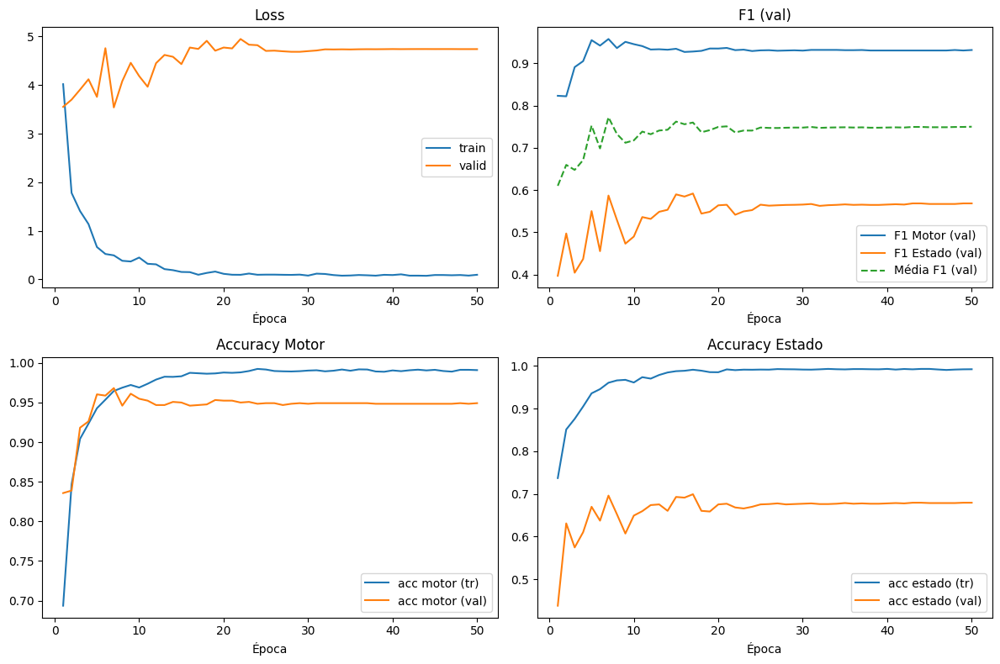

In [10]:
# =========================================
# 9) Treinar/avaliar um modelo neural (CHECKPOINT + MÉTRICAS)
#    model_type ∈ {"lstm","rnn","transf","resnet"}  (+ "crnn","tinyvit" se adicionados)
# =========================================
import random, numpy as np, pandas as pd, torch
from pathlib import Path
from tqdm.auto import tqdm
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# ---------- Hiperparâmetros de features ----------
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256

# ---------- Modelo a rodar ----------
MODEL_TO_RUN = "lstm"   # "lstm" | "rnn" | "transf" | "resnet" | ("crnn","tinyvit" se definidos)

# ---------- Diretório de checkpoints + CSV ----------
CKPT_DIR = Path(ROOT_DIR) / f"ckp_{MODEL_TO_RUN}"
CKPT_DIR.mkdir(parents=True, exist_ok=True)
HIST_PATH = CKPT_DIR / "metrics_history.csv"

# ---------- Utilidades de checkpoint ----------
def ensure_parent_dir(path: Path):
    Path(path).parent.mkdir(parents=True, exist_ok=True)

def _latest_ckpt(ckpt_dir: Path):
    pats = sorted(ckpt_dir.glob("epoch_*.pt"))
    return pats[-1] if pats else None

def _save_ckpt(ckpt_path: Path, epoch, model, opt, sch, best_score, history=None):
    ensure_parent_dir(ckpt_path)
    state = {
        "epoch": epoch,
        "model": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scheduler": sch.state_dict() if sch is not None else None,
        "best_score": best_score,
        "history": history,   # histórico até esta época
        "rng": {
            "torch": torch.get_rng_state(),
            "cuda": torch.cuda.get_rng_state_all() if torch.cuda.is_available() else None,
            "numpy": np.random.get_state(),
            "random": random.getstate(),
        }
    }
    torch.save(state, ckpt_path)

def _load_ckpt(ckpt_path: Path, model, opt, sch):
    state = torch.load(ckpt_path, map_location="cpu")
    model.load_state_dict(state["model"])
    if opt is not None and state.get("optimizer"): opt.load_state_dict(state["optimizer"])
    if sch is not None and state.get("scheduler") is not None: sch.load_state_dict(state["scheduler"])
    # RNG (opcional)
    rng = state.get("rng", {})
    if rng.get("torch") is not None: torch.set_rng_state(rng["torch"])
    if torch.cuda.is_available() and rng.get("cuda") is not None: torch.cuda.set_rng_state_all(rng["cuda"])
    if rng.get("numpy") is not None: np.random.set_state(rng["numpy"])
    if rng.get("random") is not None: random.setstate(rng["random"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_score  = float(state.get("best_score", -1.0))
    history     = state.get("history", None)
    return start_epoch, best_score, history

# ---------- Loop de treino com checkpoint + métricas ----------
def train_multitask_torch_with_ckpt(
    df_labels, state_meta, model_type="lstm",
    # features
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    # treino
    batch_size=32, epochs=50, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=None, seed=123,
    # checkpoint
    ckpt_dir: Path = CKPT_DIR,
    resume=True, ckpt_interval=1
):
    # garantir pasta de ckpt
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    hist_csv_path = ckpt_dir / "metrics_history.csv"

    # ==== split por arquivo ====
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"] = "train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS = 0  # evita erros com Py3.12/Colab
    dl_tr = torch.utils.data.DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                                        num_workers=NUM_WORKERS, persistent_workers=False,
                                        pin_memory=torch.cuda.is_available())
    dl_te = torch.utils.data.DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                                        num_workers=NUM_WORKERS, persistent_workers=False,
                                        pin_memory=torch.cuda.is_available())

    # modelo
    model = build_model(model_type, n_mels, state_meta).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = torch.nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    # ==== histórico de métricas ====
    hist = []  # lista de dicts (um por época)

    # ==== Resume de checkpoint (se existir) ====
    start_epoch = 1
    best = {"score": -1.0, "state": None}
    if resume:
        last = _latest_ckpt(ckpt_dir)
        if last is not None:
            start_epoch, best["score"], hist_loaded = _load_ckpt(last, model, opt, sch)
            if hist_loaded is not None:
                hist = hist_loaded
            elif hist_csv_path.exists():  # fallback no CSV
                try: hist = pd.read_csv(hist_csv_path).to_dict(orient="records")
                except Exception: pass
            print(f"[ckpt] retomando de {last.name} -> start_epoch={start_epoch}, best_score={best['score']:.3f}")
        else:
            print("[ckpt] nenhum checkpoint encontrado; iniciando do zero.")
    else:
        print("[ckpt] resume desativado; iniciando do zero.")

    # ---- loop de uma época ----
    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                logits_motor, logits_state_pad = model(xb, motor_k=k)

                # motor
                loss_motor = crit_motor(logits_motor, y_m)

                # estado (FocalLoss por cabeça; corta para Ck)
                loss_state = 0.0
                for ki in range(1,6):
                    mask = (k == ki)
                    if mask.any():
                        Ck = len(state_meta[ki]["codes"])
                        logits_k = logits_state_pad[mask, :Ck]
                        y_s_k   = y_s[mask]
                        w_k = w_states.get(ki, None)
                        crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                        loss_state = loss_state + crit_k(logits_k, y_s_k)

                loss = alpha_motor*loss_motor + alpha_state*loss_state
                if train:
                    opt.zero_grad(); loss.backward(); opt.step()

            losses.append(loss.item())
            # métricas rápidas (segmentos)
            yM_true.extend(y_m.detach().cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).detach().cpu().numpy().tolist())
            yS_true_all.extend(y_s.detach().cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).detach().cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    ep_iter = range(start_epoch, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino ({model_type})")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        sch.step(te_loss)

        # ---- registrar métricas desta época ----
        row = {
            "epoch": ep,
            "tr_loss": tr_loss, "tr_acc_motor": tr_accM, "tr_f1_motor": tr_f1M,
            "tr_acc_state": tr_accS, "tr_f1_state": tr_f1S,
            "te_loss": te_loss, "te_acc_motor": te_accM, "te_f1_motor": te_f1M,
            "te_acc_state": te_accS, "te_f1_state": te_f1S,
            "score_avg_f1": (te_f1M + te_f1S)/2.0
        }
        hist.append(row)
        ensure_parent_dir(hist_csv_path)
        pd.DataFrame(hist).to_csv(hist_csv_path, index=False)

        msg = (f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
               f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
               f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
               f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})")
        tqdm.write(msg)

        # ---- checkpoint por época (com histórico) ----
        if ckpt_interval and (ep % ckpt_interval == 0):
            ckpt_path = ckpt_dir / f"epoch_{ep:03d}.pt"
            _save_ckpt(ckpt_path, ep, model, opt, sch, best_score=best["score"], history=hist)
            _save_ckpt(ckpt_dir / "last.pt", ep, model, opt, sch, best_score=best["score"], history=hist)

        # ---- acompanhar "melhor" e salvar melhor estado (export) ----
        score = row["score_avg_f1"]
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}
            if save_path:
                ensure_parent_dir(save_path)
                torch.save({"epoch": ep, "best_score": score, "state": best["state"]}, save_path)
                tqdm.write(f"[melhor] ep={ep} score={score:.3f} -> salvo best em: {save_path}")

    # restaurar melhor
    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"[{model_type}] Melhor score (avg F1 M+S): {best['score']:.3f} | best={save_path}")

    # ---- Relatórios finais (segmentos) ----
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true))
        namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
    eval_segments()

    return model, (dl_tr, dl_te), df_labels

# ----------------- EXECUÇÃO COM CHECKPOINT + MÉTRICAS -----------------
model_torch, loaders_torch, dfMT = train_multitask_torch_with_ckpt(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    model_type=MODEL_TO_RUN,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=32, epochs=50, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=Path(ROOT_DIR)/f"model_{MODEL_TO_RUN}.pt",
    seed=123,
    ckpt_dir=CKPT_DIR,   # /content/drive/.../ckp_{nome_do_modelo}
    resume=True,         # retoma automaticamente se existir "epoch_XXX.pt" ou "last.pt"
    ckpt_interval=1      # salva TODO epoch
)

# -------- Avaliação por arquivo --------
eval_file_level(model_torch, loaders_torch[1], state_meta)
print(f"\nHistórico salvo em: {HIST_PATH}")

# -------- (opcional) Curvas de treino --------
if HIST_PATH.exists():
    hist = pd.read_csv(HIST_PATH)
    fig, axes = plt.subplots(2, 2, figsize=(12,8))
    axes = axes.ravel()

    axes[0].plot(hist["epoch"], hist["tr_loss"], label="train")
    axes[0].plot(hist["epoch"], hist["te_loss"], label="valid")
    axes[0].set_title("Loss"); axes[0].set_xlabel("Época"); axes[0].legend()

    axes[1].plot(hist["epoch"], hist["te_f1_motor"], label="F1 Motor (val)")
    axes[1].plot(hist["epoch"], hist["te_f1_state"], label="F1 Estado (val)")
    axes[1].plot(hist["epoch"], hist["score_avg_f1"], label="Média F1 (val)", linestyle="--")
    axes[1].set_title("F1 (val)"); axes[1].set_xlabel("Época"); axes[1].legend()

    axes[2].plot(hist["epoch"], hist["tr_acc_motor"], label="acc motor (tr)")
    axes[2].plot(hist["epoch"], hist["te_acc_motor"], label="acc motor (val)")
    axes[2].set_title("Accuracy Motor"); axes[2].set_xlabel("Época"); axes[2].legend()

    axes[3].plot(hist["epoch"], hist["tr_acc_state"], label="acc estado (tr)")
    axes[3].plot(hist["epoch"], hist["te_acc_state"], label="acc estado (val)")
    axes[3].set_title("Accuracy Estado"); axes[3].set_xlabel("Época"); axes[3].legend()

    plt.tight_layout(); plt.show()
else:
    print("CSV de métricas ainda não existe. Treine pelo menos 1 época.")


In [11]:
# =========================================
# 10) Pipeline Tradicional (scikit-learn)
# =========================================
def extract_features_file(wav_path, sr=44100, n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000):
    y, srr = sf.read(str(wav_path), always_2d=False)
    if y.ndim>1: y = y.mean(axis=1)
    y = y.astype(np.float32)
    if srr != sr: y = librosa.resample(y, orig_sr=srr, target_sr=sr)
    # Log-mel
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=n_fft, hop_length=hop,
                                       n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0)
    S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
    # MFCC
    MF = librosa.feature.mfcc(S=librosa.power_to_db(S), sr=sr, n_mfcc=20).astype(np.float32)
    # Estatísticas
    feats = []
    for M in [S_db]:
        feats.extend(M.mean(axis=1))
        feats.extend(np.median(M, axis=1))
        feats.extend(M.std(axis=1))
    for M in [MF]:
        feats.extend(M.mean(axis=1))
        feats.extend(M.std(axis=1))
    # energia/brilho/esparsidade
    feats.append(np.mean(np.abs(y)))
    feats.append(np.sqrt(np.mean(y**2)))
    # esparsidade espectral
    mag = np.abs(np.fft.rfft(y))
    if mag.sum() > 0:
        feats.append(np.sqrt(np.mean(mag**2))/ (mag.mean()+1e-6))
    else:
        feats.append(0.0)
    return np.array(feats, dtype=np.float32)

def split_by_file_for_sklearn(df_labels, seed=123):
    # split por arquivo baseado em motor_idx
    y = df_labels["motor_idx"].to_numpy()
    tr, te = safe_split_by_class(y, test_size=0.2, random_state=seed)
    dfL = df_labels.reset_index(drop=True).copy()
    dfL["split"] = "train"; dfL.loc[te,"split"]="test"
    return dfL

def build_feature_matrix(dfL, sr=44100, n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000):
    # X, y_motor, y_state (índice de estado conforme motor)
    rows = []
    it = dfL.itertuples()
    if USE_TQDM: it = tqdm(it, total=len(dfL), desc="extraindo feats (file)")
    for r in it:
        x = extract_features_file(r.wav_path, sr, n_mels, n_fft, hop, fmin, fmax)
        rows.append((x, r.motor_idx, r.which_motor, r.state_code, r.state_idx, r.file_name))
    X = np.stack([t[0] for t in rows], 0)
    yM = np.array([t[1] for t in rows], int)
    which = np.array([t[2] for t in rows], str)
    state_code = np.array([t[3] for t in rows], int)
    state_idx  = np.array([t[4] for t in rows], int)
    files = [t[5] for t in rows]
    return X, yM, which, state_code, state_idx, files

def train_traditional(df_labels, state_meta,
                      sr=44100, n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000):
    dfL = split_by_file_for_sklearn(df_labels, seed=SEED)
    X, yM, which, state_code, state_idx, files = build_feature_matrix(dfL, sr, n_mels, n_fft, hop, fmin, fmax)
    tr_mask = (dfL["split"].to_numpy() == "train")
    te_mask = ~tr_mask

    X_tr, X_te = X[tr_mask], X[te_mask]
    yM_tr, yM_te = yM[tr_mask], yM[te_mask]
    which_tr, which_te = which[tr_mask], which[te_mask]
    sidx_tr, sidx_te = state_idx[tr_mask], state_idx[te_mask]

    # Escalonador global
    scaler = StandardScaler().fit(X_tr)
    Xtr = scaler.transform(X_tr); Xte = scaler.transform(X_te)

    # (1) Motor
    clf_motor = LogisticRegression(max_iter=2000, multi_class="multinomial")
    clf_motor.fit(Xtr, yM_tr)
    yM_pred = clf_motor.predict(Xte)

    print("\n=== Tradicional (file-level): MOTOR ===")
    labsM = sorted(np.unique(yM_te))
    namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
    print(classification_report(yM_te, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
    print("Confusão (motor):\n", confusion_matrix(yM_te, yM_pred, labels=labsM))

    # (2) Estado: classificador por motor
    state_models = {}
    for k in range(1,6):
        mask = (which_tr == f"M{k}")
        if mask.sum() < 2:
            state_models[k] = None
            continue
        Ck = len(state_meta[k]["codes"])
        clf = LogisticRegression(max_iter=2000, multi_class="multinomial")
        clf.fit(Xtr[mask], sidx_tr[mask])
        state_models[k] = (clf, Ck)

    # Avaliação do estado usando motor PREVISTO
    yS_true, yS_pred = [], []
    for i in range(len(Xte)):
        k_pred = int(yM_pred[i]) + 1  # 1..5
        pair = state_models.get(k_pred, None)
        if pair is None:
            # fallback: chuta classe 0 desse motor
            yS_pred.append(0)
        else:
            clf, Ck = pair
            s_hat = clf.predict(Xte[i:i+1])[0]
            yS_pred.append(int(s_hat))
        yS_true.append(int(sidx_te[i]))

    print("\n=== Tradicional (file-level): ESTADO (condicional ao motor previsto) ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))
    return {"scaler": scaler, "clf_motor": clf_motor, "state_models": state_models}

# Rodar treinamento tradicional
trad_models = train_traditional(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    sr=44100, n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000
)


extraindo feats (file):   0%|          | 0/109 [00:00<?, ?it/s]


=== Tradicional (file-level): MOTOR ===
              precision    recall  f1-score   support

          M1       0.91      1.00      0.95        10
          M2       1.00      0.67      0.80         3
          M3       1.00      1.00      1.00         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           0.95        21
   macro avg       0.98      0.93      0.95        21
weighted avg       0.96      0.95      0.95        21

Confusão (motor):
 [[10  0  0  0  0]
 [ 1  2  0  0  0]
 [ 0  0  3  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== Tradicional (file-level): ESTADO (condicional ao motor previsto) ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.71      1.00      0.83        10
           2       1.00      0.67      0.80         3
           3       0.50      0.50      0.50         4
           4   

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi

### RNN

Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] nenhum checkpoint encontrado; iniciando do zero.


Treino (rnn):   0%|          | 0/50 [00:00<?, ?it/s]

train ep01:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/40 [00:00<?, ?it/s]

[01] loss_tr=3.6725 M(tr acc=0.731 f1=0.732) S(tr acc=0.753 f1=0.685) | loss_te=3.7940 M(te acc=0.863 f1=0.843) S(te acc=0.594 f1=0.406)
[melhor] ep=1 score=0.624 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_rnn.pt


train ep02:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/40 [00:00<?, ?it/s]

[02] loss_tr=1.5493 M(tr acc=0.878 f1=0.872) S(tr acc=0.880 f1=0.833) | loss_te=3.1250 M(te acc=0.948 f1=0.938) S(te acc=0.681 f1=0.615)
[melhor] ep=2 score=0.777 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_rnn.pt


train ep03:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/40 [00:00<?, ?it/s]

[03] loss_tr=1.3022 M(tr acc=0.903 f1=0.898) S(tr acc=0.900 f1=0.865) | loss_te=4.0827 M(te acc=0.939 f1=0.929) S(te acc=0.650 f1=0.524)


train ep04:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/40 [00:00<?, ?it/s]

[04] loss_tr=1.0588 M(tr acc=0.937 f1=0.933) S(tr acc=0.927 f1=0.899) | loss_te=4.1863 M(te acc=0.972 f1=0.966) S(te acc=0.655 f1=0.559)


train ep05:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/40 [00:00<?, ?it/s]

[05] loss_tr=0.9165 M(tr acc=0.943 f1=0.939) S(tr acc=0.937 f1=0.911) | loss_te=3.3664 M(te acc=0.971 f1=0.969) S(te acc=0.647 f1=0.572)


train ep06:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/40 [00:00<?, ?it/s]

[06] loss_tr=0.4685 M(tr acc=0.964 f1=0.961) S(tr acc=0.960 f1=0.947) | loss_te=4.1880 M(te acc=0.989 f1=0.987) S(te acc=0.656 f1=0.546)


train ep07:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/40 [00:00<?, ?it/s]

[07] loss_tr=0.2883 M(tr acc=0.971 f1=0.969) S(tr acc=0.970 f1=0.963) | loss_te=3.9530 M(te acc=0.976 f1=0.974) S(te acc=0.665 f1=0.584)
[melhor] ep=7 score=0.779 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_rnn.pt


train ep08:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/40 [00:00<?, ?it/s]

[08] loss_tr=0.3033 M(tr acc=0.977 f1=0.975) S(tr acc=0.976 f1=0.970) | loss_te=4.2865 M(te acc=0.977 f1=0.972) S(te acc=0.671 f1=0.558)


train ep09:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/40 [00:00<?, ?it/s]

[09] loss_tr=0.1964 M(tr acc=0.978 f1=0.977) S(tr acc=0.979 f1=0.974) | loss_te=4.3888 M(te acc=0.982 f1=0.976) S(te acc=0.652 f1=0.525)


train ep10:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/40 [00:00<?, ?it/s]

[10] loss_tr=0.1845 M(tr acc=0.980 f1=0.978) S(tr acc=0.984 f1=0.980) | loss_te=4.4340 M(te acc=0.978 f1=0.972) S(te acc=0.655 f1=0.538)


train ep11:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/40 [00:00<?, ?it/s]

[11] loss_tr=0.1618 M(tr acc=0.981 f1=0.980) S(tr acc=0.988 f1=0.985) | loss_te=4.4065 M(te acc=0.982 f1=0.977) S(te acc=0.656 f1=0.554)


train ep12:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/40 [00:00<?, ?it/s]

[12] loss_tr=0.1912 M(tr acc=0.987 f1=0.985) S(tr acc=0.984 f1=0.981) | loss_te=4.4589 M(te acc=0.979 f1=0.974) S(te acc=0.652 f1=0.544)


train ep13:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/40 [00:00<?, ?it/s]

[13] loss_tr=0.1425 M(tr acc=0.983 f1=0.983) S(tr acc=0.986 f1=0.983) | loss_te=4.6338 M(te acc=0.983 f1=0.975) S(te acc=0.663 f1=0.556)


train ep14:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/40 [00:00<?, ?it/s]

[14] loss_tr=0.1564 M(tr acc=0.984 f1=0.982) S(tr acc=0.988 f1=0.984) | loss_te=4.4622 M(te acc=0.971 f1=0.963) S(te acc=0.663 f1=0.568)


train ep15:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/40 [00:00<?, ?it/s]

[15] loss_tr=0.1500 M(tr acc=0.984 f1=0.983) S(tr acc=0.987 f1=0.984) | loss_te=4.4508 M(te acc=0.978 f1=0.970) S(te acc=0.660 f1=0.569)


train ep16:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/40 [00:00<?, ?it/s]

[16] loss_tr=0.1586 M(tr acc=0.985 f1=0.985) S(tr acc=0.985 f1=0.982) | loss_te=4.5547 M(te acc=0.977 f1=0.969) S(te acc=0.654 f1=0.549)


train ep17:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/40 [00:00<?, ?it/s]

[17] loss_tr=0.1098 M(tr acc=0.988 f1=0.987) S(tr acc=0.990 f1=0.988) | loss_te=4.5494 M(te acc=0.974 f1=0.964) S(te acc=0.659 f1=0.554)


train ep18:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/40 [00:00<?, ?it/s]

[18] loss_tr=0.1051 M(tr acc=0.990 f1=0.990) S(tr acc=0.992 f1=0.990) | loss_te=4.5587 M(te acc=0.976 f1=0.968) S(te acc=0.658 f1=0.556)


train ep19:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/40 [00:00<?, ?it/s]

[19] loss_tr=0.1142 M(tr acc=0.987 f1=0.987) S(tr acc=0.989 f1=0.986) | loss_te=4.5025 M(te acc=0.976 f1=0.969) S(te acc=0.659 f1=0.559)


train ep20:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/40 [00:00<?, ?it/s]

[20] loss_tr=0.1087 M(tr acc=0.986 f1=0.986) S(tr acc=0.993 f1=0.991) | loss_te=4.4583 M(te acc=0.975 f1=0.967) S(te acc=0.666 f1=0.568)


train ep21:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep21:   0%|          | 0/40 [00:00<?, ?it/s]

[21] loss_tr=0.1193 M(tr acc=0.988 f1=0.987) S(tr acc=0.991 f1=0.987) | loss_te=4.5009 M(te acc=0.975 f1=0.966) S(te acc=0.661 f1=0.559)


train ep22:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep22:   0%|          | 0/40 [00:00<?, ?it/s]

[22] loss_tr=0.1038 M(tr acc=0.990 f1=0.990) S(tr acc=0.992 f1=0.988) | loss_te=4.6000 M(te acc=0.975 f1=0.967) S(te acc=0.660 f1=0.554)


train ep23:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep23:   0%|          | 0/40 [00:00<?, ?it/s]

[23] loss_tr=0.1067 M(tr acc=0.988 f1=0.988) S(tr acc=0.991 f1=0.989) | loss_te=4.5362 M(te acc=0.973 f1=0.964) S(te acc=0.663 f1=0.558)


train ep24:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep24:   0%|          | 0/40 [00:00<?, ?it/s]

[24] loss_tr=0.1081 M(tr acc=0.988 f1=0.986) S(tr acc=0.991 f1=0.989) | loss_te=4.5638 M(te acc=0.974 f1=0.965) S(te acc=0.663 f1=0.560)


train ep25:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep25:   0%|          | 0/40 [00:00<?, ?it/s]

[25] loss_tr=0.0900 M(tr acc=0.991 f1=0.990) S(tr acc=0.991 f1=0.988) | loss_te=4.5608 M(te acc=0.975 f1=0.968) S(te acc=0.663 f1=0.559)


train ep26:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep26:   0%|          | 0/40 [00:00<?, ?it/s]

[26] loss_tr=0.0951 M(tr acc=0.988 f1=0.988) S(tr acc=0.992 f1=0.989) | loss_te=4.5720 M(te acc=0.975 f1=0.967) S(te acc=0.663 f1=0.562)


train ep27:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep27:   0%|          | 0/40 [00:00<?, ?it/s]

[27] loss_tr=0.1020 M(tr acc=0.988 f1=0.987) S(tr acc=0.992 f1=0.990) | loss_te=4.5875 M(te acc=0.975 f1=0.968) S(te acc=0.661 f1=0.557)


train ep28:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep28:   0%|          | 0/40 [00:00<?, ?it/s]

[28] loss_tr=0.0964 M(tr acc=0.988 f1=0.988) S(tr acc=0.991 f1=0.990) | loss_te=4.6140 M(te acc=0.975 f1=0.967) S(te acc=0.661 f1=0.557)


train ep29:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep29:   0%|          | 0/40 [00:00<?, ?it/s]

[29] loss_tr=0.0719 M(tr acc=0.990 f1=0.990) S(tr acc=0.995 f1=0.994) | loss_te=4.6132 M(te acc=0.975 f1=0.967) S(te acc=0.661 f1=0.558)


train ep30:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep30:   0%|          | 0/40 [00:00<?, ?it/s]

[30] loss_tr=0.0874 M(tr acc=0.990 f1=0.989) S(tr acc=0.992 f1=0.989) | loss_te=4.6112 M(te acc=0.975 f1=0.967) S(te acc=0.661 f1=0.558)


train ep31:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep31:   0%|          | 0/40 [00:00<?, ?it/s]

[31] loss_tr=0.0835 M(tr acc=0.990 f1=0.990) S(tr acc=0.994 f1=0.992) | loss_te=4.6066 M(te acc=0.976 f1=0.968) S(te acc=0.661 f1=0.558)


train ep32:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep32:   0%|          | 0/40 [00:00<?, ?it/s]

[32] loss_tr=0.0835 M(tr acc=0.989 f1=0.988) S(tr acc=0.994 f1=0.992) | loss_te=4.6087 M(te acc=0.975 f1=0.967) S(te acc=0.663 f1=0.560)


train ep33:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep33:   0%|          | 0/40 [00:00<?, ?it/s]

[33] loss_tr=0.1151 M(tr acc=0.988 f1=0.988) S(tr acc=0.991 f1=0.988) | loss_te=4.6003 M(te acc=0.975 f1=0.967) S(te acc=0.663 f1=0.560)


train ep34:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep34:   0%|          | 0/40 [00:00<?, ?it/s]

[34] loss_tr=0.1000 M(tr acc=0.989 f1=0.988) S(tr acc=0.991 f1=0.987) | loss_te=4.5996 M(te acc=0.976 f1=0.969) S(te acc=0.663 f1=0.559)


train ep35:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep35:   0%|          | 0/40 [00:00<?, ?it/s]

[35] loss_tr=0.1071 M(tr acc=0.989 f1=0.989) S(tr acc=0.994 f1=0.992) | loss_te=4.5946 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep36:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep36:   0%|          | 0/40 [00:00<?, ?it/s]

[36] loss_tr=0.0901 M(tr acc=0.988 f1=0.987) S(tr acc=0.993 f1=0.989) | loss_te=4.5930 M(te acc=0.975 f1=0.968) S(te acc=0.663 f1=0.559)


train ep37:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep37:   0%|          | 0/40 [00:00<?, ?it/s]

[37] loss_tr=0.0813 M(tr acc=0.987 f1=0.986) S(tr acc=0.995 f1=0.994) | loss_te=4.5929 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep38:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep38:   0%|          | 0/40 [00:00<?, ?it/s]

[38] loss_tr=0.0976 M(tr acc=0.989 f1=0.988) S(tr acc=0.992 f1=0.989) | loss_te=4.5961 M(te acc=0.975 f1=0.967) S(te acc=0.662 f1=0.559)


train ep39:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep39:   0%|          | 0/40 [00:00<?, ?it/s]

[39] loss_tr=0.1121 M(tr acc=0.990 f1=0.990) S(tr acc=0.992 f1=0.990) | loss_te=4.5962 M(te acc=0.975 f1=0.967) S(te acc=0.662 f1=0.559)


train ep40:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep40:   0%|          | 0/40 [00:00<?, ?it/s]

[40] loss_tr=0.0951 M(tr acc=0.989 f1=0.988) S(tr acc=0.993 f1=0.992) | loss_te=4.5952 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep41:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep41:   0%|          | 0/40 [00:00<?, ?it/s]

[41] loss_tr=0.0884 M(tr acc=0.990 f1=0.989) S(tr acc=0.994 f1=0.992) | loss_te=4.5957 M(te acc=0.975 f1=0.967) S(te acc=0.662 f1=0.559)


train ep42:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep42:   0%|          | 0/40 [00:00<?, ?it/s]

[42] loss_tr=0.0745 M(tr acc=0.990 f1=0.991) S(tr acc=0.993 f1=0.993) | loss_te=4.5957 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep43:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep43:   0%|          | 0/40 [00:00<?, ?it/s]

[43] loss_tr=0.1021 M(tr acc=0.988 f1=0.988) S(tr acc=0.992 f1=0.990) | loss_te=4.5965 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep44:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep44:   0%|          | 0/40 [00:00<?, ?it/s]

[44] loss_tr=0.0867 M(tr acc=0.987 f1=0.987) S(tr acc=0.992 f1=0.991) | loss_te=4.5967 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep45:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep45:   0%|          | 0/40 [00:00<?, ?it/s]

[45] loss_tr=0.0774 M(tr acc=0.987 f1=0.987) S(tr acc=0.995 f1=0.994) | loss_te=4.5966 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep46:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep46:   0%|          | 0/40 [00:00<?, ?it/s]

[46] loss_tr=0.1033 M(tr acc=0.989 f1=0.988) S(tr acc=0.992 f1=0.990) | loss_te=4.5966 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep47:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep47:   0%|          | 0/40 [00:00<?, ?it/s]

[47] loss_tr=0.1042 M(tr acc=0.990 f1=0.989) S(tr acc=0.992 f1=0.990) | loss_te=4.5970 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep48:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep48:   0%|          | 0/40 [00:00<?, ?it/s]

[48] loss_tr=0.0790 M(tr acc=0.990 f1=0.989) S(tr acc=0.993 f1=0.990) | loss_te=4.5971 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep49:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep49:   0%|          | 0/40 [00:00<?, ?it/s]

[49] loss_tr=0.0889 M(tr acc=0.989 f1=0.988) S(tr acc=0.993 f1=0.991) | loss_te=4.5970 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)


train ep50:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep50:   0%|          | 0/40 [00:00<?, ?it/s]

[50] loss_tr=0.1006 M(tr acc=0.990 f1=0.989) S(tr acc=0.992 f1=0.989) | loss_te=4.5971 M(te acc=0.975 f1=0.968) S(te acc=0.662 f1=0.559)
[rnn] Melhor score (avg F1 M+S): 0.779 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/model_rnn.pt


aval seg:   0%|          | 0/40 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.99      1.00      0.99       600
          M2       0.92      0.96      0.94       180
          M3       1.00      0.92      0.96       180
          M4       0.98      0.95      0.97       180
          M5       0.96      1.00      0.98       120

    accuracy                           0.98      1260
   macro avg       0.97      0.97      0.97      1260
weighted avg       0.98      0.98      0.98      1260

Confusão (motor):
 [[599   0   0   1   0]
 [  5 173   0   2   0]
 [  2  12 166   0   0]
 [  1   3   0 171   5]
 [  0   0   0   0 120]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       0.90      0.33      0.49       180
           1       0.69      0.90      0.78       600
           2       0.94      0.47      0.63       180
           3       0.54      0.51      0.52       240
           4       0.31      0.48      0.38 

agregando por arquivo:   0%|          | 0/40 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       1.00      1.00      1.00         3
          M3       1.00      1.00      1.00         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  0  3  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.69      0.90      0.78        10
           2       1.00      0.67      0.80         3
           3       0.67      0.50      0.57         4
           4       0.50      1.00      0.67         1

    accu

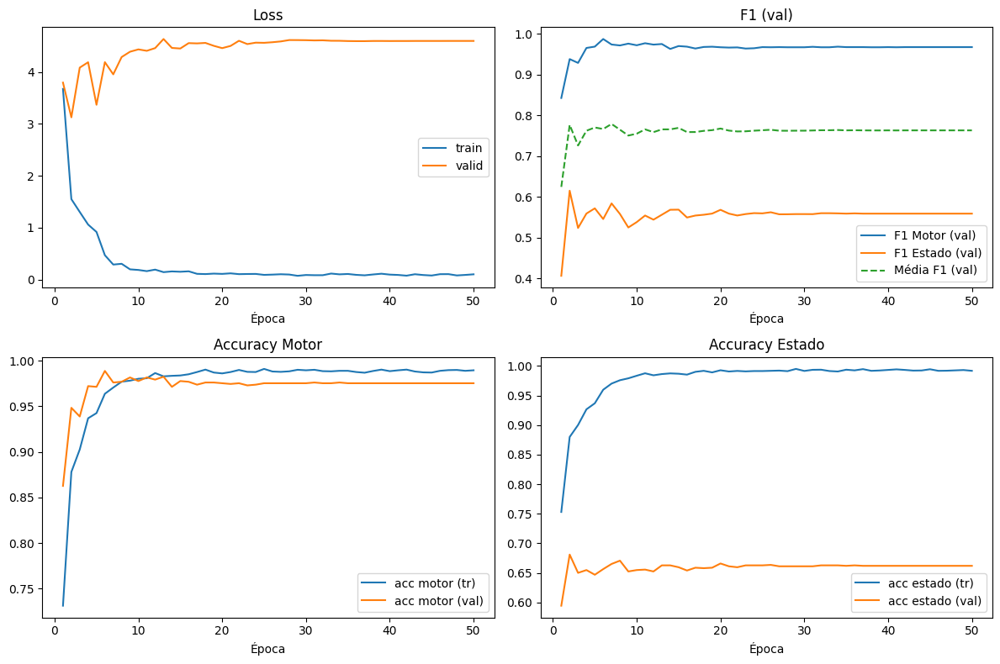

In [12]:
# =========================================
# 9) Treinar/avaliar um modelo neural (CHECKPOINT + MÉTRICAS)
#    model_type ∈ {"lstm","rnn","transf","resnet"}  (+ "crnn","tinyvit" se adicionados)
# =========================================
import random, numpy as np, pandas as pd, torch
from pathlib import Path
from tqdm.auto import tqdm
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# ---------- Hiperparâmetros de features ----------
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256

# ---------- Modelo a rodar ----------
MODEL_TO_RUN = "rnn"   # "lstm" | "rnn" | "transf" | "resnet" | ("crnn","tinyvit" se definidos)

# ---------- Diretório de checkpoints + CSV ----------
CKPT_DIR = Path(ROOT_DIR) / f"ckp_{MODEL_TO_RUN}"
CKPT_DIR.mkdir(parents=True, exist_ok=True)
HIST_PATH = CKPT_DIR / "metrics_history.csv"

# ---------- Utilidades de checkpoint ----------
def ensure_parent_dir(path: Path):
    Path(path).parent.mkdir(parents=True, exist_ok=True)

def _latest_ckpt(ckpt_dir: Path):
    pats = sorted(ckpt_dir.glob("epoch_*.pt"))
    return pats[-1] if pats else None

def _save_ckpt(ckpt_path: Path, epoch, model, opt, sch, best_score, history=None):
    ensure_parent_dir(ckpt_path)
    state = {
        "epoch": epoch,
        "model": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scheduler": sch.state_dict() if sch is not None else None,
        "best_score": best_score,
        "history": history,   # histórico até esta época
        "rng": {
            "torch": torch.get_rng_state(),
            "cuda": torch.cuda.get_rng_state_all() if torch.cuda.is_available() else None,
            "numpy": np.random.get_state(),
            "random": random.getstate(),
        }
    }
    torch.save(state, ckpt_path)

def _load_ckpt(ckpt_path: Path, model, opt, sch):
    state = torch.load(ckpt_path, map_location="cpu")
    model.load_state_dict(state["model"])
    if opt is not None and state.get("optimizer"): opt.load_state_dict(state["optimizer"])
    if sch is not None and state.get("scheduler") is not None: sch.load_state_dict(state["scheduler"])
    # RNG (opcional)
    rng = state.get("rng", {})
    if rng.get("torch") is not None: torch.set_rng_state(rng["torch"])
    if torch.cuda.is_available() and rng.get("cuda") is not None: torch.cuda.set_rng_state_all(rng["cuda"])
    if rng.get("numpy") is not None: np.random.set_state(rng["numpy"])
    if rng.get("random") is not None: random.setstate(rng["random"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_score  = float(state.get("best_score", -1.0))
    history     = state.get("history", None)
    return start_epoch, best_score, history

# ---------- Loop de treino com checkpoint + métricas ----------
def train_multitask_torch_with_ckpt(
    df_labels, state_meta, model_type="lstm",
    # features
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    # treino
    batch_size=32, epochs=50, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=None, seed=123,
    # checkpoint
    ckpt_dir: Path = CKPT_DIR,
    resume=True, ckpt_interval=1
):
    # garantir pasta de ckpt
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    hist_csv_path = ckpt_dir / "metrics_history.csv"

    # ==== split por arquivo ====
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"] = "train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS = 0  # evita erros com Py3.12/Colab
    dl_tr = torch.utils.data.DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                                        num_workers=NUM_WORKERS, persistent_workers=False,
                                        pin_memory=torch.cuda.is_available())
    dl_te = torch.utils.data.DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                                        num_workers=NUM_WORKERS, persistent_workers=False,
                                        pin_memory=torch.cuda.is_available())

    # modelo
    model = build_model(model_type, n_mels, state_meta).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = torch.nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    # ==== histórico de métricas ====
    hist = []  # lista de dicts (um por época)

    # ==== Resume de checkpoint (se existir) ====
    start_epoch = 1
    best = {"score": -1.0, "state": None}
    if resume:
        last = _latest_ckpt(ckpt_dir)
        if last is not None:
            start_epoch, best["score"], hist_loaded = _load_ckpt(last, model, opt, sch)
            if hist_loaded is not None:
                hist = hist_loaded
            elif hist_csv_path.exists():  # fallback no CSV
                try: hist = pd.read_csv(hist_csv_path).to_dict(orient="records")
                except Exception: pass
            print(f"[ckpt] retomando de {last.name} -> start_epoch={start_epoch}, best_score={best['score']:.3f}")
        else:
            print("[ckpt] nenhum checkpoint encontrado; iniciando do zero.")
    else:
        print("[ckpt] resume desativado; iniciando do zero.")

    # ---- loop de uma época ----
    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                logits_motor, logits_state_pad = model(xb, motor_k=k)

                # motor
                loss_motor = crit_motor(logits_motor, y_m)

                # estado (FocalLoss por cabeça; corta para Ck)
                loss_state = 0.0
                for ki in range(1,6):
                    mask = (k == ki)
                    if mask.any():
                        Ck = len(state_meta[ki]["codes"])
                        logits_k = logits_state_pad[mask, :Ck]
                        y_s_k   = y_s[mask]
                        w_k = w_states.get(ki, None)
                        crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                        loss_state = loss_state + crit_k(logits_k, y_s_k)

                loss = alpha_motor*loss_motor + alpha_state*loss_state
                if train:
                    opt.zero_grad(); loss.backward(); opt.step()

            losses.append(loss.item())
            # métricas rápidas (segmentos)
            yM_true.extend(y_m.detach().cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).detach().cpu().numpy().tolist())
            yS_true_all.extend(y_s.detach().cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).detach().cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    ep_iter = range(start_epoch, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino ({model_type})")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        sch.step(te_loss)

        # ---- registrar métricas desta época ----
        row = {
            "epoch": ep,
            "tr_loss": tr_loss, "tr_acc_motor": tr_accM, "tr_f1_motor": tr_f1M,
            "tr_acc_state": tr_accS, "tr_f1_state": tr_f1S,
            "te_loss": te_loss, "te_acc_motor": te_accM, "te_f1_motor": te_f1M,
            "te_acc_state": te_accS, "te_f1_state": te_f1S,
            "score_avg_f1": (te_f1M + te_f1S)/2.0
        }
        hist.append(row)
        ensure_parent_dir(hist_csv_path)
        pd.DataFrame(hist).to_csv(hist_csv_path, index=False)

        msg = (f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
               f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
               f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
               f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})")
        tqdm.write(msg)

        # ---- checkpoint por época (com histórico) ----
        if ckpt_interval and (ep % ckpt_interval == 0):
            ckpt_path = ckpt_dir / f"epoch_{ep:03d}.pt"
            _save_ckpt(ckpt_path, ep, model, opt, sch, best_score=best["score"], history=hist)
            _save_ckpt(ckpt_dir / "last.pt", ep, model, opt, sch, best_score=best["score"], history=hist)

        # ---- acompanhar "melhor" e salvar melhor estado (export) ----
        score = row["score_avg_f1"]
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}
            if save_path:
                ensure_parent_dir(save_path)
                torch.save({"epoch": ep, "best_score": score, "state": best["state"]}, save_path)
                tqdm.write(f"[melhor] ep={ep} score={score:.3f} -> salvo best em: {save_path}")

    # restaurar melhor
    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"[{model_type}] Melhor score (avg F1 M+S): {best['score']:.3f} | best={save_path}")

    # ---- Relatórios finais (segmentos) ----
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true))
        namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
    eval_segments()

    return model, (dl_tr, dl_te), df_labels

# ----------------- EXECUÇÃO COM CHECKPOINT + MÉTRICAS -----------------
model_torch, loaders_torch, dfMT = train_multitask_torch_with_ckpt(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    model_type=MODEL_TO_RUN,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=32, epochs=50, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=Path(ROOT_DIR)/f"model_{MODEL_TO_RUN}.pt",
    seed=123,
    ckpt_dir=CKPT_DIR,   # /content/drive/.../ckp_{nome_do_modelo}
    resume=True,         # retoma automaticamente se existir "epoch_XXX.pt" ou "last.pt"
    ckpt_interval=1      # salva TODO epoch
)

# -------- Avaliação por arquivo --------
eval_file_level(model_torch, loaders_torch[1], state_meta)
print(f"\nHistórico salvo em: {HIST_PATH}")

# -------- (opcional) Curvas de treino --------
if HIST_PATH.exists():
    hist = pd.read_csv(HIST_PATH)
    fig, axes = plt.subplots(2, 2, figsize=(12,8))
    axes = axes.ravel()

    axes[0].plot(hist["epoch"], hist["tr_loss"], label="train")
    axes[0].plot(hist["epoch"], hist["te_loss"], label="valid")
    axes[0].set_title("Loss"); axes[0].set_xlabel("Época"); axes[0].legend()

    axes[1].plot(hist["epoch"], hist["te_f1_motor"], label="F1 Motor (val)")
    axes[1].plot(hist["epoch"], hist["te_f1_state"], label="F1 Estado (val)")
    axes[1].plot(hist["epoch"], hist["score_avg_f1"], label="Média F1 (val)", linestyle="--")
    axes[1].set_title("F1 (val)"); axes[1].set_xlabel("Época"); axes[1].legend()

    axes[2].plot(hist["epoch"], hist["tr_acc_motor"], label="acc motor (tr)")
    axes[2].plot(hist["epoch"], hist["te_acc_motor"], label="acc motor (val)")
    axes[2].set_title("Accuracy Motor"); axes[2].set_xlabel("Época"); axes[2].legend()

    axes[3].plot(hist["epoch"], hist["tr_acc_state"], label="acc estado (tr)")
    axes[3].plot(hist["epoch"], hist["te_acc_state"], label="acc estado (val)")
    axes[3].set_title("Accuracy Estado"); axes[3].set_xlabel("Época"); axes[3].legend()

    plt.tight_layout(); plt.show()
else:
    print("CSV de métricas ainda não existe. Treine pelo menos 1 época.")


# transf

Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] nenhum checkpoint encontrado; iniciando do zero.


Treino (transf):   0%|          | 0/50 [00:00<?, ?it/s]

train ep01:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/40 [00:00<?, ?it/s]

[01] loss_tr=5.7496 M(tr acc=0.564 f1=0.534) S(tr acc=0.618 f1=0.535) | loss_te=3.1887 M(te acc=0.817 f1=0.777) S(te acc=0.542 f1=0.465)
[melhor] ep=1 score=0.621 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_transf.pt


train ep02:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/40 [00:00<?, ?it/s]

[02] loss_tr=3.3097 M(tr acc=0.688 f1=0.675) S(tr acc=0.770 f1=0.708) | loss_te=4.0928 M(te acc=0.866 f1=0.853) S(te acc=0.636 f1=0.497)
[melhor] ep=2 score=0.675 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_transf.pt


train ep03:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/40 [00:00<?, ?it/s]

[03] loss_tr=2.9551 M(tr acc=0.762 f1=0.752) S(tr acc=0.787 f1=0.723) | loss_te=4.5017 M(te acc=0.729 f1=0.682) S(te acc=0.619 f1=0.455)


train ep04:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/40 [00:00<?, ?it/s]

[04] loss_tr=2.4366 M(tr acc=0.806 f1=0.791) S(tr acc=0.809 f1=0.754) | loss_te=4.1554 M(te acc=0.878 f1=0.851) S(te acc=0.635 f1=0.470)


train ep05:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/40 [00:00<?, ?it/s]

[05] loss_tr=1.1349 M(tr acc=0.905 f1=0.900) S(tr acc=0.904 f1=0.873) | loss_te=3.8875 M(te acc=0.941 f1=0.927) S(te acc=0.646 f1=0.525)
[melhor] ep=5 score=0.726 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_transf.pt


train ep06:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/40 [00:00<?, ?it/s]

[06] loss_tr=1.0709 M(tr acc=0.908 f1=0.903) S(tr acc=0.913 f1=0.884) | loss_te=4.5956 M(te acc=0.955 f1=0.938) S(te acc=0.644 f1=0.466)


train ep07:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/40 [00:00<?, ?it/s]

[07] loss_tr=0.7568 M(tr acc=0.939 f1=0.935) S(tr acc=0.929 f1=0.905) | loss_te=4.0212 M(te acc=0.952 f1=0.940) S(te acc=0.666 f1=0.562)
[melhor] ep=7 score=0.751 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_transf.pt


train ep08:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/40 [00:00<?, ?it/s]

[08] loss_tr=0.5337 M(tr acc=0.952 f1=0.949) S(tr acc=0.946 f1=0.932) | loss_te=3.9788 M(te acc=0.961 f1=0.956) S(te acc=0.653 f1=0.545)


train ep09:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/40 [00:00<?, ?it/s]

[09] loss_tr=0.6028 M(tr acc=0.954 f1=0.951) S(tr acc=0.951 f1=0.936) | loss_te=4.1028 M(te acc=0.960 f1=0.951) S(te acc=0.656 f1=0.550)


train ep10:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/40 [00:00<?, ?it/s]

[10] loss_tr=0.4630 M(tr acc=0.960 f1=0.957) S(tr acc=0.960 f1=0.947) | loss_te=4.2319 M(te acc=0.941 f1=0.932) S(te acc=0.640 f1=0.515)


train ep11:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/40 [00:00<?, ?it/s]

[11] loss_tr=0.3918 M(tr acc=0.966 f1=0.964) S(tr acc=0.968 f1=0.956) | loss_te=4.3003 M(te acc=0.936 f1=0.930) S(te acc=0.636 f1=0.524)


train ep12:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/40 [00:00<?, ?it/s]

[12] loss_tr=0.2998 M(tr acc=0.969 f1=0.967) S(tr acc=0.973 f1=0.964) | loss_te=3.9657 M(te acc=0.953 f1=0.943) S(te acc=0.654 f1=0.556)


train ep13:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/40 [00:00<?, ?it/s]

[13] loss_tr=0.3113 M(tr acc=0.966 f1=0.965) S(tr acc=0.971 f1=0.963) | loss_te=4.1206 M(te acc=0.949 f1=0.940) S(te acc=0.662 f1=0.538)


train ep14:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/40 [00:00<?, ?it/s]

[14] loss_tr=0.2845 M(tr acc=0.973 f1=0.972) S(tr acc=0.976 f1=0.971) | loss_te=4.0387 M(te acc=0.944 f1=0.940) S(te acc=0.655 f1=0.556)


train ep15:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/40 [00:00<?, ?it/s]

[15] loss_tr=0.2512 M(tr acc=0.973 f1=0.972) S(tr acc=0.978 f1=0.974) | loss_te=4.0669 M(te acc=0.933 f1=0.927) S(te acc=0.644 f1=0.549)


train ep16:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/40 [00:00<?, ?it/s]

[16] loss_tr=0.2790 M(tr acc=0.971 f1=0.969) S(tr acc=0.973 f1=0.969) | loss_te=4.2656 M(te acc=0.956 f1=0.949) S(te acc=0.655 f1=0.545)


train ep17:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/40 [00:00<?, ?it/s]

[17] loss_tr=0.2103 M(tr acc=0.974 f1=0.973) S(tr acc=0.981 f1=0.978) | loss_te=4.1758 M(te acc=0.948 f1=0.938) S(te acc=0.668 f1=0.567)
[melhor] ep=17 score=0.753 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_transf.pt


train ep18:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/40 [00:00<?, ?it/s]

[18] loss_tr=0.2355 M(tr acc=0.976 f1=0.975) S(tr acc=0.980 f1=0.978) | loss_te=4.1790 M(te acc=0.946 f1=0.932) S(te acc=0.674 f1=0.580)
[melhor] ep=18 score=0.756 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_transf.pt


train ep19:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/40 [00:00<?, ?it/s]

[19] loss_tr=0.2029 M(tr acc=0.978 f1=0.978) S(tr acc=0.982 f1=0.976) | loss_te=4.0750 M(te acc=0.942 f1=0.927) S(te acc=0.679 f1=0.605)
[melhor] ep=19 score=0.766 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_transf.pt


train ep20:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/40 [00:00<?, ?it/s]

[20] loss_tr=0.2154 M(tr acc=0.974 f1=0.972) S(tr acc=0.982 f1=0.978) | loss_te=4.0881 M(te acc=0.950 f1=0.938) S(te acc=0.668 f1=0.585)


train ep21:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep21:   0%|          | 0/40 [00:00<?, ?it/s]

[21] loss_tr=0.1732 M(tr acc=0.975 f1=0.974) S(tr acc=0.984 f1=0.980) | loss_te=4.2239 M(te acc=0.945 f1=0.931) S(te acc=0.667 f1=0.566)


train ep22:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep22:   0%|          | 0/40 [00:00<?, ?it/s]

[22] loss_tr=0.1847 M(tr acc=0.977 f1=0.975) S(tr acc=0.987 f1=0.984) | loss_te=4.1821 M(te acc=0.946 f1=0.932) S(te acc=0.654 f1=0.558)


train ep23:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep23:   0%|          | 0/40 [00:00<?, ?it/s]

[23] loss_tr=0.1828 M(tr acc=0.980 f1=0.980) S(tr acc=0.984 f1=0.980) | loss_te=4.1311 M(te acc=0.952 f1=0.941) S(te acc=0.660 f1=0.568)


train ep24:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep24:   0%|          | 0/40 [00:00<?, ?it/s]

[24] loss_tr=0.1720 M(tr acc=0.977 f1=0.976) S(tr acc=0.986 f1=0.983) | loss_te=4.1316 M(te acc=0.948 f1=0.936) S(te acc=0.659 f1=0.565)


train ep25:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep25:   0%|          | 0/40 [00:00<?, ?it/s]

[25] loss_tr=0.1885 M(tr acc=0.977 f1=0.976) S(tr acc=0.983 f1=0.980) | loss_te=4.1573 M(te acc=0.946 f1=0.932) S(te acc=0.666 f1=0.576)


train ep26:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep26:   0%|          | 0/40 [00:00<?, ?it/s]

[26] loss_tr=0.1644 M(tr acc=0.979 f1=0.979) S(tr acc=0.985 f1=0.981) | loss_te=4.1908 M(te acc=0.948 f1=0.934) S(te acc=0.663 f1=0.567)


train ep27:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep27:   0%|          | 0/40 [00:00<?, ?it/s]

[27] loss_tr=0.1791 M(tr acc=0.979 f1=0.978) S(tr acc=0.986 f1=0.983) | loss_te=4.1797 M(te acc=0.948 f1=0.933) S(te acc=0.663 f1=0.568)


train ep28:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep28:   0%|          | 0/40 [00:00<?, ?it/s]

[28] loss_tr=0.1675 M(tr acc=0.977 f1=0.976) S(tr acc=0.984 f1=0.981) | loss_te=4.1565 M(te acc=0.947 f1=0.932) S(te acc=0.663 f1=0.569)


train ep29:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep29:   0%|          | 0/40 [00:00<?, ?it/s]

[29] loss_tr=0.1853 M(tr acc=0.979 f1=0.979) S(tr acc=0.985 f1=0.982) | loss_te=4.1229 M(te acc=0.944 f1=0.928) S(te acc=0.663 f1=0.573)


train ep30:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep30:   0%|          | 0/40 [00:00<?, ?it/s]

[30] loss_tr=0.1667 M(tr acc=0.980 f1=0.979) S(tr acc=0.984 f1=0.982) | loss_te=4.1055 M(te acc=0.947 f1=0.933) S(te acc=0.663 f1=0.570)


train ep31:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep31:   0%|          | 0/40 [00:00<?, ?it/s]

[31] loss_tr=0.1612 M(tr acc=0.979 f1=0.978) S(tr acc=0.987 f1=0.982) | loss_te=4.1328 M(te acc=0.945 f1=0.930) S(te acc=0.663 f1=0.569)


train ep32:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep32:   0%|          | 0/40 [00:00<?, ?it/s]

[32] loss_tr=0.1774 M(tr acc=0.980 f1=0.980) S(tr acc=0.983 f1=0.980) | loss_te=4.1326 M(te acc=0.945 f1=0.930) S(te acc=0.662 f1=0.570)


train ep33:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep33:   0%|          | 0/40 [00:00<?, ?it/s]

[33] loss_tr=0.1631 M(tr acc=0.981 f1=0.981) S(tr acc=0.985 f1=0.982) | loss_te=4.1374 M(te acc=0.945 f1=0.930) S(te acc=0.662 f1=0.570)


train ep34:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep34:   0%|          | 0/40 [00:00<?, ?it/s]

[34] loss_tr=0.1849 M(tr acc=0.977 f1=0.977) S(tr acc=0.984 f1=0.981) | loss_te=4.1359 M(te acc=0.945 f1=0.930) S(te acc=0.662 f1=0.570)


train ep35:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep35:   0%|          | 0/40 [00:00<?, ?it/s]

[35] loss_tr=0.1754 M(tr acc=0.978 f1=0.977) S(tr acc=0.985 f1=0.980) | loss_te=4.1324 M(te acc=0.945 f1=0.930) S(te acc=0.662 f1=0.570)


train ep36:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep36:   0%|          | 0/40 [00:00<?, ?it/s]

[36] loss_tr=0.2074 M(tr acc=0.980 f1=0.979) S(tr acc=0.983 f1=0.979) | loss_te=4.1296 M(te acc=0.945 f1=0.930) S(te acc=0.664 f1=0.572)


train ep37:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep37:   0%|          | 0/40 [00:00<?, ?it/s]

[37] loss_tr=0.1794 M(tr acc=0.978 f1=0.978) S(tr acc=0.982 f1=0.978) | loss_te=4.1369 M(te acc=0.944 f1=0.929) S(te acc=0.663 f1=0.570)


train ep38:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep38:   0%|          | 0/40 [00:00<?, ?it/s]

[38] loss_tr=0.1840 M(tr acc=0.980 f1=0.979) S(tr acc=0.984 f1=0.982) | loss_te=4.1394 M(te acc=0.945 f1=0.930) S(te acc=0.663 f1=0.570)


train ep39:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep39:   0%|          | 0/40 [00:00<?, ?it/s]

[39] loss_tr=0.1750 M(tr acc=0.976 f1=0.975) S(tr acc=0.984 f1=0.981) | loss_te=4.1426 M(te acc=0.945 f1=0.930) S(te acc=0.662 f1=0.568)


train ep40:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep40:   0%|          | 0/40 [00:00<?, ?it/s]

[40] loss_tr=0.1758 M(tr acc=0.977 f1=0.977) S(tr acc=0.985 f1=0.982) | loss_te=4.1410 M(te acc=0.944 f1=0.929) S(te acc=0.663 f1=0.570)


train ep41:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep41:   0%|          | 0/40 [00:00<?, ?it/s]

[41] loss_tr=0.1850 M(tr acc=0.978 f1=0.976) S(tr acc=0.984 f1=0.979) | loss_te=4.1411 M(te acc=0.945 f1=0.930) S(te acc=0.663 f1=0.570)


train ep42:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep42:   0%|          | 0/40 [00:00<?, ?it/s]

[42] loss_tr=0.1660 M(tr acc=0.979 f1=0.977) S(tr acc=0.985 f1=0.983) | loss_te=4.1415 M(te acc=0.944 f1=0.929) S(te acc=0.662 f1=0.568)


train ep43:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep43:   0%|          | 0/40 [00:00<?, ?it/s]

[43] loss_tr=0.1838 M(tr acc=0.980 f1=0.979) S(tr acc=0.983 f1=0.979) | loss_te=4.1427 M(te acc=0.944 f1=0.929) S(te acc=0.662 f1=0.568)


train ep44:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep44:   0%|          | 0/40 [00:00<?, ?it/s]

[44] loss_tr=0.1834 M(tr acc=0.977 f1=0.976) S(tr acc=0.982 f1=0.979) | loss_te=4.1432 M(te acc=0.944 f1=0.929) S(te acc=0.662 f1=0.568)


train ep45:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep45:   0%|          | 0/40 [00:00<?, ?it/s]

[45] loss_tr=0.1577 M(tr acc=0.979 f1=0.979) S(tr acc=0.986 f1=0.982) | loss_te=4.1434 M(te acc=0.944 f1=0.929) S(te acc=0.661 f1=0.567)


train ep46:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep46:   0%|          | 0/40 [00:00<?, ?it/s]

[46] loss_tr=0.1844 M(tr acc=0.977 f1=0.977) S(tr acc=0.983 f1=0.979) | loss_te=4.1441 M(te acc=0.944 f1=0.929) S(te acc=0.662 f1=0.568)


train ep47:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep47:   0%|          | 0/40 [00:00<?, ?it/s]

[47] loss_tr=0.1873 M(tr acc=0.978 f1=0.978) S(tr acc=0.985 f1=0.980) | loss_te=4.1446 M(te acc=0.944 f1=0.929) S(te acc=0.662 f1=0.568)


train ep48:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep48:   0%|          | 0/40 [00:00<?, ?it/s]

[48] loss_tr=0.1642 M(tr acc=0.978 f1=0.977) S(tr acc=0.985 f1=0.981) | loss_te=4.1445 M(te acc=0.944 f1=0.929) S(te acc=0.662 f1=0.568)


train ep49:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep49:   0%|          | 0/40 [00:00<?, ?it/s]

[49] loss_tr=0.1839 M(tr acc=0.980 f1=0.979) S(tr acc=0.983 f1=0.979) | loss_te=4.1450 M(te acc=0.944 f1=0.929) S(te acc=0.662 f1=0.568)


train ep50:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep50:   0%|          | 0/40 [00:00<?, ?it/s]

[50] loss_tr=0.1663 M(tr acc=0.980 f1=0.980) S(tr acc=0.985 f1=0.983) | loss_te=4.1450 M(te acc=0.944 f1=0.929) S(te acc=0.662 f1=0.568)
[transf] Melhor score (avg F1 M+S): 0.766 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/model_transf.pt


aval seg:   0%|          | 0/40 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.99      0.96      0.98       600
          M2       0.80      0.96      0.88       180
          M3       0.99      0.94      0.97       180
          M4       0.96      0.88      0.92       180
          M5       0.89      0.93      0.91       120

    accuracy                           0.94      1260
   macro avg       0.93      0.94      0.93      1260
weighted avg       0.95      0.94      0.95      1260

Confusão (motor):
 [[577  23   0   0   0]
 [  1 173   2   4   0]
 [  3   6 170   1   0]
 [  0   8   0 158  14]
 [  2   5   0   1 112]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       0.70      0.33      0.45       180
           1       0.67      0.89      0.77       600
           2       0.75      0.42      0.54       180
           3       0.66      0.53      0.59       240
           4       0.42      0.62      0.50 

agregando por arquivo:   0%|          | 0/40 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       1.00      1.00      1.00         3
          M3       1.00      1.00      1.00         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  0  3  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.64      0.90      0.75        10
           2       1.00      0.67      0.80         3
           3       1.00      0.50      0.67         4
           4       0.50      1.00      0.67         1

    accu

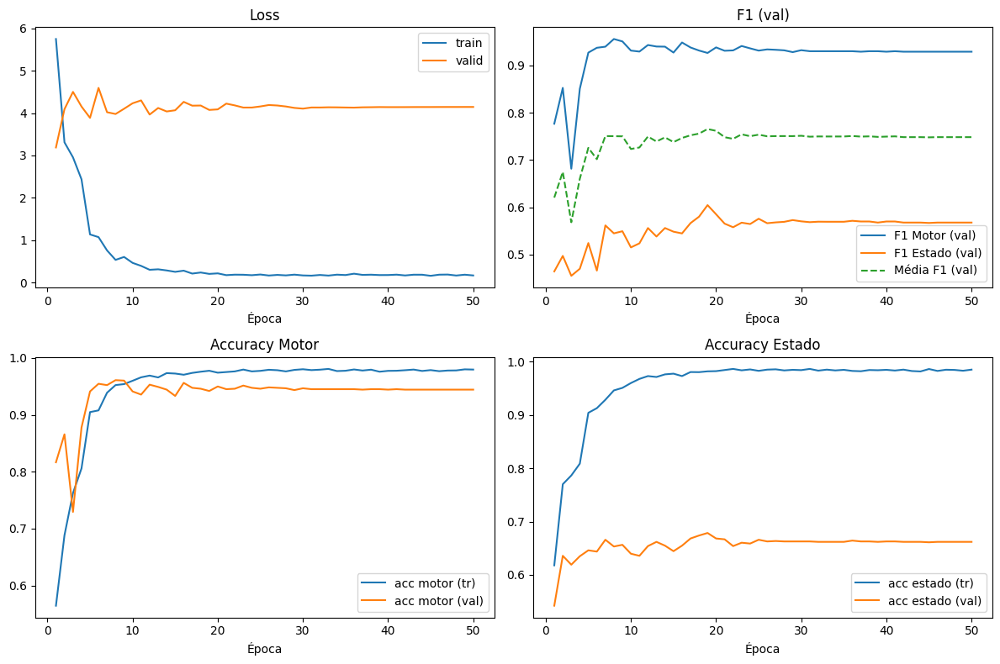

In [11]:
# =========================================
# 9) Treinar/avaliar um modelo neural (CHECKPOINT + MÉTRICAS)
#    model_type ∈ {"lstm","rnn","transf","resnet"}  (+ "crnn","tinyvit" se adicionados)
# =========================================
import random, numpy as np, pandas as pd, torch
from pathlib import Path
from tqdm.auto import tqdm
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# ---------- Hiperparâmetros de features ----------
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256

# ---------- Modelo a rodar ----------
MODEL_TO_RUN = "transf"   # "lstm" | "rnn" | "transf" | "resnet" | ("crnn","tinyvit" se definidos)

# ---------- Diretório de checkpoints + CSV ----------
CKPT_DIR = Path(ROOT_DIR) / f"ckp_{MODEL_TO_RUN}"
CKPT_DIR.mkdir(parents=True, exist_ok=True)
HIST_PATH = CKPT_DIR / "metrics_history.csv"

# ---------- Utilidades de checkpoint ----------
def ensure_parent_dir(path: Path):
    Path(path).parent.mkdir(parents=True, exist_ok=True)

def _latest_ckpt(ckpt_dir: Path):
    pats = sorted(ckpt_dir.glob("epoch_*.pt"))
    return pats[-1] if pats else None

def _save_ckpt(ckpt_path: Path, epoch, model, opt, sch, best_score, history=None):
    ensure_parent_dir(ckpt_path)
    state = {
        "epoch": epoch,
        "model": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scheduler": sch.state_dict() if sch is not None else None,
        "best_score": best_score,
        "history": history,   # histórico até esta época
        "rng": {
            "torch": torch.get_rng_state(),
            "cuda": torch.cuda.get_rng_state_all() if torch.cuda.is_available() else None,
            "numpy": np.random.get_state(),
            "random": random.getstate(),
        }
    }
    torch.save(state, ckpt_path)

def _load_ckpt(ckpt_path: Path, model, opt, sch):
    state = torch.load(ckpt_path, map_location="cpu")
    model.load_state_dict(state["model"])
    if opt is not None and state.get("optimizer"): opt.load_state_dict(state["optimizer"])
    if sch is not None and state.get("scheduler") is not None: sch.load_state_dict(state["scheduler"])
    # RNG (opcional)
    rng = state.get("rng", {})
    if rng.get("torch") is not None: torch.set_rng_state(rng["torch"])
    if torch.cuda.is_available() and rng.get("cuda") is not None: torch.cuda.set_rng_state_all(rng["cuda"])
    if rng.get("numpy") is not None: np.random.set_state(rng["numpy"])
    if rng.get("random") is not None: random.setstate(rng["random"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_score  = float(state.get("best_score", -1.0))
    history     = state.get("history", None)
    return start_epoch, best_score, history

# ---------- Loop de treino com checkpoint + métricas ----------
def train_multitask_torch_with_ckpt(
    df_labels, state_meta, model_type="lstm",
    # features
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    # treino
    batch_size=32, epochs=50, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=None, seed=123,
    # checkpoint
    ckpt_dir: Path = CKPT_DIR,
    resume=True, ckpt_interval=1
):
    # garantir pasta de ckpt
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    hist_csv_path = ckpt_dir / "metrics_history.csv"

    # ==== split por arquivo ====
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"] = "train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS = 0  # evita erros com Py3.12/Colab
    dl_tr = torch.utils.data.DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                                        num_workers=NUM_WORKERS, persistent_workers=False,
                                        pin_memory=torch.cuda.is_available())
    dl_te = torch.utils.data.DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                                        num_workers=NUM_WORKERS, persistent_workers=False,
                                        pin_memory=torch.cuda.is_available())

    # modelo
    model = build_model(model_type, n_mels, state_meta).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = torch.nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    # ==== histórico de métricas ====
    hist = []  # lista de dicts (um por época)

    # ==== Resume de checkpoint (se existir) ====
    start_epoch = 1
    best = {"score": -1.0, "state": None}
    if resume:
        last = _latest_ckpt(ckpt_dir)
        if last is not None:
            start_epoch, best["score"], hist_loaded = _load_ckpt(last, model, opt, sch)
            if hist_loaded is not None:
                hist = hist_loaded
            elif hist_csv_path.exists():  # fallback no CSV
                try: hist = pd.read_csv(hist_csv_path).to_dict(orient="records")
                except Exception: pass
            print(f"[ckpt] retomando de {last.name} -> start_epoch={start_epoch}, best_score={best['score']:.3f}")
        else:
            print("[ckpt] nenhum checkpoint encontrado; iniciando do zero.")
    else:
        print("[ckpt] resume desativado; iniciando do zero.")

    # ---- loop de uma época ----
    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                logits_motor, logits_state_pad = model(xb, motor_k=k)

                # motor
                loss_motor = crit_motor(logits_motor, y_m)

                # estado (FocalLoss por cabeça; corta para Ck)
                loss_state = 0.0
                for ki in range(1,6):
                    mask = (k == ki)
                    if mask.any():
                        Ck = len(state_meta[ki]["codes"])
                        logits_k = logits_state_pad[mask, :Ck]
                        y_s_k   = y_s[mask]
                        w_k = w_states.get(ki, None)
                        crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                        loss_state = loss_state + crit_k(logits_k, y_s_k)

                loss = alpha_motor*loss_motor + alpha_state*loss_state
                if train:
                    opt.zero_grad(); loss.backward(); opt.step()

            losses.append(loss.item())
            # métricas rápidas (segmentos)
            yM_true.extend(y_m.detach().cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).detach().cpu().numpy().tolist())
            yS_true_all.extend(y_s.detach().cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).detach().cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    ep_iter = range(start_epoch, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino ({model_type})")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        sch.step(te_loss)

        # ---- registrar métricas desta época ----
        row = {
            "epoch": ep,
            "tr_loss": tr_loss, "tr_acc_motor": tr_accM, "tr_f1_motor": tr_f1M,
            "tr_acc_state": tr_accS, "tr_f1_state": tr_f1S,
            "te_loss": te_loss, "te_acc_motor": te_accM, "te_f1_motor": te_f1M,
            "te_acc_state": te_accS, "te_f1_state": te_f1S,
            "score_avg_f1": (te_f1M + te_f1S)/2.0
        }
        hist.append(row)
        ensure_parent_dir(hist_csv_path)
        pd.DataFrame(hist).to_csv(hist_csv_path, index=False)

        msg = (f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
               f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
               f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
               f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})")
        tqdm.write(msg)

        # ---- checkpoint por época (com histórico) ----
        if ckpt_interval and (ep % ckpt_interval == 0):
            ckpt_path = ckpt_dir / f"epoch_{ep:03d}.pt"
            _save_ckpt(ckpt_path, ep, model, opt, sch, best_score=best["score"], history=hist)
            _save_ckpt(ckpt_dir / "last.pt", ep, model, opt, sch, best_score=best["score"], history=hist)

        # ---- acompanhar "melhor" e salvar melhor estado (export) ----
        score = row["score_avg_f1"]
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}
            if save_path:
                ensure_parent_dir(save_path)
                torch.save({"epoch": ep, "best_score": score, "state": best["state"]}, save_path)
                tqdm.write(f"[melhor] ep={ep} score={score:.3f} -> salvo best em: {save_path}")

    # restaurar melhor
    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"[{model_type}] Melhor score (avg F1 M+S): {best['score']:.3f} | best={save_path}")

    # ---- Relatórios finais (segmentos) ----
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true))
        namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
    eval_segments()

    return model, (dl_tr, dl_te), df_labels

# ----------------- EXECUÇÃO COM CHECKPOINT + MÉTRICAS -----------------
model_torch, loaders_torch, dfMT = train_multitask_torch_with_ckpt(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    model_type=MODEL_TO_RUN,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=32, epochs=50, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=Path(ROOT_DIR)/f"model_{MODEL_TO_RUN}.pt",
    seed=123,
    ckpt_dir=CKPT_DIR,   # /content/drive/.../ckp_{nome_do_modelo}
    resume=True,         # retoma automaticamente se existir "epoch_XXX.pt" ou "last.pt"
    ckpt_interval=1      # salva TODO epoch
)

# -------- Avaliação por arquivo --------
eval_file_level(model_torch, loaders_torch[1], state_meta)
print(f"\nHistórico salvo em: {HIST_PATH}")

# -------- (opcional) Curvas de treino --------
if HIST_PATH.exists():
    hist = pd.read_csv(HIST_PATH)
    fig, axes = plt.subplots(2, 2, figsize=(12,8))
    axes = axes.ravel()

    axes[0].plot(hist["epoch"], hist["tr_loss"], label="train")
    axes[0].plot(hist["epoch"], hist["te_loss"], label="valid")
    axes[0].set_title("Loss"); axes[0].set_xlabel("Época"); axes[0].legend()

    axes[1].plot(hist["epoch"], hist["te_f1_motor"], label="F1 Motor (val)")
    axes[1].plot(hist["epoch"], hist["te_f1_state"], label="F1 Estado (val)")
    axes[1].plot(hist["epoch"], hist["score_avg_f1"], label="Média F1 (val)", linestyle="--")
    axes[1].set_title("F1 (val)"); axes[1].set_xlabel("Época"); axes[1].legend()

    axes[2].plot(hist["epoch"], hist["tr_acc_motor"], label="acc motor (tr)")
    axes[2].plot(hist["epoch"], hist["te_acc_motor"], label="acc motor (val)")
    axes[2].set_title("Accuracy Motor"); axes[2].set_xlabel("Época"); axes[2].legend()

    axes[3].plot(hist["epoch"], hist["tr_acc_state"], label="acc estado (tr)")
    axes[3].plot(hist["epoch"], hist["te_acc_state"], label="acc estado (val)")
    axes[3].set_title("Accuracy Estado"); axes[3].set_xlabel("Época"); axes[3].legend()

    plt.tight_layout(); plt.show()
else:
    print("CSV de métricas ainda não existe. Treine pelo menos 1 época.")


# resnet

Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] nenhum checkpoint encontrado; iniciando do zero.


Treino (resnet):   0%|          | 0/50 [00:00<?, ?it/s]

train ep01:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/40 [00:00<?, ?it/s]

[01] loss_tr=12.6035 M(tr acc=0.356 f1=0.334) S(tr acc=0.420 f1=0.339) | loss_te=8.8207 M(te acc=0.471 f1=0.518) S(te acc=0.193 f1=0.176)
[melhor] ep=1 score=0.347 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep02:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/40 [00:00<?, ?it/s]

[02] loss_tr=7.8235 M(tr acc=0.558 f1=0.537) S(tr acc=0.595 f1=0.503) | loss_te=6.4212 M(te acc=0.613 f1=0.630) S(te acc=0.569 f1=0.370)
[melhor] ep=2 score=0.500 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep03:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/40 [00:00<?, ?it/s]

[03] loss_tr=4.4873 M(tr acc=0.641 f1=0.624) S(tr acc=0.710 f1=0.622) | loss_te=17.4081 M(te acc=0.637 f1=0.594) S(te acc=0.456 f1=0.306)


train ep04:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/40 [00:00<?, ?it/s]

[04] loss_tr=4.4769 M(tr acc=0.646 f1=0.631) S(tr acc=0.712 f1=0.628) | loss_te=6.4467 M(te acc=0.668 f1=0.643) S(te acc=0.581 f1=0.408)
[melhor] ep=4 score=0.526 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep05:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/40 [00:00<?, ?it/s]

[05] loss_tr=3.7829 M(tr acc=0.665 f1=0.651) S(tr acc=0.742 f1=0.669) | loss_te=19.7554 M(te acc=0.689 f1=0.639) S(te acc=0.350 f1=0.194)


train ep06:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/40 [00:00<?, ?it/s]

[06] loss_tr=3.0658 M(tr acc=0.716 f1=0.707) S(tr acc=0.798 f1=0.725) | loss_te=8.0197 M(te acc=0.775 f1=0.756) S(te acc=0.533 f1=0.386)
[melhor] ep=6 score=0.571 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep07:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/40 [00:00<?, ?it/s]

[07] loss_tr=2.5345 M(tr acc=0.749 f1=0.745) S(tr acc=0.822 f1=0.758) | loss_te=6.3858 M(te acc=0.635 f1=0.651) S(te acc=0.609 f1=0.461)


train ep08:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/40 [00:00<?, ?it/s]

[08] loss_tr=2.6983 M(tr acc=0.762 f1=0.756) S(tr acc=0.823 f1=0.764) | loss_te=5.9450 M(te acc=0.749 f1=0.748) S(te acc=0.529 f1=0.420)
[melhor] ep=8 score=0.584 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep09:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/40 [00:00<?, ?it/s]

[09] loss_tr=2.1067 M(tr acc=0.784 f1=0.780) S(tr acc=0.840 f1=0.783) | loss_te=5.7413 M(te acc=0.807 f1=0.794) S(te acc=0.598 f1=0.466)
[melhor] ep=9 score=0.630 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep10:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/40 [00:00<?, ?it/s]

[10] loss_tr=1.8351 M(tr acc=0.822 f1=0.817) S(tr acc=0.867 f1=0.816) | loss_te=6.6398 M(te acc=0.740 f1=0.725) S(te acc=0.625 f1=0.475)


train ep11:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/40 [00:00<?, ?it/s]

[11] loss_tr=1.8576 M(tr acc=0.834 f1=0.830) S(tr acc=0.872 f1=0.822) | loss_te=6.9950 M(te acc=0.816 f1=0.787) S(te acc=0.657 f1=0.491)
[melhor] ep=11 score=0.639 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep12:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/40 [00:00<?, ?it/s]

[12] loss_tr=2.0160 M(tr acc=0.830 f1=0.823) S(tr acc=0.862 f1=0.813) | loss_te=6.8596 M(te acc=0.713 f1=0.735) S(te acc=0.509 f1=0.390)


train ep13:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/40 [00:00<?, ?it/s]

[13] loss_tr=1.2996 M(tr acc=0.868 f1=0.864) S(tr acc=0.906 f1=0.870) | loss_te=7.2395 M(te acc=0.815 f1=0.800) S(te acc=0.623 f1=0.466)


train ep14:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/40 [00:00<?, ?it/s]

[14] loss_tr=1.0425 M(tr acc=0.894 f1=0.890) S(tr acc=0.921 f1=0.889) | loss_te=13.8143 M(te acc=0.698 f1=0.663) S(te acc=0.463 f1=0.348)


train ep15:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/40 [00:00<?, ?it/s]

[15] loss_tr=0.9843 M(tr acc=0.899 f1=0.897) S(tr acc=0.931 f1=0.906) | loss_te=6.6975 M(te acc=0.834 f1=0.803) S(te acc=0.622 f1=0.495)
[melhor] ep=15 score=0.649 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep16:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/40 [00:00<?, ?it/s]

[16] loss_tr=0.8604 M(tr acc=0.904 f1=0.901) S(tr acc=0.936 f1=0.914) | loss_te=7.4786 M(te acc=0.860 f1=0.841) S(te acc=0.633 f1=0.481)
[melhor] ep=16 score=0.661 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep17:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/40 [00:00<?, ?it/s]

[17] loss_tr=0.5266 M(tr acc=0.926 f1=0.925) S(tr acc=0.959 f1=0.942) | loss_te=7.4645 M(te acc=0.861 f1=0.849) S(te acc=0.663 f1=0.524)
[melhor] ep=17 score=0.686 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep18:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/40 [00:00<?, ?it/s]

[18] loss_tr=0.6178 M(tr acc=0.935 f1=0.932) S(tr acc=0.956 f1=0.941) | loss_te=7.3152 M(te acc=0.863 f1=0.851) S(te acc=0.682 f1=0.543)
[melhor] ep=18 score=0.697 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep19:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/40 [00:00<?, ?it/s]

[19] loss_tr=0.4285 M(tr acc=0.940 f1=0.940) S(tr acc=0.967 f1=0.956) | loss_te=7.8776 M(te acc=0.875 f1=0.862) S(te acc=0.679 f1=0.545)
[melhor] ep=19 score=0.704 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep20:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/40 [00:00<?, ?it/s]

[20] loss_tr=0.4090 M(tr acc=0.945 f1=0.944) S(tr acc=0.970 f1=0.959) | loss_te=8.3813 M(te acc=0.888 f1=0.873) S(te acc=0.668 f1=0.531)


train ep21:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep21:   0%|          | 0/40 [00:00<?, ?it/s]

[21] loss_tr=0.2958 M(tr acc=0.951 f1=0.949) S(tr acc=0.976 f1=0.966) | loss_te=8.3545 M(te acc=0.879 f1=0.864) S(te acc=0.670 f1=0.540)


train ep22:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep22:   0%|          | 0/40 [00:00<?, ?it/s]

[22] loss_tr=0.3692 M(tr acc=0.955 f1=0.954) S(tr acc=0.976 f1=0.967) | loss_te=8.6327 M(te acc=0.874 f1=0.856) S(te acc=0.679 f1=0.540)


train ep23:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep23:   0%|          | 0/40 [00:00<?, ?it/s]

[23] loss_tr=0.2733 M(tr acc=0.961 f1=0.960) S(tr acc=0.979 f1=0.969) | loss_te=8.7211 M(te acc=0.881 f1=0.864) S(te acc=0.678 f1=0.550)
[melhor] ep=23 score=0.707 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep24:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep24:   0%|          | 0/40 [00:00<?, ?it/s]

[24] loss_tr=0.3114 M(tr acc=0.961 f1=0.959) S(tr acc=0.973 f1=0.961) | loss_te=8.4993 M(te acc=0.889 f1=0.875) S(te acc=0.687 f1=0.557)
[melhor] ep=24 score=0.716 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep25:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep25:   0%|          | 0/40 [00:00<?, ?it/s]

[25] loss_tr=0.2506 M(tr acc=0.963 f1=0.961) S(tr acc=0.981 f1=0.974) | loss_te=8.8560 M(te acc=0.888 f1=0.872) S(te acc=0.691 f1=0.558)


train ep26:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep26:   0%|          | 0/40 [00:00<?, ?it/s]

[26] loss_tr=0.2414 M(tr acc=0.963 f1=0.961) S(tr acc=0.981 f1=0.974) | loss_te=9.0287 M(te acc=0.885 f1=0.869) S(te acc=0.679 f1=0.559)


train ep27:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep27:   0%|          | 0/40 [00:00<?, ?it/s]

[27] loss_tr=0.2090 M(tr acc=0.963 f1=0.962) S(tr acc=0.982 f1=0.973) | loss_te=8.9642 M(te acc=0.888 f1=0.874) S(te acc=0.677 f1=0.545)


train ep28:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep28:   0%|          | 0/40 [00:00<?, ?it/s]

[28] loss_tr=0.2262 M(tr acc=0.965 f1=0.963) S(tr acc=0.985 f1=0.978) | loss_te=9.1631 M(te acc=0.884 f1=0.871) S(te acc=0.681 f1=0.542)


train ep29:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep29:   0%|          | 0/40 [00:00<?, ?it/s]

[29] loss_tr=0.2040 M(tr acc=0.969 f1=0.967) S(tr acc=0.982 f1=0.976) | loss_te=9.2816 M(te acc=0.888 f1=0.873) S(te acc=0.684 f1=0.548)


train ep30:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep30:   0%|          | 0/40 [00:00<?, ?it/s]

[30] loss_tr=0.2245 M(tr acc=0.967 f1=0.965) S(tr acc=0.985 f1=0.979) | loss_te=9.1545 M(te acc=0.890 f1=0.874) S(te acc=0.679 f1=0.544)


train ep31:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep31:   0%|          | 0/40 [00:00<?, ?it/s]

[31] loss_tr=0.2064 M(tr acc=0.968 f1=0.967) S(tr acc=0.984 f1=0.977) | loss_te=9.1031 M(te acc=0.887 f1=0.871) S(te acc=0.674 f1=0.545)


train ep32:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep32:   0%|          | 0/40 [00:00<?, ?it/s]

[32] loss_tr=0.2134 M(tr acc=0.968 f1=0.966) S(tr acc=0.984 f1=0.978) | loss_te=9.1346 M(te acc=0.889 f1=0.871) S(te acc=0.670 f1=0.540)


train ep33:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep33:   0%|          | 0/40 [00:00<?, ?it/s]

[33] loss_tr=0.1898 M(tr acc=0.965 f1=0.964) S(tr acc=0.983 f1=0.975) | loss_te=9.0897 M(te acc=0.889 f1=0.873) S(te acc=0.685 f1=0.557)


train ep34:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep34:   0%|          | 0/40 [00:00<?, ?it/s]

[34] loss_tr=0.1897 M(tr acc=0.966 f1=0.964) S(tr acc=0.985 f1=0.978) | loss_te=9.1332 M(te acc=0.890 f1=0.876) S(te acc=0.678 f1=0.550)


train ep35:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep35:   0%|          | 0/40 [00:00<?, ?it/s]

[35] loss_tr=0.2048 M(tr acc=0.968 f1=0.967) S(tr acc=0.983 f1=0.976) | loss_te=9.0146 M(te acc=0.893 f1=0.879) S(te acc=0.677 f1=0.549)


train ep36:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep36:   0%|          | 0/40 [00:00<?, ?it/s]

[36] loss_tr=0.1795 M(tr acc=0.968 f1=0.967) S(tr acc=0.987 f1=0.981) | loss_te=9.2522 M(te acc=0.891 f1=0.876) S(te acc=0.688 f1=0.560)
[melhor] ep=36 score=0.718 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep37:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep37:   0%|          | 0/40 [00:00<?, ?it/s]

[37] loss_tr=0.2226 M(tr acc=0.967 f1=0.966) S(tr acc=0.984 f1=0.977) | loss_te=9.2534 M(te acc=0.885 f1=0.868) S(te acc=0.681 f1=0.550)


train ep38:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep38:   0%|          | 0/40 [00:00<?, ?it/s]

[38] loss_tr=0.2291 M(tr acc=0.967 f1=0.965) S(tr acc=0.984 f1=0.978) | loss_te=9.1392 M(te acc=0.889 f1=0.872) S(te acc=0.692 f1=0.559)


train ep39:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep39:   0%|          | 0/40 [00:00<?, ?it/s]

[39] loss_tr=0.1978 M(tr acc=0.972 f1=0.970) S(tr acc=0.984 f1=0.977) | loss_te=9.1164 M(te acc=0.890 f1=0.876) S(te acc=0.692 f1=0.561)
[melhor] ep=39 score=0.718 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


train ep40:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep40:   0%|          | 0/40 [00:00<?, ?it/s]

[40] loss_tr=0.1628 M(tr acc=0.970 f1=0.970) S(tr acc=0.986 f1=0.980) | loss_te=9.1873 M(te acc=0.887 f1=0.873) S(te acc=0.690 f1=0.558)


train ep41:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep41:   0%|          | 0/40 [00:00<?, ?it/s]

[41] loss_tr=0.1922 M(tr acc=0.966 f1=0.965) S(tr acc=0.984 f1=0.978) | loss_te=9.1218 M(te acc=0.890 f1=0.874) S(te acc=0.681 f1=0.552)


train ep42:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep42:   0%|          | 0/40 [00:00<?, ?it/s]

[42] loss_tr=0.1910 M(tr acc=0.968 f1=0.966) S(tr acc=0.984 f1=0.977) | loss_te=8.9674 M(te acc=0.897 f1=0.881) S(te acc=0.682 f1=0.554)


train ep43:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep43:   0%|          | 0/40 [00:00<?, ?it/s]

[43] loss_tr=0.2615 M(tr acc=0.970 f1=0.969) S(tr acc=0.984 f1=0.977) | loss_te=8.9906 M(te acc=0.892 f1=0.875) S(te acc=0.679 f1=0.547)


train ep44:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep44:   0%|          | 0/40 [00:00<?, ?it/s]

[44] loss_tr=0.1809 M(tr acc=0.969 f1=0.969) S(tr acc=0.988 f1=0.983) | loss_te=9.1255 M(te acc=0.887 f1=0.873) S(te acc=0.685 f1=0.561)


train ep45:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep45:   0%|          | 0/40 [00:00<?, ?it/s]

[45] loss_tr=0.1691 M(tr acc=0.971 f1=0.970) S(tr acc=0.986 f1=0.982) | loss_te=9.1379 M(te acc=0.890 f1=0.875) S(te acc=0.685 f1=0.556)


train ep46:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep46:   0%|          | 0/40 [00:00<?, ?it/s]

[46] loss_tr=0.1861 M(tr acc=0.966 f1=0.965) S(tr acc=0.988 f1=0.982) | loss_te=8.9862 M(te acc=0.892 f1=0.878) S(te acc=0.685 f1=0.555)


train ep47:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep47:   0%|          | 0/40 [00:00<?, ?it/s]

[47] loss_tr=0.1836 M(tr acc=0.971 f1=0.971) S(tr acc=0.985 f1=0.980) | loss_te=8.8845 M(te acc=0.891 f1=0.877) S(te acc=0.679 f1=0.553)


train ep48:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep48:   0%|          | 0/40 [00:00<?, ?it/s]

[48] loss_tr=0.1833 M(tr acc=0.968 f1=0.967) S(tr acc=0.988 f1=0.982) | loss_te=9.2524 M(te acc=0.887 f1=0.870) S(te acc=0.679 f1=0.551)


train ep49:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep49:   0%|          | 0/40 [00:00<?, ?it/s]

[49] loss_tr=0.2002 M(tr acc=0.967 f1=0.966) S(tr acc=0.985 f1=0.978) | loss_te=9.1646 M(te acc=0.890 f1=0.876) S(te acc=0.680 f1=0.551)


train ep50:   0%|          | 0/165 [00:00<?, ?it/s]

valid ep50:   0%|          | 0/40 [00:00<?, ?it/s]

[50] loss_tr=0.2004 M(tr acc=0.972 f1=0.970) S(tr acc=0.984 f1=0.978) | loss_te=9.1712 M(te acc=0.891 f1=0.875) S(te acc=0.681 f1=0.549)
[resnet] Melhor score (avg F1 M+S): 0.718 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/model_resnet.pt


aval seg:   0%|          | 0/40 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.86      0.98      0.92       600
          M2       0.88      0.64      0.74       180
          M3       0.96      0.75      0.84       180
          M4       0.98      0.89      0.94       180
          M5       0.88      1.00      0.93       120

    accuracy                           0.89      1260
   macro avg       0.91      0.85      0.87      1260
weighted avg       0.90      0.89      0.89      1260

Confusão (motor):
 [[591   3   0   2   4]
 [ 61 116   0   1   2]
 [ 32  12 135   0   1]
 [  2   1   6 161  10]
 [  0   0   0   0 120]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       0.91      0.33      0.48       180
           1       0.75      0.92      0.83       600
           2       0.67      0.28      0.40       180
           3       0.67      0.65      0.66       240
           4       0.27      0.65      0.38 

agregando por arquivo:   0%|          | 0/40 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.83      1.00      0.91        10
          M2       1.00      0.67      0.80         3
          M3       1.00      0.67      0.80         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           0.90        21
   macro avg       0.97      0.87      0.90        21
weighted avg       0.92      0.90      0.90        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 1  2  0  0  0]
 [ 1  0  2  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.77      1.00      0.87        10
           2       1.00      0.33      0.50         3
           3       0.75      0.75      0.75         4
           4       0.50      1.00      0.67         1

    accu

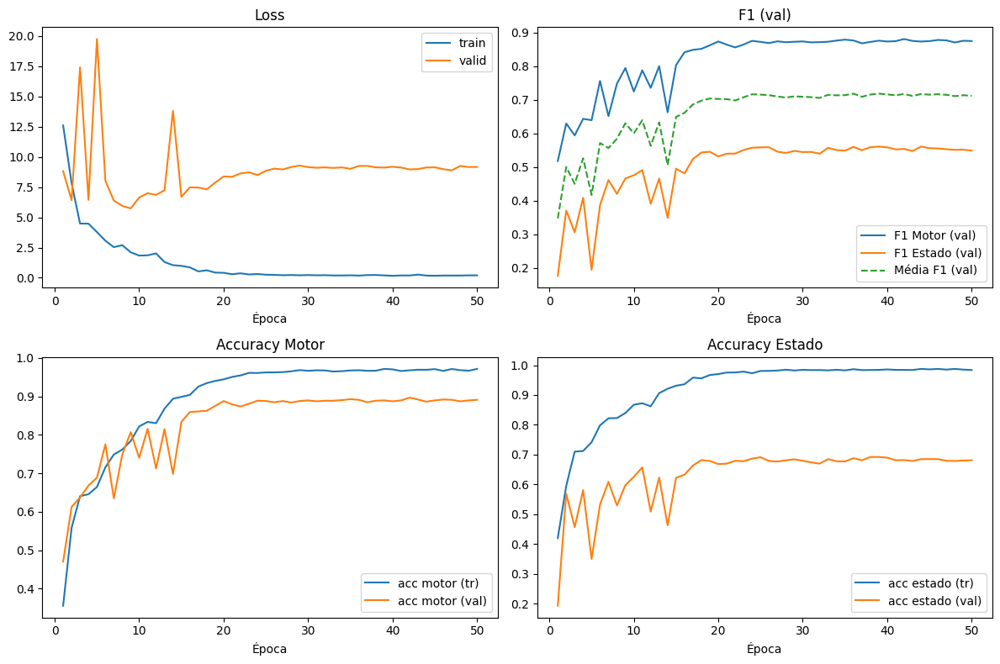

In [12]:
# =========================================
# 9) Treinar/avaliar um modelo neural (CHECKPOINT + MÉTRICAS)
#    model_type ∈ {"lstm","rnn","transf","resnet"}  (+ "crnn","tinyvit" se adicionados)
# =========================================
import random, numpy as np, pandas as pd, torch
from pathlib import Path
from tqdm.auto import tqdm
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
import matplotlib.pyplot as plt

# ---------- Hiperparâmetros de features ----------
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256

# ---------- Modelo a rodar ----------
MODEL_TO_RUN = "resnet"   # "lstm" | "rnn" | "transf" | "resnet" | ("crnn","tinyvit" se definidos)

# ---------- Diretório de checkpoints + CSV ----------
CKPT_DIR = Path(ROOT_DIR) / f"ckp_{MODEL_TO_RUN}"
CKPT_DIR.mkdir(parents=True, exist_ok=True)
HIST_PATH = CKPT_DIR / "metrics_history.csv"

# ---------- Utilidades de checkpoint ----------
def ensure_parent_dir(path: Path):
    Path(path).parent.mkdir(parents=True, exist_ok=True)

def _latest_ckpt(ckpt_dir: Path):
    pats = sorted(ckpt_dir.glob("epoch_*.pt"))
    return pats[-1] if pats else None

def _save_ckpt(ckpt_path: Path, epoch, model, opt, sch, best_score, history=None):
    ensure_parent_dir(ckpt_path)
    state = {
        "epoch": epoch,
        "model": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scheduler": sch.state_dict() if sch is not None else None,
        "best_score": best_score,
        "history": history,   # histórico até esta época
        "rng": {
            "torch": torch.get_rng_state(),
            "cuda": torch.cuda.get_rng_state_all() if torch.cuda.is_available() else None,
            "numpy": np.random.get_state(),
            "random": random.getstate(),
        }
    }
    torch.save(state, ckpt_path)

def _load_ckpt(ckpt_path: Path, model, opt, sch):
    state = torch.load(ckpt_path, map_location="cpu")
    model.load_state_dict(state["model"])
    if opt is not None and state.get("optimizer"): opt.load_state_dict(state["optimizer"])
    if sch is not None and state.get("scheduler") is not None: sch.load_state_dict(state["scheduler"])
    # RNG (opcional)
    rng = state.get("rng", {})
    if rng.get("torch") is not None: torch.set_rng_state(rng["torch"])
    if torch.cuda.is_available() and rng.get("cuda") is not None: torch.cuda.set_rng_state_all(rng["cuda"])
    if rng.get("numpy") is not None: np.random.set_state(rng["numpy"])
    if rng.get("random") is not None: random.setstate(rng["random"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_score  = float(state.get("best_score", -1.0))
    history     = state.get("history", None)
    return start_epoch, best_score, history

# ---------- Loop de treino com checkpoint + métricas ----------
def train_multitask_torch_with_ckpt(
    df_labels, state_meta, model_type="lstm",
    # features
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    # treino
    batch_size=32, epochs=50, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=None, seed=123,
    # checkpoint
    ckpt_dir: Path = CKPT_DIR,
    resume=True, ckpt_interval=1
):
    # garantir pasta de ckpt
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    hist_csv_path = ckpt_dir / "metrics_history.csv"

    # ==== split por arquivo ====
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"] = "train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS = 0  # evita erros com Py3.12/Colab
    dl_tr = torch.utils.data.DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                                        num_workers=NUM_WORKERS, persistent_workers=False,
                                        pin_memory=torch.cuda.is_available())
    dl_te = torch.utils.data.DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                                        num_workers=NUM_WORKERS, persistent_workers=False,
                                        pin_memory=torch.cuda.is_available())

    # modelo
    model = build_model(model_type, n_mels, state_meta).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = torch.nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    # ==== histórico de métricas ====
    hist = []  # lista de dicts (um por época)

    # ==== Resume de checkpoint (se existir) ====
    start_epoch = 1
    best = {"score": -1.0, "state": None}
    if resume:
        last = _latest_ckpt(ckpt_dir)
        if last is not None:
            start_epoch, best["score"], hist_loaded = _load_ckpt(last, model, opt, sch)
            if hist_loaded is not None:
                hist = hist_loaded
            elif hist_csv_path.exists():  # fallback no CSV
                try: hist = pd.read_csv(hist_csv_path).to_dict(orient="records")
                except Exception: pass
            print(f"[ckpt] retomando de {last.name} -> start_epoch={start_epoch}, best_score={best['score']:.3f}")
        else:
            print("[ckpt] nenhum checkpoint encontrado; iniciando do zero.")
    else:
        print("[ckpt] resume desativado; iniciando do zero.")

    # ---- loop de uma época ----
    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                logits_motor, logits_state_pad = model(xb, motor_k=k)

                # motor
                loss_motor = crit_motor(logits_motor, y_m)

                # estado (FocalLoss por cabeça; corta para Ck)
                loss_state = 0.0
                for ki in range(1,6):
                    mask = (k == ki)
                    if mask.any():
                        Ck = len(state_meta[ki]["codes"])
                        logits_k = logits_state_pad[mask, :Ck]
                        y_s_k   = y_s[mask]
                        w_k = w_states.get(ki, None)
                        crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                        loss_state = loss_state + crit_k(logits_k, y_s_k)

                loss = alpha_motor*loss_motor + alpha_state*loss_state
                if train:
                    opt.zero_grad(); loss.backward(); opt.step()

            losses.append(loss.item())
            # métricas rápidas (segmentos)
            yM_true.extend(y_m.detach().cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).detach().cpu().numpy().tolist())
            yS_true_all.extend(y_s.detach().cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).detach().cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    ep_iter = range(start_epoch, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino ({model_type})")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        sch.step(te_loss)

        # ---- registrar métricas desta época ----
        row = {
            "epoch": ep,
            "tr_loss": tr_loss, "tr_acc_motor": tr_accM, "tr_f1_motor": tr_f1M,
            "tr_acc_state": tr_accS, "tr_f1_state": tr_f1S,
            "te_loss": te_loss, "te_acc_motor": te_accM, "te_f1_motor": te_f1M,
            "te_acc_state": te_accS, "te_f1_state": te_f1S,
            "score_avg_f1": (te_f1M + te_f1S)/2.0
        }
        hist.append(row)
        ensure_parent_dir(hist_csv_path)
        pd.DataFrame(hist).to_csv(hist_csv_path, index=False)

        msg = (f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
               f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
               f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
               f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})")
        tqdm.write(msg)

        # ---- checkpoint por época (com histórico) ----
        if ckpt_interval and (ep % ckpt_interval == 0):
            ckpt_path = ckpt_dir / f"epoch_{ep:03d}.pt"
            _save_ckpt(ckpt_path, ep, model, opt, sch, best_score=best["score"], history=hist)
            _save_ckpt(ckpt_dir / "last.pt", ep, model, opt, sch, best_score=best["score"], history=hist)

        # ---- acompanhar "melhor" e salvar melhor estado (export) ----
        score = row["score_avg_f1"]
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}
            if save_path:
                ensure_parent_dir(save_path)
                torch.save({"epoch": ep, "best_score": score, "state": best["state"]}, save_path)
                tqdm.write(f"[melhor] ep={ep} score={score:.3f} -> salvo best em: {save_path}")

    # restaurar melhor
    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"[{model_type}] Melhor score (avg F1 M+S): {best['score']:.3f} | best={save_path}")

    # ---- Relatórios finais (segmentos) ----
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true))
        namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
    eval_segments()

    return model, (dl_tr, dl_te), df_labels

# ----------------- EXECUÇÃO COM CHECKPOINT + MÉTRICAS -----------------
model_torch, loaders_torch, dfMT = train_multitask_torch_with_ckpt(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    model_type=MODEL_TO_RUN,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=32, epochs=50, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=Path(ROOT_DIR)/f"model_{MODEL_TO_RUN}.pt",
    seed=123,
    ckpt_dir=CKPT_DIR,   # /content/drive/.../ckp_{nome_do_modelo}
    resume=True,         # retoma automaticamente se existir "epoch_XXX.pt" ou "last.pt"
    ckpt_interval=1      # salva TODO epoch
)

# -------- Avaliação por arquivo --------
eval_file_level(model_torch, loaders_torch[1], state_meta)
print(f"\nHistórico salvo em: {HIST_PATH}")

# -------- (opcional) Curvas de treino --------
if HIST_PATH.exists():
    hist = pd.read_csv(HIST_PATH)
    fig, axes = plt.subplots(2, 2, figsize=(12,8))
    axes = axes.ravel()

    axes[0].plot(hist["epoch"], hist["tr_loss"], label="train")
    axes[0].plot(hist["epoch"], hist["te_loss"], label="valid")
    axes[0].set_title("Loss"); axes[0].set_xlabel("Época"); axes[0].legend()

    axes[1].plot(hist["epoch"], hist["te_f1_motor"], label="F1 Motor (val)")
    axes[1].plot(hist["epoch"], hist["te_f1_state"], label="F1 Estado (val)")
    axes[1].plot(hist["epoch"], hist["score_avg_f1"], label="Média F1 (val)", linestyle="--")
    axes[1].set_title("F1 (val)"); axes[1].set_xlabel("Época"); axes[1].legend()

    axes[2].plot(hist["epoch"], hist["tr_acc_motor"], label="acc motor (tr)")
    axes[2].plot(hist["epoch"], hist["te_acc_motor"], label="acc motor (val)")
    axes[2].set_title("Accuracy Motor"); axes[2].set_xlabel("Época"); axes[2].legend()

    axes[3].plot(hist["epoch"], hist["tr_acc_state"], label="acc estado (tr)")
    axes[3].plot(hist["epoch"], hist["te_acc_state"], label="acc estado (val)")
    axes[3].set_title("Accuracy Estado"); axes[3].set_xlabel("Época"); axes[3].legend()

    plt.tight_layout(); plt.show()
else:
    print("CSV de métricas ainda não existe. Treine pelo menos 1 época.")


In [15]:
# ============================
# ENSEMBLE: LSTM+GRU+TRANSF+RESNET
# ============================
import os, random, json, math, gc
from pathlib import Path
from collections import defaultdict, Counter

import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score
from sklearn.preprocessing import StandardScaler

from tqdm import tqdm

# ----------------- Configs gerais -----------------
USE_TQDM = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Mesmos parâmetros dos modelos-base (ajuste se necessário)
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256
SR      = 44100
BATCH   = 128
MAX_SEG_PER_FILE = 60

ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")
CKP_DIRS = {
    "lstm":   ROOT_DIR/"ckp_lstm",
    "rnn":    ROOT_DIR/"ckp_rnn",
    "transf": ROOT_DIR/"ckp_transf",
    "resnet": ROOT_DIR/"ckp_resnet",
}
MODEL_PTS = {
    "lstm":   ROOT_DIR/"model_lstm.pt",
    "rnn":    ROOT_DIR/"model_rnn.pt",
    "transf": ROOT_DIR/"model_transf.pt",
    "resnet": ROOT_DIR/"model_resnet.pt",
}

ENSEMBLE_DIR = ROOT_DIR/"ensemble"
ENSEMBLE_DIR.mkdir(parents=True, exist_ok=True)

# ----------------- Helpers -----------------
def seed_everything(seed=123):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
seed_everything(123)

def safe_split_by_class(y, test_size=0.2, random_state=123):
    """Split por arquivo com estratificação por classe (robusto para classes poucas)."""
    from sklearn.model_selection import StratifiedShuffleSplit
    y = np.asarray(y)
    idx = np.arange(len(y))
    # garante ao menos 1 amostra por classe no teste se possível
    splitter = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=random_state)
    for tr, te in splitter.split(idx, y):
        return tr, te
    return idx, np.array([], dtype=int)

# ----------------- Build/Load dos modelos-base -----------------
# ATENÇÃO: esta função depende do seu "build_model" já estar definido no ambiente.
# Se não estiver, use a função que você usou para treinar os 4 modelos (lstm/rnn/transf/resnet).
def load_base_models(state_meta, names=("lstm","rnn","transf","resnet")):
    base = {}
    for n in names:
        pt = MODEL_PTS[n]
        if not pt.exists():
            print(f"[aviso] checkpoint do base-model '{n}' não encontrado em {pt}, pulando...")
            continue
        # Recria arquitetura
        m = build_model(n, N_MELS, state_meta).to(device)
        pack = torch.load(pt, map_location="cpu")
        sd = pack["state"] if isinstance(pack, dict) and "state" in pack else pack
        m.load_state_dict(sd, strict=True)
        m.eval()
        base[n] = m
    print("Carregado(s):", list(base.keys()))
    return base

# ----------------- Dataset/Loaders (reutiliza existentes ou reconstrói) -----------------
def make_loaders_from_df(df_labels, batch_size=BATCH):
    """Cria loaders com mesma segmentação do treino base. Requer WindowedMelDatasetMT no ambiente."""
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=123)
    dfL = df_labels.reset_index(drop=True).copy()
    dfL["split"] = "train"
    dfL.loc[te_pos, "split"] = "test"

    print("Distrib. ARQUIVOS (treino):", dfL.loc[dfL["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", dfL.loc[dfL["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=dfL[dfL["split"]=="train"],
        sr=SR, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
        n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP,
        fmin=20, fmax=8000, augment=False, max_segments_per_file=MAX_SEG_PER_FILE
    )
    ds_te = WindowedMelDatasetMT(
        df=dfL[dfL["split"]=="test"],
        sr=SR, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
        n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP,
        fmin=20, fmax=8000, augment=False, max_segments_per_file=MAX_SEG_PER_FILE
    )
    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(ds_te, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=torch.cuda.is_available())
    return (dl_tr, dl_te), dfL

# tenta reaproveitar loaders da sessão (por ex., do último modelo treinado)
try:
    dl_tr, dl_te = loaders_torch
    dfL = dfMT.copy()
    print("[info] Reutilizando loaders_torch existentes.")
except:
    print("[info] Recriando loaders a partir de df_one…")
    (dl_tr, dl_te), dfL = make_loaders_from_df(df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]])

# ----------------- Carregar modelos-base -----------------
BASE_MODELS = load_base_models(state_meta, names=("lstm","rnn","transf","resnet"))

# ----------------- Coleta de logits (com padding CMAX GLOBAL) -----------------
@torch.no_grad()
def collect_logits(dl, base_models, state_meta):
    """
    Retorna:
      Ymot: (N,) labels motor (0..4)
      Ysta: (N,) labels estado 'crus' (0..C_k-1 p/ o motor do segmento)
      Ks:   (N,) motor_k (1..5)
      FNs:  lista file_name por segmento
      LOGM[name]: (N,5)  logits de motor
      LOGS[name]: (N,CMAX) logits de estado com padding -1e9 nas colunas não usadas
    """
    CMAX = max(len(state_meta[k]["codes"]) for k in state_meta.keys())

    LOGM = {name: [] for name in base_models}
    LOGS = {name: [] for name in base_models}
    Ymot, Ysta, Ks, FNs = [], [], [], []

    iterator = dl if not USE_TQDM else tqdm(dl, desc="coletando logits", leave=False)
    for xb, y_m, y_s, k, fns in iterator:
        xb = xb.to(device); k_dev = k.to(device)

        # guarda rótulos verdadeiros
        Ymot.extend(y_m.numpy().tolist())
        Ysta.extend(y_s.numpy().tolist())
        Ks.extend(k.numpy().tolist())
        FNs.extend(fns)

        # inferência em todos os modelos-base
        for name, model in base_models.items():
            lm, ls_pad = model(xb, motor_k=k_dev)   # lm:[B,5]; ls_pad:[B,Cmax_lote]
            lm = lm.cpu()
            ls = ls_pad.cpu()

            # pad/trunc para CMAX GLOBAL
            B, Cb = ls.shape
            if Cb < CMAX:
                pad = torch.full((B, CMAX - Cb), -1e9, dtype=ls.dtype)
                ls = torch.cat([ls, pad], dim=1)
            elif Cb > CMAX:
                ls = ls[:, :CMAX]

            LOGM[name].append(lm)
            LOGS[name].append(ls)

    # concatena ao final (agora as larguras batem entre lotes)
    for name in base_models.keys():
        LOGM[name] = torch.cat(LOGM[name], dim=0).numpy()  # [N,5]
        LOGS[name] = torch.cat(LOGS[name], dim=0).numpy()  # [N,CMAX]

    return np.array(Ymot), np.array(Ysta), np.array(Ks), np.array(FNs), LOGM, LOGS

# ---------- Extrair logits de treino (para treinar meta) e de teste ----------
Ymot_tr, Ysta_tr, K_tr, FNs_tr, LOGM_tr, LOGS_tr = collect_logits(dl_tr, BASE_MODELS, state_meta)
Ymot_te, Ysta_te, K_te, FNs_te, LOGM_te, LOGS_te = collect_logits(dl_te, BASE_MODELS, state_meta)

# Cria features por concatenação de logits dos 4 modelos
def stack_feats(LOGM, LOGS, names=("lstm","rnn","transf","resnet")):
    Xmot = np.concatenate([LOGM[n] for n in names if n in LOGM], axis=1)  # [N, 5*#models]
    Xsta = np.concatenate([LOGS[n] for n in names if n in LOGS], axis=1)  # [N, CMAX*#models]
    return Xmot, Xsta

names_in_use = tuple(BASE_MODELS.keys())
Xmot_tr, Xsta_tr = stack_feats(LOGM_tr, LOGS_tr, names_in_use)
Xmot_te, Xsta_te = stack_feats(LOGM_te, LOGS_te, names_in_use)

# opcional: normalização (os logits entre modelos podem ter escalas diferentes)
scaler_mot = StandardScaler(with_mean=True, with_std=True)
scaler_sta = StandardScaler(with_mean=True, with_std=True)
Xmot_tr_z = scaler_mot.fit_transform(Xmot_tr)
Xsta_tr_z = scaler_sta.fit_transform(Xsta_tr)
Xmot_te_z = scaler_mot.transform(Xmot_te)
Xsta_te_z = scaler_sta.transform(Xsta_te)

# ----------------- Meta-learner: motor (multiclasse) -----------------
motor_meta = LogisticRegression(
    penalty="l2", C=1.0, solver="lbfgs", multi_class="multinomial",
    max_iter=200, n_jobs=-1, verbose=0
)
motor_meta.fit(Xmot_tr_z, Ymot_tr)

# ----------------- Meta-learner: estado (um por motor) -----------------
# Cria um classificador por motor k (1..5). Para o motor k, usa apenas amostras com K==k.
state_meta_models = {}
state_class_lists = {}   # guarda mapeamento 0..Ck-1
CMAX = max(len(state_meta[k]["codes"]) for k in state_meta.keys())
for k in range(1,6):
    mask_tr = (K_tr == k)
    if mask_tr.sum() == 0:
        continue
    # Para o motor k, a coluna "verdadeira" do estado é Ysta_tr (0..Ck-1)
    yk = Ysta_tr[mask_tr].copy()
    # Features: Xsta_tr_z (concat logits CMAX*#models) + podemos concatenar também Xmot
    Xk = Xsta_tr_z[mask_tr]  # (N_k, CMAX*#models)
    # Classificador:
    clf_k = LogisticRegression(
        penalty="l2", C=0.5, solver="lbfgs", multi_class="multinomial",
        max_iter=200, n_jobs=-1, verbose=0
    )
    clf_k.fit(Xk, yk)
    state_meta_models[k] = clf_k
    state_class_lists[k] = list(range(len(state_meta[k]["codes"])))

print("Meta learners treinados:", {"motor": True, "states": list(state_meta_models.keys())})

# ----------------- Avaliação (segment-level) -----------------
def eval_segments_meta():
    # MOTOR
    yM_pred = motor_meta.predict(Xmot_te_z)
    print("\n=== Ensemble SEGMENT: MOTOR ===")
    print(classification_report(Ymot_te, yM_pred, target_names=["M1","M2","M3","M4","M5"], zero_division=0))
    print("Confusão (motor):\n", confusion_matrix(Ymot_te, yM_pred))

    # ESTADO (usa o motor verdadeiro para escolher a cabeça; também dá para usar o motor predito)
    yS_pred = np.zeros_like(Ysta_te)
    for k in range(1,6):
        mask = (K_te == k)
        if mask.sum()==0 or k not in state_meta_models:
            continue
        Xk = Xsta_te_z[mask]
        yS_pred[mask] = state_meta_models[k].predict(Xk)

    print("\n=== Ensemble SEGMENT: ESTADO (por cabeça do motor verdadeiro) ===")
    print(classification_report(Ysta_te, yS_pred, zero_division=0))

eval_segments_meta()

# ----------------- Avaliação (file-level) -----------------
@torch.no_grad()
def aggregate_file_level(FNs, probs):
    """
    FNs: lista de nomes de arquivo por segmento
    probs: matriz [N, C] com probabilidades
    Retorna dict: file_name -> prob média [C]
    """
    group = defaultdict(list)
    for fn, p in zip(FNs, probs):
        group[fn].append(p)
    out = {}
    for fn, plist in group.items():
        P = np.stack(plist, axis=0).mean(axis=0)  # média
        out[fn] = P
    return out

def eval_file_level_ensemble():
    # Probabilidades do meta de MOTOR
    pm_tr = motor_meta.predict_proba(Xmot_tr_z)
    pm_te = motor_meta.predict_proba(Xmot_te_z)

    # Por arquivo (motor)
    agg_mot = aggregate_file_level(FNs_te, pm_te)
    fns_sorted = sorted(agg_mot.keys())
    y_true_file = []
    y_pred_file = []
    # Para verdade por arquivo, a etiqueta do arquivo é a maioria dos segmentos do arquivo (rótulo de motor)
    # Como temos dfL com split==test, pegamos mapeamento file_name -> motor_idx
    meta_te = dfL[dfL["split"]=="test"][["file_name","motor_idx"]].drop_duplicates()
    file2y = dict(zip(meta_te["file_name"], meta_te["motor_idx"]))
    for fn in fns_sorted:
        y_true_file.append(file2y.get(fn, 0))
        y_pred_file.append(np.argmax(agg_mot[fn]))
    print("\n=== Ensemble FILE-LEVEL: MOTOR ===")
    print(classification_report(y_true_file, y_pred_file, target_names=["M1","M2","M3","M4","M5"], zero_division=0))
    print("Confusão (motor, file-level):\n", confusion_matrix(y_true_file, y_pred_file))

    # ESTADO (file-level): usa a cabeça do motor verdadeiro p/ cada arquivo
    # primeiro precisamos das probabilidades de estado por segmento (com a cabeça correta)
    # gera proba por segmento:
    CMAX = max(len(state_meta[k]["codes"]) for k in state_meta.keys())
    ps_state = np.zeros((len(Ysta_te), CMAX), dtype=float)
    for k in range(1,6):
        mask = (K_te == k)
        if mask.sum()==0 or k not in state_meta_models:
            continue
        ps_k = state_meta_models[k].predict_proba(Xsta_te_z[mask])  # [Nk, Ck]
        # embute em CMAX (coloca zeros nas colunas > Ck só para padronizar; a avaliação usará o y certo por motor)
        Ck = len(state_meta[k]["codes"])
        M = np.zeros((ps_k.shape[0], CMAX), dtype=float)
        M[:, :Ck] = ps_k
        ps_state[mask] = M

    # agrupa por arquivo escolhendo motor verdadeiro de cada arquivo
    # e avalia contra o estado verdadeiro mais frequente do arquivo (majoritário)
    # (alternativamente, média das distribuições e argmax)
    meta_states_te = dfL[dfL["split"]=="test"][["file_name","motor_idx","state_idx"]].copy()
    # OBS: state_idx tem estados em 0..Ck-1 relativos ao motor do arquivo
    file2motor = dict(zip(meta_te["file_name"], meta_te["motor_idx"]))
    # probas agregadas por arquivo (em CMAX, mas só primeiras Ck contam)
    agg_sta = aggregate_file_level(FNs_te, ps_state)
    yS_true_file, yS_pred_file = [], []
    for fn in sorted(agg_sta.keys()):
        k = int(file2motor[fn]) + 1  # motor_idx (0..4) -> k (1..5)
        Ck = len(state_meta[k]["codes"])
        # estado verdadeiro file-level = moda dos segmentos daquele arquivo
        seg_mask = (np.array(FNs_te) == fn)
        y_true_modes = Counter(Ysta_te[seg_mask]).most_common(1)
        yS_true_file.append(y_true_modes[0][0] if y_true_modes else 1)  # fallback=1 (idle eng.)
        # predição = argmax da média (apenas 0..Ck-1)
        yS_pred_file.append(int(np.argmax(agg_sta[fn][:Ck])))

    print("\n=== Ensemble FILE-LEVEL: ESTADO (por cabeça do motor verdadeiro) ===")
    print(classification_report(yS_true_file, yS_pred_file, zero_division=0))

eval_file_level_ensemble()

# ----------------- Salvar artefatos do ensemble -----------------
# Salva meta-models e scalers
torch.save({
    "names_in_use": names_in_use,
    "scaler_mot_mean": scaler_mot.mean_.tolist(),
    "scaler_mot_scale": scaler_mot.scale_.tolist(),
    "scaler_sta_mean": scaler_sta.mean_.tolist(),
    "scaler_sta_scale": scaler_sta.scale_.tolist(),
    "motor_meta_coef": motor_meta.coef_.tolist(),
    "motor_meta_intercept": motor_meta.intercept_.tolist(),
    "state_meta_models": {
        int(k): {
            "classes": state_class_lists[k],
            "coef": state_meta_models[k].coef_.tolist(),
            "intercept": state_meta_models[k].intercept_.tolist(),
        } for k in state_meta_models
    },
}, ENSEMBLE_DIR/"ensemble_meta.pkl")

print(f"\n[ok] Ensemble salvo em: {ENSEMBLE_DIR/'ensemble_meta.pkl'}")


[info] Recriando loaders a partir de df_one…
Distrib. ARQUIVOS (treino): {0: 41, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 11, 1: 3, 2: 3, 3: 3, 4: 2}


Carregado(s): ['lstm', 'rnn', 'transf', 'resnet']


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Meta learners treinados: {'motor': True, 'states': [1, 2, 3, 4, 5]}

=== Ensemble SEGMENT: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00       660
          M2       1.00      0.97      0.98       180
          M3       0.98      1.00      0.99       180
          M4       0.99      1.00      1.00       180
          M5       1.00      1.00      1.00       120

    accuracy                           1.00      1320
   macro avg       0.99      0.99      0.99      1320
weighted avg       1.00      1.00      1.00      1320

Confusão (motor):
 [[660   0   0   0   0]
 [  1 174   4   1   0]
 [  0   0 180   0   0]
 [  0   0   0 180   0]
 [  0   0   0   0 120]]

=== Ensemble SEGMENT: ESTADO (por cabeça do motor verdadeiro) ===
              precision    recall  f1-score   support

           0       0.98      0.54      0.70       120
           1       0.84      1.00      0.91       600
           2       0.00      0.00      0.00  

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and wi

ValueError: could not broadcast input array from shape (180,4) into shape (180,5)

### OTIMIZAR MELHOR MODELO https://chatgpt.com/c/68f146d3-100c-832f-bbd6-9dff9148cc51

Device: cuda
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV: True | XLSX: True
Arquivos por motor (1 ativo):
which_motor
M1    52
M2    15
M3    16
M4    14
M5    12
Name: count, dtype: int64
Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] treino novo (resume=False).


Treino (rnn_subspec):   0%|          | 0/20 [00:00<?, ?it/s]

train ep01:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/20 [00:00<?, ?it/s]

[01] loss_tr=4.2928 M(tr acc=0.700 f1=0.692) S(tr acc=0.732 f1=0.654) | loss_te=3.8511 M(te acc=0.883 f1=0.872) S(te acc=0.576 f1=0.437)
[melhor] ep=1 score=0.654 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/OPT/model_rnn_subspec_20251020_214556.pt


train ep02:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/20 [00:00<?, ?it/s]

[02] loss_tr=1.9353 M(tr acc=0.868 f1=0.863) S(tr acc=0.866 f1=0.821) | loss_te=3.5807 M(te acc=0.947 f1=0.933) S(te acc=0.658 f1=0.597)
[melhor] ep=2 score=0.765 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/OPT/model_rnn_subspec_20251020_214556.pt


train ep03:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/20 [00:00<?, ?it/s]

[03] loss_tr=1.1466 M(tr acc=0.916 f1=0.911) S(tr acc=0.909 f1=0.874) | loss_te=4.2412 M(te acc=0.969 f1=0.960) S(te acc=0.604 f1=0.490)


train ep04:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/20 [00:00<?, ?it/s]

[04] loss_tr=0.9241 M(tr acc=0.936 f1=0.932) S(tr acc=0.925 f1=0.899) | loss_te=4.0441 M(te acc=0.955 f1=0.939) S(te acc=0.620 f1=0.515)


train ep05:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/20 [00:00<?, ?it/s]

[05] loss_tr=0.6018 M(tr acc=0.952 f1=0.949) S(tr acc=0.952 f1=0.934) | loss_te=4.0370 M(te acc=0.950 f1=0.936) S(te acc=0.658 f1=0.515)


train ep06:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/20 [00:00<?, ?it/s]

[06] loss_tr=0.4618 M(tr acc=0.963 f1=0.961) S(tr acc=0.962 f1=0.948) | loss_te=4.0110 M(te acc=0.957 f1=0.947) S(te acc=0.694 f1=0.618)
[melhor] ep=6 score=0.782 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/OPT/model_rnn_subspec_20251020_214556.pt


train ep07:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/20 [00:00<?, ?it/s]

[07] loss_tr=0.3432 M(tr acc=0.969 f1=0.967) S(tr acc=0.972 f1=0.964) | loss_te=4.4912 M(te acc=0.952 f1=0.941) S(te acc=0.656 f1=0.566)


train ep08:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/20 [00:00<?, ?it/s]

[08] loss_tr=0.2747 M(tr acc=0.973 f1=0.972) S(tr acc=0.978 f1=0.973) | loss_te=4.7725 M(te acc=0.959 f1=0.946) S(te acc=0.640 f1=0.532)


train ep09:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/20 [00:00<?, ?it/s]

[09] loss_tr=0.1924 M(tr acc=0.976 f1=0.975) S(tr acc=0.984 f1=0.979) | loss_te=4.7072 M(te acc=0.957 f1=0.944) S(te acc=0.637 f1=0.559)


train ep10:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/20 [00:00<?, ?it/s]

[10] loss_tr=0.1856 M(tr acc=0.980 f1=0.979) S(tr acc=0.986 f1=0.982) | loss_te=4.8570 M(te acc=0.957 f1=0.944) S(te acc=0.650 f1=0.554)


train ep11:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/20 [00:00<?, ?it/s]

[11] loss_tr=0.1900 M(tr acc=0.980 f1=0.980) S(tr acc=0.987 f1=0.982) | loss_te=4.5305 M(te acc=0.958 f1=0.948) S(te acc=0.653 f1=0.563)


train ep12:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/20 [00:00<?, ?it/s]

[12] loss_tr=0.1619 M(tr acc=0.979 f1=0.979) S(tr acc=0.990 f1=0.988) | loss_te=4.9528 M(te acc=0.955 f1=0.940) S(te acc=0.667 f1=0.594)


train ep13:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/20 [00:00<?, ?it/s]

[13] loss_tr=0.1443 M(tr acc=0.983 f1=0.982) S(tr acc=0.991 f1=0.989) | loss_te=4.6508 M(te acc=0.956 f1=0.943) S(te acc=0.666 f1=0.592)


train ep14:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/20 [00:00<?, ?it/s]

[14] loss_tr=0.1407 M(tr acc=0.983 f1=0.982) S(tr acc=0.990 f1=0.987) | loss_te=4.6318 M(te acc=0.955 f1=0.941) S(te acc=0.661 f1=0.593)


train ep15:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/20 [00:00<?, ?it/s]

[15] loss_tr=0.1252 M(tr acc=0.982 f1=0.981) S(tr acc=0.990 f1=0.987) | loss_te=4.7737 M(te acc=0.956 f1=0.943) S(te acc=0.667 f1=0.590)


train ep16:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/20 [00:00<?, ?it/s]

[16] loss_tr=0.1124 M(tr acc=0.984 f1=0.983) S(tr acc=0.992 f1=0.989) | loss_te=4.8090 M(te acc=0.956 f1=0.944) S(te acc=0.662 f1=0.570)


train ep17:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/20 [00:00<?, ?it/s]

[17] loss_tr=0.1174 M(tr acc=0.984 f1=0.983) S(tr acc=0.993 f1=0.990) | loss_te=4.6909 M(te acc=0.952 f1=0.938) S(te acc=0.677 f1=0.617)


train ep18:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/20 [00:00<?, ?it/s]

[18] loss_tr=0.0989 M(tr acc=0.986 f1=0.986) S(tr acc=0.994 f1=0.992) | loss_te=4.7516 M(te acc=0.954 f1=0.940) S(te acc=0.675 f1=0.611)


train ep19:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/20 [00:00<?, ?it/s]

[19] loss_tr=0.1059 M(tr acc=0.986 f1=0.986) S(tr acc=0.993 f1=0.990) | loss_te=4.7525 M(te acc=0.954 f1=0.941) S(te acc=0.669 f1=0.597)


train ep20:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/20 [00:00<?, ?it/s]

[20] loss_tr=0.0997 M(tr acc=0.984 f1=0.983) S(tr acc=0.993 f1=0.990) | loss_te=4.8172 M(te acc=0.955 f1=0.942) S(te acc=0.668 f1=0.596)
[rnn_subspec] Melhor score (avg F1 M+S): 0.782 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/OPT/model_rnn_subspec_20251020_214556.pt


aval seg:   0%|          | 0/20 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.98      0.99      0.99       600
          M2       0.83      0.97      0.90       180
          M3       0.97      0.80      0.88       180
          M4       0.99      0.93      0.96       180
          M5       0.98      1.00      0.99       120

    accuracy                           0.95      1260
   macro avg       0.95      0.94      0.94      1260
weighted avg       0.96      0.95      0.95      1260

Confusão (motor):
 [[596   3   0   1   0]
 [  3 175   2   0   0]
 [  4  31 144   1   0]
 [  5   2   3 168   2]
 [  0   0   0   0 120]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       0.96      0.28      0.44       180
           1       0.68      0.90      0.77       600
           2       0.72      0.46      0.56       180
           3       0.55      0.52      0.54       240
           4       0.63      0.73      0.68 

agregando por arquivo:   0%|          | 0/20 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       0.75      1.00      0.86         3
          M3       1.00      0.67      0.80         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           0.95        21
   macro avg       0.95      0.93      0.93        21
weighted avg       0.96      0.95      0.95        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  1  2  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.69      0.90      0.78        10
           2       0.67      0.67      0.67         3
           3       0.67      0.50      0.57         4
           4       1.00      1.00      1.00         1

    accu

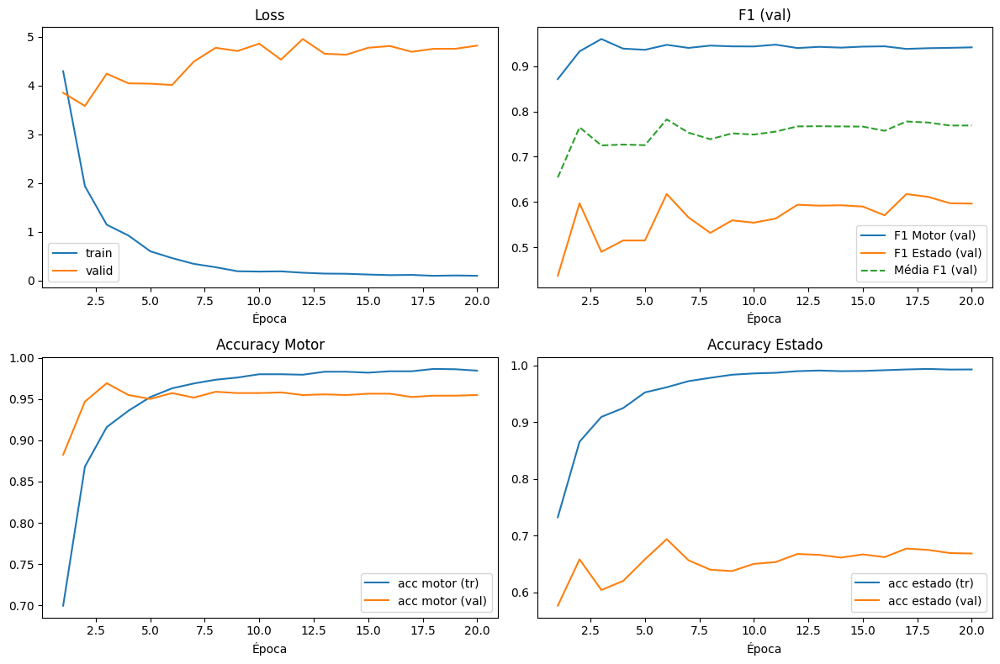

In [36]:
# =========================================
# Script COMPLETO — RNN com Subespectrogramas + AMP + Checkpoints Novos
# =========================================
import os, re, random, time
from pathlib import Path
from collections import defaultdict

import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from tqdm.auto import tqdm

# ----------------------------
# Configs gerais
# ----------------------------
USE_TQDM = True
SEED = 123
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ROOT com fallback para nomes com/sem acento
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")
AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"
OPT_DIR    = ROOT_DIR / "OPT"; OPT_DIR.mkdir(parents=True, exist_ok=True)

print("AUDIO_DIR:", AUDIO_DIR)
print("CSV:", CSV_PATH.exists(), "| XLSX:", XLSX_PATH.exists())

# ----------------------------
# Utilidades
# ----------------------------
def clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

def safe_split_by_class(y, test_size=0.2, random_state=123):
    rng = np.random.RandomState(random_state)
    y = np.asarray(y, dtype=int)
    classes = np.unique(y)
    test_idx, train_idx = [], []
    for c in classes:
        idx_c = np.where(y == c)[0]
        n = len(idx_c)
        if n <= 1:
            train_idx.extend(idx_c.tolist())
        else:
            n_te = max(1, int(round(test_size*n))); n_te = min(n_te, n-1)
            sel = rng.choice(idx_c, size=n_te, replace=False)
            test_idx.extend(sel.tolist())
            train_idx.extend(list(set(idx_c.tolist()) - set(sel.tolist())))
    rng.shuffle(train_idx); rng.shuffle(test_idx)
    return np.array(train_idx), np.array(test_idx)

# ----------------------------
# Carregar índice
# ----------------------------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx não encontrado em ARQ/.")

df.columns = [clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Resolver wav
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# Decodificar intensity_code -> estados
map_comb_txt = {0:"Ausente/desligado",1:"Marcha lenta (desengatada)",
                2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                4:"Velocidade média (frente média)",5:"Variações de aceleração"}
map_elec_txt = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

def decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Desconhecido_{d}")
    return out

dec = df["intensity_code"].apply(decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))
df["target_active"] = (df["active_count"]>0).astype(int)

def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
idx2motor = {i:m for m,i in motor2idx.items()}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(state_code_of_active, axis=1).astype(int)

# Espaço de estado por motor (apenas códigos presentes)
state_meta = {}
for k in range(1,6):
    codes = sorted(df_one.loc[df_one["motor_idx"]==(k-1), "state_code"].unique().tolist())
    if len(codes)==0: codes=[1]
    state2idx = {c:i for i,c in enumerate(codes)}
    idx2state = {i:c for c,i in state2idx.items()}
    state_meta[k] = {"codes": codes, "state2idx": state2idx, "idx2state": idx2state}

df_one["state_idx"] = df_one.apply(lambda r: state_meta[int(r["which_motor"][1])]["state2idx"][int(r["state_code"])], axis=1)

print("Arquivos por motor (1 ativo):")
print(df_one["which_motor"].value_counts().sort_index())

# ----------------------------
# Dataset de janelas (log-mel)
# ----------------------------
class WindowedMelDatasetMT(Dataset):
    def __init__(self, df, sr=44100, seg_dur=0.5, seg_hop=0.25,
                 n_mels=64, n_fft=1024, hop_length=256,
                 fmin=20, fmax=8000, augment=False,
                 max_segments_per_file=60):
        self.df = df.reset_index(drop=True).copy()
        self.sr = sr
        self.seg_samples = int(sr*seg_dur)
        self.hop_samples = int(sr*seg_hop)
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.fmin=fmin; self.fmax=fmax
        self.augment=augment
        self.max_segments_per_file=max_segments_per_file

        self.index = []
        it = range(len(self.df))
        if USE_TQDM: it = tqdm(it, desc="Indexando janelas", leave=False)
        for i in it:
            path = self.df.loc[i,"wav_path"]
            d = float(self.df.loc[i, "duration_s"]) if "duration_s" in self.df.columns and not pd.isna(self.df.loc[i, "duration_s"]) else None
            if d is None:
                try: f = sf.SoundFile(str(path)); d = len(f)/f.samplerate
                except: d = 60.0
            total = int(self.sr*d)
            if total < self.seg_samples:
                starts = [0]
            else:
                nseg = 1 + (total-self.seg_samples)//self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts)>self.max_segments_per_file:
                rng = np.random.RandomState(SEED+i)
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts: self.index.append((i,s))
        if not self.index: raise RuntimeError("Nenhum segmento criado.")

    def __len__(self): return len(self.index)

    def _load_seg(self, path, start):
        y, srr = sf.read(str(path), always_2d=False)
        if y.ndim>1: y=y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else:
                take = min(self.seg_samples, len(y))
                seg[:take] = y[-take:]
        return seg

    def _augment_wave(self, y):
        if np.random.rand()<0.5:
            y *= 10**(np.random.uniform(-3,3)/20)
        if np.random.rand()<0.5:
            y = y + np.random.normal(0, np.std(y)*np.random.uniform(0.0,0.01), size=y.shape).astype(np.float32)
        return y

    def __getitem__(self, idx):
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        seg = self._load_seg(row["wav_path"], start)
        if self.augment: seg = self._augment_wave(seg)

        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd

        # SpecAugment leve
        if self.augment:
            Fm, Tm = S_db.shape
            if np.random.rand()<0.5:
                f = max(1, int(0.10*Fm)); f0 = np.random.randint(0, Fm-f+1)
                S_db[f0:f0+f,:] = 0.0
            if np.random.rand()<0.5:
                t = max(1, int(0.10*Tm)); t0 = np.random.randint(0, Tm-t+1)
                S_db[:,t0:t0+t] = 0.0

        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_idx"])
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, torch.tensor(motor_idx), torch.tensor(state_idx), torch.tensor(motor_k), file_name

# ----------------------------
# Perdas/pesos
# ----------------------------
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction="mean"):
        super().__init__()
        self.alpha=alpha; self.gamma=gamma; self.reduction=reduction
    def forward(self, logits, target):
        ce = F.cross_entropy(logits, target, weight=self.alpha, reduction="none")
        pt = torch.softmax(logits, dim=1).gather(1, target.unsqueeze(1)).squeeze(1).clamp_min(1e-6)
        loss = ((1 - pt) ** self.gamma) * ce
        return loss.mean() if self.reduction=="mean" else (loss.sum() if self.reduction=="sum" else loss)

def make_class_weights_motor(dl):
    ys=[]
    for _, y_m, _, _, _ in dl: ys.append(y_m)
    if not ys: return None
    y = torch.cat(ys).cpu().numpy()
    classes = np.unique(y)
    w = compute_class_weight(class_weight="balanced", classes=classes, y=y)
    full = np.ones(5, dtype=np.float32)
    for c,wc in zip(classes, w): full[int(c)] = wc
    return torch.tensor(full, dtype=torch.float32)

def make_class_weights_states_per_motor(dl, state_meta):
    buckets = {k: [] for k in range(1,6)}
    for _, _, y_s, k, _ in dl:
        k_np = k.numpy(); y_s_np=y_s.numpy()
        for ki in range(1,6):
            mask=(k_np==ki)
            if mask.any(): buckets[ki].extend(y_s_np[mask].tolist())
    weights={}
    for k in range(1,6):
        arr=np.asarray(buckets[k], dtype=int)
        if arr.size==0: weights[k]=None; continue
        classes=np.unique(arr)
        w = compute_class_weight(class_weight="balanced", classes=classes, y=arr)
        Ck = len(state_meta[k]["codes"])
        full=np.ones(Ck, dtype=np.float32)
        for c,wc in zip(classes, w): full[int(c)]=wc
        weights[k]=torch.tensor(full, dtype=torch.float32)
    return weights

# ----------------------------
# Módulos básicos
# ----------------------------
class MeanAttention(nn.Module):
    def __init__(self, d): super().__init__(); self.w = nn.Linear(d,1)
    def forward(self, z):
        a = torch.softmax(self.w(z).squeeze(-1), dim=1)
        return (z * a.unsqueeze(-1)).sum(dim=1)

# Cabeça multitarefa com padding seguro (NEG_INF)
NEG_INF = -1e4  # seguro para fp16
class HeadMultiTask(nn.Module):
    def __init__(self, feat_dim, state_meta):
        super().__init__()
        self.state_meta = state_meta
        self.motor_head = nn.Linear(feat_dim, 5)
        self.state_heads = nn.ModuleDict()
        for k in range(1,6):
            self.state_heads[str(k)] = nn.Linear(feat_dim, len(state_meta[k]["codes"]))
    def forward(self, z, motor_k=None):
        logits_motor = self.motor_head(z)
        if motor_k is None: return logits_motor
        B = z.size(0)
        Cmax = max(len(self.state_meta[int(m.item())]["codes"]) for m in motor_k)
        logits_state = torch.full((B, Cmax), fill_value=NEG_INF, device=z.device, dtype=z.dtype)
        for i in range(B):
            k = str(int(motor_k[i].item()))
            out = self.state_heads[k](z[i:i+1]).squeeze(0)
            logits_state[i, :out.numel()] = out
        return logits_motor, logits_state

# ----------------------------
# RNN com Subespectrogramas
# ----------------------------
class ModelGRU_SubSpec(nn.Module):
    """
    Divide o eixo de frequência em N_BANDS subespectrogramas (faixas contíguas),
    processa cada um com uma GRU bidirecional + atenção e agrega (concatena + projeta).
    """
    def __init__(self, n_mels, state_meta, n_bands=4, hidden=96, layers=2, dropout=0.15):
        super().__init__()
        assert n_mels % n_bands == 0, "n_mels deve ser divisível por n_bands"
        self.n_bands = n_bands
        self.band_bins = n_mels // n_bands

        self.rnns = nn.ModuleList([
            nn.GRU(self.band_bins, hidden, num_layers=layers, batch_first=True, bidirectional=True, dropout=dropout)
            for _ in range(n_bands)
        ])
        self.attns = nn.ModuleList([MeanAttention(2*hidden) for _ in range(n_bands)])
        self.drop  = nn.Dropout(dropout)

        feat_dim = n_bands * (2*hidden)
        self.fuse = nn.Linear(feat_dim, 2*hidden)  # projeta concatenação para um tamanho compacto
        self.head = HeadMultiTask(2*hidden, state_meta)

    def forward(self, x, motor_k=None):
        # x: [B, T, n_mels]
        B,T,F = x.shape
        z_list=[]
        # recorta subespectrogramas ao longo do eixo de mel
        for i in range(self.n_bands):
            f0 = i*self.band_bins
            f1 = f0 + self.band_bins
            xb = x[:,:,f0:f1]                 # [B, T, F_band]
            zb,_ = self.rnns[i](xb)           # [B, T, 2*hidden]
            zb   = self.attns[i](zb)          # [B, 2*hidden]
            z_list.append(zb)
        z = torch.cat(z_list, dim=1)          # [B, n_bands*2*hidden]
        z = self.drop(z)
        z = torch.tanh(self.fuse(z))          # [B, 2*hidden]
        return self.head(z, motor_k)

# Builder de modelos AQUI NUMERO DE BANDAS
def build_model(model_type, n_mels, state_meta):
    if model_type == "rnn_subspec":
        return ModelGRU_SubSpec(n_mels=n_mels, state_meta=state_meta, n_bands=4, hidden=96, layers=2, dropout=0.15)
    # versões simples (caso queira comparar)
    if model_type == "rnn":
        class ModelGRU(nn.Module):
            def __init__(self, n_mels, state_meta, hidden=128, layers=2, dropout=0.2):
                super().__init__()
                self.rnn = nn.GRU(n_mels, hidden, num_layers=layers, batch_first=True, bidirectional=True, dropout=dropout)
                self.attn= MeanAttention(2*hidden); self.drop=nn.Dropout(dropout)
                self.head= HeadMultiTask(2*hidden, state_meta)
            def forward(self, x, motor_k=None):
                z,_ = self.rnn(x); z=self.attn(z); z=self.drop(z); return self.head(z, motor_k)
        return ModelGRU(n_mels, state_meta)
    raise ValueError("model_type inválido.")

# ----------------------------
# Avaliação por arquivo (padding com NEG_INF)
# ----------------------------
def eval_file_level(model, dl_te, state_meta):
    model.eval()
    motor_logits_by_file = defaultdict(list)
    state_logits_by_file = defaultdict(list)
    true_motor_by_file   = {}
    true_state_by_file   = {}

    with torch.no_grad():
        for xb, y_m, y_s, k, fns in tqdm(dl_te, desc="agregando por arquivo", leave=False):
            xb = xb.to(device); k = k.to(device)
            lm, ls_pad = model(xb, motor_k=k)
            for i, fid in enumerate(fns):
                if fid not in true_motor_by_file:
                    true_motor_by_file[fid] = int(y_m[i].cpu().item())
                if fid not in true_state_by_file:
                    true_state_by_file[fid] = int(y_s[i].cpu().item())
                motor_logits_by_file[fid].append(lm[i].detach().cpu())
                ki = int(k[i].item()); Ck = len(state_meta[ki]["codes"])
                state_logits_by_file[fid].append(ls_pad[i, :Ck].detach().cpu())

    yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
    for fid in motor_logits_by_file.keys():
        m = torch.stack(motor_logits_by_file[fid], dim=0).mean(dim=0)
        m_pred = int(torch.argmax(m).item())
        yM_true.append(true_motor_by_file[fid]); yM_pred.append(m_pred)

        Ck_set = {t.numel() for t in state_logits_by_file[fid]}
        if len(Ck_set)==1:
            s = torch.stack(state_logits_by_file[fid], dim=0).mean(dim=0)
        else:
            Ck = max(Ck_set)
            pad = torch.full((len(state_logits_by_file[fid]), Ck), fill_value=NEG_INF)
            for i,tv in enumerate(state_logits_by_file[fid]): pad[i,:tv.numel()] = tv
            s = pad.mean(dim=0)
        s_pred = int(torch.argmax(s).item())
        yS_true.append(true_state_by_file[fid]); yS_pred.append(s_pred)

    print("\n=== File-level: MOTOR ===")
    labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
    print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
    print("Confusão (motor, file-level):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))

    print("\n=== File-level: ESTADO ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))

# ----------------------------
# Treino com checkpoint + métricas (AMP novo)
# ----------------------------
def ensure_parent_dir(path: Path):
    Path(path).parent.mkdir(parents=True, exist_ok=True)

def _latest_ckpt(ckpt_dir: Path):
    pats = sorted(ckpt_dir.glob("epoch_*.pt"))
    return pats[-1] if pats else None

def _save_ckpt(ckpt_path: Path, epoch, model, opt, sch, best_score, history=None):
    ensure_parent_dir(ckpt_path)
    state = {
        "epoch": epoch,
        "model": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scheduler": sch.state_dict() if sch is not None else None,
        "best_score": best_score,
        "history": history,
    }
    torch.save(state, ckpt_path)

def _load_ckpt(ckpt_path: Path, model, opt, sch):
    # em PyTorch 2.6+, weights_only=True é default. Usar False pq checkpoint tem optimizer/scheduler.
    state = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    model.load_state_dict(state["model"])
    if opt is not None and state.get("optimizer"): opt.load_state_dict(state["optimizer"])
    if sch is not None and state.get("scheduler") is not None: sch.load_state_dict(state["scheduler"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_score  = float(state.get("best_score", -1.0))
    history     = state.get("history", None)
    return start_epoch, best_score, history

def train_multitask_torch_with_ckpt(
    df_labels, state_meta, model_type="rnn_subspec",
    # features
    sr=44100, seg_dur=0.5, seg_hop=0.25,
    n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000,
    # treino
    batch_size=64, epochs=20, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=None, seed=123,
    # checkpoint
    ckpt_dir: Path = Path("./ckp"),
    resume=False, ckpt_interval=1
):
    # split por arquivo
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"]="train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS=0
    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    model = build_model(model_type, n_mels, state_meta).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))

    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    # AMP moderno
    scaler = torch.amp.GradScaler("cuda" if torch.cuda.is_available() else "cpu")

    # ckpt + histórico
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    hist_csv_path = ckpt_dir / "metrics_history.csv"
    hist = []
    start_epoch=1; best={"score":-1.0, "state":None}

    if resume:
        last = _latest_ckpt(ckpt_dir)
        if last is not None:
            start_epoch, best["score"], hist_loaded = _load_ckpt(last, model, opt, sch)
            if hist_loaded is not None: hist = hist_loaded
            elif hist_csv_path.exists():
                try: hist = pd.read_csv(hist_csv_path).to_dict(orient="records")
                except: pass
            print(f"[ckpt] retomando de {last.name} -> start_epoch={start_epoch}, best_score={best['score']:.3f}")
        else:
            print("[ckpt] nenhum checkpoint encontrado; iniciando do zero.")
    else:
        print("[ckpt] treino novo (resume=False).")

    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                with torch.amp.autocast(device_type="cuda" if torch.cuda.is_available() else "cpu"):
                    logits_motor, logits_state_pad = model(xb, motor_k=k)
                    # motor
                    loss_motor = crit_motor(logits_motor, y_m)
                    # estado — Focal por cabeça
                    loss_state = 0.0
                    for ki in range(1,6):
                        mask = (k==ki)
                        if mask.any():
                            Ck = len(state_meta[ki]["codes"])
                            logits_k = logits_state_pad[mask, :Ck]
                            y_s_k = y_s[mask]
                            w_k = w_states.get(ki, None)
                            crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                            loss_state = loss_state + crit_k(logits_k, y_s_k)
                    loss = alpha_motor*loss_motor + alpha_state*loss_state

                if train:
                    opt.zero_grad(set_to_none=True)
                    scaler.scale(loss).backward()
                    scaler.step(opt)
                    scaler.update()

            losses.append(loss.detach().item())
            # métricas (segmentos)
            yM_true.extend(y_m.detach().cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).detach().cpu().numpy().tolist())
            yS_true_all.extend(y_s.detach().cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).detach().cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    ep_iter = range(start_epoch, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino ({model_type})")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        # passo do scheduler DEPOIS do optimizer
        sch.step(te_loss)

        row = {
            "epoch": ep,
            "tr_loss": tr_loss, "tr_acc_motor": tr_accM, "tr_f1_motor": tr_f1M,
            "tr_acc_state": tr_accS, "tr_f1_state": tr_f1S,
            "te_loss": te_loss, "te_acc_motor": te_accM, "te_f1_motor": te_f1M,
            "te_acc_state": te_accS, "te_f1_state": te_f1S,
            "score_avg_f1": (te_f1M + te_f1S)/2.0
        }
        hist.append(row)
        pd.DataFrame(hist).to_csv(hist_csv_path, index=False)

        tqdm.write(
            f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
            f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
            f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
            f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})"
        )

        if ckpt_interval and (ep % ckpt_interval == 0):
            ckpt_path = ckpt_dir / f"epoch_{ep:03d}.pt"
            _save_ckpt(ckpt_path, ep, model, opt, sch, best_score=best["score"], history=hist)
            _save_ckpt(ckpt_dir / "last.pt", ep, model, opt, sch, best_score=best["score"], history=hist)

        score = row["score_avg_f1"]
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}
            if save_path:
                ensure_parent_dir(save_path)
                torch.save({"epoch": ep, "best_score": score, "state": best["state"]}, save_path)
                tqdm.write(f"[melhor] ep={ep} score={score:.3f} -> salvo best em: {save_path}")

    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"[{model_type}] Melhor score (avg F1 M+S): {best['score']:.3f} | best={save_path}")

    # Relatórios finais (segmentos)
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
    eval_segments()

    return model, (dl_tr, dl_te), df_labels

# =========================================
# Execução — CEL 9
# =========================================
# Hiperparâmetros de features
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256

MODEL_TO_RUN = "rnn_subspec"

# Split e loaders serão criados dentro da função
stamp = time.strftime("%Y%m%d_%H%M%S")
CKPT_DIR = Path(ROOT_DIR) / f"ckp_{MODEL_TO_RUN}_{stamp}"
CKPT_DIR.mkdir(parents=True, exist_ok=True)
HIST_PATH = CKPT_DIR / "metrics_history.csv"
SAVE_PATH = OPT_DIR / f"model_{MODEL_TO_RUN}_{stamp}.pt"

model_torch, loaders_torch, dfMT = train_multitask_torch_with_ckpt(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    model_type=MODEL_TO_RUN,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=64, epochs=20, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=SAVE_PATH,
    seed=123,
    ckpt_dir=CKPT_DIR,
    resume=False,           # << NOVO TREINAMENTO
    ckpt_interval=1
)

# Avaliação por arquivo
eval_file_level(model_torch, loaders_torch[1], state_meta)
print(f"\nHistórico salvo em: {HIST_PATH}")

# Curvas de treino
if HIST_PATH.exists():
    hist = pd.read_csv(HIST_PATH)
    fig, axes = plt.subplots(2, 2, figsize=(12,8))
    axes = axes.ravel()

    axes[0].plot(hist["epoch"], hist["tr_loss"], label="train")
    axes[0].plot(hist["epoch"], hist["te_loss"], label="valid")
    axes[0].set_title("Loss"); axes[0].set_xlabel("Época"); axes[0].legend()

    axes[1].plot(hist["epoch"], hist["te_f1_motor"], label="F1 Motor (val)")
    axes[1].plot(hist["epoch"], hist["te_f1_state"], label="F1 Estado (val)")
    axes[1].plot(hist["epoch"], hist["score_avg_f1"], label="Média F1 (val)", linestyle="--")
    axes[1].set_title("F1 (val)"); axes[1].set_xlabel("Época"); axes[1].legend()

    axes[2].plot(hist["epoch"], hist["tr_acc_motor"], label="acc motor (tr)")
    axes[2].plot(hist["epoch"], hist["te_acc_motor"], label="acc motor (val)")
    axes[2].set_title("Accuracy Motor"); axes[2].set_xlabel("Época"); axes[2].legend()

    axes[3].plot(hist["epoch"], hist["tr_acc_state"], label="acc estado (tr)")
    axes[3].plot(hist["epoch"], hist["te_acc_state"], label="acc estado (val)")
    axes[3].set_title("Accuracy Estado"); axes[3].set_xlabel("Época"); axes[3].legend()

    plt.tight_layout(); plt.show()
else:
    print("CSV de métricas ainda não existe. Treine pelo menos 1 época.")


### COM 6 ESPEC

Device: cuda
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV: True | XLSX: True
Arquivos por motor (1 ativo):
which_motor
M1    52
M2    15
M3    16
M4    14
M5    12
Name: count, dtype: int64
>> Salvando em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06
Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] treino novo (resume=False).


Treino (rnn_subspec):   0%|          | 0/20 [00:00<?, ?it/s]

train ep01:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/20 [00:00<?, ?it/s]

[01] loss_tr=3.6511 M(tr acc=0.742 f1=0.730) S(tr acc=0.759 f1=0.690) | loss_te=3.8009 M(te acc=0.857 f1=0.819) S(te acc=0.613 f1=0.484)
[melhor] ep=1 score=0.652 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep02:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/20 [00:00<?, ?it/s]

[02] loss_tr=1.6264 M(tr acc=0.886 f1=0.881) S(tr acc=0.884 f1=0.842) | loss_te=5.4123 M(te acc=0.934 f1=0.920) S(te acc=0.643 f1=0.414)
[melhor] ep=2 score=0.667 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep03:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/20 [00:00<?, ?it/s]

[03] loss_tr=1.0566 M(tr acc=0.927 f1=0.923) S(tr acc=0.919 f1=0.884) | loss_te=4.5916 M(te acc=0.954 f1=0.941) S(te acc=0.632 f1=0.465)
[melhor] ep=3 score=0.703 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep04:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/20 [00:00<?, ?it/s]

[04] loss_tr=0.8758 M(tr acc=0.943 f1=0.939) S(tr acc=0.937 f1=0.915) | loss_te=4.1333 M(te acc=0.924 f1=0.914) S(te acc=0.665 f1=0.585)
[melhor] ep=4 score=0.750 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep05:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/20 [00:00<?, ?it/s]

[05] loss_tr=0.3945 M(tr acc=0.960 f1=0.959) S(tr acc=0.966 f1=0.957) | loss_te=4.3018 M(te acc=0.951 f1=0.939) S(te acc=0.682 f1=0.572)
[melhor] ep=5 score=0.755 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep06:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/20 [00:00<?, ?it/s]

[06] loss_tr=0.2834 M(tr acc=0.968 f1=0.967) S(tr acc=0.979 f1=0.973) | loss_te=4.6109 M(te acc=0.948 f1=0.930) S(te acc=0.675 f1=0.580)


train ep07:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/20 [00:00<?, ?it/s]

[07] loss_tr=0.2852 M(tr acc=0.967 f1=0.966) S(tr acc=0.978 f1=0.972) | loss_te=4.3994 M(te acc=0.937 f1=0.912) S(te acc=0.679 f1=0.584)


train ep08:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/20 [00:00<?, ?it/s]

[08] loss_tr=0.2161 M(tr acc=0.975 f1=0.974) S(tr acc=0.985 f1=0.980) | loss_te=4.4433 M(te acc=0.943 f1=0.928) S(te acc=0.693 f1=0.610)
[melhor] ep=8 score=0.769 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep09:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/20 [00:00<?, ?it/s]

[09] loss_tr=0.2210 M(tr acc=0.975 f1=0.974) S(tr acc=0.981 f1=0.978) | loss_te=4.6574 M(te acc=0.949 f1=0.934) S(te acc=0.675 f1=0.580)


train ep10:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/20 [00:00<?, ?it/s]

[10] loss_tr=0.1905 M(tr acc=0.977 f1=0.976) S(tr acc=0.987 f1=0.982) | loss_te=4.5651 M(te acc=0.948 f1=0.934) S(te acc=0.683 f1=0.595)


train ep11:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/20 [00:00<?, ?it/s]

[11] loss_tr=0.1946 M(tr acc=0.977 f1=0.976) S(tr acc=0.986 f1=0.982) | loss_te=4.7233 M(te acc=0.944 f1=0.927) S(te acc=0.674 f1=0.587)


train ep12:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/20 [00:00<?, ?it/s]

[12] loss_tr=0.1337 M(tr acc=0.980 f1=0.980) S(tr acc=0.993 f1=0.990) | loss_te=4.7139 M(te acc=0.944 f1=0.926) S(te acc=0.684 f1=0.595)


train ep13:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/20 [00:00<?, ?it/s]

[13] loss_tr=0.1332 M(tr acc=0.981 f1=0.980) S(tr acc=0.990 f1=0.987) | loss_te=4.7086 M(te acc=0.951 f1=0.935) S(te acc=0.690 f1=0.605)
[melhor] ep=13 score=0.770 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep14:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/20 [00:00<?, ?it/s]

[14] loss_tr=0.1345 M(tr acc=0.981 f1=0.981) S(tr acc=0.991 f1=0.988) | loss_te=4.6603 M(te acc=0.943 f1=0.924) S(te acc=0.690 f1=0.605)


train ep15:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/20 [00:00<?, ?it/s]

[15] loss_tr=0.1287 M(tr acc=0.981 f1=0.981) S(tr acc=0.992 f1=0.989) | loss_te=4.5690 M(te acc=0.946 f1=0.930) S(te acc=0.692 f1=0.609)


train ep16:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/20 [00:00<?, ?it/s]

[16] loss_tr=0.1226 M(tr acc=0.981 f1=0.980) S(tr acc=0.993 f1=0.991) | loss_te=4.7077 M(te acc=0.949 f1=0.933) S(te acc=0.683 f1=0.590)


train ep17:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/20 [00:00<?, ?it/s]

[17] loss_tr=0.1297 M(tr acc=0.982 f1=0.981) S(tr acc=0.992 f1=0.990) | loss_te=4.6632 M(te acc=0.949 f1=0.934) S(te acc=0.693 f1=0.608)
[melhor] ep=17 score=0.771 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep18:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/20 [00:00<?, ?it/s]

[18] loss_tr=0.1252 M(tr acc=0.983 f1=0.982) S(tr acc=0.992 f1=0.990) | loss_te=4.5368 M(te acc=0.950 f1=0.936) S(te acc=0.689 f1=0.606)
[melhor] ep=18 score=0.771 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


train ep19:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/20 [00:00<?, ?it/s]

[19] loss_tr=0.1163 M(tr acc=0.983 f1=0.982) S(tr acc=0.993 f1=0.991) | loss_te=4.6570 M(te acc=0.946 f1=0.930) S(te acc=0.683 f1=0.593)


train ep20:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/20 [00:00<?, ?it/s]

[20] loss_tr=0.1295 M(tr acc=0.982 f1=0.982) S(tr acc=0.993 f1=0.990) | loss_te=4.6793 M(te acc=0.948 f1=0.932) S(te acc=0.677 f1=0.589)
[rnn_subspec] Melhor score (avg F1 M+S): 0.771 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt


aval seg:   0%|          | 0/20 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.98      0.99      0.98       600
          M2       0.82      0.94      0.88       180
          M3       0.97      0.82      0.89       180
          M4       0.99      0.89      0.94       180
          M5       0.94      1.00      0.97       120

    accuracy                           0.95      1260
   macro avg       0.94      0.93      0.93      1260
weighted avg       0.95      0.95      0.95      1260

Confusão (motor):
 [[596   4   0   0   0]
 [  6 170   3   1   0]
 [  5  26 148   1   0]
 [  4   7   2 160   7]
 [  0   0   0   0 120]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       0.88      0.33      0.48       180
           1       0.69      0.91      0.79       600
           2       0.91      0.42      0.57       180
           3       0.60      0.51      0.55       240
           4       0.42      0.82      0.55 

agregando por arquivo:   0%|          | 0/20 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       1.00      1.00      1.00         3
          M3       1.00      1.00      1.00         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  0  3  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.64      0.90      0.75        10
           2       1.00      0.67      0.80         3
           3       1.00      0.50      0.67         4
           4       0.50      1.00      0.67         1

    accu

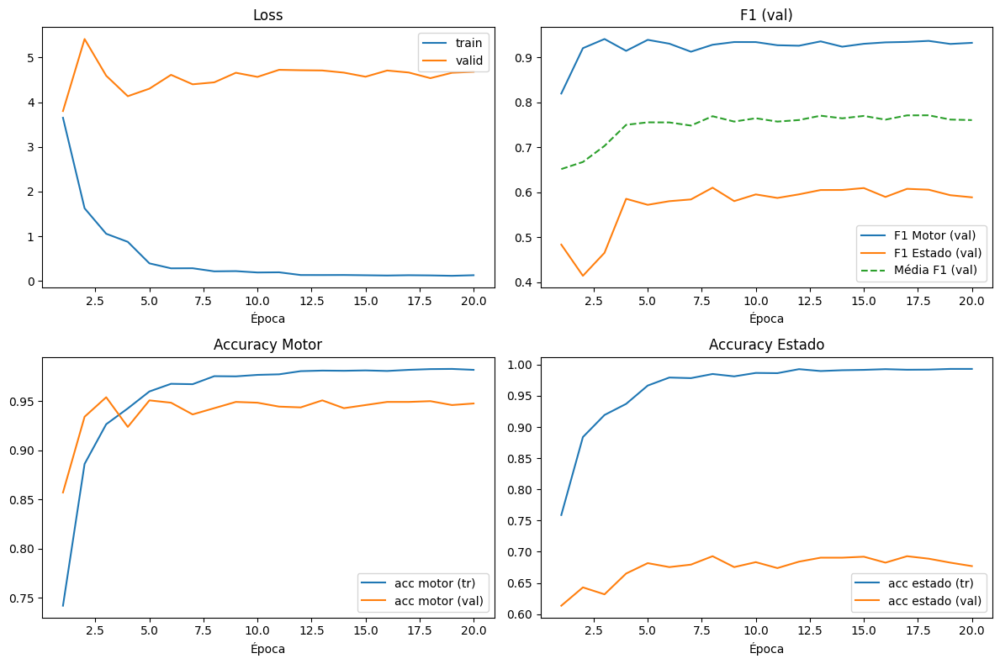

In [38]:
# =========================================
# Script COMPLETO — RNN com 6 Subespectrogramas + AMP + Checkpoints Novos
# =========================================
import os, re, random, time
from pathlib import Path
from collections import defaultdict

import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from tqdm.auto import tqdm

# ----------------------------
# Configs gerais
# ----------------------------
USE_TQDM = True
SEED = 123
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ROOT com fallback para nomes com/sem acento
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")
AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

# SAÍDA: SUB_06
OUT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06")
OUT_DIR.mkdir(parents=True, exist_ok=True)

print("AUDIO_DIR:", AUDIO_DIR)
print("CSV:", CSV_PATH.exists(), "| XLSX:", XLSX_PATH.exists())

# ----------------------------
# Utilidades
# ----------------------------
def clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

def safe_split_by_class(y, test_size=0.2, random_state=123):
    rng = np.random.RandomState(random_state)
    y = np.asarray(y, dtype=int)
    classes = np.unique(y)
    test_idx, train_idx = [], []
    for c in classes:
        idx_c = np.where(y == c)[0]
        n = len(idx_c)
        if n <= 1:
            train_idx.extend(idx_c.tolist())
        else:
            n_te = max(1, int(round(test_size*n))); n_te = min(n_te, n-1)
            sel = rng.choice(idx_c, size=n_te, replace=False)
            test_idx.extend(sel.tolist())
            train_idx.extend(list(set(idx_c.tolist()) - set(sel.tolist())))
    rng.shuffle(train_idx); rng.shuffle(test_idx)
    return np.array(train_idx), np.array(test_idx)

# ----------------------------
# Carregar índice
# ----------------------------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx não encontrado em ARQ/.")

df.columns = [clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Resolver wav
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# Decodificar intensity_code -> estados
map_comb_txt = {0:"Ausente/desligado",1:"Marcha lenta (desengatada)",
                2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                4:"Velocidade média (frente média)",5:"Variações de aceleração"}
map_elec_txt = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

def decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Desconhecido_{d}")
    return out

dec = df["intensity_code"].apply(decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))
df["target_active"] = (df["active_count"]>0).astype(int)

def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
idx2motor = {i:m for m,i in motor2idx.items()}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(state_code_of_active, axis=1).astype(int)

# Espaço de estado por motor (apenas códigos presentes)
state_meta = {}
for k in range(1,6):
    codes = sorted(df_one.loc[df_one["motor_idx"]==(k-1), "state_code"].unique().tolist())
    if len(codes)==0: codes=[1]
    state2idx = {c:i for i,c in enumerate(codes)}
    idx2state = {i:c for c,i in state2idx.items()}
    state_meta[k] = {"codes": codes, "state2idx": state2idx, "idx2state": idx2state}

df_one["state_idx"] = df_one.apply(lambda r: state_meta[int(r["which_motor"][1])]["state2idx"][int(r["state_code"])], axis=1)

print("Arquivos por motor (1 ativo):")
print(df_one["which_motor"].value_counts().sort_index())

# ----------------------------
# Dataset de janelas (log-mel)
# ----------------------------
class WindowedMelDatasetMT(Dataset):
    def __init__(self, df, sr=44100, seg_dur=0.5, seg_hop=0.25,
                 n_mels=64, n_fft=1024, hop_length=256,
                 fmin=20, fmax=8000, augment=False,
                 max_segments_per_file=60):
        self.df = df.reset_index(drop=True).copy()
        self.sr = sr
        self.seg_samples = int(sr*seg_dur)
        self.hop_samples = int(sr*seg_hop)
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.fmin=fmin; self.fmax=fmax
        self.augment=augment
        self.max_segments_per_file=max_segments_per_file

        self.index = []
        it = range(len(self.df))
        if USE_TQDM: it = tqdm(it, desc="Indexando janelas", leave=False)
        for i in it:
            path = self.df.loc[i,"wav_path"]
            d = float(self.df.loc[i, "duration_s"]) if "duration_s" in self.df.columns and not pd.isna(self.df.loc[i, "duration_s"]) else None
            if d is None:
                try: f = sf.SoundFile(str(path)); d = len(f)/f.samplerate
                except: d = 60.0
            total = int(self.sr*d)
            if total < self.seg_samples:
                starts = [0]
            else:
                nseg = 1 + (total-self.seg_samples)//self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts)>self.max_segments_per_file:
                rng = np.random.RandomState(SEED+i)
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts: self.index.append((i,s))
        if not self.index: raise RuntimeError("Nenhum segmento criado.")

    def __len__(self): return len(self.index)

    def _load_seg(self, path, start):
        y, srr = sf.read(str(path), always_2d=False)
        if y.ndim>1: y=y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else:
                take = min(self.seg_samples, len(y))
                seg[:take] = y[-take:]
        return seg

    def _augment_wave(self, y):
        if np.random.rand()<0.5:
            y *= 10**(np.random.uniform(-3,3)/20)
        if np.random.rand()<0.5:
            y = y + np.random.normal(0, np.std(y)*np.random.uniform(0.0,0.01), size=y.shape).astype(np.float32)
        return y

    def __getitem__(self, idx):
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        seg = self._load_seg(row["wav_path"], start)
        if self.augment: seg = self._augment_wave(seg)

        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd

        # SpecAugment leve
        if self.augment:
            Fm, Tm = S_db.shape
            if np.random.rand()<0.5:
                f = max(1, int(0.10*Fm)); f0 = np.random.randint(0, Fm-f+1)
                S_db[f0:f0+f,:] = 0.0
            if np.random.rand()<0.5:
                t = max(1, int(0.10*Tm)); t0 = np.random.randint(0, Tm-t+1)
                S_db[:,t0:t0+t] = 0.0

        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_idx"])
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, torch.tensor(motor_idx), torch.tensor(state_idx), torch.tensor(motor_k), file_name

# ----------------------------
# Perdas/pesos
# ----------------------------
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction="mean"):
        super().__init__()
        self.alpha=alpha; self.gamma=gamma; self.reduction=reduction
    def forward(self, logits, target):
        ce = F.cross_entropy(logits, target, weight=self.alpha, reduction="none")
        pt = torch.softmax(logits, dim=1).gather(1, target.unsqueeze(1)).squeeze(1).clamp_min(1e-6)
        loss = ((1 - pt) ** self.gamma) * ce
        return loss.mean() if self.reduction=="mean" else (loss.sum() if self.reduction=="sum" else loss)

def make_class_weights_motor(dl):
    ys=[]
    for _, y_m, _, _, _ in dl: ys.append(y_m)
    if not ys: return None
    y = torch.cat(ys).cpu().numpy()
    classes = np.unique(y)
    w = compute_class_weight(class_weight="balanced", classes=classes, y=y)
    full = np.ones(5, dtype=np.float32)
    for c,wc in zip(classes, w): full[int(c)] = wc
    return torch.tensor(full, dtype=torch.float32)

def make_class_weights_states_per_motor(dl, state_meta):
    buckets = {k: [] for k in range(1,6)}
    for _, _, y_s, k, _ in dl:
        k_np = k.numpy(); y_s_np=y_s.numpy()
        for ki in range(1,6):
            mask=(k_np==ki)
            if mask.any(): buckets[ki].extend(y_s_np[mask].tolist())
    weights={}
    for k in range(1,6):
        arr=np.asarray(buckets[k], dtype=int)
        if arr.size==0: weights[k]=None; continue
        classes=np.unique(arr)
        w = compute_class_weight(class_weight="balanced", classes=classes, y=arr)
        Ck = len(state_meta[k]["codes"])
        full=np.ones(Ck, dtype=np.float32)
        for c,wc in zip(classes, w): full[int(c)]=wc
        weights[k]=torch.tensor(full, dtype=torch.float32)
    return weights

# ----------------------------
# Módulos básicos
# ----------------------------
class MeanAttention(nn.Module):
    def __init__(self, d): super().__init__(); self.w = nn.Linear(d,1)
    def forward(self, z):
        a = torch.softmax(self.w(z).squeeze(-1), dim=1)
        return (z * a.unsqueeze(-1)).sum(dim=1)

# Cabeça multitarefa com padding seguro (NEG_INF)
NEG_INF = -1e4  # seguro para fp16
class HeadMultiTask(nn.Module):
    def __init__(self, feat_dim, state_meta):
        super().__init__()
        self.state_meta = state_meta
        self.motor_head = nn.Linear(feat_dim, 5)
        self.state_heads = nn.ModuleDict()
        for k in range(1,6):
            self.state_heads[str(k)] = nn.Linear(feat_dim, len(state_meta[k]["codes"]))
    def forward(self, z, motor_k=None):
        logits_motor = self.motor_head(z)
        if motor_k is None: return logits_motor
        B = z.size(0)
        Cmax = max(len(self.state_meta[int(m.item())]["codes"]) for m in motor_k)
        logits_state = torch.full((B, Cmax), fill_value=NEG_INF, device=z.device, dtype=z.dtype)
        for i in range(B):
            k = str(int(motor_k[i].item()))
            out = self.state_heads[k](z[i:i+1]).squeeze(0)
            logits_state[i, :out.numel()] = out
        return logits_motor, logits_state

# ----------------------------
# RNN com 6 Subespectrogramas (divisão robusta)
# ----------------------------
class ModelGRU_SubSpec(nn.Module):
    """
    Divide o eixo de frequência em n_bands subespectrogramas (faixas contíguas),
    processa cada um com uma GRU bidirecional + atenção e agrega (concatena + projeta).
    A divisão é robusta: reparte as sobras quando n_mels não é múltiplo de n_bands.
    """
    def __init__(self, n_mels, state_meta, n_bands=6, hidden=96, layers=2, dropout=0.15):
        super().__init__()
        assert n_bands >= 2, "n_bands deve ser >= 2"
        self.n_bands = n_bands
        self.slices = self._make_slices(n_mels, n_bands)  # lista de (f0,f1)

        self.rnns = nn.ModuleList([
            nn.GRU(self.slices[i][1] - self.slices[i][0], hidden,
                   num_layers=layers, batch_first=True,
                   bidirectional=True, dropout=dropout)
            for i in range(n_bands)
        ])
        self.attns = nn.ModuleList([MeanAttention(2*hidden) for _ in range(n_bands)])
        self.drop  = nn.Dropout(dropout)

        feat_dim = n_bands * (2*hidden)
        self.fuse = nn.Linear(feat_dim, 2*hidden)  # projeta concatenação
        self.head = HeadMultiTask(2*hidden, state_meta)

    @staticmethod
    def _make_slices(n_mels: int, n_bands: int):
        """
        Cria cortes quase uniformes cobrindo [0, n_mels).
        Ex.: n_mels=64, n_bands=6 -> tamanhos [11,11,11,11,10,10]
        """
        base = n_mels // n_bands
        rest = n_mels % n_bands
        sizes = [base + (1 if i < rest else 0) for i in range(n_bands)]
        slices = []
        f0 = 0
        for sz in sizes:
            f1 = f0 + sz
            slices.append((f0, f1))
            f0 = f1
        return slices

    def forward(self, x, motor_k=None):
        # x: [B, T, n_mels]
        z_list = []
        for i, (f0, f1) in enumerate(self.slices):
            xb = x[:, :, f0:f1]             # [B, T, F_band_i]
            zb, _ = self.rnns[i](xb)        # [B, T, 2*hidden]
            zb    = self.attns[i](zb)       # [B, 2*hidden]
            z_list.append(zb)
        z = torch.cat(z_list, dim=1)        # [B, n_bands*2*hidden]
        z = self.drop(z)
        z = torch.tanh(self.fuse(z))        # [B, 2*hidden]
        return self.head(z, motor_k)

# Builder
def build_model(model_type, n_mels, state_meta):
    if model_type == "rnn_subspec":
        return ModelGRU_SubSpec(n_mels=n_mels, state_meta=state_meta, n_bands=6,
                                hidden=96, layers=2, dropout=0.15)
    if model_type == "rnn":
        class ModelGRU(nn.Module):
            def __init__(self, n_mels, state_meta, hidden=128, layers=2, dropout=0.2):
                super().__init__()
                self.rnn  = nn.GRU(n_mels, hidden, num_layers=layers, batch_first=True,
                                   bidirectional=True, dropout=dropout)
                self.attn = MeanAttention(2*hidden)
                self.drop = nn.Dropout(dropout)
                self.head = HeadMultiTask(2*hidden, state_meta)
            def forward(self, x, motor_k=None):
                z,_ = self.rnn(x)
                z   = self.attn(z)
                z   = self.drop(z)
                return self.head(z, motor_k)
        return ModelGRU(n_mels, state_meta)
    raise ValueError("model_type inválido.")

# ----------------------------
# Avaliação por arquivo (padding com NEG_INF)
# ----------------------------
def eval_file_level(model, dl_te, state_meta):
    model.eval()
    motor_logits_by_file = defaultdict(list)
    state_logits_by_file = defaultdict(list)
    true_motor_by_file   = {}
    true_state_by_file   = {}

    with torch.no_grad():
        for xb, y_m, y_s, k, fns in tqdm(dl_te, desc="agregando por arquivo", leave=False):
            xb = xb.to(device); k = k.to(device)
            lm, ls_pad = model(xb, motor_k=k)
            for i, fid in enumerate(fns):
                if fid not in true_motor_by_file:
                    true_motor_by_file[fid] = int(y_m[i].cpu().item())
                if fid not in true_state_by_file:
                    true_state_by_file[fid] = int(y_s[i].cpu().item())
                motor_logits_by_file[fid].append(lm[i].detach().cpu())
                ki = int(k[i].item()); Ck = len(state_meta[ki]["codes"])
                state_logits_by_file[fid].append(ls_pad[i, :Ck].detach().cpu())

    yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
    for fid in motor_logits_by_file.keys():
        m = torch.stack(motor_logits_by_file[fid], dim=0).mean(dim=0)
        m_pred = int(torch.argmax(m).item())
        yM_true.append(true_motor_by_file[fid]); yM_pred.append(m_pred)

        Ck_set = {t.numel() for t in state_logits_by_file[fid]}
        if len(Ck_set)==1:
            s = torch.stack(state_logits_by_file[fid], dim=0).mean(dim=0)
        else:
            Ck = max(Ck_set)
            pad = torch.full((len(state_logits_by_file[fid]), Ck), fill_value=NEG_INF)
            for i,tv in enumerate(state_logits_by_file[fid]): pad[i,:tv.numel()] = tv
            s = pad.mean(dim=0)
        s_pred = int(torch.argmax(s).item())
        yS_true.append(true_state_by_file[fid]); yS_pred.append(s_pred)

    print("\n=== File-level: MOTOR ===")
    labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
    print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
    print("Confusão (motor, file-level):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))

    print("\n=== File-level: ESTADO ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))

# ----------------------------
# Treino com checkpoint + métricas (AMP novo)
# ----------------------------
def ensure_parent_dir(path: Path):
    Path(path).parent.mkdir(parents=True, exist_ok=True)

def _latest_ckpt(ckpt_dir: Path):
    pats = sorted(ckpt_dir.glob("epoch_*.pt"))
    return pats[-1] if pats else None

def _save_ckpt(ckpt_path: Path, epoch, model, opt, sch, best_score, history=None):
    ensure_parent_dir(ckpt_path)
    state = {
        "epoch": epoch,
        "model": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scheduler": sch.state_dict() if sch is not None else None,
        "best_score": best_score,
        "history": history,
    }
    torch.save(state, ckpt_path)

def _load_ckpt(ckpt_path: Path, model, opt, sch):
    # PyTorch 2.6+: weights_only=True é default; aqui precisamos de optimizer/scheduler -> False
    state = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    model.load_state_dict(state["model"])
    if opt is not None and state.get("optimizer"): opt.load_state_dict(state["optimizer"])
    if sch is not None and state.get("scheduler") is not None: sch.load_state_dict(state["scheduler"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_score  = float(state.get("best_score", -1.0))
    history     = state.get("history", None)
    return start_epoch, best_score, history

def train_multitask_torch_with_ckpt(
    df_labels, state_meta, model_type="rnn_subspec",
    # features
    sr=44100, seg_dur=0.5, seg_hop=0.25,
    n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000,
    # treino
    batch_size=64, epochs=20, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=None, seed=123,
    # checkpoint
    ckpt_dir: Path = Path("./ckp"),
    resume=False, ckpt_interval=1
):
    # split por arquivo
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"]="train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS=0
    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    model = build_model(model_type, n_mels, state_meta).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))

    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    # AMP moderno
    scaler = torch.amp.GradScaler("cuda" if torch.cuda.is_available() else "cpu")

    # ckpt + histórico
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    hist_csv_path = ckpt_dir / "metrics_history.csv"
    hist = []
    start_epoch=1; best={"score":-1.0, "state":None}

    if resume:
        last = _latest_ckpt(ckpt_dir)
        if last is not None:
            start_epoch, best["score"], hist_loaded = _load_ckpt(last, model, opt, sch)
            if hist_loaded is not None: hist = hist_loaded
            elif hist_csv_path.exists():
                try: hist = pd.read_csv(hist_csv_path).to_dict(orient="records")
                except: pass
            print(f"[ckpt] retomando de {last.name} -> start_epoch={start_epoch}, best_score={best['score']:.3f}")
        else:
            print("[ckpt] nenhum checkpoint encontrado; iniciando do zero.")
    else:
        print("[ckpt] treino novo (resume=False).")

    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                with torch.amp.autocast(device_type="cuda" if torch.cuda.is_available() else "cpu"):
                    logits_motor, logits_state_pad = model(xb, motor_k=k)
                    # motor
                    loss_motor = crit_motor(logits_motor, y_m)
                    # estado — Focal por cabeça
                    loss_state = 0.0
                    for ki in range(1,6):
                        mask = (k==ki)
                        if mask.any():
                            Ck = len(state_meta[ki]["codes"])
                            logits_k = logits_state_pad[mask, :Ck]
                            y_s_k = y_s[mask]
                            w_k = w_states.get(ki, None)
                            crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                            loss_state = loss_state + crit_k(logits_k, y_s_k)
                    loss = alpha_motor*loss_motor + alpha_state*loss_state

                if train:
                    opt.zero_grad(set_to_none=True)
                    scaler.scale(loss).backward()
                    scaler.step(opt)
                    scaler.update()

            losses.append(loss.detach().item())
            # métricas (segmentos)
            yM_true.extend(y_m.detach().cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).detach().cpu().numpy().tolist())
            yS_true_all.extend(y_s.detach().cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).detach().cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    ep_iter = range(start_epoch, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino ({model_type})")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        # passo do scheduler DEPOIS do optimizer
        sch.step(te_loss)

        row = {
            "epoch": ep,
            "tr_loss": tr_loss, "tr_acc_motor": tr_accM, "tr_f1_motor": tr_f1M,
            "tr_acc_state": tr_accS, "tr_f1_state": tr_f1S,
            "te_loss": te_loss, "te_acc_motor": te_accM, "te_f1_motor": te_f1M,
            "te_acc_state": te_accS, "te_f1_state": te_f1S,
            "score_avg_f1": (te_f1M + te_f1S)/2.0
        }
        hist.append(row)
        pd.DataFrame(hist).to_csv(hist_csv_path, index=False)

        tqdm.write(
            f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
            f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
            f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
            f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})"
        )

        if ckpt_interval and (ep % ckpt_interval == 0):
            ckpt_path = ckpt_dir / f"epoch_{ep:03d}.pt"
            _save_ckpt(ckpt_path, ep, model, opt, sch, best_score=best["score"], history=hist)
            _save_ckpt(ckpt_dir / "last.pt", ep, model, opt, sch, best_score=best["score"], history=hist)

        score = row["score_avg_f1"]
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict()}
            if save_path:
                ensure_parent_dir(save_path)
                torch.save({"epoch": ep, "best_score": score, "state": best["state"]}, save_path)
                tqdm.write(f"[melhor] ep={ep} score={score:.3f} -> salvo best em: {save_path}")

    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"[{model_type}] Melhor score (avg F1 M+S): {best['score']:.3f} | best={save_path}")

    # Relatórios finais (segmentos)
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
    eval_segments()

    return model, (dl_tr, dl_te), df_labels

# =========================================
# Execução — CEL 9 (6 subespectrogramas)
# =========================================
# Hiperparâmetros de features
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256

MODEL_TO_RUN = "rnn_subspec"

# Split e loaders serão criados dentro da função
stamp = time.strftime("%Y%m%d_%H%M%S")
CKPT_DIR = OUT_DIR / f"ckp_{MODEL_TO_RUN}_{stamp}"
CKPT_DIR.mkdir(parents=True, exist_ok=True)
HIST_PATH = CKPT_DIR / "metrics_history.csv"
SAVE_PATH = OUT_DIR / f"model_{MODEL_TO_RUN}_{stamp}.pt"

print(">> Salvando em:", OUT_DIR)

model_torch, loaders_torch, dfMT = train_multitask_torch_with_ckpt(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    model_type=MODEL_TO_RUN,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=64, epochs=20, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=SAVE_PATH,
    seed=123,
    ckpt_dir=CKPT_DIR,
    resume=False,          # NOVO treinamento
    ckpt_interval=1
)

# Avaliação por arquivo
eval_file_level(model_torch, loaders_torch[1], state_meta)
print(f"\nHistórico salvo em: {HIST_PATH}")

# Curvas de treino
if HIST_PATH.exists():
    hist = pd.read_csv(HIST_PATH)
    fig, axes = plt.subplots(2, 2, figsize=(12,8))
    axes = axes.ravel()

    axes[0].plot(hist["epoch"], hist["tr_loss"], label="train")
    axes[0].plot(hist["epoch"], hist["te_loss"], label="valid")
    axes[0].set_title("Loss"); axes[0].set_xlabel("Época"); axes[0].legend()

    axes[1].plot(hist["epoch"], hist["te_f1_motor"], label="F1 Motor (val)")
    axes[1].plot(hist["epoch"], hist["te_f1_state"], label="F1 Estado (val)")
    axes[1].plot(hist["epoch"], hist["score_avg_f1"], label="Média F1 (val)", linestyle="--")
    axes[1].set_title("F1 (val)"); axes[1].set_xlabel("Época"); axes[1].legend()

    axes[2].plot(hist["epoch"], hist["tr_acc_motor"], label="acc motor (tr)")
    axes[2].plot(hist["epoch"], hist["te_acc_motor"], label="acc motor (val)")
    axes[2].set_title("Accuracy Motor"); axes[2].set_xlabel("Época"); axes[2].legend()

    axes[3].plot(hist["epoch"], hist["tr_acc_state"], label="acc estado (tr)")
    axes[3].plot(hist["epoch"], hist["te_acc_state"], label="acc estado (val)")
    axes[3].set_title("Accuracy Estado"); axes[3].set_xlabel("Época"); axes[3].legend()

    plt.tight_layout(); plt.show()
else:
    print("CSV de métricas ainda não existe. Treine pelo menos 1 época.")


## com 8/10/12

In [ ]:
# =========================================
# Script COMPLETO — RNN com Subespectrogramas (8/10/12)
# AMP + Checkpoints + CSV por experimento
# =========================================
import os, re, random, time, math
from pathlib import Path
from collections import defaultdict
from typing import Optional, Dict, Any

import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from tqdm.auto import tqdm

# ----------------------------
# Configs gerais
# ----------------------------
USE_TQDM = True
SEED = 123
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ROOT com fallback para nomes com/sem acento
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")

AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

print("AUDIO_DIR:", AUDIO_DIR)
print("CSV:", CSV_PATH.exists(), "| XLSX:", XLSX_PATH.exists())

# ----------------------------
# Utilidades
# ----------------------------
def clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

def safe_split_by_class(y, test_size=0.2, random_state=123):
    rng = np.random.RandomState(random_state)
    y = np.asarray(y, dtype=int)
    classes = np.unique(y)
    test_idx, train_idx = [], []
    for c in classes:
        idx_c = np.where(y == c)[0]
        n = len(idx_c)
        if n <= 1:
            train_idx.extend(idx_c.tolist())
        else:
            n_te = max(1, int(round(test_size*n))); n_te = min(n_te, n-1)
            sel = rng.choice(idx_c, size=n_te, replace=False)
            test_idx.extend(sel.tolist())
            train_idx.extend(list(set(idx_c.tolist()) - set(sel.tolist())))
    rng.shuffle(train_idx); rng.shuffle(test_idx)
    return np.array(train_idx), np.array(test_idx)

def ensure_parent_dir(path: Path):
    Path(path).parent.mkdir(parents=True, exist_ok=True)

# ----------------------------
# Carregar índice
# ----------------------------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx não encontrado em ARQ/.")

df.columns = [clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Resolver wav
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# Decodificar intensity_code -> estados
map_comb_txt = {0:"Ausente/desligado",1:"Marcha lenta (desengatada)",
                2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                4:"Velocidade média (frente média)",5:"Variações de aceleração"}
map_elec_txt = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

def decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Desconhecido_{d}")
    return out

dec = df["intensity_code"].apply(decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))
df["target_active"] = (df["active_count"]>0).astype(int)

def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
idx2motor = {i:m for m,i in motor2idx.items()}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(state_code_of_active, axis=1).astype(int)

# Espaço de estado por motor (apenas códigos presentes)
state_meta = {}
for k in range(1,6):
    codes = sorted(df_one.loc[df_one["motor_idx"]==(k-1), "state_code"].unique().tolist())
    if len(codes)==0: codes=[1]
    state2idx = {c:i for i,c in enumerate(codes)}
    idx2state = {i:c for c,i in state2idx.items()}
    state_meta[k] = {"codes": codes, "state2idx": state2idx, "idx2state": idx2state}

df_one["state_idx"] = df_one.apply(lambda r: state_meta[int(r["which_motor"][1])]["state2idx"][int(r["state_code"])], axis=1)

print("Arquivos por motor (1 ativo):")
print(df_one["which_motor"].value_counts().sort_index())

# ----------------------------
# Dataset de janelas (log-mel)
# ----------------------------
class WindowedMelDatasetMT(Dataset):
    def __init__(self, df, sr=44100, seg_dur=0.5, seg_hop=0.25,
                 n_mels=64, n_fft=1024, hop_length=256,
                 fmin=20, fmax=8000, augment=False,
                 max_segments_per_file=60):
        self.df = df.reset_index(drop=True).copy()
        self.sr = sr
        self.seg_samples = int(sr*seg_dur)
        self.hop_samples = int(sr*seg_hop)
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.fmin=fmin; self.fmax=fmax
        self.augment=augment
        self.max_segments_per_file=max_segments_per_file

        self.index = []
        it = range(len(self.df))
        if USE_TQDM: it = tqdm(it, desc="Indexando janelas", leave=False)
        for i in it:
            path = self.df.loc[i,"wav_path"]
            d = float(self.df.loc[i, "duration_s"]) if "duration_s" in self.df.columns and not pd.isna(self.df.loc[i, "duration_s"]) else None
            if d is None:
                try: f = sf.SoundFile(str(path)); d = len(f)/f.samplerate
                except: d = 60.0
            total = int(self.sr*d)
            if total < self.seg_samples:
                starts = [0]
            else:
                nseg = 1 + (total-self.seg_samples)//self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts)>self.max_segments_per_file:
                rng = np.random.RandomState(SEED+i)
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts: self.index.append((i,s))
        if not self.index: raise RuntimeError("Nenhum segmento criado.")

    def __len__(self): return len(self.index)

    def _load_seg(self, path, start):
        y, srr = sf.read(str(path), always_2d=False)
        if y.ndim>1: y=y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else:
                take = min(self.seg_samples, len(y))
                seg[:take] = y[-take:]
        return seg

    def _augment_wave(self, y):
        if np.random.rand()<0.5:
            y *= 10**(np.random.uniform(-3,3)/20)
        if np.random.rand()<0.5:
            y = y + np.random.normal(0, np.std(y)*np.random.uniform(0.0,0.01), size=y.shape).astype(np.float32)
        return y

    def __getitem__(self, idx):
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        seg = self._load_seg(row["wav_path"], start)
        if self.augment: seg = self._augment_wave(seg)

        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd

        # SpecAugment leve
        if self.augment:
            Fm, Tm = S_db.shape
            if np.random.rand()<0.5:
                f = max(1, int(0.10*Fm)); f0 = np.random.randint(0, Fm-f+1)
                S_db[f0:f0+f,:] = 0.0
            if np.random.rand()<0.5:
                t = max(1, int(0.10*Tm)); t0 = np.random.randint(0, Tm-t+1)
                S_db[:,t0:t0+t] = 0.0

        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_idx"])
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, torch.tensor(motor_idx), torch.tensor(state_idx), torch.tensor(motor_k), file_name

# ----------------------------
# Perdas/pesos
# ----------------------------
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction="mean"):
        super().__init__()
        self.alpha=alpha; self.gamma=gamma; self.reduction=reduction
    def forward(self, logits, target):
        ce = F.cross_entropy(logits, target, weight=self.alpha, reduction="none")
        pt = torch.softmax(logits, dim=1).gather(1, target.unsqueeze(1)).squeeze(1).clamp_min(1e-6)
        loss = ((1 - pt) ** self.gamma) * ce
        return loss.mean() if self.reduction=="mean" else (loss.sum() if self.reduction=="sum" else loss)

def make_class_weights_motor(dl):
    ys=[]
    for _, y_m, _, _, _ in dl: ys.append(y_m)
    if not ys: return None
    y = torch.cat(ys).cpu().numpy()
    classes = np.unique(y)
    w = compute_class_weight(class_weight="balanced", classes=classes, y=y)
    full = np.ones(5, dtype=np.float32)
    for c,wc in zip(classes, w): full[int(c)] = wc
    return torch.tensor(full, dtype=torch.float32)

def make_class_weights_states_per_motor(dl, state_meta):
    buckets = {k: [] for k in range(1,6)}
    for _, _, y_s, k, _ in dl:
        k_np = k.numpy(); y_s_np=y_s.numpy()
        for ki in range(1,6):
            mask=(k_np==ki)
            if mask.any(): buckets[ki].extend(y_s_np[mask].tolist())
    weights={}
    for k in range(1,6):
        arr=np.asarray(buckets[k], dtype=int)
        if arr.size==0: weights[k]=None; continue
        classes=np.unique(arr)
        w = compute_class_weight(class_weight="balanced", classes=classes, y=arr)
        Ck = len(state_meta[k]["codes"])
        full=np.ones(Ck, dtype=np.float32)
        for c,wc in zip(classes, w): full[int(c)]=wc
        weights[k]=torch.tensor(full, dtype=torch.float32)
    return weights

# ----------------------------
# Módulos básicos
# ----------------------------
class MeanAttention(nn.Module):
    def __init__(self, d): super().__init__(); self.w = nn.Linear(d,1)
    def forward(self, z):
        a = torch.softmax(self.w(z).squeeze(-1), dim=1)
        return (z * a.unsqueeze(-1)).sum(dim=1)

# Cabeça multitarefa com padding seguro (NEG_INF)
NEG_INF = -1e4  # seguro para fp16
class HeadMultiTask(nn.Module):
    def __init__(self, feat_dim, state_meta):
        super().__init__()
        self.state_meta = state_meta
        self.motor_head = nn.Linear(feat_dim, 5)
        self.state_heads = nn.ModuleDict()
        for k in range(1,6):
            self.state_heads[str(k)] = nn.Linear(feat_dim, len(state_meta[k]["codes"]))
    def forward(self, z, motor_k=None):
        logits_motor = self.motor_head(z)
        if motor_k is None: return logits_motor
        B = z.size(0)
        Cmax = max(len(self.state_meta[int(m.item())]["codes"]) for m in motor_k)
        logits_state = torch.full((B, Cmax), fill_value=NEG_INF, device=z.device, dtype=z.dtype)
        for i in range(B):
            k = str(int(motor_k[i].item()))
            out = self.state_heads[k](z[i:i+1]).squeeze(0)
            logits_state[i, :out.numel()] = out
        return logits_motor, logits_state

# ----------------------------
# RNN com Subespectrogramas (n_bands configurável)
# ----------------------------
class ModelGRU_SubSpec(nn.Module):
    def __init__(self, n_mels, state_meta, n_bands=8, hidden=96, layers=2, dropout=0.15):
        super().__init__()
        assert n_bands >= 2, "n_bands deve ser >= 2"
        self.n_bands = n_bands
        self.slices = self._make_slices(n_mels, n_bands)

        self.rnns = nn.ModuleList([
            nn.GRU(self.slices[i][1] - self.slices[i][0], hidden,
                   num_layers=layers, batch_first=True,
                   bidirectional=True, dropout=dropout)
            for i in range(n_bands)
        ])
        self.attns = nn.ModuleList([MeanAttention(2*hidden) for _ in range(n_bands)])
        self.drop  = nn.Dropout(dropout)

        feat_dim = n_bands * (2*hidden)
        self.fuse = nn.Linear(feat_dim, 2*hidden)  # projeta concatenação
        self.head = HeadMultiTask(2*hidden, state_meta)

    @staticmethod
    def _make_slices(n_mels: int, n_bands: int):
        base = n_mels // n_bands
        rest = n_mels % n_bands
        sizes = [base + (1 if i < rest else 0) for i in range(n_bands)]
        slices = []
        f0 = 0
        for sz in sizes:
            f1 = f0 + sz
            slices.append((f0, f1))
            f0 = f1
        return slices

    def forward(self, x, motor_k=None):
        # x: [B, T, n_mels]
        z_list = []
        for i, (f0, f1) in enumerate(self.slices):
            xb = x[:, :, f0:f1]             # [B, T, F_band_i]
            zb, _ = self.rnns[i](xb)        # [B, T, 2*hidden]
            zb    = self.attns[i](zb)       # [B, 2*hidden]
            z_list.append(zb)
        z = torch.cat(z_list, dim=1)        # [B, n_bands*2*hidden]
        z = self.drop(z)
        z = torch.tanh(self.fuse(z))        # [B, 2*hidden]
        return self.head(z, motor_k)

# ----------------------------
# Builder — aceita n_bands via model_kwargs
# ----------------------------
def build_model(model_type, n_mels, state_meta, **model_kwargs):
    if model_type == "rnn_subspec":
        n_bands = model_kwargs.get("n_bands", 6)  # default 6 se não passar
        return ModelGRU_SubSpec(
            n_mels=n_mels, state_meta=state_meta, n_bands=n_bands,
            hidden=96, layers=2, dropout=0.15
        )
    if model_type == "rnn":
        class ModelGRU(nn.Module):
            def __init__(self, n_mels, state_meta, hidden=128, layers=2, dropout=0.2):
                super().__init__()
                self.rnn  = nn.GRU(n_mels, hidden, num_layers=layers, batch_first=True,
                                   bidirectional=True, dropout=dropout)
                self.attn = MeanAttention(2*hidden)
                self.drop = nn.Dropout(dropout)
                self.head = HeadMultiTask(2*hidden, state_meta)
            def forward(self, x, motor_k=None):
                z,_ = self.rnn(x)
                z   = self.attn(z)
                z   = self.drop(z)
                return self.head(z, motor_k)
        return ModelGRU(n_mels, state_meta)
    raise ValueError("model_type inválido.")

# ----------------------------
# Avaliação por arquivo (padding com NEG_INF)
# ----------------------------
def eval_file_level(model, dl_te, state_meta):
    model.eval()
    motor_logits_by_file = defaultdict(list)
    state_logits_by_file = defaultdict(list)
    true_motor_by_file   = {}
    true_state_by_file   = {}

    with torch.no_grad():
        for xb, y_m, y_s, k, fns in tqdm(dl_te, desc="agregando por arquivo", leave=False):
            xb = xb.to(device); k = k.to(device)
            lm, ls_pad = model(xb, motor_k=k)
            for i, fid in enumerate(fns):
                if fid not in true_motor_by_file:
                    true_motor_by_file[fid] = int(y_m[i].cpu().item())
                if fid not in true_state_by_file:
                    true_state_by_file[fid] = int(y_s[i].cpu().item())
                motor_logits_by_file[fid].append(lm[i].detach().cpu())
                ki = int(k[i].item()); Ck = len(state_meta[ki]["codes"])
                state_logits_by_file[fid].append(ls_pad[i, :Ck].detach().cpu())

    yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
    for fid in motor_logits_by_file.keys():
        m = torch.stack(motor_logits_by_file[fid], dim=0).mean(dim=0)
        m_pred = int(torch.argmax(m).item())
        yM_true.append(true_motor_by_file[fid]); yM_pred.append(m_pred)

        Ck_set = {t.numel() for t in state_logits_by_file[fid]}
        if len(Ck_set)==1:
            s = torch.stack(state_logits_by_file[fid], dim=0).mean(dim=0)
        else:
            Ck = max(Ck_set)
            pad = torch.full((len(state_logits_by_file[fid]), Ck), fill_value=NEG_INF)
            for i,tv in enumerate(state_logits_by_file[fid]): pad[i,:tv.numel()] = tv
            s = pad.mean(dim=0)
        s_pred = int(torch.argmax(s).item())
        yS_true.append(true_state_by_file[fid]); yS_pred.append(s_pred)

    print("\n=== File-level: MOTOR ===")
    labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
    print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
    print("Confusão (motor, file-level):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))

    print("\n=== File-level: ESTADO ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))

# ----------------------------
# Checkpoints util
# ----------------------------
def _latest_ckpt(ckpt_dir: Path):
    pats = sorted(ckpt_dir.glob("epoch_*.pt"))
    return pats[-1] if pats else None

def _save_ckpt(ckpt_path: Path, epoch, model, opt, sch, best_score, history=None):
    ensure_parent_dir(ckpt_path)
    state = {
        "epoch": epoch,
        "model": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scheduler": sch.state_dict() if sch is not None else None,
        "best_score": best_score,
        "history": history,
    }
    torch.save(state, ckpt_path)

def _load_ckpt(ckpt_path: Path, model, opt, sch):
    state = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    model.load_state_dict(state["model"])
    if opt is not None and state.get("optimizer"): opt.load_state_dict(state["optimizer"])
    if sch is not None and state.get("scheduler") is not None: sch.load_state_dict(state["scheduler"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_score  = float(state.get("best_score", -1.0))
    history     = state.get("history", None)
    return start_epoch, best_score, history

# ----------------------------
# Treino com checkpoint + métricas (AMP)
# ----------------------------
def train_multitask_torch_with_ckpt(
    df_labels, state_meta, model_type="rnn_subspec",
    # features
    sr=44100, seg_dur=0.5, seg_hop=0.25,
    n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000,
    # treino
    batch_size=64, epochs=20, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=None, seed=123,
    # checkpoint
    ckpt_dir: Path = Path("./ckp"),
    resume=False, ckpt_interval=1,
    # permite passar n_bands e outros
    model_kwargs: Optional[Dict[str, Any]] = None,
):
    # split por arquivo
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"]="train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS=0
    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    model = build_model(model_type, n_mels, state_meta, **(model_kwargs or {})).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))

    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    # AMP moderno
    scaler = torch.amp.GradScaler("cuda" if torch.cuda.is_available() else "cpu")

    # ckpt + histórico
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    hist_csv_path = ckpt_dir / "metrics_history.csv"
    hist = []
    start_epoch=1
    best={"score":-1.0, "state":None, "epoch":None}
    best_row_cache = None  # guardaremos a linha da época vencedora

    if resume:
        last = _latest_ckpt(ckpt_dir)
        if last is not None:
            start_epoch, best["score"], hist_loaded = _load_ckpt(last, model, opt, sch)
            if hist_loaded is not None: hist = hist_loaded
            elif hist_csv_path.exists():
                try: hist = pd.read_csv(hist_csv_path).to_dict(orient="records")
                except: pass
            print(f"[ckpt] retomando de {last.name} -> start_epoch={start_epoch}, best_score={best['score']:.3f}")
        else:
            print("[ckpt] nenhum checkpoint encontrado; iniciando do zero.")
    else:
        print("[ckpt] treino novo (resume=False).")

    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                with torch.amp.autocast(device_type="cuda" if torch.cuda.is_available() else "cpu"):
                    logits_motor, logits_state_pad = model(xb, motor_k=k)
                    # motor
                    loss_motor = crit_motor(logits_motor, y_m)
                    # estado — Focal por cabeça
                    loss_state = 0.0
                    for ki in range(1,6):
                        mask = (k==ki)
                        if mask.any():
                            Ck = len(state_meta[ki]["codes"])
                            logits_k = logits_state_pad[mask, :Ck]
                            y_s_k = y_s[mask]
                            w_k = w_states.get(ki, None)
                            crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                            loss_state = loss_state + crit_k(logits_k, y_s_k)
                    loss = alpha_motor*loss_motor + alpha_state*loss_state

                if train:
                    opt.zero_grad(set_to_none=True)
                    scaler.scale(loss).backward()
                    scaler.step(opt)
                    scaler.update()

            losses.append(loss.detach().item())
            # métricas (segmentos)
            yM_true.extend(y_m.detach().cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).detach().cpu().numpy().tolist())
            yS_true_all.extend(y_s.detach().cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).detach().cpu().numpy().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    ep_iter = range(start_epoch, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino ({model_type})")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        # passo do scheduler DEPOIS do optimizer
        sch.step(te_loss)

        row = {
            "epoch": ep,
            "tr_loss": tr_loss, "tr_acc_motor": tr_accM, "tr_f1_motor": tr_f1M,
            "tr_acc_state": tr_accS, "tr_f1_state": tr_f1S,
            "te_loss": te_loss, "te_acc_motor": te_accM, "te_f1_motor": te_f1M,
            "te_acc_state": te_accS, "te_f1_state": te_f1S,
            "score_avg_f1": (te_f1M + te_f1S)/2.0
        }
        hist.append(row)
        pd.DataFrame(hist).to_csv(hist_csv_path, index=False)

        tqdm.write(
            f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
            f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
            f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
            f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})"
        )

        if ckpt_interval and (ep % ckpt_interval == 0):
            ckpt_path = ckpt_dir / f"epoch_{ep:03d}.pt"
            _save_ckpt(ckpt_path, ep, model, opt, sch, best_score=best["score"], history=hist)
            _save_ckpt(ckpt_dir / "last.pt", ep, model, opt, sch, best_score=best["score"], history=hist)

        score = row["score_avg_f1"]
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict(), "epoch": ep}
            best_row_cache = row.copy()
            if save_path:
                ensure_parent_dir(save_path)
                torch.save({"epoch": ep, "best_score": score, "state": best["state"]}, save_path)
                tqdm.write(f"[melhor] ep={ep} score={score:.3f} -> salvo best em: {save_path}")

    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"[{model_type}] Melhor score (avg F1 M+S): {best['score']:.3f} | best_epoch={best['epoch']} | best={save_path}")

    # Relatórios finais (segmentos)
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().numpy().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().numpy().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
        return {
            "seg_motor_acc": accuracy_score(yM_true, yM_pred),
            "seg_motor_f1": f1_score(yM_true, yM_pred, average="macro", zero_division=0),
            "seg_state_acc": accuracy_score(yS_true, yS_pred),
            "seg_state_f1": f1_score(yS_true, yS_pred, average="macro", zero_division=0),
        }

    seg_summary = eval_segments()
    # retornamos também o histórico (list) e a linha do melhor
    return model, (dl_tr, dl_te), df_labels, hist_csv_path, best, best_row_cache, seg_summary

# =========================================
# Execução — Rodar 8, 10 e 12 subespectrogramas
# =========================================
# Hiperparâmetros de features
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256
MODEL_TO_RUN = "rnn_subspec"

# mapeia n_bands -> pasta de saída
experimentos = [
    (8,  "/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08"),
    (10, "/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_10"),
    (12, "/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12"),
]

def run_experiment(n_bands: int, out_dir_str: str):
    out_dir = Path(out_dir_str)
    out_dir.mkdir(parents=True, exist_ok=True)
    stamp = time.strftime("%Y%m%d_%H%M%S")
    ckpt_dir = out_dir / f"ckp_{MODEL_TO_RUN}_nb{n_bands}_{stamp}"
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    save_path = out_dir / f"model_{MODEL_TO_RUN}_nb{n_bands}_{stamp}.pt"
    hist_path = ckpt_dir / "metrics_history.csv"

    print(f"\n==============================")
    print(f" Rodando n_bands = {n_bands}")
    print(f" Salvando em     = {out_dir}")
    print(f"==============================")

    model_torch, loaders_torch, dfMT, hist_csv_path, best, best_row, seg_summary = train_multitask_torch_with_ckpt(
        df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
        state_meta=state_meta,
        model_type=MODEL_TO_RUN,
        sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
        n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
        batch_size=64, epochs=20, lr=2e-3,
        alpha_motor=1.0, alpha_state=2.0,
        max_segments_per_file=60,
        save_path=save_path,
        seed=123,
        ckpt_dir=ckpt_dir,
        resume=False,
        ckpt_interval=1,
        model_kwargs={"n_bands": n_bands},
    )

    # Avaliação por arquivo
    eval_file_level(model_torch, loaders_torch[1], state_meta)

    # ===== CSV-RESUMO DO EXPERIMENTO =====
    summary = {
        "timestamp": [stamp],
        "n_bands": [n_bands],
        "best_epoch": [best.get("epoch")],
        "best_score_avg_f1": [round(float(best.get("score", float("nan"))), 6)],
        # métricas de validação na época vencedora (se cache disponível)
        "te_f1_motor_at_best": [round(float(best_row["te_f1_motor"]), 6) if best_row else np.nan],
        "te_f1_state_at_best": [round(float(best_row["te_f1_state"]), 6) if best_row else np.nan],
        # métricas segment-level finais (com modelo carregado no best)
        "seg_final_acc_motor": [round(float(seg_summary["seg_motor_acc"]), 6)],
        "seg_final_f1_motor": [round(float(seg_summary["seg_motor_f1"]), 6)],
        "seg_final_acc_state": [round(float(seg_summary["seg_state_acc"]), 6)],
        "seg_final_f1_state": [round(float(seg_summary["seg_state_f1"]), 6)],
        # artefatos
        "best_model_path": [str(save_path)],
        "metrics_history_csv": [str(hist_csv_path)],
        "ckpt_dir": [str(ckpt_dir)],
    }
    summary_df = pd.DataFrame(summary)
    summary_csv = out_dir / f"experiment_summary_nb{n_bands}_{stamp}.csv"
    summary_df.to_csv(summary_csv, index=False)
    print(f"\n[OK] CSV do experimento salvo em: {summary_csv}")
    print(f"[OK] Histórico salvo em: {hist_csv_path}")

# Executa os 3 experimentos em sequência
for nb, outdir in experimentos:
    run_experiment(nb, outdir)

# (Opcional) — Plot das curvas do último experimento executado:
# Para comparação inter-experimentos, sugiro um script separado que leia cada metrics_history.csv e cada experiment_summary_*.csv.


Device: cuda
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV: True | XLSX: True
Arquivos por motor (1 ativo):
which_motor
M1    52
M2    15
M3    16
M4    14
M5    12
Name: count, dtype: int64

 Rodando n_bands = 8
 Salvando em     = /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08
Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] treino novo (resume=False).


Treino (rnn_subspec):   0%|          | 0/20 [00:00<?, ?it/s]

train ep01:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/20 [00:00<?, ?it/s]

[01] loss_tr=3.9769 M(tr acc=0.693 f1=0.678) S(tr acc=0.719 f1=0.648) | loss_te=4.2893 M(te acc=0.887 f1=0.885) S(te acc=0.558 f1=0.455)
[melhor] ep=1 score=0.670 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08/model_rnn_subspec_nb8_20251021_042109.pt


train ep02:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/20 [00:00<?, ?it/s]

[02] loss_tr=1.5176 M(tr acc=0.906 f1=0.901) S(tr acc=0.895 f1=0.853) | loss_te=4.2706 M(te acc=0.953 f1=0.942) S(te acc=0.624 f1=0.460)
[melhor] ep=2 score=0.701 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08/model_rnn_subspec_nb8_20251021_042109.pt


train ep03:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/20 [00:00<?, ?it/s]

[03] loss_tr=1.0325 M(tr acc=0.923 f1=0.920) S(tr acc=0.928 f1=0.903) | loss_te=3.0399 M(te acc=0.955 f1=0.948) S(te acc=0.693 f1=0.620)
[melhor] ep=3 score=0.784 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08/model_rnn_subspec_nb8_20251021_042109.pt


train ep04:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/20 [00:00<?, ?it/s]

[04] loss_tr=0.8199 M(tr acc=0.937 f1=0.933) S(tr acc=0.934 f1=0.908) | loss_te=3.6385 M(te acc=0.956 f1=0.945) S(te acc=0.664 f1=0.587)


train ep05:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/20 [00:00<?, ?it/s]

[05] loss_tr=0.8080 M(tr acc=0.939 f1=0.935) S(tr acc=0.932 f1=0.907) | loss_te=4.1177 M(te acc=0.937 f1=0.936) S(te acc=0.697 f1=0.609)


train ep06:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/20 [00:00<?, ?it/s]

[06] loss_tr=0.6869 M(tr acc=0.949 f1=0.946) S(tr acc=0.950 f1=0.936) | loss_te=4.5454 M(te acc=0.911 f1=0.901) S(te acc=0.626 f1=0.521)


train ep07:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/20 [00:00<?, ?it/s]

[07] loss_tr=0.3707 M(tr acc=0.967 f1=0.966) S(tr acc=0.968 f1=0.958) | loss_te=4.0343 M(te acc=0.959 f1=0.949) S(te acc=0.666 f1=0.576)


train ep08:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/20 [00:00<?, ?it/s]

[08] loss_tr=0.2476 M(tr acc=0.977 f1=0.976) S(tr acc=0.979 f1=0.971) | loss_te=3.9616 M(te acc=0.959 f1=0.952) S(te acc=0.698 f1=0.609)


train ep09:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/20 [00:00<?, ?it/s]

[09] loss_tr=0.2446 M(tr acc=0.978 f1=0.977) S(tr acc=0.980 f1=0.975) | loss_te=4.5663 M(te acc=0.958 f1=0.948) S(te acc=0.683 f1=0.590)


train ep10:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/20 [00:00<?, ?it/s]

[10] loss_tr=0.2031 M(tr acc=0.977 f1=0.976) S(tr acc=0.983 f1=0.979) | loss_te=4.0936 M(te acc=0.952 f1=0.943) S(te acc=0.709 f1=0.648)
[melhor] ep=10 score=0.796 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08/model_rnn_subspec_nb8_20251021_042109.pt


train ep11:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/20 [00:00<?, ?it/s]

[11] loss_tr=0.1371 M(tr acc=0.981 f1=0.980) S(tr acc=0.989 f1=0.988) | loss_te=4.1625 M(te acc=0.951 f1=0.943) S(te acc=0.701 f1=0.631)


train ep12:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/20 [00:00<?, ?it/s]

[12] loss_tr=0.1324 M(tr acc=0.983 f1=0.982) S(tr acc=0.989 f1=0.986) | loss_te=4.2618 M(te acc=0.946 f1=0.937) S(te acc=0.706 f1=0.637)


train ep13:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/20 [00:00<?, ?it/s]

[13] loss_tr=0.1609 M(tr acc=0.982 f1=0.980) S(tr acc=0.991 f1=0.989) | loss_te=4.0464 M(te acc=0.948 f1=0.938) S(te acc=0.706 f1=0.637)


train ep14:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/20 [00:00<?, ?it/s]

[14] loss_tr=0.1334 M(tr acc=0.984 f1=0.983) S(tr acc=0.994 f1=0.993) | loss_te=4.0504 M(te acc=0.948 f1=0.940) S(te acc=0.705 f1=0.639)


train ep15:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/20 [00:00<?, ?it/s]

[15] loss_tr=0.1345 M(tr acc=0.984 f1=0.983) S(tr acc=0.991 f1=0.987) | loss_te=4.1296 M(te acc=0.955 f1=0.947) S(te acc=0.708 f1=0.637)


train ep16:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/20 [00:00<?, ?it/s]

[16] loss_tr=0.1210 M(tr acc=0.987 f1=0.986) S(tr acc=0.993 f1=0.991) | loss_te=4.1597 M(te acc=0.949 f1=0.943) S(te acc=0.717 f1=0.652)
[melhor] ep=16 score=0.798 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08/model_rnn_subspec_nb8_20251021_042109.pt


train ep17:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/20 [00:00<?, ?it/s]

[17] loss_tr=0.1196 M(tr acc=0.985 f1=0.984) S(tr acc=0.993 f1=0.991) | loss_te=4.0771 M(te acc=0.955 f1=0.949) S(te acc=0.716 f1=0.651)
[melhor] ep=17 score=0.800 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08/model_rnn_subspec_nb8_20251021_042109.pt


train ep18:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/20 [00:00<?, ?it/s]

[18] loss_tr=0.0964 M(tr acc=0.988 f1=0.988) S(tr acc=0.993 f1=0.990) | loss_te=4.1063 M(te acc=0.953 f1=0.946) S(te acc=0.715 f1=0.645)


train ep19:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/20 [00:00<?, ?it/s]

[19] loss_tr=0.0889 M(tr acc=0.989 f1=0.988) S(tr acc=0.993 f1=0.993) | loss_te=4.1524 M(te acc=0.954 f1=0.947) S(te acc=0.715 f1=0.644)


train ep20:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/20 [00:00<?, ?it/s]

[20] loss_tr=0.0854 M(tr acc=0.988 f1=0.987) S(tr acc=0.994 f1=0.993) | loss_te=4.1200 M(te acc=0.951 f1=0.943) S(te acc=0.722 f1=0.655)
[rnn_subspec] Melhor score (avg F1 M+S): 0.800 | best_epoch=17 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08/model_rnn_subspec_nb8_20251021_042109.pt


aval seg:   0%|          | 0/20 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.97      0.98      0.97       600
          M2       0.82      0.95      0.88       180
          M3       1.00      0.82      0.90       180
          M4       0.98      0.96      0.97       180
          M5       0.99      1.00      1.00       120

    accuracy                           0.95      1260
   macro avg       0.95      0.94      0.94      1260
weighted avg       0.96      0.95      0.95      1260

Confusão (motor):
 [[588  12   0   0   0]
 [  7 171   0   2   0]
 [  8  24 147   1   0]
 [  5   2   0 172   1]
 [  0   0   0   0 120]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       0.90      0.33      0.49       180
           1       0.72      0.96      0.82       600
           2       0.94      0.52      0.67       180
           3       0.60      0.53      0.57       240
           4       0.65      0.83      0.73 

agregando por arquivo:   0%|          | 0/20 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       1.00      1.00      1.00         3
          M3       1.00      1.00      1.00         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  0  3  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.71      1.00      0.83        10
           2       1.00      0.67      0.80         3
           3       0.67      0.50      0.57         4
           4       1.00      1.00      1.00         1

    accu

Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] treino novo (resume=False).


Treino (rnn_subspec):   0%|          | 0/20 [00:00<?, ?it/s]

train ep01:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/20 [00:00<?, ?it/s]

[01] loss_tr=3.8369 M(tr acc=0.762 f1=0.756) S(tr acc=0.732 f1=0.664) | loss_te=3.0673 M(te acc=0.887 f1=0.874) S(te acc=0.671 f1=0.551)
[melhor] ep=1 score=0.713 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_10/model_rnn_subspec_nb10_20251021_070404.pt


train ep02:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/20 [00:00<?, ?it/s]

[02] loss_tr=1.4741 M(tr acc=0.908 f1=0.902) S(tr acc=0.888 f1=0.848) | loss_te=4.0046 M(te acc=0.942 f1=0.936) S(te acc=0.650 f1=0.580)
[melhor] ep=2 score=0.758 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_10/model_rnn_subspec_nb10_20251021_070404.pt


train ep03:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/20 [00:00<?, ?it/s]

[03] loss_tr=1.1949 M(tr acc=0.915 f1=0.912) S(tr acc=0.916 f1=0.883) | loss_te=3.8889 M(te acc=0.928 f1=0.915) S(te acc=0.623 f1=0.551)


train ep04:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/20 [00:00<?, ?it/s]

[04] loss_tr=0.8130 M(tr acc=0.941 f1=0.938) S(tr acc=0.934 f1=0.908) | loss_te=3.6805 M(te acc=0.921 f1=0.912) S(te acc=0.689 f1=0.628)
[melhor] ep=4 score=0.770 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_10/model_rnn_subspec_nb10_20251021_070404.pt


train ep05:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/20 [00:00<?, ?it/s]

[05] loss_tr=0.6231 M(tr acc=0.953 f1=0.950) S(tr acc=0.957 f1=0.939) | loss_te=3.8777 M(te acc=0.940 f1=0.923) S(te acc=0.702 f1=0.621)
[melhor] ep=5 score=0.772 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_10/model_rnn_subspec_nb10_20251021_070404.pt


train ep06:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/20 [00:00<?, ?it/s]

[06] loss_tr=0.3948 M(tr acc=0.964 f1=0.962) S(tr acc=0.968 f1=0.955) | loss_te=3.6346 M(te acc=0.952 f1=0.936) S(te acc=0.666 f1=0.595)


train ep07:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/20 [00:00<?, ?it/s]

[07] loss_tr=0.3852 M(tr acc=0.966 f1=0.964) S(tr acc=0.971 f1=0.960) | loss_te=3.3018 M(te acc=0.936 f1=0.915) S(te acc=0.696 f1=0.655)
[melhor] ep=7 score=0.785 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_10/model_rnn_subspec_nb10_20251021_070404.pt


train ep08:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/20 [00:00<?, ?it/s]

[08] loss_tr=0.2742 M(tr acc=0.973 f1=0.972) S(tr acc=0.976 f1=0.968) | loss_te=4.0298 M(te acc=0.947 f1=0.931) S(te acc=0.684 f1=0.583)


train ep09:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/20 [00:00<?, ?it/s]

[09] loss_tr=0.2205 M(tr acc=0.973 f1=0.973) S(tr acc=0.984 f1=0.980) | loss_te=3.9391 M(te acc=0.940 f1=0.925) S(te acc=0.687 f1=0.600)


train ep10:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/20 [00:00<?, ?it/s]

[10] loss_tr=0.1898 M(tr acc=0.977 f1=0.976) S(tr acc=0.987 f1=0.983) | loss_te=4.1491 M(te acc=0.938 f1=0.918) S(te acc=0.688 f1=0.597)


train ep11:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/20 [00:00<?, ?it/s]

[11] loss_tr=0.1577 M(tr acc=0.979 f1=0.978) S(tr acc=0.989 f1=0.987) | loss_te=4.0958 M(te acc=0.947 f1=0.931) S(te acc=0.691 f1=0.603)


train ep12:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/20 [00:00<?, ?it/s]

[12] loss_tr=0.1438 M(tr acc=0.982 f1=0.981) S(tr acc=0.991 f1=0.989) | loss_te=4.1271 M(te acc=0.947 f1=0.932) S(te acc=0.691 f1=0.603)


train ep13:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/20 [00:00<?, ?it/s]

[13] loss_tr=0.1233 M(tr acc=0.982 f1=0.981) S(tr acc=0.992 f1=0.989) | loss_te=4.0213 M(te acc=0.943 f1=0.926) S(te acc=0.702 f1=0.619)


train ep14:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/20 [00:00<?, ?it/s]

[14] loss_tr=0.1290 M(tr acc=0.984 f1=0.983) S(tr acc=0.992 f1=0.988) | loss_te=4.1878 M(te acc=0.941 f1=0.924) S(te acc=0.695 f1=0.606)


train ep15:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/20 [00:00<?, ?it/s]

[15] loss_tr=0.1105 M(tr acc=0.983 f1=0.983) S(tr acc=0.993 f1=0.991) | loss_te=4.1514 M(te acc=0.940 f1=0.922) S(te acc=0.696 f1=0.610)


train ep16:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/20 [00:00<?, ?it/s]

[16] loss_tr=0.1237 M(tr acc=0.982 f1=0.981) S(tr acc=0.992 f1=0.989) | loss_te=4.1221 M(te acc=0.947 f1=0.929) S(te acc=0.696 f1=0.611)


train ep17:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/20 [00:00<?, ?it/s]

[17] loss_tr=0.1233 M(tr acc=0.986 f1=0.985) S(tr acc=0.992 f1=0.989) | loss_te=4.1199 M(te acc=0.945 f1=0.928) S(te acc=0.700 f1=0.618)


train ep18:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/20 [00:00<?, ?it/s]

[18] loss_tr=0.1268 M(tr acc=0.983 f1=0.983) S(tr acc=0.992 f1=0.990) | loss_te=4.1436 M(te acc=0.944 f1=0.926) S(te acc=0.697 f1=0.614)


train ep19:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/20 [00:00<?, ?it/s]

[19] loss_tr=0.1139 M(tr acc=0.984 f1=0.984) S(tr acc=0.991 f1=0.986) | loss_te=4.1057 M(te acc=0.942 f1=0.925) S(te acc=0.698 f1=0.619)


train ep20:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/20 [00:00<?, ?it/s]

[20] loss_tr=0.0963 M(tr acc=0.983 f1=0.983) S(tr acc=0.995 f1=0.993) | loss_te=4.1365 M(te acc=0.939 f1=0.921) S(te acc=0.698 f1=0.618)
[rnn_subspec] Melhor score (avg F1 M+S): 0.785 | best_epoch=7 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_10/model_rnn_subspec_nb10_20251021_070404.pt


aval seg:   0%|          | 0/20 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.99      0.98      0.98       600
          M2       0.77      0.94      0.85       180
          M3       0.96      0.80      0.87       180
          M4       0.96      0.91      0.93       180
          M5       0.94      1.00      0.97       120

    accuracy                           0.94      1260
   macro avg       0.92      0.93      0.92      1260
weighted avg       0.95      0.94      0.94      1260

Confusão (motor):
 [[586  13   0   1   0]
 [  4 170   5   1   0]
 [  1  30 144   5   0]
 [  0   8   1 163   8]
 [  0   0   0   0 120]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50       180
           1       0.68      0.96      0.80       600
           2       0.89      0.41      0.56       180
           3       0.63      0.53      0.57       240
           4       0.63      0.70      0.66 

agregando por arquivo:   0%|          | 0/20 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       0.75      1.00      0.86         3
          M3       1.00      0.67      0.80         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           0.95        21
   macro avg       0.95      0.93      0.93        21
weighted avg       0.96      0.95      0.95        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  1  2  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.67      1.00      0.80        10
           2       1.00      0.67      0.80         3
           3       1.00      0.50      0.67         4
           4       1.00      1.00      1.00         1

    accu

Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] treino novo (resume=False).


Treino (rnn_subspec):   0%|          | 0/20 [00:00<?, ?it/s]

train ep01:   0%|          | 0/83 [00:00<?, ?it/s]

# 12 sub

Device: cuda
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV: True | XLSX: True
Arquivos por motor (1 ativo):
which_motor
M1    52
M2    15
M3    16
M4    14
M5    12
Name: count, dtype: int64

 Rodando n_bands = 12
 Salvando em     = /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12
Distrib. ARQUIVOS (treino): {0: 42, 1: 12, 2: 13, 3: 11, 4: 10}
Distrib. ARQUIVOS (teste) : {0: 10, 1: 3, 2: 3, 3: 3, 4: 2}


Indexando janelas:   0%|          | 0/88 [00:00<?, ?it/s]

Indexando janelas:   0%|          | 0/21 [00:00<?, ?it/s]

[ckpt] treino novo (resume=False).


Treino (rnn_subspec_12):   0%|          | 0/20 [00:00<?, ?it/s]

train ep01:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep01:   0%|          | 0/20 [00:00<?, ?it/s]

[01] loss_tr=3.6303 M(tr acc=0.742 f1=0.728) S(tr acc=0.761 f1=0.697) | loss_te=3.6090 M(te acc=0.825 f1=0.812) S(te acc=0.701 f1=0.611)
[melhor] ep=1 score=0.711 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/model_rnn_subspec_nb12_20251021_112231.pt


train ep02:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep02:   0%|          | 0/20 [00:00<?, ?it/s]

[02] loss_tr=1.5902 M(tr acc=0.888 f1=0.879) S(tr acc=0.898 f1=0.866) | loss_te=4.4730 M(te acc=0.944 f1=0.940) S(te acc=0.662 f1=0.548)
[melhor] ep=2 score=0.744 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/model_rnn_subspec_nb12_20251021_112231.pt


train ep03:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep03:   0%|          | 0/20 [00:00<?, ?it/s]

[03] loss_tr=1.0324 M(tr acc=0.924 f1=0.917) S(tr acc=0.921 f1=0.891) | loss_te=3.9877 M(te acc=0.930 f1=0.924) S(te acc=0.637 f1=0.539)


train ep04:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep04:   0%|          | 0/20 [00:00<?, ?it/s]

[04] loss_tr=0.8404 M(tr acc=0.940 f1=0.935) S(tr acc=0.939 f1=0.918) | loss_te=4.2120 M(te acc=0.933 f1=0.920) S(te acc=0.679 f1=0.569)
[melhor] ep=4 score=0.745 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/model_rnn_subspec_nb12_20251021_112231.pt


train ep05:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep05:   0%|          | 0/20 [00:00<?, ?it/s]

[05] loss_tr=0.5080 M(tr acc=0.961 f1=0.958) S(tr acc=0.964 f1=0.952) | loss_te=4.3166 M(te acc=0.922 f1=0.918) S(te acc=0.632 f1=0.517)


train ep06:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep06:   0%|          | 0/20 [00:00<?, ?it/s]

[06] loss_tr=0.3225 M(tr acc=0.966 f1=0.964) S(tr acc=0.975 f1=0.967) | loss_te=4.0875 M(te acc=0.943 f1=0.931) S(te acc=0.685 f1=0.604)
[melhor] ep=6 score=0.767 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/model_rnn_subspec_nb12_20251021_112231.pt


train ep07:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep07:   0%|          | 0/20 [00:00<?, ?it/s]

[07] loss_tr=0.2804 M(tr acc=0.974 f1=0.972) S(tr acc=0.975 f1=0.966) | loss_te=4.1388 M(te acc=0.930 f1=0.923) S(te acc=0.683 f1=0.605)


train ep08:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep08:   0%|          | 0/20 [00:00<?, ?it/s]

[08] loss_tr=0.1902 M(tr acc=0.977 f1=0.975) S(tr acc=0.985 f1=0.982) | loss_te=4.3161 M(te acc=0.935 f1=0.921) S(te acc=0.669 f1=0.585)


train ep09:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep09:   0%|          | 0/20 [00:00<?, ?it/s]

[09] loss_tr=0.1760 M(tr acc=0.980 f1=0.979) S(tr acc=0.986 f1=0.982) | loss_te=4.4080 M(te acc=0.944 f1=0.935) S(te acc=0.667 f1=0.578)


train ep10:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep10:   0%|          | 0/20 [00:00<?, ?it/s]

[10] loss_tr=0.1517 M(tr acc=0.981 f1=0.980) S(tr acc=0.990 f1=0.988) | loss_te=4.3604 M(te acc=0.930 f1=0.915) S(te acc=0.675 f1=0.586)


train ep11:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep11:   0%|          | 0/20 [00:00<?, ?it/s]

[11] loss_tr=0.1443 M(tr acc=0.979 f1=0.977) S(tr acc=0.991 f1=0.988) | loss_te=4.2242 M(te acc=0.943 f1=0.934) S(te acc=0.689 f1=0.613)
[melhor] ep=11 score=0.774 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/model_rnn_subspec_nb12_20251021_112231.pt


train ep12:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep12:   0%|          | 0/20 [00:00<?, ?it/s]

[12] loss_tr=0.1227 M(tr acc=0.984 f1=0.984) S(tr acc=0.993 f1=0.991) | loss_te=4.1894 M(te acc=0.942 f1=0.931) S(te acc=0.685 f1=0.604)


train ep13:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep13:   0%|          | 0/20 [00:00<?, ?it/s]

[13] loss_tr=0.1288 M(tr acc=0.984 f1=0.983) S(tr acc=0.993 f1=0.991) | loss_te=4.2821 M(te acc=0.938 f1=0.926) S(te acc=0.690 f1=0.612)


train ep14:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep14:   0%|          | 0/20 [00:00<?, ?it/s]

[14] loss_tr=0.1132 M(tr acc=0.985 f1=0.984) S(tr acc=0.995 f1=0.994) | loss_te=4.3113 M(te acc=0.943 f1=0.931) S(te acc=0.695 f1=0.621)
[melhor] ep=14 score=0.776 -> salvo best em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/model_rnn_subspec_nb12_20251021_112231.pt


train ep15:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep15:   0%|          | 0/20 [00:00<?, ?it/s]

[15] loss_tr=0.1084 M(tr acc=0.985 f1=0.984) S(tr acc=0.994 f1=0.993) | loss_te=4.3325 M(te acc=0.942 f1=0.931) S(te acc=0.694 f1=0.617)


train ep16:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep16:   0%|          | 0/20 [00:00<?, ?it/s]

[16] loss_tr=0.1220 M(tr acc=0.984 f1=0.984) S(tr acc=0.991 f1=0.989) | loss_te=4.3203 M(te acc=0.937 f1=0.922) S(te acc=0.695 f1=0.620)


train ep17:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep17:   0%|          | 0/20 [00:00<?, ?it/s]

[17] loss_tr=0.1097 M(tr acc=0.985 f1=0.985) S(tr acc=0.993 f1=0.990) | loss_te=4.3626 M(te acc=0.939 f1=0.926) S(te acc=0.694 f1=0.618)


train ep18:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep18:   0%|          | 0/20 [00:00<?, ?it/s]

[18] loss_tr=0.0930 M(tr acc=0.986 f1=0.986) S(tr acc=0.994 f1=0.992) | loss_te=4.3567 M(te acc=0.936 f1=0.921) S(te acc=0.692 f1=0.612)


train ep19:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep19:   0%|          | 0/20 [00:00<?, ?it/s]

[19] loss_tr=0.1013 M(tr acc=0.986 f1=0.985) S(tr acc=0.993 f1=0.992) | loss_te=4.3431 M(te acc=0.939 f1=0.925) S(te acc=0.690 f1=0.609)


train ep20:   0%|          | 0/83 [00:00<?, ?it/s]

valid ep20:   0%|          | 0/20 [00:00<?, ?it/s]

[20] loss_tr=0.0966 M(tr acc=0.988 f1=0.987) S(tr acc=0.995 f1=0.994) | loss_te=4.3389 M(te acc=0.937 f1=0.922) S(te acc=0.689 f1=0.608)
[rnn_subspec_12] Melhor score (avg F1 M+S): 0.776 | best_epoch=14 | best=/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/model_rnn_subspec_nb12_20251021_112231.pt


aval seg:   0%|          | 0/20 [00:00<?, ?it/s]


=== Segment-level: MOTOR ===
              precision    recall  f1-score   support

          M1       0.97      0.97      0.97       600
          M2       0.76      0.94      0.84       180
          M3       1.00      0.82      0.90       180
          M4       1.00      0.90      0.95       180
          M5       0.90      1.00      0.95       120

    accuracy                           0.94      1260
   macro avg       0.93      0.93      0.92      1260
weighted avg       0.95      0.94      0.94      1260

Confusão (motor):
 [[582  18   0   0   0]
 [ 11 169   0   0   0]
 [  4  29 147   0   0]
 [  0   5   0 162  13]
 [  0   0   0   0 120]]

=== Segment-level: ESTADO ===
              precision    recall  f1-score   support

           0       0.85      0.33      0.48       180
           1       0.69      0.92      0.79       600
           2       0.97      0.43      0.59       180
           3       0.65      0.53      0.58       240
           4       0.45      0.88      0.60 

agregando por arquivo:   0%|          | 0/20 [00:00<?, ?it/s]


=== File-level: MOTOR ===
              precision    recall  f1-score   support

          M1       1.00      1.00      1.00        10
          M2       0.75      1.00      0.86         3
          M3       1.00      0.67      0.80         3
          M4       1.00      1.00      1.00         3
          M5       1.00      1.00      1.00         2

    accuracy                           0.95        21
   macro avg       0.95      0.93      0.93        21
weighted avg       0.96      0.95      0.95        21

Confusão (motor, file-level):
 [[10  0  0  0  0]
 [ 0  3  0  0  0]
 [ 0  1  2  0  0]
 [ 0  0  0  3  0]
 [ 0  0  0  0  2]]

=== File-level: ESTADO ===
              precision    recall  f1-score   support

           0       1.00      0.33      0.50         3
           1       0.69      0.90      0.78        10
           2       1.00      0.67      0.80         3
           3       0.67      0.50      0.57         4
           4       0.50      1.00      0.67         1

    accu

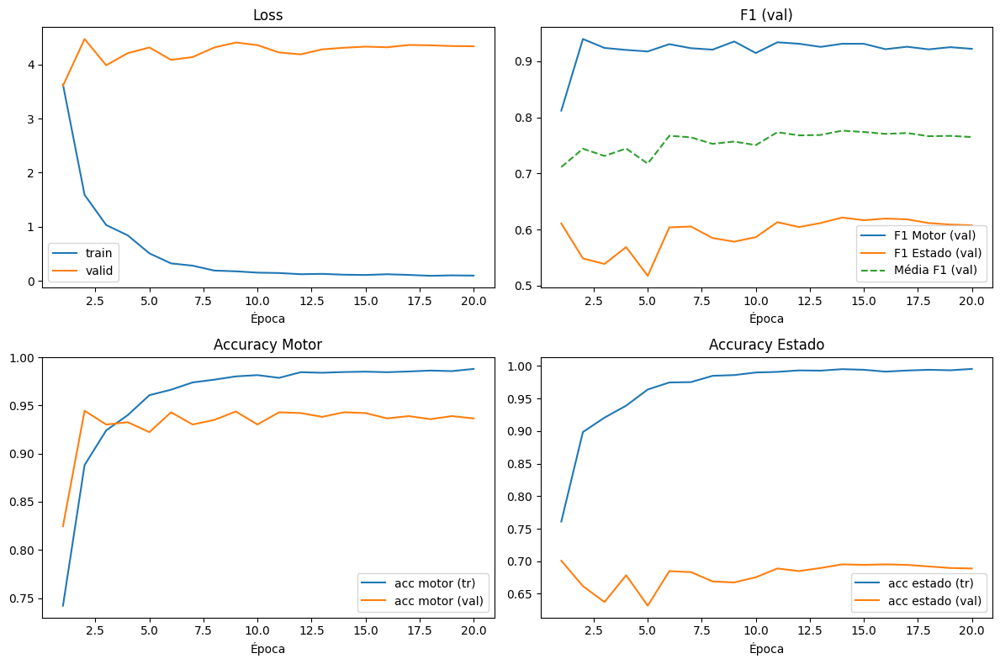

In [10]:
# =========================================
# Script COMPLETO — RNN com 12 Subespectrogramas
# AMP + Checkpoints + CSV-resumo (apenas SUB_12)
# =========================================
import os, re, random, time
from pathlib import Path
from collections import defaultdict
from typing import Optional, Dict, Any

import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from tqdm.auto import tqdm

# ----------------------------
# Configs gerais
# ----------------------------
USE_TQDM = True
SEED = 123
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# ROOT com fallback para nomes com/sem acento
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")

AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

print("AUDIO_DIR:", AUDIO_DIR)
print("CSV:", CSV_PATH.exists(), "| XLSX:", XLSX_PATH.exists())

# ----------------------------
# Utilidades
# ----------------------------
def clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

def safe_split_by_class(y, test_size=0.2, random_state=123):
    rng = np.random.RandomState(random_state)
    y = np.asarray(y, dtype=int)
    classes = np.unique(y)
    test_idx, train_idx = [], []
    for c in classes:
        idx_c = np.where(y == c)[0]
        n = len(idx_c)
        if n <= 1:
            train_idx.extend(idx_c.tolist())
        else:
            n_te = max(1, int(round(test_size*n))); n_te = min(n_te, n-1)
            sel = rng.choice(idx_c, size=n_te, replace=False)
            test_idx.extend(sel.tolist())
            train_idx.extend(list(set(idx_c.tolist()) - set(sel.tolist())))
    rng.shuffle(train_idx); rng.shuffle(test_idx)
    return np.array(train_idx), np.array(test_idx)

def ensure_parent_dir(path: Path):
    Path(path).parent.mkdir(parents=True, exist_ok=True)

# ----------------------------
# Carregar índice
# ----------------------------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx não encontrado em ARQ/.")

df.columns = [clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Resolver wav
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# Decodificar intensity_code -> estados
map_comb_txt = {0:"Ausente/desligado",1:"Marcha lenta (desengatada)",
                2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                4:"Velocidade média (frente média)",5:"Variações de aceleração"}
map_elec_txt = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

def decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Desconhecido_{d}")
    return out

dec = df["intensity_code"].apply(decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))
df["target_active"] = (df["active_count"]>0).astype(int)

def which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
idx2motor = {i:m for m,i in motor2idx.items()}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(state_code_of_active, axis=1).astype(int)

# Espaço de estado por motor (apenas códigos presentes)
state_meta = {}
for k in range(1,6):
    codes = sorted(df_one.loc[df_one["motor_idx"]==(k-1), "state_code"].unique().tolist())
    if len(codes)==0: codes=[1]
    state2idx = {c:i for i,c in enumerate(codes)}
    idx2state = {i:c for c,i in state2idx.items()}
    state_meta[k] = {"codes": codes, "state2idx": state2idx, "idx2state": idx2state}

df_one["state_idx"] = df_one.apply(lambda r: state_meta[int(r["which_motor"][1])]["state2idx"][int(r["state_code"])], axis=1)

print("Arquivos por motor (1 ativo):")
print(df_one["which_motor"].value_counts().sort_index())

# ----------------------------
# Dataset de janelas (log-mel)
# ----------------------------
class WindowedMelDatasetMT(Dataset):
    def __init__(self, df, sr=44100, seg_dur=0.5, seg_hop=0.25,
                 n_mels=64, n_fft=1024, hop_length=256,
                 fmin=20, fmax=8000, augment=False,
                 max_segments_per_file=60):
        self.df = df.reset_index(drop=True).copy()
        self.sr = sr
        self.seg_samples = int(sr*seg_dur)
        self.hop_samples = int(sr*seg_hop)
        self.n_mels = n_mels
        self.n_fft = n_fft
        self.hop_length = hop_length
        self.fmin=fmin; self.fmax=fmax
        self.augment=augment
        self.max_segments_per_file=max_segments_per_file

        self.index = []
        it = range(len(self.df))
        if USE_TQDM: it = tqdm(it, desc="Indexando janelas", leave=False)
        for i in it:
            path = self.df.loc[i,"wav_path"]
            d = float(self.df.loc[i, "duration_s"]) if "duration_s" in self.df.columns and not pd.isna(self.df.loc[i, "duration_s"]) else None
            if d is None:
                try: f = sf.SoundFile(str(path)); d = len(f)/f.samplerate
                except: d = 60.0
            total = int(self.sr*d)
            if total < self.seg_samples:
                starts = [0]
            else:
                nseg = 1 + (total-self.seg_samples)//self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts)>self.max_segments_per_file:
                rng = np.random.RandomState(SEED+i)
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts: self.index.append((i,s))
        if not self.index: raise RuntimeError("Nenhum segmento criado.")

    def __len__(self): return len(self.index)

    def _load_seg(self, path, start):
        y, srr = sf.read(str(path), always_2d=False)
        if y.ndim>1: y=y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else:
                take = min(self.seg_samples, len(y))
                seg[:take] = y[-take:]
        return seg

    def _augment_wave(self, y):
        if np.random.rand()<0.5:
            y *= 10**(np.random.uniform(-3,3)/20)
        if np.random.rand()<0.5:
            y = y + np.random.normal(0, np.std(y)*np.random.uniform(0.0,0.01), size=y.shape).astype(np.float32)
        return y

    def __getitem__(self, idx):
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        seg = self._load_seg(row["wav_path"], start)
        if self.augment: seg = self._augment_wave(seg)

        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd

        # SpecAugment leve
        if self.augment:
            Fm, Tm = S_db.shape
            if np.random.rand()<0.5:
                f = max(1, int(0.10*Fm)); f0 = np.random.randint(0, Fm-f+1)
                S_db[f0:f0+f,:] = 0.0
            if np.random.rand()<0.5:
                t = max(1, int(0.10*Tm)); t0 = np.random.randint(0, Tm-t+1)
                S_db[:,t0:t0+t] = 0.0

        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_idx"])
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, torch.tensor(motor_idx), torch.tensor(state_idx), torch.tensor(motor_k), file_name

# ----------------------------
# Perdas/pesos
# ----------------------------
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction="mean"):
        super().__init__()
        self.alpha=alpha; self.gamma=gamma; self.reduction=reduction
    def forward(self, logits, target):
        ce = F.cross_entropy(logits, target, weight=self.alpha, reduction="none")
        pt = torch.softmax(logits, dim=1).gather(1, target.unsqueeze(1)).squeeze(1).clamp_min(1e-6)
        loss = ((1 - pt) ** self.gamma) * ce
        return loss.mean() if self.reduction=="mean" else (loss.sum() if self.reduction=="sum" else loss)

def make_class_weights_motor(dl):
    ys=[]
    for _, y_m, _, _, _ in dl: ys.append(y_m)
    if not ys: return None
    y = torch.cat(ys).cpu().numpy()
    classes = np.unique(y)
    w = compute_class_weight(class_weight="balanced", classes=classes, y=y)
    full = np.ones(5, dtype=np.float32)
    for c,wc in zip(classes, w): full[int(c)] = wc
    return torch.tensor(full, dtype=torch.float32)

def make_class_weights_states_per_motor(dl, state_meta):
    buckets = {k: [] for k in range(1,6)}
    for _, _, y_s, k, _ in dl:
        k_np = k.numpy(); y_s_np=y_s.numpy()
        for ki in range(1,6):
            mask=(k_np==ki)
            if mask.any(): buckets[ki].extend(y_s_np[mask].tolist())
    weights={}
    for k in range(1,6):
        arr=np.asarray(buckets[k], dtype=int)
        if arr.size==0: weights[k]=None; continue
        classes=np.unique(arr)
        w = compute_class_weight(class_weight="balanced", classes=classes, y=arr)
        Ck = len(state_meta[k]["codes"])
        full=np.ones(Ck, dtype=np.float32)
        for c,wc in zip(classes, w): full[int(c)]=wc
        weights[k]=torch.tensor(full, dtype=torch.float32)
    return weights

# ----------------------------
# Módulos básicos
# ----------------------------
class MeanAttention(nn.Module):
    def __init__(self, d): super().__init__(); self.w = nn.Linear(d,1)
    def forward(self, z):
        a = torch.softmax(self.w(z).squeeze(-1), dim=1)
        return (z * a.unsqueeze(-1)).sum(dim=1)

# Cabeça multitarefa com padding seguro (NEG_INF)
NEG_INF = -1e4  # seguro para fp16
class HeadMultiTask(nn.Module):
    def __init__(self, feat_dim, state_meta):
        super().__init__()
        self.state_meta = state_meta
        self.motor_head = nn.Linear(feat_dim, 5)
        self.state_heads = nn.ModuleDict()
        for k in range(1,6):
            self.state_heads[str(k)] = nn.Linear(feat_dim, len(state_meta[k]["codes"]))
    def forward(self, z, motor_k=None):
        logits_motor = self.motor_head(z)
        if motor_k is None: return logits_motor
        B = z.size(0)
        Cmax = max(len(self.state_meta[int(m.item())]["codes"]) for m in motor_k)
        logits_state = torch.full((B, Cmax), fill_value=NEG_INF, device=z.device, dtype=z.dtype)
        for i in range(B):
            k = str(int(motor_k[i].item()))
            out = self.state_heads[k](z[i:i+1]).squeeze(0)
            logits_state[i, :out.numel()] = out
        return logits_motor, logits_state

# ----------------------------
# RNN com Subespectrogramas (n_bands=12)
# ----------------------------
class ModelGRU_SubSpec(nn.Module):
    """
    Divide o eixo de frequência em n_bands subespectrogramas (faixas contíguas),
    processa cada um com uma GRU bidirecional + atenção e agrega (concatena + projeta).
    A divisão é robusta: reparte as sobras quando n_mels não é múltiplo de n_bands.
    """
    def __init__(self, n_mels, state_meta, n_bands=12, hidden=96, layers=2, dropout=0.15):
        super().__init__()
        assert n_bands >= 2, "n_bands deve ser >= 2"
        self.n_bands = n_bands
        self.slices = self._make_slices(n_mels, n_bands)  # lista de (f0,f1)

        self.rnns = nn.ModuleList([
            nn.GRU(self.slices[i][1] - self.slices[i][0], hidden,
                   num_layers=layers, batch_first=True,
                   bidirectional=True, dropout=dropout)
            for i in range(n_bands)
        ])
        self.attns = nn.ModuleList([MeanAttention(2*hidden) for _ in range(n_bands)])
        self.drop  = nn.Dropout(dropout)

        feat_dim = n_bands * (2*hidden)
        self.fuse = nn.Linear(feat_dim, 2*hidden)  # projeta concatenação
        self.head = HeadMultiTask(2*hidden, state_meta)

    @staticmethod
    def _make_slices(n_mels: int, n_bands: int):
        base = n_mels // n_bands
        rest = n_mels % n_bands
        sizes = [base + (1 if i < rest else 0) for i in range(n_bands)]
        slices = []
        f0 = 0
        for sz in sizes:
            f1 = f0 + sz
            slices.append((f0, f1))
            f0 = f1
        return slices

    def forward(self, x, motor_k=None):
        # x: [B, T, n_mels]
        z_list = []
        for i, (f0, f1) in enumerate(self.slices):
            xb = x[:, :, f0:f1]             # [B, T, F_band_i]
            zb, _ = self.rnns[i](xb)        # [B, T, 2*hidden]
            zb    = self.attns[i](zb)       # [B, 2*hidden]
            z_list.append(zb)
        z = torch.cat(z_list, dim=1)        # [B, n_bands*2*hidden]
        z = self.drop(z)
        z = torch.tanh(self.fuse(z))        # [B, 2*hidden]
        return self.head(z, motor_k)

# ----------------------------
# Builder (fixo em n_bands=12)
# ----------------------------
def build_model(model_type, n_mels, state_meta, **model_kwargs):
    if model_type == "rnn_subspec":
        # ignoramos n_bands externos; fixo em 12
        return ModelGRU_SubSpec(
            n_mels=n_mels, state_meta=state_meta, n_bands=12,
            hidden=96, layers=2, dropout=0.15
        )
    if model_type == "rnn":
        class ModelGRU(nn.Module):
            def __init__(self, n_mels, state_meta, hidden=128, layers=2, dropout=0.2):
                super().__init__()
                self.rnn  = nn.GRU(n_mels, hidden, num_layers=layers, batch_first=True,
                                   bidirectional=True, dropout=dropout)
                self.attn = MeanAttention(2*hidden)
                self.drop = nn.Dropout(dropout)
                self.head = HeadMultiTask(2*hidden, state_meta)
            def forward(self, x, motor_k=None):
                z,_ = self.rnn(x)
                z   = self.attn(z)
                z   = self.drop(z)
                return self.head(z, motor_k)
        return ModelGRU(n_mels, state_meta)
    raise ValueError("model_type inválido.")

# ----------------------------
# Avaliação por arquivo (padding com NEG_INF)
# ----------------------------
def eval_file_level(model, dl_te, state_meta):
    model.eval()
    motor_logits_by_file = defaultdict(list)
    state_logits_by_file = defaultdict(list)
    true_motor_by_file   = {}
    true_state_by_file   = {}

    with torch.no_grad():
        for xb, y_m, y_s, k, fns in tqdm(dl_te, desc="agregando por arquivo", leave=False):
            xb = xb.to(device); k = k.to(device)
            lm, ls_pad = model(xb, motor_k=k)
            for i, fid in enumerate(fns):
                if fid not in true_motor_by_file:
                    true_motor_by_file[fid] = int(y_m[i].cpu().item())
                if fid not in true_state_by_file:
                    true_state_by_file[fid] = int(y_s[i].cpu().item())
                motor_logits_by_file[fid].append(lm[i].detach().cpu())
                ki = int(k[i].item()); Ck = len(state_meta[ki]["codes"])
                state_logits_by_file[fid].append(ls_pad[i, :Ck].detach().cpu())

    yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
    for fid in motor_logits_by_file.keys():
        m = torch.stack(motor_logits_by_file[fid], dim=0).mean(dim=0)
        m_pred = int(torch.argmax(m).item())
        yM_true.append(true_motor_by_file[fid]); yM_pred.append(m_pred)

        Ck_set = {t.numel() for t in state_logits_by_file[fid]}
        if len(Ck_set)==1:
            s = torch.stack(state_logits_by_file[fid], dim=0).mean(dim=0)
        else:
            Ck = max(Ck_set)
            pad = torch.full((len(state_logits_by_file[fid]), Ck), fill_value=NEG_INF)
            for i,tv in enumerate(state_logits_by_file[fid]): pad[i,:tv.numel()] = tv
            s = pad.mean(dim=0)
        s_pred = int(torch.argmax(s).item())
        yS_true.append(true_state_by_file[fid]); yS_pred.append(s_pred)

    print("\n=== File-level: MOTOR ===")
    labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
    print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
    print("Confusão (motor, file-level):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))

    print("\n=== File-level: ESTADO ===")
    print(classification_report(yS_true, yS_pred, zero_division=0))

# ----------------------------
# Checkpoints util
# ----------------------------
def _latest_ckpt(ckpt_dir: Path):
    pats = sorted(ckpt_dir.glob("epoch_*.pt"))
    return pats[-1] if pats else None

def _save_ckpt(ckpt_path: Path, epoch, model, opt, sch, best_score, history=None):
    ensure_parent_dir(ckpt_path)
    state = {
        "epoch": epoch,
        "model": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scheduler": sch.state_dict() if sch is not None else None,
        "best_score": best_score,
        "history": history,
    }
    torch.save(state, ckpt_path)

def _load_ckpt(ckpt_path: Path, model, opt, sch):
    state = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    model.load_state_dict(state["model"])
    if opt is not None and state.get("optimizer"): opt.load_state_dict(state["optimizer"])
    if sch is not None and state.get("scheduler") is not None: sch.load_state_dict(state["scheduler"])
    start_epoch = int(state.get("epoch", 0)) + 1
    best_score  = float(state.get("best_score", -1.0))
    history     = state.get("history", None)
    return start_epoch, best_score, history

# ----------------------------
# Treino com checkpoint + métricas (AMP)
# ----------------------------
def train_multitask_torch_with_ckpt(
    df_labels, state_meta, model_type="rnn_subspec",
    # features
    sr=44100, seg_dur=0.5, seg_hop=0.25,
    n_mels=64, n_fft=1024, hop=256, fmin=20, fmax=8000,
    # treino
    batch_size=64, epochs=20, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=None, seed=123,
    # checkpoint
    ckpt_dir: Path = Path("./ckp"),
    resume=False, ckpt_interval=1,
):
    # split por arquivo
    y_all = df_labels["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=seed)
    df_labels = df_labels.reset_index(drop=True)
    df_labels["split"]="train"
    if len(te_pos)>0: df_labels.loc[te_pos,"split"]="test"

    print("Distrib. ARQUIVOS (treino):", df_labels.loc[df_labels["split"]=="train","motor_idx"].value_counts().sort_index().to_dict())
    print("Distrib. ARQUIVOS (teste) :", df_labels.loc[df_labels["split"]=="test","motor_idx"].value_counts().sort_index().to_dict())

    ds_tr = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="train"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=True, max_segments_per_file=max_segments_per_file
    )
    ds_te = WindowedMelDatasetMT(
        df=df_labels[df_labels["split"]=="test"],
        sr=sr, seg_dur=seg_dur, seg_hop=seg_hop,
        n_mels=n_mels, n_fft=n_fft, hop_length=hop,
        fmin=fmin, fmax=fmax, augment=False, max_segments_per_file=max_segments_per_file
    )

    NUM_WORKERS=0
    dl_tr = DataLoader(ds_tr, batch_size=batch_size, shuffle=True,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())
    dl_te = DataLoader(ds_te, batch_size=batch_size, shuffle=False,
                       num_workers=NUM_WORKERS, persistent_workers=False,
                       pin_memory=torch.cuda.is_available())

    model = build_model(model_type, n_mels, state_meta).to(device)

    # perdas/pesos
    w_motor  = make_class_weights_motor(dl_tr)
    w_states = make_class_weights_states_per_motor(dl_tr, state_meta)
    crit_motor = nn.CrossEntropyLoss(weight=(w_motor.to(device) if w_motor is not None else None))

    opt = torch.optim.Adam(model.parameters(), lr=lr)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, factor=0.5, patience=2)

    # AMP moderno
    scaler = torch.amp.GradScaler("cuda" if torch.cuda.is_available() else "cpu")

    # ckpt + histórico
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    hist_csv_path = ckpt_dir / "metrics_history.csv"
    hist = []
    start_epoch=1
    best={"score":-1.0, "state":None, "epoch":None}
    best_row_cache = None  # guardaremos a linha da época vencedora

    if resume:
        last = _latest_ckpt(ckpt_dir)
        if last is not None:
            start_epoch, best["score"], hist_loaded = _load_ckpt(last, model, opt, sch)
            if hist_loaded is not None: hist = hist_loaded
            elif hist_csv_path.exists():
                try: hist = pd.read_csv(hist_csv_path).to_dict(orient="records")
                except: pass
            print(f"[ckpt] retomando de {last.name} -> start_epoch={start_epoch}, best_score={best['score']:.3f}")
        else:
            print("[ckpt] nenhum checkpoint encontrado; iniciando do zero.")
    else:
        print("[ckpt] treino novo (resume=False).")

    def run_epoch(dl, train=True, desc="train"):
        model.train(train)
        losses, yM_true, yM_pred = [], [], []
        yS_true_all, yS_pred_all = [], []
        iterator = dl if not USE_TQDM else tqdm(dl, desc=desc, leave=False)
        for xb, y_m, y_s, k, _fn in iterator:
            xb, y_m, y_s, k = xb.to(device), y_m.to(device), y_s.to(device), k.to(device)
            with torch.set_grad_enabled(train):
                with torch.amp.autocast(device_type="cuda" if torch.cuda.is_available() else "cpu"):
                    logits_motor, logits_state_pad = model(xb, motor_k=k)
                    # motor
                    loss_motor = crit_motor(logits_motor, y_m)
                    # estado — Focal por cabeça
                    loss_state = 0.0
                    for ki in range(1,6):
                        mask = (k==ki)
                        if mask.any():
                            Ck = len(state_meta[ki]["codes"])
                            logits_k = logits_state_pad[mask, :Ck]
                            y_s_k = y_s[mask]
                            w_k = w_states.get(ki, None)
                            crit_k = FocalLoss(alpha=(w_k.to(device) if w_k is not None else None), gamma=2.0)
                            loss_state = loss_state + crit_k(logits_k, y_s_k)
                    loss = alpha_motor*loss_motor + alpha_state*loss_state

                if train:
                    opt.zero_grad(set_to_none=True)
                    scaler.scale(loss).backward()
                    scaler.step(opt)
                    scaler.update()

            losses.append(loss.detach().item())
            # métricas (segmentos)
            yM_true.extend(y_m.detach().cpu().numpy().tolist())
            yM_pred.extend(torch.argmax(logits_motor, dim=1).detach().cpu().tolist())
            yS_true_all.extend(y_s.detach().cpu().numpy().tolist())
            yS_pred_all.extend(torch.argmax(logits_state_pad, dim=1).detach().cpu().tolist())

        accM = accuracy_score(yM_true, yM_pred) if yM_true else 0.0
        f1mM = f1_score(yM_true, yM_pred, average="macro", zero_division=0)
        accS = accuracy_score(yS_true_all, yS_pred_all) if yS_true_all else 0.0
        f1mS = f1_score(yS_true_all, yS_pred_all, average="macro", zero_division=0)
        return (float(np.mean(losses)) if losses else 0.0), (accM, f1mM), (accS, f1mS)

    ep_iter = range(start_epoch, epochs+1)
    if USE_TQDM: ep_iter = tqdm(ep_iter, desc=f"Treino (rnn_subspec_12)")

    for ep in ep_iter:
        tr_loss, (tr_accM, tr_f1M), (tr_accS, tr_f1S) = run_epoch(dl_tr, True,  desc=f"train ep{ep:02d}")
        te_loss, (te_accM, te_f1M), (te_accS, te_f1S) = run_epoch(dl_te, False, desc=f"valid ep{ep:02d}")
        # passo do scheduler DEPOIS do optimizer
        sch.step(te_loss)

        row = {
            "epoch": ep,
            "tr_loss": tr_loss, "tr_acc_motor": tr_accM, "tr_f1_motor": tr_f1M,
            "tr_acc_state": tr_accS, "tr_f1_state": tr_f1S,
            "te_loss": te_loss, "te_acc_motor": te_accM, "te_f1_motor": te_f1M,
            "te_acc_state": te_accS, "te_f1_state": te_f1S,
            "score_avg_f1": (te_f1M + te_f1S)/2.0
        }
        hist.append(row)
        pd.DataFrame(hist).to_csv(hist_csv_path, index=False)

        tqdm.write(
            f"[{ep:02d}] loss_tr={tr_loss:.4f} M(tr acc={tr_accM:.3f} f1={tr_f1M:.3f}) "
            f"S(tr acc={tr_accS:.3f} f1={tr_f1S:.3f}) | "
            f"loss_te={te_loss:.4f} M(te acc={te_accM:.3f} f1={te_f1M:.3f}) "
            f"S(te acc={te_accS:.3f} f1={te_f1S:.3f})"
        )

        if ckpt_interval and (ep % ckpt_interval == 0):
            ckpt_path = ckpt_dir / f"epoch_{ep:03d}.pt"
            _save_ckpt(ckpt_path, ep, model, opt, sch, best_score=best["score"], history=hist)
            _save_ckpt(ckpt_dir / "last.pt", ep, model, opt, sch, best_score=best["score"], history=hist)

        score = row["score_avg_f1"]
        if score > best["score"]:
            best = {"score": score, "state": model.state_dict(), "epoch": ep}
            best_row_cache = row.copy()
            if save_path:
                ensure_parent_dir(save_path)
                torch.save({"epoch": ep, "best_score": score, "state": best["state"]}, save_path)
                tqdm.write(f"[melhor] ep={ep} score={score:.3f} -> salvo best em: {save_path}")

    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"[rnn_subspec_12] Melhor score (avg F1 M+S): {best['score']:.3f} | best_epoch={best['epoch']} | best={save_path}")

    # Relatórios finais (segmentos)
    def eval_segments():
        yM_true, yM_pred, yS_true, yS_pred = [], [], [], []
        with torch.no_grad():
            iterator = dl_te if not USE_TQDM else tqdm(dl_te, desc="aval seg", leave=False)
            for xb, y_m, y_s, k, _fn in iterator:
                xb, k = xb.to(device), k.to(device)
                lm, ls_pad = model(xb, motor_k=k)
                yM_true.extend(y_m.cpu().numpy().tolist())
                yM_pred.extend(torch.argmax(lm, dim=1).cpu().tolist())
                yS_true.extend(y_s.cpu().numpy().tolist())
                yS_pred.extend(torch.argmax(ls_pad, dim=1).cpu().tolist())
        print("\n=== Segment-level: MOTOR ===")
        labsM = sorted(np.unique(yM_true)); namesM = [ ["M1","M2","M3","M4","M5"][i] for i in labsM ]
        print(classification_report(yM_true, yM_pred, labels=labsM, target_names=namesM, zero_division=0))
        print("Confusão (motor):\n", confusion_matrix(yM_true, yM_pred, labels=labsM))
        print("\n=== Segment-level: ESTADO ===")
        print(classification_report(yS_true, yS_pred, zero_division=0))
        return {
            "seg_motor_acc": accuracy_score(yM_true, yM_pred),
            "seg_motor_f1": f1_score(yM_true, yM_pred, average="macro", zero_division=0),
            "seg_state_acc": accuracy_score(yS_true, yS_pred),
            "seg_state_f1": f1_score(yS_true, yS_pred, average="macro", zero_division=0),
        }

    seg_summary = eval_segments()

    # retornos úteis ao driver
    return model, (dl_tr, dl_te), df_labels, hist_csv_path, best, best_row_cache, seg_summary

# =========================================
# Execução — SOMENTE 12 subespectrogramas
# =========================================
# Hiperparâmetros de features
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256
MODEL_TO_RUN = "rnn_subspec"

# Pasta de saída fixa (SUB_12)
OUT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12")
OUT_DIR.mkdir(parents=True, exist_ok=True)

# Artefatos para este experimento
stamp = time.strftime("%Y%m%d_%H%M%S")
CKPT_DIR = OUT_DIR / f"ckp_{MODEL_TO_RUN}_nb12_{stamp}"
CKPT_DIR.mkdir(parents=True, exist_ok=True)
SAVE_PATH = OUT_DIR / f"model_{MODEL_TO_RUN}_nb12_{stamp}.pt"
HIST_PATH = CKPT_DIR / "metrics_history.csv"

print(f"\n==============================")
print(f" Rodando n_bands = 12")
print(f" Salvando em     = {OUT_DIR}")
print(f"==============================")

# Treino
model_torch, loaders_torch, dfMT, hist_csv_path, best, best_row, seg_summary = train_multitask_torch_with_ckpt(
    df_labels=df_one[["file_name","wav_path","duration_s","which_motor","motor_idx","state_code","state_idx"]],
    state_meta=state_meta,
    model_type=MODEL_TO_RUN,
    sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop=HOP, fmin=20, fmax=8000,
    batch_size=64, epochs=20, lr=2e-3,
    alpha_motor=1.0, alpha_state=2.0,
    max_segments_per_file=60,
    save_path=SAVE_PATH,
    seed=123,
    ckpt_dir=CKPT_DIR,
    resume=False,
    ckpt_interval=1,
)

# Avaliação por arquivo
eval_file_level(model_torch, loaders_torch[1], state_meta)

# ===== CSV-RESUMO DO EXPERIMENTO (SUB_12) =====
summary = {
    "timestamp": [stamp],
    "n_bands": [12],
    "best_epoch": [best.get("epoch")],
    "best_score_avg_f1": [round(float(best.get("score", float("nan"))), 6)],
    "te_f1_motor_at_best": [round(float(best_row["te_f1_motor"]), 6) if best_row else np.nan],
    "te_f1_state_at_best": [round(float(best_row["te_f1_state"]), 6) if best_row else np.nan],
    "seg_final_acc_motor": [round(float(seg_summary["seg_motor_acc"]), 6)],
    "seg_final_f1_motor": [round(float(seg_summary["seg_motor_f1"]), 6)],
    "seg_final_acc_state": [round(float(seg_summary["seg_state_acc"]), 6)],
    "seg_final_f1_state": [round(float(seg_summary["seg_state_f1"]), 6)],
    "best_model_path": [str(SAVE_PATH)],
    "metrics_history_csv": [str(HIST_PATH)],
    "ckpt_dir": [str(CKPT_DIR)],
}
summary_df = pd.DataFrame(summary)
summary_csv = OUT_DIR / f"experiment_summary_nb12_{stamp}.csv"
summary_df.to_csv(summary_csv, index=False)
print(f"\n[OK] CSV do experimento salvo em: {summary_csv}")
print(f"[OK] Histórico salvo em: {HIST_PATH}")

# (Opcional) — Plot das curvas deste experimento:
if HIST_PATH.exists():
    hist = pd.read_csv(HIST_PATH)
    fig, axes = plt.subplots(2, 2, figsize=(12,8))
    axes = axes.ravel()

    axes[0].plot(hist["epoch"], hist["tr_loss"], label="train")
    axes[0].plot(hist["epoch"], hist["te_loss"], label="valid")
    axes[0].set_title("Loss"); axes[0].set_xlabel("Época"); axes[0].legend()

    axes[1].plot(hist["epoch"], hist["te_f1_motor"], label="F1 Motor (val)")
    axes[1].plot(hist["epoch"], hist["te_f1_state"], label="F1 Estado (val)")
    axes[1].plot(hist["epoch"], hist["score_avg_f1"], label="Média F1 (val)", linestyle="--")
    axes[1].set_title("F1 (val)"); axes[1].set_xlabel("Época"); axes[1].legend()

    axes[2].plot(hist["epoch"], hist["tr_acc_motor"], label="acc motor (tr)")
    axes[2].plot(hist["epoch"], hist["te_acc_motor"], label="acc motor (val)")
    axes[2].set_title("Accuracy Motor"); axes[2].set_xlabel("Época"); axes[2].legend()

    axes[3].plot(hist["epoch"], hist["tr_acc_state"], label="acc estado (tr)")
    axes[3].plot(hist["epoch"], hist["te_acc_state"], label="acc estado (val)")
    axes[3].set_title("Accuracy Estado"); axes[3].set_xlabel("Época"); axes[3].legend()

    plt.tight_layout(); plt.show()
else:
    print("CSV de métricas ainda não existe. Treine pelo menos 1 época.")


In [15]:
print(f"""Evaluation Time:        {((end_time - start_time) if ('end_time' in globals() and 'start_time' in globals()) else float('nan')):.4f} seconds
Peak Memory Usage:      {((peak_memory / (1024*1024)) if 'peak_memory' in globals() else float('nan')):.2f} MB
Average CPU Usage:      {(((cpu_percent_start + cpu_percent_end)/2) if ('cpu_percent_start' in globals() and 'cpu_percent_end' in globals()) else float('nan')):.2f}%
Model File Size:        {((model_code_size) if 'model_code_size' in globals() else float('nan')):.2f} KB
Accuracy:               {((accuracy) if 'accuracy' in globals() else (seg_summary['seg_motor_acc'] if 'seg_summary' in globals() else float('nan'))):.4f}
F1 Score:               {((f1) if 'f1' in globals() else (seg_summary['seg_motor_f1'] if 'seg_summary' in globals() else float('nan'))):.4f}""")



Evaluation Time:        nan seconds
Peak Memory Usage:      nan MB
Average CPU Usage:      nan%
Model File Size:        nan KB
Accuracy:               0.9365
F1 Score:               0.9221


In [16]:
import os, re, time, math
from pathlib import Path
import torch
import numpy as np
import pandas as pd

# --- utilidades de memória/CPU (robustas) ---
def _peak_memory_mb():
    # GPU (se disponível): usa o máximo alocado desde o último reset
    if torch.cuda.is_available():
        torch.cuda.reset_peak_memory_stats()
        torch.cuda.synchronize()
        # o valor será coletado depois da avaliação com torch.cuda.max_memory_allocated()
        return None  # devolvemos depois
    # CPU: tenta resource (Linux/Mac) ou psutil
    try:
        import resource
        ru = resource.getrusage(resource.RUSAGE_SELF)
        # Em Linux, ru_maxrss é em KB; em macOS, é em bytes. Detecta heurísticamente.
        val = ru.ru_maxrss
        # assume KB se valor for "pequeno" (heurística simples)
        if val < 1e7:  # típico Linux: alguns centenas de milhares de KB
            return val / 1024.0  # => MB
        else:  # macOS retorna bytes
            return val / (1024.0 * 1024.0)
    except Exception:
        try:
            import psutil
            p = psutil.Process()
            return p.memory_info().rss / (1024.0 * 1024.0)
        except Exception:
            return float("nan")

def _cpu_percent_snapshot():
    try:
        import psutil
        # medição instantânea (non-blocking). Para algo mais estável, use interval>0.
        return psutil.cpu_percent(interval=0.05)
    except Exception:
        return float("nan")

# --- localizar OUT_DIR/SUB_12 e o último modelo salvo ---
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
root = None
for _cand in _root_candidates:
    if Path(_cand).exists():
        root = Path(_cand); break
if root is None:
    raise FileNotFoundError("Não encontrei a pasta 'Acústica - DATASET_NOVO' no Drive.")

OUT_DIR = root / "SUB_12"
if not OUT_DIR.exists():
    raise FileNotFoundError(f"Pasta SUB_12 não encontrada em: {OUT_DIR.parent}")

# procura por modelos *.pt; prioriza padrão "model_rnn_subspec_nb12_*.pt"
cands = sorted(OUT_DIR.glob("model_rnn_subspec_nb12_*.pt"), key=lambda p: p.stat().st_mtime, reverse=True)
if not cands:
    cands = sorted(OUT_DIR.glob("*.pt"), key=lambda p: p.stat().st_mtime, reverse=True)
if not cands:
    raise FileNotFoundError("Nenhum arquivo .pt encontrado em SUB_12.")
MODEL_PATH = cands[0]

# --- reconstruir modelo e dataloader de teste ---
# Requer as mesmas funções/classes do seu script já carregadas no runtime:
# - build_model, WindowedMelDatasetMT, safe_split_by_class
# - variáveis: state_meta, df_one, N_MELS, SEG_DUR, SEG_HOP, N_FFT, HOP
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if 'build_model' not in globals():
    raise RuntimeError("Função build_model não está no escopo. Execute antes o script de definição do modelo.")

model = build_model("rnn_subspec", n_mels=N_MELS, state_meta=state_meta).to(device)

# Carrega o checkpoint (aceita dois formatos: {'state':...} ou state_dict direto)
ckpt = torch.load(MODEL_PATH, map_location="cpu")
state_dict = ckpt.get("state", None)
if state_dict is None:
    # pode ser um checkpoint de treino com wrapper { 'model': ... }
    state_dict = ckpt.get("model", ckpt)
model.load_state_dict(state_dict)
model.eval()

# Dataloader de teste: reusa se já existir; senão, recria a partir de df_one
if 'loaders_torch' in globals() and loaders_torch and len(loaders_torch) > 1:
    dl_te = loaders_torch[1]
else:
    # split por arquivo idêntico ao treino
    y_all = df_one["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=123)
    df_labels_eval = df_one.reset_index(drop=True)
    df_te = df_labels_eval.iloc[te_pos].copy()
    ds_te = WindowedMelDatasetMT(
        df=df_te,
        sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
        n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP,
        fmin=20, fmax=8000, augment=False, max_segments_per_file=60
    )
    from torch.utils.data import DataLoader
    dl_te = DataLoader(ds_te, batch_size=64, shuffle=False, num_workers=0,
                       pin_memory=torch.cuda.is_available())

# --- avaliação com métricas e medições de performance ---
start_time = time.perf_counter()
cpu_percent_start = _cpu_percent_snapshot()

y_true, y_pred = [], []
with torch.no_grad():
    # reset GPU peak mem se aplicável
    if torch.cuda.is_available():
        torch.cuda.reset_peak_memory_stats()
    for xb, y_m, _y_s, k, _fn in dl_te:
        xb = xb.to(device); k = k.to(device)
        logits_motor, _ = model(xb, motor_k=k)
        pred = torch.argmax(logits_motor, dim=1).cpu().numpy().tolist()
        y_pred.extend(pred)
        y_true.extend(y_m.numpy().tolist())

cpu_percent_end = _cpu_percent_snapshot()
end_time = time.perf_counter()

# métricas
from sklearn.metrics import accuracy_score, f1_score
accuracy = accuracy_score(y_true, y_pred) if y_true else float("nan")
f1 = f1_score(y_true, y_pred, average="macro", zero_division=0) if y_true else float("nan")

# pico de memória
if torch.cuda.is_available():
    torch.cuda.synchronize()
    peak_memory = float(torch.cuda.max_memory_allocated()) / (1024.0 * 1024.0)  # MB
else:
    peak_memory = _peak_memory_mb()

# tamanho do arquivo do modelo (KB)
model_code_size = os.path.getsize(MODEL_PATH) / 1024.0

# --- impressão única, formatada ---
print(f"""Evaluation Time:        {end_time - start_time:.4f} seconds
Peak Memory Usage:      {peak_memory if peak_memory is not None else float('nan'):.2f} MB
Average CPU Usage:      {( (cpu_percent_start + cpu_percent_end) / 2.0 ) if (not math.isnan(cpu_percent_start) and not math.isnan(cpu_percent_end)) else float('nan'):.2f}%
Model File Size:        {model_code_size:.2f} KB
Accuracy:               {accuracy:.4f}
F1 Score:               {f1:.4f}""")


Evaluation Time:        126.4887 seconds
Peak Memory Usage:      166.91 MB
Average CPU Usage:      52.80%
Model File Size:        12416.08 KB
Accuracy:               0.9429
F1 Score:               0.9314


# ANALISE DE ESPECTROGRAMAS

In [14]:
# =========================================
# PLOTS: 4 ESPECTROGRAMAS (ARQUIVOS & SEGMENTOS) USANDO SEABORN
# Lê dados a partir do caminho do projeto no Drive e salva PNGs em SUB_12/PLOTS
# =========================================
import re, time
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Caminhos (com e sem acento) ----------
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")

AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

OUT_DIR   = ROOT_DIR / "SUB_12"
PLOTS_DIR = OUT_DIR / "PLOTS"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

print("ROOT_DIR:", ROOT_DIR)
print("AUDIO_DIR:", AUDIO_DIR)
print("CSV existe?", CSV_PATH.exists(), "| XLSX existe?", XLSX_PATH.exists())
print("PLOTS_DIR:", PLOTS_DIR)

# ---------- Utils ----------
def _safe_title(s: str, maxlen=50):
    s = str(s) if s is not None else ""
    s = re.sub(r"[^A-Za-z0-9_\- ]", "_", s)
    return (s[:maxlen] + "…") if len(s) > maxlen else s

def _clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

# ---------- Carrega índice e resolve caminhos WAV ----------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx não encontrado em ARQ/.")

df.columns = [_clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Mapeia nome->arquivo no diretório de áudios
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# ---------- Decodifica intensity_code para achar qual motor está ativo ----------
map_comb_txt = {0:"Ausente/desligado",1:"Marcha lenta (desengatada)",
                2:"Marcha lenta engatada (frente)",3:"Baixa velocidade (frente lenta)",
                4:"Velocidade média (frente média)",5:"Variações de aceleração"}
map_elec_txt = {0:"Ausente",1:"Frente lenta",2:"Frente rápida",3:"Ré lenta",4:"Ré rápida"}

def _decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Desconhecido_{d}")
    return out

dec = df["intensity_code"].apply(_decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))

def _which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(_which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def _state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(_state_code_of_active, axis=1).astype(int)

print("Arquivos elegíveis (1 motor ativo):", len(df_one))

# ---------- FUNÇÃO: 4 ESPECTROGRAMAS DE ARQUIVOS ----------
def plot_four_file_specs_and_save(
    df_one,
    out_dir=PLOTS_DIR,
    sr=44100, n_mels=64, n_fft=1024, hop_length=256, fmin=20, fmax=8000,
    seed=123
):
    df_ok = df_one[df_one["wav_path"].notna()]
    if len(df_ok) < 4:
        raise ValueError("Precisa de pelo menos 4 arquivos com wav_path válido em df_one.")
    rows = df_ok.sample(4, random_state=seed)

    fig, axes = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)
    for ax, (_, row) in zip(axes, rows.iterrows()):
        path = str(row["wav_path"])
        y, srr = sf.read(path, always_2d=False)
        if y.ndim > 1:
            y = y.mean(axis=1)
        if srr != sr:
            y = librosa.resample(y.astype(np.float32), orig_sr=srr, target_sr=sr)

        S = librosa.feature.melspectrogram(
            y=y, sr=sr, n_fft=n_fft, hop_length=hop_length,
            n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max)
        sns.heatmap(S_db, ax=ax, cmap="magma", cbar=False)
        ax.invert_yaxis()
        title = f"{_safe_title(row.get('file_name','---'))}\n{row.get('which_motor','?')} | state={row.get('state_code','?')}"
        ax.set_title(title, fontsize=9)
        ax.set_xlabel("tempo (frames)")
        ax.set_ylabel("mel bins")

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"4_specs_FILES_{stamp}.png"
    fig.suptitle("4 espectrogramas — ARQUIVOS", y=1.03, fontsize=12)
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] Figura (arquivos) salva em: {out_path}")

# ---------- Dataset mínimo para SEGMENTOS ----------
# Se você já tem WindowedMelDatasetMT no escopo, comente esta classe.
class _MiniWindowedMelDataset:
    """
    Versão leve: gera segmentos deslizantes e retorna (x_seq[T,n_mels], y_motor, y_state, k, file_name)
    """
    def __init__(self, df, sr=44100, seg_dur=0.5, seg_hop=0.25,
                 n_mels=64, n_fft=1024, hop_length=256, fmin=20, fmax=8000,
                 max_segments_per_file=60, seed=123):
        import torch
        self.df = df.reset_index(drop=True).copy()
        self.sr=sr; self.seg_samples=int(sr*seg_dur); self.hop_samples=int(sr*seg_hop)
        self.n_mels=n_mels; self.n_fft=n_fft; self.hop_length=hop_length
        self.fmin=fmin; self.fmax=fmax
        self.max_segments_per_file=max_segments_per_file
        self.seed=seed
        self.index=[]
        rng = np.random.RandomState(seed)
        for i in range(len(self.df)):
            path = self.df.loc[i,"wav_path"]
            # duração (fallback simples)
            try:
                f = sf.SoundFile(str(path))
                d = len(f)/f.samplerate
            except:
                d = float(self.df.loc[i].get("duration_s", 60.0) or 60.0)
            total = int(self.sr*d)
            if total < self.seg_samples:
                starts=[0]
            else:
                nseg = 1 + (total-self.seg_samples)//self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts)>self.max_segments_per_file:
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts:
                self.index.append((i,s))
        if not self.index:
            raise RuntimeError("Nenhum segmento criado.")
        self._torch = __import__("torch")

    def __len__(self): return len(self.index)

    def __getitem__(self, idx):
        torch = self._torch
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        path = str(row["wav_path"])
        y, srr = sf.read(path, always_2d=False)
        if y.ndim>1: y=y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else: seg[:min(self.seg_samples,len(y))] = y[-min(self.seg_samples,len(y)):]
        # melspec -> dB -> z-score
        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd
        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_code"])      # aqui uso o code bruto (compatível com título)
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, motor_idx, state_idx, motor_k, file_name

# ---------- 4 ESPECTROGRAMAS DE SEGMENTOS ----------
def plot_four_segment_specs_and_save(
    ds,
    out_dir=PLOTS_DIR,
    idxs=None, seed=123
):
    rng = np.random.RandomState(seed)
    n = len(ds)
    if n < 4 and (idxs is None or len(idxs) < 4):
        raise ValueError("Dataset possui menos de 4 segmentos disponíveis.")
    if idxs is None:
        idxs = rng.choice(np.arange(n), size=4, replace=False).tolist()
    elif len(idxs) != 4:
        raise ValueError("Forneça exatamente 4 índices para idxs.")

    fig, axes = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)
    for ax, i in zip(axes, idxs):
        x_seq, y_m, y_s, k, fname = ds[i]  # x_seq: [T, n_mels]
        X = np.asarray(x_seq).T             # [n_mels, T] p/ heatmap
        sns.heatmap(X, ax=ax, cmap="magma", cbar=False)
        ax.invert_yaxis()
        title = f"{_safe_title(fname)}\nM{k} | y_m={int(y_m)} | y_s={int(y_s)}"
        ax.set_title(title, fontsize=9)
        ax.set_xlabel("tempo (frames)")
        ax.set_ylabel("mel bins")

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"4_specs_SEGS_{stamp}.png"
    fig.suptitle("4 espectrogramas — SEGMENTOS", y=1.03, fontsize=12)
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] Figura (segmentos) salva em: {out_path}")

# ---------- Construir um dataset de segmentos a partir do caminho ----------
# (Se você já tem ds_tr/ds_te do seu treinamento, pode reutilizar.)
# Aqui fazemos um split simples 80/20 por arquivo, mantendo a distribuição por motor.
y_all = df_one["motor_idx"].to_numpy()
tr_idx, te_idx = [], []
rng = np.random.RandomState(123)
for c in np.unique(y_all):
    idx_c = np.where(y_all == c)[0]
    if len(idx_c) <= 1:
        tr_idx += idx_c.tolist()
    else:
        n_te = max(1, int(round(0.2*len(idx_c))))
        te_sel = rng.choice(idx_c, size=min(n_te, len(idx_c)-1), replace=False)
        te_idx += te_sel.tolist()
        tr_idx += list(set(idx_c.tolist()) - set(te_sel.tolist()))

df_one = df_one.reset_index(drop=True)
df_one["split"] = "train"
df_one.loc[te_idx, "split"] = "test"

# Instancia dataset mínimo
ds_tr = _MiniWindowedMelDataset(
    df=df_one[df_one["split"]=="train"],
    sr=44100, seg_dur=0.5, seg_hop=0.25,
    n_mels=64, n_fft=1024, hop_length=256,
    fmin=20, fmax=8000, max_segments_per_file=60, seed=123
)

# ---------- CHAMADAS: salvas direto no Drive ----------
plot_four_file_specs_and_save(df_one)  # 4 arquivos inteiros
plot_four_segment_specs_and_save(ds_tr)  # 4 segmentos aleatórios do treino
# plot_four_segment_specs_and_save(ds_tr, idxs=[0,1,2,3])  # segmentos específicos (opcional)


ROOT_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV existe? True | XLSX existe? True
PLOTS_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS
Arquivos elegíveis (1 motor ativo): 109
[OK] Figura (arquivos) salva em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/4_specs_FILES_20251021_145514.png
[OK] Figura (segmentos) salva em: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/4_specs_SEGS_20251021_145522.png


In [18]:
# =========================================
# PLOTS: 4 SPECTROGRAMS (FILES & SEGMENTS) USING SEABORN
# Reads data from your Drive project path and saves PNGs in SUB_12/PLOTS
# =========================================
import re, time
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Paths (with and without accent) ----------
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")

AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

OUT_DIR   = ROOT_DIR / "SUB_12"
PLOTS_DIR = OUT_DIR / "PLOTS"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

print("ROOT_DIR:", ROOT_DIR)
print("AUDIO_DIR:", AUDIO_DIR)
print("CSV exists?", CSV_PATH.exists(), "| XLSX exists?", XLSX_PATH.exists())
print("PLOTS_DIR:", PLOTS_DIR)

# ---------- Utils ----------
def _safe_title(s: str, maxlen=50):
    s = str(s) if s is not None else ""
    s = re.sub(r"[^A-Za-z0-9_\- ]", "_", s)
    return (s[:maxlen] + "…") if len(s) > maxlen else s

def _clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

# ---------- Load index and resolve WAV paths ----------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx not found under ARQ/.")

df.columns = [_clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Map filename -> file path
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# ---------- Decode intensity_code to find active motor ----------
map_comb_txt = {0:"Absent/off",1:"Idle (disengaged)",
                2:"Idle engaged (forward)",3:"Low speed (forward)",
                4:"Medium speed (forward)",5:"Acceleration variations"}
map_elec_txt = {0:"Absent",1:"Forward slow",2:"Forward fast",3:"Reverse slow",4:"Reverse fast"}

def _decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Unknown_{d}")
    return out

dec = df["intensity_code"].apply(_decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))

def _which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(_which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def _state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(_state_code_of_active, axis=1).astype(int)

print("Eligible files (exactly 1 active motor):", len(df_one))

# ---------- FUNCTION: 4 FILE-LEVEL SPECTROGRAMS ----------
def plot_four_file_specs_and_save(
    df_one,
    out_dir=PLOTS_DIR,
    sr=44100, n_mels=64, n_fft=1024, hop_length=256, fmin=20, fmax=8000,
    seed=123
):
    df_ok = df_one[df_one["wav_path"].notna()]
    if len(df_ok) < 4:
        raise ValueError("Need at least 4 files with valid wav_path in df_one.")
    rows = df_ok.sample(4, random_state=seed)

    fig, axes = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)
    for ax, (_, row) in zip(axes, rows.iterrows()):
        path = str(row["wav_path"])
        y, srr = sf.read(path, always_2d=False)
        if y.ndim > 1:
            y = y.mean(axis=1)
        if srr != sr:
            y = librosa.resample(y.astype(np.float32), orig_sr=srr, target_sr=sr)

        S = librosa.feature.melspectrogram(
            y=y, sr=sr, n_fft=n_fft, hop_length=hop_length,
            n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max)
        sns.heatmap(S_db, ax=ax, cmap="magma", cbar=False)
        ax.invert_yaxis()
        title = f"{_safe_title(row.get('file_name','---'))}\n{row.get('which_motor','?')} | state={row.get('state_code','?')}"
        ax.set_title(title, fontsize=9)
        ax.set_xlabel("time (frames)")
        ax.set_ylabel("mel bins")

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"4_specs_FILES_{stamp}.png"
    fig.suptitle("4 spectrograms — FILES", y=1.03, fontsize=12)
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] Figure (files) saved to: {out_path}")

# ---------- Minimal dataset for SEGMENTS ----------
# If you already have WindowedMelDatasetMT in scope, comment this class out.
class _MiniWindowedMelDataset:
    """
    Lightweight version: creates sliding segments and returns
    (x_seq[T,n_mels], y_motor, y_state, k, file_name)
    """
    def __init__(self, df, sr=44100, seg_dur=0.5, seg_hop=0.25,
                 n_mels=64, n_fft=1024, hop_length=256, fmin=20, fmax=8000,
                 max_segments_per_file=60, seed=123):
        import torch
        self.df = df.reset_index(drop=True).copy()
        self.sr=sr; self.seg_samples=int(sr*seg_dur); self.hop_samples=int(sr*seg_hop)
        self.n_mels=n_mels; self.n_fft=n_fft; self.hop_length=hop_length
        self.fmin=fmin; self.fmax=fmax
        self.max_segments_per_file=max_segments_per_file
        self.seed=seed
        self.index=[]
        rng = np.random.RandomState(seed)
        for i in range(len(self.df)):
            path = self.df.loc[i,"wav_path"]
            # duration (simple fallback)
            try:
                f = sf.SoundFile(str(path))
                d = len(f)/f.samplerate
            except:
                d = float(self.df.loc[i].get("duration_s", 60.0) or 60.0)
            total = int(self.sr*d)
            if total < self.seg_samples:
                starts=[0]
            else:
                nseg = 1 + (total-self.seg_samples)//self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts)>self.max_segments_per_file:
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts:
                self.index.append((i,s))
        if not self.index:
            raise RuntimeError("No segment could be created.")
        self._torch = __import__("torch")

    def __len__(self): return len(self.index)

    def __getitem__(self, idx):
        torch = self._torch
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        path = str(row["wav_path"])
        y, srr = sf.read(path, always_2d=False)
        if y.ndim>1: y=y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else: seg[:min(self.seg_samples,len(y))] = y[-min(self.seg_samples,len(y)):]
        # melspec -> dB -> z-score
        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd
        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_code"])      # using raw code here for the title
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, motor_idx, state_idx, motor_k, file_name

# ---------- 4 SEGMENT-LEVEL SPECTROGRAMS ----------
def plot_four_segment_specs_and_save(
    ds,
    out_dir=PLOTS_DIR,
    idxs=None, seed=123
):
    rng = np.random.RandomState(seed)
    n = len(ds)
    if n < 4 and (idxs is None or len(idxs) < 4):
        raise ValueError("Dataset has fewer than 4 available segments.")
    if idxs is None:
        idxs = rng.choice(np.arange(n), size=4, replace=False).tolist()
    elif len(idxs) != 4:
        raise ValueError("Please provide exactly 4 indices in idxs.")

    fig, axes = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)
    for ax, i in zip(axes, idxs):
        x_seq, y_m, y_s, k, fname = ds[i]  # x_seq: [T, n_mels]
        X = np.asarray(x_seq).T             # [n_mels, T] for heatmap
        sns.heatmap(X, ax=ax, cmap="magma", cbar=False)
        ax.invert_yaxis()
        title = f"{_safe_title(fname)}\nM{k} | y_m={int(y_m)} | y_s={int(y_s)}"
        ax.set_title(title, fontsize=9)
        ax.set_xlabel("time (frames)")
        ax.set_ylabel("mel bins")

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"4_specs_SEGS_{stamp}.png"
    fig.suptitle("4 spectrograms — SEGMENTS", y=1.03, fontsize=12)
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] Figure (segments) saved to: {out_path}")

# ---------- Build a segment dataset from the path ----------
# Simple 80/20 split by file, preserving motor distribution (per-class split)
y_all = df_one["motor_idx"].to_numpy()
tr_idx, te_idx = [], []
rng = np.random.RandomState(123)
for c in np.unique(y_all):
    idx_c = np.where(y_all == c)[0]
    if len(idx_c) <= 1:
        tr_idx += idx_c.tolist()
    else:
        n_te = max(1, int(round(0.2*len(idx_c))))
        te_sel = rng.choice(idx_c, size=min(n_te, len(idx_c)-1), replace=False)
        te_idx += te_sel.tolist()
        tr_idx += list(set(idx_c.tolist()) - set(te_sel.tolist()))

df_one = df_one.reset_index(drop=True)
df_one["split"] = "train"
df_one.loc[te_idx, "split"] = "test"

# Instantiate minimal dataset for training split
ds_tr = _MiniWindowedMelDataset(
    df=df_one[df_one["split"]=="train"],
    sr=44100, seg_dur=0.5, seg_hop=0.25,
    n_mels=64, n_fft=1024, hop_length=256,
    fmin=20, fmax=8000, max_segments_per_file=60, seed=123
)

# ---------- RUN: saved directly to Drive ----------
plot_four_file_specs_and_save(df_one)     # 4 full-file spectrograms
plot_four_segment_specs_and_save(ds_tr)   # 4 random segments
# plot_four_segment_specs_and_save(ds_tr, idxs=[0,1,2,3])  # specific segments (optional)


ROOT_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV exists? True | XLSX exists? True
PLOTS_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS
Eligible files (exactly 1 active motor): 109
[OK] Figure (files) saved to: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/4_specs_FILES_20251021_152623.png
[OK] Figure (segments) saved to: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/4_specs_SEGS_20251021_152635.png


In [21]:
# =========================================
# PLOTS: 4 SPECTROGRAMS (FILES & SEGMENTS) USING SEABORN
# Base hyperparameters (as requested) + saves PNGs in SUB_12/PLOTS
# =========================================
import re, time
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Base hyperparameters ----------
SEG_DUR = 0.5    # seconds per segment
SEG_HOP = 0.25   # seconds between segment starts
N_MELS  = 64
N_FFT   = 1024
HOP     = 256    # hop_length (samples)
SR      = 44100  # sampling rate (dataset default)

# ---------- Paths (with and without accent) ----------
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")

AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

OUT_DIR   = ROOT_DIR / "SUB_12"
PLOTS_DIR = OUT_DIR / "PLOTS"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

print("ROOT_DIR:", ROOT_DIR)
print("AUDIO_DIR:", AUDIO_DIR)
print("CSV exists?", CSV_PATH.exists(), "| XLSX exists?", XLSX_PATH.exists())
print("PLOTS_DIR:", PLOTS_DIR)

# ---------- Utils ----------
def _safe_title(s: str, maxlen=50):
    s = str(s) if s is not None else ""
    s = re.sub(r"[^A-Za-z0-9_\- ]", "_", s)
    return (s[:maxlen] + "…") if len(s) > maxlen else s

def _clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

# ---------- Load index and resolve WAV paths ----------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx not found under ARQ/.")

df.columns = [_clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Map filename -> file path
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# ---------- Decode intensity_code to find active motor ----------
map_comb_txt = {0:"Absent/off",1:"Idle (disengaged)",
                2:"Idle engaged (forward)",3:"Low speed (forward)",
                4:"Medium speed (forward)",5:"Acceleration variations"}
map_elec_txt = {0:"Absent",1:"Forward slow",2:"Forward fast",3:"Reverse slow",4:"Reverse fast"}

def _decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Unknown_{d}")
    return out

dec = df["intensity_code"].apply(_decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))

def _which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(_which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def _state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(_state_code_of_active, axis=1).astype(int)

print("Eligible files (exactly 1 active motor):", len(df_one))

# ---------- FUNCTION: 4 FILE-LEVEL SPECTROGRAMS ----------
def plot_four_file_specs_and_save(
    df_one,
    out_dir=PLOTS_DIR,
    sr=SR, n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP, fmin=20, fmax=8000,
    seed=123, show_seconds_ticks=True
):
    df_ok = df_one[df_one["wav_path"].notna()]
    if len(df_ok) < 4:
        raise ValueError("Need at least 4 files with valid wav_path in df_one.")
    rows = df_ok.sample(4, random_state=seed)

    fig, axes = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)
    for ax, (_, row) in zip(axes, rows.iterrows()):
        path = str(row["wav_path"])
        y, srr = sf.read(path, always_2d=False)
        if y.ndim > 1:
            y = y.mean(axis=1)
        if srr != sr:
            y = librosa.resample(y.astype(np.float32), orig_sr=srr, target_sr=sr)

        S = librosa.feature.melspectrogram(
            y=y, sr=sr, n_fft=n_fft, hop_length=hop_length,
            n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max)
        sns.heatmap(S_db, ax=ax, cmap="magma", cbar=False)
        ax.invert_yaxis()
        title = f"{_safe_title(row.get('file_name','---'))}\n{row.get('which_motor','?')} | state={row.get('state_code','?')}"
        ax.set_title(title, fontsize=9)
        # X axis as frames or seconds
        if show_seconds_ticks:
            n_frames = S_db.shape[1]
            tot_sec = n_frames * (hop_length / sr)
            # choose ~8 ticks
            ticks = np.linspace(0, n_frames-1, num=8, dtype=int)
            labels = [f"{t*(hop_length/sr):.1f}" for t in ticks]
            ax.set_xticks(ticks); ax.set_xticklabels(labels, rotation=45)
            ax.set_xlabel("time (s)")
        else:
            ax.set_xlabel("time (frames)")
        ax.set_ylabel("mel bins")

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"4_specs_FILES_{stamp}.png"
    fig.suptitle("4 spectrograms — FILES", y=1.03, fontsize=12)
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] Figure (files) saved to: {out_path}")

# ---------- Minimal dataset for SEGMENTS (uses SEG_DUR/SEG_HOP & above HPs) ----------
class _MiniWindowedMelDataset:
    """
    Lightweight version: creates sliding segments and returns
    (x_seq[T,n_mels], y_motor, y_state, k, file_name)
    """
    def __init__(self, df, sr=SR, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
                 n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP, fmin=20, fmax=8000,
                 max_segments_per_file=60, seed=123):
        import torch
        self.df = df.reset_index(drop=True).copy()
        self.sr=sr; self.seg_samples=int(sr*seg_dur); self.hop_samples=int(sr*seg_hop)
        self.n_mels=n_mels; self.n_fft=n_fft; self.hop_length=hop_length
        self.fmin=fmin; self.fmax=fmax
        self.max_segments_per_file=max_segments_per_file
        self.seed=seed
        self.index=[]
        rng = np.random.RandomState(seed)
        for i in range(len(self.df)):
            path = self.df.loc[i,"wav_path"]
            # duration (simple fallback)
            try:
                f = sf.SoundFile(str(path))
                d = len(f)/f.samplerate
            except:
                d = float(self.df.loc[i].get("duration_s", 60.0) or 60.0)
            total = int(self.sr*d)
            if total < self.seg_samples:
                starts=[0]
            else:
                nseg = 1 + (total-self.seg_samples)//self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts)>self.max_segments_per_file:
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts:
                self.index.append((i,s))
        if not self.index:
            raise RuntimeError("No segment could be created.")
        self._torch = __import__("torch")

    def __len__(self): return len(self.index)

    def __getitem__(self, idx):
        torch = self._torch
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        path = str(row["wav_path"])
        y, srr = sf.read(path, always_2d=False)
        if y.ndim>1: y=y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else: seg[:min(self.seg_samples,len(y))] = y[-min(self.seg_samples,len(y)):]
        # melspec -> dB -> z-score
        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd
        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_code"])
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, motor_idx, state_idx, motor_k, file_name

# ---------- 4 SEGMENT-LEVEL SPECTROGRAMS ----------
def plot_four_segment_specs_and_save(
    ds,
    out_dir=PLOTS_DIR,
    idxs=None, seed=123, show_seconds_ticks=True
):
    rng = np.random.RandomState(seed)
    n = len(ds)
    if n < 4 and (idxs is None or len(idxs) < 4):
        raise ValueError("Dataset has fewer than 4 available segments.")
    if idxs is None:
        idxs = rng.choice(np.arange(n), size=4, replace=False).tolist()
    elif len(idxs) != 4:
        raise ValueError("Please provide exactly 4 indices in idxs.")

    fig, axes = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)
    for ax, i in zip(axes, idxs):
        x_seq, y_m, y_s, k, fname = ds[i]  # x_seq: [T, n_mels]
        X = np.asarray(x_seq).T             # [n_mels, T] for heatmap
        sns.heatmap(X, ax=ax, cmap="magma", cbar=False)
        ax.invert_yaxis()
        title = f"{_safe_title(fname)}\nM{k} | y_m={int(y_m)} | y_s={int(y_s)}"
        ax.set_title(title, fontsize=9)
        # X axis as frames or seconds
        T, _ = x_seq.shape  # T = number of time frames for the segment
        if show_seconds_ticks:
            ticks = np.linspace(0, T-1, num=6, dtype=int)
            labels = [f"{t*(HOP/SR):.2f}" for t in ticks]  # seconds
            ax.set_xticks(ticks); ax.set_xticklabels(labels, rotation=45)
            ax.set_xlabel("time (s)")
        else:
            ax.set_xlabel("time (frames)")
        ax.set_ylabel("mel bins")

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"4_specs_SEGS_{stamp}.png"
    fig.suptitle("4 spectrograms — SEGMENTS", y=1.03, fontsize=12)
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] Figure (segments) saved to: {out_path}")

# ---------- Build a segment dataset from the path (80/20 split by file) ----------
y_all = df_one["motor_idx"].to_numpy()
tr_idx, te_idx = [], []
rng = np.random.RandomState(123)
for c in np.unique(y_all):
    idx_c = np.where(y_all == c)[0]
    if len(idx_c) <= 1:
        tr_idx += idx_c.tolist()
    else:
        n_te = max(1, int(round(0.2*len(idx_c))))
        te_sel = rng.choice(idx_c, size=min(n_te, len(idx_c)-1), replace=False)
        te_idx += te_sel.tolist()
        tr_idx += list(set(idx_c.tolist()) - set(te_sel.tolist()))

df_one = df_one.reset_index(drop=True)
df_one["split"] = "train"
df_one.loc[te_idx, "split"] = "test"

# Instantiate minimal dataset for training split (uses the requested HPs)
ds_tr = _MiniWindowedMelDataset(
    df=df_one[df_one["split"]=="train"],
    sr=SR, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP,
    fmin=20, fmax=8000, max_segments_per_file=60, seed=123
)

# ---------- RUN: saved directly to Drive ----------
plot_four_file_specs_and_save(df_one)     # 4 full-file spectrograms (seconds on X)
plot_four_segment_specs_and_save(ds_tr)   # 4 random segments (seconds on X)
# plot_four_segment_specs_and_save(ds_tr, idxs=[0,1,2,3])  # specific segments (optional)


ROOT_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV exists? True | XLSX exists? True
PLOTS_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS
Eligible files (exactly 1 active motor): 109
[OK] Figure (files) saved to: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/4_specs_FILES_20251021_170248.png
[OK] Figure (segments) saved to: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/4_specs_SEGS_20251021_170256.png


## DESEMPENHO

In [20]:
import os, time, math
from pathlib import Path
import torch
import numpy as np
from sklearn.metrics import accuracy_score, f1_score

# --- caminho do modelo salvo ---
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
]
root = next((Path(p) for p in _root_candidates if Path(p).exists()), None)
if root is None:
    raise FileNotFoundError("Pasta raiz do dataset não encontrada.")
OUT_DIR = root / "SUB_12"
MODEL_PATH = sorted(OUT_DIR.glob("model_rnn_subspec_nb12_*.pt"), key=lambda p: p.stat().st_mtime, reverse=True)[0]

# --- inferência de topologia a partir do checkpoint ---
ckpt = torch.load(MODEL_PATH, map_location="cpu")
sd = ckpt.get("state", ckpt.get("model", ckpt))

# coleta pesos das GRUs por banda (l0)
band_keys = sorted([k for k in sd.keys() if re.match(r"^rnns\.\d+\.weight_ih_l0$", k)],
                   key=lambda x: int(x.split('.')[1]))
if not band_keys:
    raise RuntimeError("Checkpoint não parece ser do modelo SubSpec (rnns.* não encontrado).")

band_input_sizes = [sd[k].shape[1] for k in band_keys]    # input_size por banda
n_bands_ckpt = len(band_input_sizes)
N_MELS_CKPT  = int(sum(band_input_sizes))
hidden_ckpt  = int(sd[band_keys[0]].shape[0] // 3)        # GRU: (3*hidden, input_size)
# tenta detectar número de camadas (se existir weight_ih_l1)
has_l1 = any(re.match(r"^rnns\.\d+\.weight_ih_l1$", k) for k in sd.keys())
layers_ckpt = 2 if has_l1 else 1

print(f"[Topo inferida] n_bands={n_bands_ckpt}, N_MELS={N_MELS_CKPT}, hidden={hidden_ckpt}, layers={layers_ckpt}")

# --- instancia modelo compatível (usa sua classe) ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ModelGRU_SubSpec(
    n_mels=N_MELS_CKPT, state_meta=state_meta,
    n_bands=n_bands_ckpt, hidden=hidden_ckpt, layers=layers_ckpt, dropout=0.15
).to(device)

# carrega pesos (strict True deve funcionar agora)
missing, unexpected = model.load_state_dict(sd, strict=False)
if missing or unexpected:
    # Em geral deve estar vazio; se não, ainda assim seguimos (apenas warning).
    print("[Aviso] missing:", missing)
    print("[Aviso] unexpected:", unexpected)
model.eval()

# --- prepara dataloader de teste ---
if 'loaders_torch' in globals() and loaders_torch and len(loaders_torch) > 1:
    dl_te = loaders_torch[1]
else:
    # Reconstrói split de teste igual ao treino (seed 123)
    y_all = df_one["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=123)
    df_te = df_one.reset_index(drop=True).iloc[te_pos].copy()
    ds_te = WindowedMelDatasetMT(
        df=df_te, sr=44100, seg_dur=0.5, seg_hop=0.25,
        n_mels=N_MELS_CKPT, n_fft=1024, hop_length=256,
        fmin=20, fmax=8000, augment=False, max_segments_per_file=60
    )
    from torch.utils.data import DataLoader
    dl_te = DataLoader(ds_te, batch_size=64, shuffle=False, num_workers=0,
                       pin_memory=torch.cuda.is_available())

# --- medição de performance ---
def _cpu_percent_snapshot():
    try:
        import psutil; return psutil.cpu_percent(interval=0.05)
    except Exception: return float('nan')

def _peak_memory_mb_cpu():
    try:
        import resource
        ru = resource.getrusage(resource.RUSAGE_SELF)
        val = ru.ru_maxrss
        return (val/1024.0) if val < 1e7 else (val/(1024.0*1024.0))
    except Exception:
        try:
            import psutil; import os
            return psutil.Process(os.getpid()).memory_info().rss / (1024.0*1024.0)
        except Exception:
            return float('nan')

start_time = time.perf_counter()
cpu_start  = _cpu_percent_snapshot()

y_true, y_pred = [], []
with torch.no_grad():
    if torch.cuda.is_available():
        torch.cuda.reset_peak_memory_stats()
    for xb, y_m, _y_s, k, _fn in dl_te:
        xb = xb.to(device); k = k.to(device)
        logits_motor, _ = model(xb, motor_k=k)
        y_pred.extend(torch.argmax(logits_motor, dim=1).cpu().tolist())
        y_true.extend(y_m.numpy().tolist())

cpu_end   = _cpu_percent_snapshot()
end_time  = time.perf_counter()

accuracy = accuracy_score(y_true, y_pred) if y_true else float("nan")
f1       = f1_score(y_true, y_pred, average="macro", zero_division=0) if y_true else float("nan")

if torch.cuda.is_available():
    torch.cuda.synchronize()
    peak_memory = float(torch.cuda.max_memory_allocated()) / (1024.0*1024.0)
else:
    peak_memory = _peak_memory_mb_cpu()

model_code_size = os.path.getsize(MODEL_PATH) / 1024.0

print(f"""Evaluation Time:        {end_time - start_time:.4f} seconds
Peak Memory Usage:      {peak_memory:.2f} MB
Average CPU Usage:      {((cpu_start + cpu_end)/2.0) if (not math.isnan(cpu_start) and not math.isnan(cpu_end)) else float('nan'):.2f}%
Model File Size:        {model_code_size:.2f} KB
Accuracy:               {accuracy:.4f}
F1 Score:               {f1:.4f}""")


[Topo inferida] n_bands=12, N_MELS=64, hidden=96, layers=2
Evaluation Time:        142.1141 seconds
Peak Memory Usage:      175.37 MB
Average CPU Usage:      70.45%
Model File Size:        12416.08 KB
Accuracy:               0.9429
F1 Score:               0.9314


## PROCESSAMENTO

In [23]:
# === Medição de desempenho para múltiplos modelos (SubSpec e RNN simples) ===
import os, re, time, math
from pathlib import Path
import numpy as np
import pandas as pd
import torch
from sklearn.metrics import accuracy_score, f1_score
from torch.utils.data import DataLoader

# --------- Config/sensatos defaults (usados se variáveis globais não existirem) ----------
SEG_DUR = globals().get("SEG_DUR", 0.5)
SEG_HOP = globals().get("SEG_HOP", 0.25)
N_FFT   = globals().get("N_FFT", 1024)
HOP     = globals().get("HOP", 256)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --------- Modelo GRU simples (caso o checkpoint não seja SubSpec) ----------
# Usa as mesmas cabeças (HeadMultiTask) e atenção definidas no seu script
class _ModelGRU_Simple(torch.nn.Module):
    def __init__(self, n_mels, state_meta, hidden=128, layers=2, dropout=0.2):
        super().__init__()
        self.rnn  = torch.nn.GRU(n_mels, hidden, num_layers=layers, batch_first=True,
                                 bidirectional=True, dropout=dropout if layers>1 else 0.0)
        self.attn = MeanAttention(2*hidden)
        self.drop = torch.nn.Dropout(dropout)
        self.head = HeadMultiTask(2*hidden, state_meta)
    def forward(self, x, motor_k=None):
        z,_ = self.rnn(x)
        z   = self.attn(z)
        z   = self.drop(z)
        return self.head(z, motor_k)

# --------- Utilidades de medição ----------
def _cpu_percent_snapshot():
    try:
        import psutil; return psutil.cpu_percent(interval=0.05)
    except Exception: return float('nan')

def _peak_memory_mb_cpu():
    try:
        import resource
        ru = resource.getrusage(resource.RUSAGE_SELF)
        val = ru.ru_maxrss
        return (val/1024.0) if val < 1e7 else (val/(1024.0*1024.0))
    except Exception:
        try:
            import psutil, os
            return psutil.Process(os.getpid()).memory_info().rss / (1024.0*1024.0)
        except Exception:
            return float('nan')

# --------- Inferência de topologia e construção do modelo ----------
def _load_state_dict_generic(path):
    ckpt = torch.load(path, map_location="cpu")
    # aceita formatos: {'state':...}, {'model':...}, dict puro
    return ckpt.get("state", ckpt.get("model", ckpt))

def _infer_and_build(sd, state_meta):
    # Detecta SubSpec pelo prefixo rnns.i.weight_ih_l0
    band_keys = [k for k in sd.keys() if re.match(r"^rnns\.\d+\.weight_ih_l0$", k)]
    if band_keys:
        band_keys = sorted(band_keys, key=lambda x: int(x.split('.')[1]))
        band_input_sizes = [sd[k].shape[1] for k in band_keys]
        n_bands = len(band_input_sizes)
        N_MELS  = int(sum(band_input_sizes))
        hidden  = int(sd[band_keys[0]].shape[0] // 3)  # GRU: (3*hidden, input_size)
        has_l1  = any(re.match(r"^rnns\.\d+\.weight_ih_l1$", k) for k in sd.keys())
        layers  = 2 if has_l1 else 1

        # Instancia explicitamente o SubSpec com os parâmetros inferidos
        model = ModelGRU_SubSpec(
            n_mels=N_MELS, state_meta=state_meta,
            n_bands=n_bands, hidden=hidden, layers=layers, dropout=0.15
        ).to(device)
        model_type = "rnn_subspec"
        topo = dict(n_bands=n_bands, N_MELS=N_MELS, hidden=hidden, layers=layers)
        return model, model_type, topo

    # Caso contrário, assume GRU simples com chaves em rnn.*
    if "rnn.weight_ih_l0" in sd:
        N_MELS = int(sd["rnn.weight_ih_l0"].shape[1])
        hidden = int(sd["rnn.weight_ih_l0"].shape[0] // 3)
        layers = 2 if "rnn.weight_ih_l1" in sd else 1
        model = _ModelGRU_Simple(n_mels=N_MELS, state_meta=state_meta,
                                 hidden=hidden, layers=layers, dropout=0.2).to(device)
        model_type = "rnn"
        topo = dict(N_MELS=N_MELS, hidden=hidden, layers=layers)
        return model, model_type, topo

    # Fallback: tenta carregar em SubSpec 12 bandas padrão (pouco provável)
    model = ModelGRU_SubSpec(n_mels=64, state_meta=state_meta,
                             n_bands=12, hidden=96, layers=2, dropout=0.15).to(device)
    model_type = "rnn_subspec"
    topo = dict(n_bands=12, N_MELS=64, hidden=96, layers=2)
    return model, model_type, topo

# --------- DataLoader de teste (reusa se existir) ----------
def _make_test_loader(N_MELS_needed):
    if 'loaders_torch' in globals() and loaders_torch and len(loaders_torch) > 1:
        return loaders_torch[1]
    # Reconstrói split (seed 123) igual ao treino
    y_all = df_one["motor_idx"].to_numpy()
    tr_pos, te_pos = safe_split_by_class(y_all, test_size=0.2, random_state=123)
    df_te = df_one.reset_index(drop=True).iloc[te_pos].copy()
    ds_te = WindowedMelDatasetMT(
        df=df_te, sr=44100, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
        n_mels=N_MELS_needed, n_fft=N_FFT, hop_length=HOP,
        fmin=20, fmax=8000, augment=False, max_segments_per_file=60
    )
    return DataLoader(ds_te, batch_size=64, shuffle=False, num_workers=0,
                      pin_memory=torch.cuda.is_available())

# --------- Avaliação de um único modelo ----------
def evaluate_model(model_path: str):
    model_path = Path(model_path)
    if not model_path.exists():
        raise FileNotFoundError(f"Checkpoint não encontrado: {model_path}")

    sd = _load_state_dict_generic(model_path)
    model, model_type, topo = _infer_and_build(sd, state_meta)

    # carrega pesos (strict=False para tolerar pequenas diferenças inócuas)
    missing, unexpected = model.load_state_dict(sd, strict=False)
    if missing or unexpected:
        # Apenas informativo
        print(f"[warn] load_state_dict: missing={len(missing)} unexpected={len(unexpected)}")

    dl_te = _make_test_loader(topo.get("N_MELS", 64))

    # Métricas/medidas
    start_time = time.perf_counter()
    cpu_start  = _cpu_percent_snapshot()

    y_true, y_pred = [], []
    with torch.no_grad():
        if torch.cuda.is_available():
            torch.cuda.reset_peak_memory_stats()
        for xb, y_m, _y_s, k, _fn in dl_te:
            xb = xb.to(device); k = k.to(device)
            lm, _ = model(xb, motor_k=k)
            y_pred.extend(torch.argmax(lm, dim=1).cpu().tolist())
            y_true.extend(y_m.numpy().tolist())

    cpu_end  = _cpu_percent_snapshot()
    end_time = time.perf_counter()

    accuracy = accuracy_score(y_true, y_pred) if y_true else float("nan")
    f1       = f1_score(y_true, y_pred, average="macro", zero_division=0) if y_true else float("nan")

    if torch.cuda.is_available():
        torch.cuda.synchronize()
        peak_memory = float(torch.cuda.max_memory_allocated()) / (1024.0*1024.0)
    else:
        peak_memory = _peak_memory_mb_cpu()

    model_code_size = os.path.getsize(model_path) / 1024.0  # KB

    # Impressão única estilo solicitado
    print(f"""\n=== {model_path.name} ===
Model Type / Topology:  {model_type} | {topo}
Evaluation Time:        {end_time - start_time:.4f} seconds
Peak Memory Usage:      {peak_memory:.2f} MB
Average CPU Usage:      {((cpu_start + cpu_end)/2.0) if (not math.isnan(cpu_start) and not math.isnan(cpu_end)) else float('nan'):.2f}%
Model File Size:        {model_code_size:.2f} KB
Accuracy:               {accuracy:.4f}
F1 Score:               {f1:.4f}""")

    return {
        "model_path": str(model_path),
        "model_type": model_type,
        **{f"topo_{k}": v for k, v in topo.items()},
        "eval_time_s": end_time - start_time,
        "peak_mem_MB": peak_memory,
        "cpu_avg_pct": ((cpu_start + cpu_end)/2.0) if (not math.isnan(cpu_start) and not math.isnan(cpu_end)) else float('nan'),
        "file_size_KB": model_code_size,
        "acc": accuracy,
        "f1_macro": f1,
    }

# --------- Lista dos modelos a medir ----------
model_list = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/model_rnn_subspec_nb12_20251021_094735.pt",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_10/model_rnn_subspec_nb10_20251021_070404.pt",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_08/model_rnn_subspec_nb8_20251021_042109.pt",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_06/model_rnn_subspec_20251021_010845.pt",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_04/ckp_rnn_subspec_20251020_214556/epoch_006.pt",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO/ckp_rnn/epoch_009.pt",  # M7
]

# --------- Execução e resumo em tabela/CSV ----------
results = []
for mp in model_list:
    try:
        results.append(evaluate_model(mp))
    except Exception as e:
        print(f"\n[ERRO] {mp}: {e}")
        results.append({
            "model_path": mp, "model_type": "unknown",
            "topo_n_bands": np.nan, "topo_N_MELS": np.nan, "topo_hidden": np.nan, "topo_layers": np.nan,
            "eval_time_s": np.nan, "peak_mem_MB": np.nan, "cpu_avg_pct": np.nan,
            "file_size_KB": (os.path.getsize(mp)/1024.0) if os.path.exists(mp) else np.nan,
            "acc": np.nan, "f1_macro": np.nan
        })

df_res = pd.DataFrame(results)
display_cols = ["model_path","model_type","topo_n_bands","topo_N_MELS","topo_hidden","topo_layers",
                "eval_time_s","peak_mem_MB","cpu_avg_pct","file_size_KB","acc","f1_macro"]
display_cols = [c for c in display_cols if c in df_res.columns]
df_res = df_res[display_cols].copy()

# Mostra tabela e salva CSV ao lado do primeiro modelo
print("\n=== RESUMO (todos os modelos) ===")
print(df_res.to_string(index=False))

out_dir = Path(model_list[0]).parent if model_list else Path(".")
csv_out = out_dir / "benchmark_summary.csv"
df_res.to_csv(csv_out, index=False)
print(f"\n[OK] CSV salvo em: {csv_out}")



=== model_rnn_subspec_nb12_20251021_094735.pt ===
Model Type / Topology:  rnn_subspec | {'n_bands': 12, 'N_MELS': 64, 'hidden': 96, 'layers': 2}
Evaluation Time:        112.9753 seconds
Peak Memory Usage:      220.93 MB
Average CPU Usage:      25.00%
Model File Size:        12416.08 KB
Accuracy:               0.9254
F1 Score:               0.9123

=== model_rnn_subspec_nb10_20251021_070404.pt ===
Model Type / Topology:  rnn_subspec | {'n_bands': 10, 'N_MELS': 64, 'hidden': 96, 'layers': 2}
Evaluation Time:        95.6354 seconds
Peak Memory Usage:      218.07 MB
Average CPU Usage:      25.00%
Model File Size:        10375.16 KB
Accuracy:               0.9341
F1 Score:               0.9133

=== model_rnn_subspec_nb8_20251021_042109.pt ===
Model Type / Topology:  rnn_subspec | {'n_bands': 8, 'N_MELS': 64, 'hidden': 96, 'layers': 2}
Evaluation Time:        96.1092 seconds
Peak Memory Usage:      216.12 MB
Average CPU Usage:      25.00%
Model File Size:        8334.17 KB
Accuracy:        

In [22]:
# =========================================
# PLOTS: 4 SPECTROGRAMS (FILES & SEGMENTS) USING SEABORN
# - Uses requested hyperparameters
# - X axis in seconds
# - Y tick labels horizontal
# - Saves PNGs in SUB_12/PLOTS
# =========================================
import re, time
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Base hyperparameters ----------
SEG_DUR = 0.5    # seconds per segment
SEG_HOP = 0.25   # seconds between segment starts
N_MELS  = 64
N_FFT   = 1024
HOP     = 256    # hop_length (samples)
SR      = 44100  # sampling rate (dataset default)

# ---------- Paths (with and without accent) ----------
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")

AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

OUT_DIR   = ROOT_DIR / "SUB_12"
PLOTS_DIR = OUT_DIR / "PLOTS"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

print("ROOT_DIR:", ROOT_DIR)
print("AUDIO_DIR:", AUDIO_DIR)
print("CSV exists?", CSV_PATH.exists(), "| XLSX exists?", XLSX_PATH.exists())
print("PLOTS_DIR:", PLOTS_DIR)

# ---------- Utils ----------
def _safe_title(s: str, maxlen=50):
    s = str(s) if s is not None else ""
    s = re.sub(r"[^A-Za-z0-9_\- ]", "_", s)
    return (s[:maxlen] + "…") if len(s) > maxlen else s

def _clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

# ---------- Load index and resolve WAV paths ----------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx not found under ARQ/.")

df.columns = [_clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Map filename -> file path
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# ---------- Decode intensity_code to find active motor ----------
map_comb_txt = {0:"Absent/off",1:"Idle (disengaged)",
                2:"Idle engaged (forward)",3:"Low speed (forward)",
                4:"Medium speed (forward)",5:"Acceleration variations"}
map_elec_txt = {0:"Absent",1:"Forward slow",2:"Forward fast",3:"Reverse slow",4:"Reverse fast"}

def _decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Unknown_{d}")
    return out

dec = df["intensity_code"].apply(_decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))

def _which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(_which_motor_active, axis=1)

motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def _state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(_state_code_of_active, axis=1).astype(int)

print("Eligible files (exactly 1 active motor):", len(df_one))

# ---------- FUNCTION: 4 FILE-LEVEL SPECTROGRAMS ----------
def plot_four_file_specs_and_save(
    df_one,
    out_dir=PLOTS_DIR,
    sr=SR, n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP, fmin=20, fmax=8000,
    seed=123, show_seconds_ticks=True, y_ticks_num=8
):
    df_ok = df_one[df_one["wav_path"].notna()]
    if len(df_ok) < 4:
        raise ValueError("Need at least 4 files with valid wav_path in df_one.")
    rows = df_ok.sample(4, random_state=seed)

    fig, axes = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)
    for ax, (_, row) in zip(axes, rows.iterrows()):
        path = str(row["wav_path"])
        y, srr = sf.read(path, always_2d=False)
        if y.ndim > 1:
            y = y.mean(axis=1)
        if srr != sr:
            y = librosa.resample(y.astype(np.float32), orig_sr=srr, target_sr=sr)

        S = librosa.feature.melspectrogram(
            y=y, sr=sr, n_fft=n_fft, hop_length=hop_length,
            n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max)
        sns.heatmap(S_db, ax=ax, cmap="magma", cbar=False)
        ax.invert_yaxis()

        # ---- Y ticks horizontal ----
        n_mel_bins = S_db.shape[0]
        y_ticks = np.linspace(0, n_mel_bins - 1, num=y_ticks_num, dtype=int)
        ax.set_yticks(y_ticks)
        ax.set_yticklabels([str(t) for t in y_ticks])
        ax.tick_params(axis="y", labelrotation=0)
        for lab in ax.get_yticklabels(): lab.set_rotation(0)

        # ---- X axis in seconds (optional) ----
        if show_seconds_ticks:
            n_frames = S_db.shape[1]
            ticks = np.linspace(0, n_frames-1, num=8, dtype=int)
            labels = [f"{t*(hop_length/sr):.2f}" for t in ticks]
            ax.set_xticks(ticks); ax.set_xticklabels(labels, rotation=45)
            ax.set_xlabel("time (s)")
        else:
            ax.set_xlabel("time (frames)")

        ax.set_ylabel("mel bins")
        title = f"{_safe_title(row.get('file_name','---'))}\n{row.get('which_motor','?')} | state={row.get('state_code','?')}"
        ax.set_title(title, fontsize=9)

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"4_specs_FILES_{stamp}.png"
    fig.suptitle("4 spectrograms — FILES", y=1.03, fontsize=12)
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] Figure (files) saved to: {out_path}")

# ---------- Minimal dataset for SEGMENTS ----------
class _MiniWindowedMelDataset:
    """
    Lightweight: creates sliding segments and returns
    (x_seq[T,n_mels], y_motor, y_state, k, file_name)
    """
    def __init__(self, df, sr=SR, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
                 n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP, fmin=20, fmax=8000,
                 max_segments_per_file=60, seed=123):
        import torch
        self.df = df.reset_index(drop=True).copy()
        self.sr=sr; self.seg_samples=int(sr*seg_dur); self.hop_samples=int(sr*seg_hop)
        self.n_mels=n_mels; self.n_fft=n_fft; self.hop_length=hop_length
        self.fmin=fmin; self.fmax=fmax
        self.max_segments_per_file=max_segments_per_file
        self.index=[]
        rng = np.random.RandomState(seed)
        for i in range(len(self.df)):
            path = self.df.loc[i,"wav_path"]
            try:
                f = sf.SoundFile(str(path))
                d = len(f)/f.samplerate
            except:
                d = float(self.df.loc[i].get("duration_s", 60.0) or 60.0)
            total = int(self.sr*d)
            if total < self.seg_samples:
                starts=[0]
            else:
                nseg = 1 + (total-self.seg_samples)//self.hop_samples
                starts = [j*self.hop_samples for j in range(nseg)]
            if self.max_segments_per_file and len(starts)>self.max_segments_per_file:
                starts = list(rng.choice(starts, size=self.max_segments_per_file, replace=False))
                starts.sort()
            for s in starts:
                self.index.append((i,s))
        if not self.index:
            raise RuntimeError("No segment could be created.")
        self._torch = __import__("torch")

    def __len__(self): return len(self.index)

    def __getitem__(self, idx):
        torch = self._torch
        row_idx, start = self.index[idx]
        row = self.df.iloc[row_idx]
        path = str(row["wav_path"])
        y, srr = sf.read(path, always_2d=False)
        if y.ndim>1: y=y.mean(axis=1)
        y = y.astype(np.float32)
        if srr != self.sr:
            y = librosa.resample(y, orig_sr=srr, target_sr=self.sr)
        end = start + self.seg_samples
        if end <= len(y):
            seg = y[start:end]
        else:
            seg = np.zeros(self.seg_samples, dtype=np.float32)
            avail = max(0, len(y)-start)
            if avail>0: seg[:avail] = y[start:start+avail]
            else: seg[:min(self.seg_samples,len(y))] = y[-min(self.seg_samples,len(y)):]
        S = librosa.feature.melspectrogram(
            y=seg, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, fmin=self.fmin, fmax=self.fmax, power=2.0
        )
        S_db = librosa.power_to_db(S, ref=np.max).astype(np.float32)
        mu, sd = S_db.mean(), S_db.std()+1e-6
        S_db = (S_db - mu)/sd
        x_seq = torch.from_numpy(S_db.T.copy())  # [T, n_mels]
        motor_idx = int(row["motor_idx"])
        motor_k   = int(row["which_motor"][1])  # 1..5
        state_idx = int(row["state_code"])
        file_name = str(row.get("file_name", Path(row["wav_path"]).name))
        return x_seq, motor_idx, state_idx, motor_k, file_name

# ---------- 4 SEGMENT-LEVEL SPECTROGRAMS ----------
def plot_four_segment_specs_and_save(
    ds,
    out_dir=PLOTS_DIR,
    idxs=None, seed=123, show_seconds_ticks=True, y_ticks_num=8
):
    rng = np.random.RandomState(seed)
    n = len(ds)
    if n < 4 and (idxs is None or len(idxs) < 4):
        raise ValueError("Dataset has fewer than 4 available segments.")
    if idxs is None:
        idxs = rng.choice(np.arange(n), size=4, replace=False).tolist()
    elif len(idxs) != 4:
        raise ValueError("Please provide exactly 4 indices in idxs.")

    fig, axes = plt.subplots(1, 4, figsize=(18, 4), constrained_layout=True)
    for ax, i in zip(axes, idxs):
        x_seq, y_m, y_s, k, fname = ds[i]  # x_seq: [T, n_mels]
        X = np.asarray(x_seq).T             # [n_mels, T] for heatmap
        sns.heatmap(X, ax=ax, cmap="magma", cbar=False)
        ax.invert_yaxis()

        # ---- Y ticks horizontal ----
        n_mel_bins = X.shape[0]
        y_ticks = np.linspace(0, n_mel_bins - 1, num=y_ticks_num, dtype=int)
        ax.set_yticks(y_ticks)
        ax.set_yticklabels([str(t) for t in y_ticks])
        ax.tick_params(axis="y", labelrotation=0)
        for lab in ax.get_yticklabels(): lab.set_rotation(0)

        # ---- X axis in seconds (optional) ----
        T_frames = X.shape[1]
        if show_seconds_ticks:
            ticks = np.linspace(0, T_frames-1, num=6, dtype=int)
            labels = [f"{t*(HOP/SR):.2f}" for t in ticks]
            ax.set_xticks(ticks); ax.set_xticklabels(labels, rotation=45)
            ax.set_xlabel("time (s)")
        else:
            ax.set_xlabel("time (frames)")

        ax.set_ylabel("mel bins")
        ax.set_title(f"{_safe_title(fname)}\nM{k} | y_m={int(y_m)} | y_s={int(y_s)}", fontsize=9)

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"4_specs_SEGS_{stamp}.png"
    fig.suptitle("4 spectrograms — SEGMENTS", y=1.03, fontsize=12)
    fig.savefig(out_path, dpi=180, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] Figure (segments) saved to: {out_path}")

# ---------- Build a segment dataset from the path (80/20 split by file) ----------
y_all = df_one["motor_idx"].to_numpy()
tr_idx, te_idx = [], []
rng = np.random.RandomState(123)
for c in np.unique(y_all):
    idx_c = np.where(y_all == c)[0]
    if len(idx_c) <= 1:
        tr_idx += idx_c.tolist()
    else:
        n_te = max(1, int(round(0.2*len(idx_c))))
        te_sel = rng.choice(idx_c, size=min(n_te, len(idx_c)-1), replace=False)
        te_idx += te_sel.tolist()
        tr_idx += list(set(idx_c.tolist()) - set(te_sel.tolist()))

df_one = df_one.reset_index(drop=True)
df_one["split"] = "train"
df_one.loc[te_idx, "split"] = "test"

# Instantiate minimal dataset for training split
ds_tr = _MiniWindowedMelDataset(
    df=df_one[df_one["split"]=="train"],
    sr=SR, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP,
    fmin=20, fmax=8000, max_segments_per_file=60, seed=123
)

# ---------- RUN: saved directly to Drive ----------
plot_four_file_specs_and_save(df_one)     # 4 full-file spectrograms
plot_four_segment_specs_and_save(ds_tr)   # 4 random segments
# plot_four_segment_specs_and_save(ds_tr, idxs=[0,1,2,3])  # specific segments (optional)


ROOT_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV exists? True | XLSX exists? True
PLOTS_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS
Eligible files (exactly 1 active motor): 109
[OK] Figure (files) saved to: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/4_specs_FILES_20251021_171447.png
[OK] Figure (segments) saved to: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/4_specs_SEGS_20251021_171456.png


In [24]:
# =========================================
# ONE HIGH-RES SPECTROGRAM (FILE & SEGMENT) — SEABORN
# - Hyperparameters fixed (SEG_DUR=0.5, SEG_HOP=0.25, N_MELS=64, N_FFT=1024, HOP=256, SR=44100)
# - X axis in seconds, Y tick labels horizontal
# - NO TITLES — only an annotation with "Motor | State" (in English)
# - Saves PNGs at 600 DPI to SUB_12/PLOTS
# =========================================
import re, time
from pathlib import Path
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- Base hyperparameters ----------
SEG_DUR = 0.5
SEG_HOP = 0.25
N_MELS  = 64
N_FFT   = 1024
HOP     = 256
SR      = 44100

# ---------- Paths (with and without accent) ----------
_root_candidates = [
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",
    "/content/drive/MyDrive/Acústica - DATASET_NOVO",  # NFD
]
for _cand in _root_candidates:
    if Path(_cand).exists():
        ROOT_DIR = Path(_cand); break
else:
    ROOT_DIR = Path("/content/drive/MyDrive/Acústica - DATASET_NOVO")

AUDIO_DIR  = ROOT_DIR / "AUDIOS"
ARQ_DIR    = ROOT_DIR / "ARQ"
CSV_PATH   = ARQ_DIR / "Wolfset_Index.csv"
XLSX_PATH  = ARQ_DIR / "Wolfset_Index.xlsx"

OUT_DIR   = ROOT_DIR / "SUB_12"
PLOTS_DIR = OUT_DIR / "PLOTS"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

print("ROOT_DIR:", ROOT_DIR)
print("AUDIO_DIR:", AUDIO_DIR)
print("CSV exists?", CSV_PATH.exists(), "| XLSX exists?", XLSX_PATH.exists())
print("PLOTS_DIR:", PLOTS_DIR)

# ---------- Utils ----------
def _clean_col(s: str) -> str:
    s = str(s).replace("\n", " ").strip()
    s = re.sub(r"\s+", " ", s)
    s = (s.replace("(", "").replace(")", "").replace("/", " ")
           .replace("-", " ").replace("%", "pct"))
    s = re.sub(r"[^A-Za-z0-9_ ]", "", s)
    s = re.sub(r"\s+", "_", s)
    return s

# ---------- Load index and resolve WAV paths ----------
if CSV_PATH.exists():
    df = pd.read_csv(CSV_PATH, thousands=",")
elif XLSX_PATH.exists():
    df = pd.read_excel(XLSX_PATH)
else:
    raise FileNotFoundError("Wolfset_Index.csv/.xlsx not found under ARQ/.")

df.columns = [_clean_col(c) for c in df.columns]
rename_map = {
    "Number_ID":"row_id","File_Name":"file_name","Length":"length_bytes",
    "Duration_seconds":"duration_s","Amplifier_Gain_1_dB":"gain1_dB",
    "Amplifier_Gain_2_dB":"gain2_dB","Intensity_code":"intensity_code",
    "Description_Targets":"targets_desc","Transient_code":"transient_code",
    "Transient_Short_note":"transient_note","Noise_code":"noise_code",
    "Noise_Short_note":"noise_note","Observations":"observations",
}
for k,v in rename_map.items():
    if k in df.columns: df.rename(columns={k:v}, inplace=True)
for c in ["duration_s","gain1_dB","gain2_dB","intensity_code","transient_code","noise_code"]:
    if c in df.columns: df[c] = pd.to_numeric(df[c], errors="coerce")

# Map filename -> path
all_wavs = {p.name.lower(): p for p in AUDIO_DIR.rglob("*.wav")}
df["wav_path"] = df["file_name"].apply(lambda s: all_wavs.get(str(s).lower()))

# ---------- Decode intensity_code and select single-active-motor files ----------
map_comb_txt = {0:"Absent/off",1:"Idle (disengaged)",2:"Idle engaged (forward)",
                3:"Low speed (forward)",4:"Medium speed (forward)",5:"Acceleration variations"}
map_elec_txt = {0:"Absent",1:"Forward slow",2:"Forward fast",3:"Reverse slow",4:"Reverse fast"}

def _decode_intensity(code):
    if pd.isna(code): return {}
    s = f"{int(code):05d}"
    out = {}
    for i,ch in enumerate(s, start=1):
        d = int(ch)
        out[f"motor{i}_raw"]   = d
        out[f"motor{i}_state"] = (map_comb_txt if i<=4 else map_elec_txt).get(d, f"Unknown_{d}")
    return out

dec = df["intensity_code"].apply(_decode_intensity)
for i in range(1,6):
    df[f"motor{i}_raw"]   = dec.apply(lambda x: x.get(f"motor{i}_raw",   np.nan))
    df[f"motor{i}_state"] = dec.apply(lambda x: x.get(f"motor{i}_state", np.nan))

df["active_count"] = sum((df[f"motor{i}_raw"].fillna(0)>0).astype(int) for i in range(1,6))

def _which_motor_active(row):
    for i in range(1,6):
        if int(row[f"motor{i}_raw"])>0: return f"M{i}"
    return "NONE"

df_one = df[(df["active_count"]==1) & df["wav_path"].notna()].copy()
df_one["which_motor"] = df_one.apply(_which_motor_active, axis=1)
motor2idx = {m:i for i,m in enumerate(["M1","M2","M3","M4","M5"])}
df_one["motor_idx"] = df_one["which_motor"].map(motor2idx).astype(int)

def _state_code_of_active(row):
    k = int(row["which_motor"][1])
    return int(row[f"motor{k}_raw"])
df_one["state_code"] = df_one.apply(_state_code_of_active, axis=1).astype(int)

print("Eligible files (exactly 1 active motor):", len(df_one))

# ---------- ONE FILE-LEVEL SPECTROGRAM (high-res, no title) ----------
def plot_one_file_spec_and_save(
    df_one,
    out_dir=PLOTS_DIR,
    sr=SR, n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP, fmin=20, fmax=8000,
    seed=123, y_ticks_num=8, dpi=600, figsize=(6,4)
):
    row = df_one.sample(1, random_state=seed).iloc[0]
    path = str(row["wav_path"])
    y, srr = sf.read(path, always_2d=False)
    if y.ndim > 1: y = y.mean(axis=1)
    if srr != sr: y = librosa.resample(y.astype(np.float32), orig_sr=srr, target_sr=sr)

    S = librosa.feature.melspectrogram(
        y=y, sr=sr, n_fft=n_fft, hop_length=hop_length,
        n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0
    )
    S_db = librosa.power_to_db(S, ref=np.max)

    fig, ax = plt.subplots(1, 1, figsize=figsize, constrained_layout=True)
    sns.heatmap(S_db, ax=ax, cmap="magma", cbar=False)
    ax.invert_yaxis()

    # Y ticks horizontal
    n_mel_bins = S_db.shape[0]
    y_ticks = np.linspace(0, n_mel_bins - 1, num=y_ticks_num, dtype=int)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([str(t) for t in y_ticks])
    ax.tick_params(axis="y", labelrotation=0)

    # X axis in seconds
    n_frames = S_db.shape[1]
    x_ticks = np.linspace(0, n_frames-1, num=8, dtype=int)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([f"{t*(hop_length/sr):.2f}" for t in x_ticks], rotation=45)
    ax.set_xlabel("time (s)")
    ax.set_ylabel("mel bins")

    # Annotation ONLY (no title)
    motor = row.get("which_motor", "?")
    state = row.get("state_code", "?")
    ax.text(0.01, 0.98, f"{motor} | state={state}",
            transform=ax.transAxes, ha="left", va="top",
            bbox=dict(facecolor="white", alpha=0.6, edgecolor="none"), fontsize=10)

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"ONE_SPEC_FILE_{motor}_state{state}_{stamp}.png"
    fig.savefig(out_path, dpi=dpi, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] High-res FILE spectrogram saved to: {out_path}")

# ---------- Minimal dataset for SEGMENTS (80/20 split just to reuse labels) ----------
# (Choose one training file at random and draw one segment from it)
rng = np.random.RandomState(123)
y_all = df_one["motor_idx"].to_numpy()
tr_idx, te_idx = [], []
for c in np.unique(y_all):
    idx_c = np.where(y_all == c)[0]
    if len(idx_c) <= 1:
        tr_idx += idx_c.tolist()
    else:
        n_te = max(1, int(round(0.2*len(idx_c))))
        te_sel = rng.choice(idx_c, size=min(n_te, len(idx_c)-1), replace=False)
        te_idx += te_sel.tolist()
        tr_idx += list(set(idx_c.tolist()) - set(te_sel.tolist()))
df_one = df_one.reset_index(drop=True)
df_one["split"] = "train"
df_one.loc[te_idx, "split"] = "test"

# ---------- ONE SEGMENT-LEVEL SPECTROGRAM (high-res, no title) ----------
def plot_one_segment_spec_and_save(
    df_split,
    out_dir=PLOTS_DIR,
    sr=SR, seg_dur=SEG_DUR, seg_hop=SEG_HOP,
    n_mels=N_MELS, n_fft=N_FFT, hop_length=HOP, fmin=20, fmax=8000,
    dpi=600, figsize=(6,4)
):
    # pick one file at random from the split, then one segment start
    row = df_split.sample(1, random_state=123).iloc[0]
    path = str(row["wav_path"])
    y, srr = sf.read(path, always_2d=False)
    if y.ndim>1: y = y.mean(axis=1)
    if srr != sr: y = librosa.resample(y.astype(np.float32), orig_sr=srr, target_sr=sr)

    seg_samples = int(sr*seg_dur)
    hop_samples = int(sr*seg_hop)
    total = len(y)
    if total < seg_samples:
        start = 0
    else:
        nseg = 1 + (total - seg_samples)//hop_samples
        start = int(np.random.RandomState(321).choice([j*hop_samples for j in range(nseg)]))
    end = start + seg_samples
    if end <= total:
        seg = y[start:end]
    else:
        seg = np.zeros(seg_samples, dtype=np.float32)
        avail = max(0, total-start)
        if avail>0: seg[:avail] = y[start:start+avail]
        else: seg[:min(seg_samples,total)] = y[-min(seg_samples,total):]

    S = librosa.feature.melspectrogram(
        y=seg, sr=sr, n_fft=n_fft, hop_length=hop_length,
        n_mels=n_mels, fmin=fmin, fmax=fmax, power=2.0
    )
    S_db = librosa.power_to_db(S, ref=np.max)
    # z-score (same normalization used in training)
    mu, sd = S_db.mean(), S_db.std()+1e-6
    S_db = (S_db - mu)/sd

    fig, ax = plt.subplots(1, 1, figsize=figsize, constrained_layout=True)
    sns.heatmap(S_db, ax=ax, cmap="magma", cbar=False)
    ax.invert_yaxis()

    # Y ticks horizontal
    n_mel_bins = S_db.shape[0]
    y_ticks = np.linspace(0, n_mel_bins - 1, num=8, dtype=int)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels([str(t) for t in y_ticks])
    ax.tick_params(axis="y", labelrotation=0)

    # X axis in seconds
    n_frames = S_db.shape[1]
    x_ticks = np.linspace(0, n_frames-1, num=6, dtype=int)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels([f"{t*(hop_length/sr):.2f}" for t in x_ticks], rotation=45)
    ax.set_xlabel("time (s)")
    ax.set_ylabel("mel bins")

    # Annotation ONLY (no title)
    motor = row.get("which_motor", "?")
    state = row.get("state_code", "?")
    ax.text(0.01, 0.98, f"{motor} | state={state}",
            transform=ax.transAxes, ha="left", va="top",
            bbox=dict(facecolor="white", alpha=0.6, edgecolor="none"), fontsize=10)

    stamp = time.strftime("%Y%m%d_%H%M%S")
    out_path = Path(out_dir) / f"ONE_SPEC_SEG_{motor}_state{state}_{stamp}.png"
    fig.savefig(out_path, dpi=dpi, bbox_inches="tight")
    plt.close(fig)
    print(f"[OK] High-res SEGMENT spectrogram saved to: {out_path}")

# ---------- RUN (one figure each) ----------
plot_one_file_spec_and_save(df_one)                    # 1 file-level example (high-res)
plot_one_segment_spec_and_save(df_one[df_one.split=="train"])  # 1 segment-level example (high-res)


ROOT_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO
AUDIO_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/AUDIOS
CSV exists? True | XLSX exists? True
PLOTS_DIR: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS
Eligible files (exactly 1 active motor): 109
[OK] High-res FILE spectrogram saved to: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/ONE_SPEC_FILE_M4_state3_20251021_175905.png
[OK] High-res SEGMENT spectrogram saved to: /content/drive/MyDrive/Acústica - DATASET_NOVO/SUB_12/PLOTS/ONE_SPEC_SEG_M1_state2_20251021_175924.png
